In [14]:
source("preparar_dataframes.r")
source("src/sstvars_wrapper.r")


[1] "Se creó df_trimestral_crudo"
[1] "Se creó df_Arg"
[1] "Se creó df_ERPT_Arg1"
[1] "Se creó df_ERPT_Arg"


In [15]:
sds <- sapply(df_ERPT_Arg[, c("Psoja_USA","E","ipc","pbird")], sd, na.rm = TRUE)
print(sds)
print(sds / min(sds))  # ratio contra la más chica, para ver el orden de magnitud de la disparidad

 Psoja_USA          E        ipc      pbird 
0.10287460 0.23928824 0.19858620 0.02774553 
Psoja_USA         E       ipc     pbird 
 3.707789  8.624387  7.157411  1.000000 


In [16]:
str(df_ERPT_Arg)
head(rownames(df_ERPT_Arg))

'data.frame':	295 obs. of  11 variables:
 $ año       : num  1950 1950 1950 1951 1951 ...
 $ trimestre : chr  "2ºTr" "3ºTr" "4ºTr" "1ºTr" ...
 $ ipc       : num  0.071 0.0485 0.0686 0.0228 0.1579 ...
 $ E         : num  0 0.18226 0.25964 0.00141 0.00486 ...
 $ Ebc       : num  0 0.18226 0.25964 0.00141 0.00486 ...
 $ pbird     : num  -0.0164 0.0377 -0.013 0.0271 0.0121 ...
 $ impp_usa  : num  NA NA NA NA NA NA NA NA NA NA ...
 $ Psoja_USA : num  0.2095 -0.0487 -0.0457 0.2223 0.0164 ...
 $ Pmaíz_USA : num  0.1235 0.087 -0.0306 0.1233 0.0291 ...
 $ Ptrigo_USA: num  0.0583 -0.0464 -0.0068 0.0913 -0.0141 ...
 $ TOTfmi    : num  NA NA NA NA NA NA NA NA NA NA ...


[1] "2" "3" "4" "5" "6" "7"

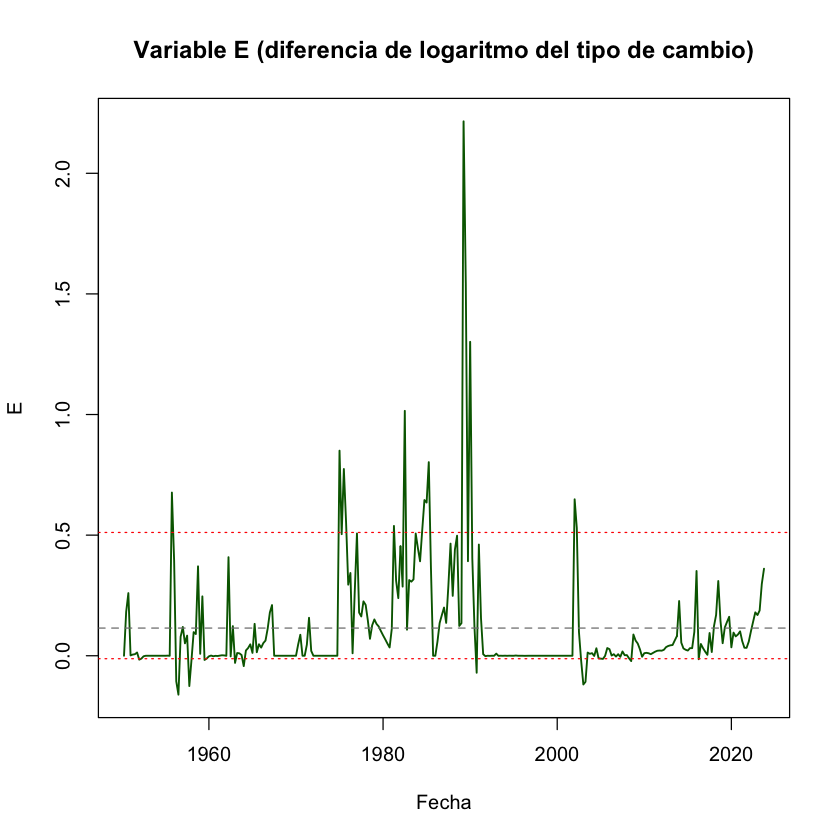

In [17]:
# Armar una fecha aproximada a partir de año + trimestre
trim_to_month <- c("1ºTr" = 1, "2ºTr" = 4, "3ºTr" = 7, "4ºTr" = 10)
fechas <- as.Date(paste(df_ERPT_Arg$año, trim_to_month[df_ERPT_Arg$trimestre], "01", sep = "-"))

plot(fechas, df_ERPT_Arg$E, type = "l", col = "darkgreen", lwd = 1.5,
     main = "Variable E (diferencia de logaritmo del tipo de cambio)",
     xlab = "Fecha", ylab = "E")
abline(h = mean(df_ERPT_Arg$E, na.rm = TRUE), col = "grey50", lty = 2)
abline(h = quantile(df_ERPT_Arg$E, c(0.05, 0.95), na.rm = TRUE), col = "red", lty = 3)

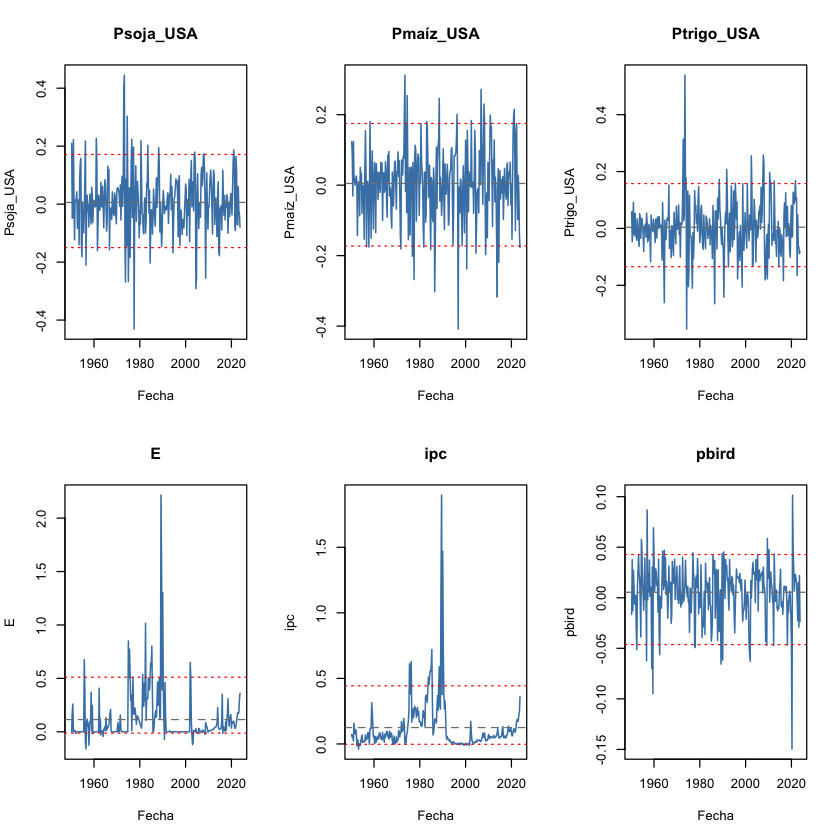

In [18]:
par(mfrow = c(2, 3))
for (v in c("Psoja_USA", "Pmaíz_USA", "Ptrigo_USA", "E", "ipc", "pbird")) {
  serie <- df_ERPT_Arg[[v]]
  plot(fechas, serie, type = "l", col = "steelblue", lwd = 1.2,
       main = v, xlab = "Fecha", ylab = v)
  abline(h = mean(serie, na.rm = TRUE), col = "grey50", lty = 2)
  abline(h = quantile(serie, c(0.05, 0.95), na.rm = TRUE), col = "red", lty = 3)
}
par(mfrow = c(1, 1))

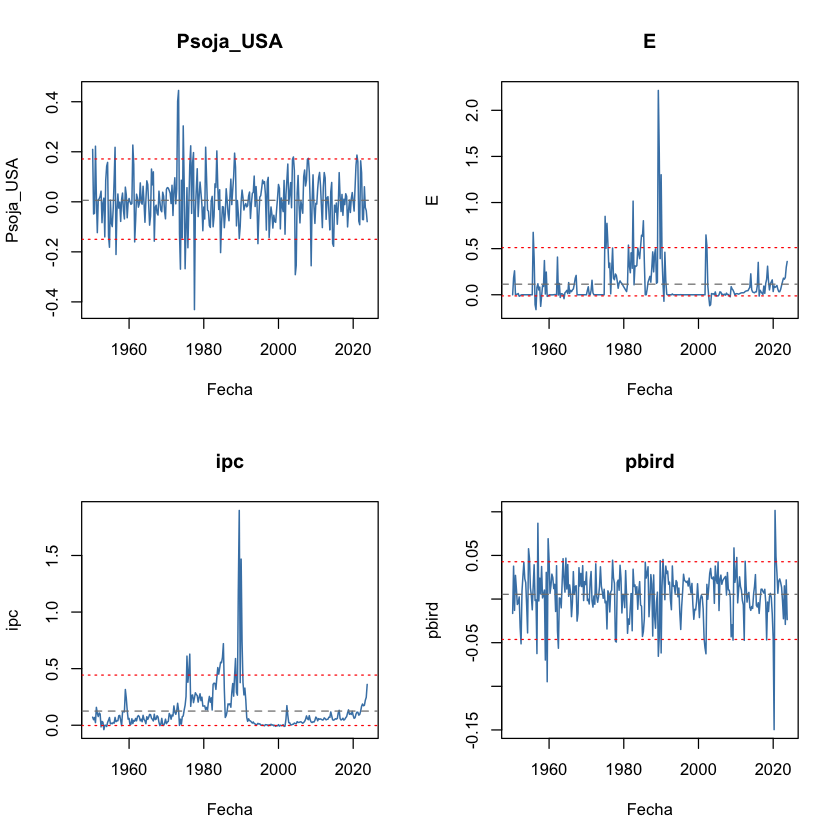

In [19]:
par(mfrow = c(2, 2))
for (v in c("Psoja_USA", "E", "ipc", "pbird")) {
  serie <- df_ERPT_Arg[[v]]
  plot(fechas, serie, type = "l", col = "steelblue", lwd = 1.2,
       main = v, xlab = "Fecha", ylab = v)
  abline(h = mean(serie, na.rm = TRUE), col = "grey50", lty = 2)
  abline(h = quantile(serie, c(0.05, 0.95), na.rm = TRUE), col = "red", lty = 3)
}
par(mfrow = c(1, 1))

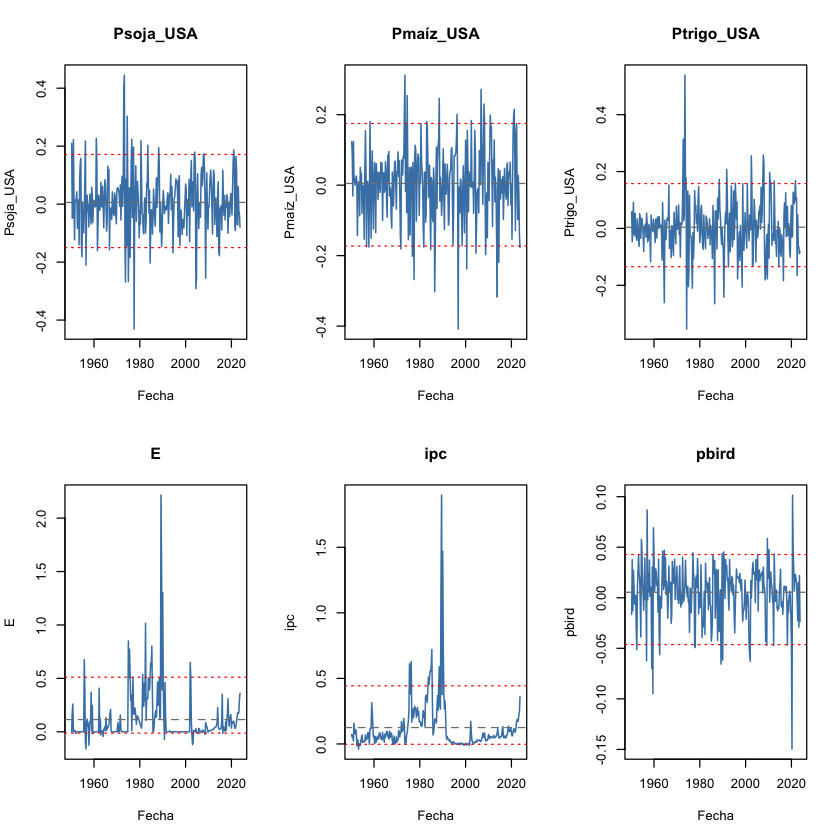

In [20]:
par(mfrow = c(2, 3))
for (v in c("Psoja_USA", "Pmaíz_USA", "Ptrigo_USA", "E", "ipc", "pbird")) {
  serie <- df_ERPT_Arg[[v]]
  plot(fechas, serie, type = "l", col = "steelblue", lwd = 1.2,
       main = v, xlab = "Fecha", ylab = v)
  abline(h = mean(serie, na.rm = TRUE), col = "grey50", lty = 2)
  abline(h = quantile(serie, c(0.05, 0.95), na.rm = TRUE), col = "red", lty = 3)
}
par(mfrow = c(1, 1))

In [21]:
cap_vars <- c("Psoja_USA", "E", "ipc", "pbird")

sds_antes <- sapply(df_ERPT_Arg[, cap_vars], sd, na.rm = TRUE)

df_ERPT_Arg_capped <- df_ERPT_Arg
for (v in cap_vars) {
  lo <- quantile(df_ERPT_Arg[[v]], 0.05, na.rm = TRUE)
  hi <- quantile(df_ERPT_Arg[[v]], 0.95, na.rm = TRUE)
  df_ERPT_Arg_capped[[v]] <- pmin(pmax(df_ERPT_Arg[[v]], lo), hi)
}

sds_despues <- sapply(df_ERPT_Arg_capped[, cap_vars], sd, na.rm = TRUE)

cat("SD antes:\n"); print(sds_antes)
cat("SD después de cappear:\n"); print(sds_despues)
cat("Ratio antes (vs. mínimo):\n"); print(sds_antes / min(sds_antes))
cat("Ratio después (vs. mínimo):\n"); print(sds_despues / min(sds_despues))

SD antes:
 Psoja_USA          E        ipc      pbird 
0.10287460 0.23928824 0.19858620 0.02774553 
SD después de cappear:
 Psoja_USA          E        ipc      pbird 
0.08443089 0.15282085 0.12152850 0.02347437 
Ratio antes (vs. mínimo):
Psoja_USA         E       ipc     pbird 
 3.707789  8.624387  7.157411  1.000000 
Ratio después (vs. mínimo):
Psoja_USA         E       ipc     pbird 
 3.596727  6.510115  5.177072  1.000000 


In [22]:
cap_vars <- c("Psoja_USA", "Pmaíz_USA", "Ptrigo_USA", "E", "ipc", "pbird")

sds_antes <- sapply(df_ERPT_Arg[, cap_vars], sd, na.rm = TRUE)

df_ERPT_Arg_capped <- df_ERPT_Arg
for (v in cap_vars) {
  lo <- quantile(df_ERPT_Arg[[v]], 0.05, na.rm = TRUE)
  hi <- quantile(df_ERPT_Arg[[v]], 0.95, na.rm = TRUE)
  df_ERPT_Arg_capped[[v]] <- pmin(pmax(df_ERPT_Arg[[v]], lo), hi)
}

sds_despues <- sapply(df_ERPT_Arg_capped[, cap_vars], sd, na.rm = TRUE)
cat("SD antes:\n"); print(sds_antes)
cat("SD después de cappear:\n"); print(sds_despues)

SD antes:
 Psoja_USA  Pmaíz_USA Ptrigo_USA          E        ipc      pbird 
0.10287460 0.10158674 0.09474668 0.23928824 0.19858620 0.02774553 
SD después de cappear:
 Psoja_USA  Pmaíz_USA Ptrigo_USA          E        ipc      pbird 
0.08443089 0.08994179 0.07672900 0.15282085 0.12152850 0.02347437 


In [ ]:
fit_generic_sstvar <- function(
  data,
  endog,
  feature_lag,
  n_regimes,
  weight_function,
  thr_var,
  thr_lag,
  filename,
  nrounds,
  seeds = NULL,
  estim_method = "two-phase"
) {
  Y <- data[, endog]

  # --- Escalado por desvío estándar (sobre los datos ya cappeados) ---
  Y_sd <- sapply(Y, sd, na.rm = TRUE)
  Y <- sweep(Y, 2, Y_sd, FUN = "/")
  cat("Desvíos usados para escalar:\n")
  print(Y_sd)
  # --------------------------------------------------------------------

  seeds <- if (is.null(seeds)) 1:nrounds else seeds
  estim_method <- if (is.null(estim_method)) "two-phase" else estim_method
  thr_params <- c(which(colnames(Y) == thr_var), thr_lag)

  tvar_model <- fitSTVAR(
    data = Y,
    p = feature_lag,
    M = n_regimes,
    weight_function = weight_function, # threshold
    weightfun_pars = thr_params,
    nrounds = nrounds,
    seeds = seeds,
    estim_method = estim_method,
    ncores = 6
  )


  cat("========= Unstructured fitted model ==========\n")
  summary(tvar_model)

  fit_struct <- fitSSTVAR(
    stvar = tvar_model,
    identification = "heteroskedasticity"
  )


  cat("========= Structured fitted model (heteroskedasticity) ==========\n")
  summary(fit_struct)

  tryCatch(
    {
      cat("Saving trained models to models/ folder\n")
      saveRDS(tvar_model, paste0("models/", filename))
      saveRDS(fit_struct, paste0("models/", "structured", "_", filename))
    },
    error = function(e) {
      cat("!!! No se pudo guardar modelos pre-estimados. GUARDAR MANUALMENTE corriendo save_trained_models(models, models/", filename, "). Error: ", e$message, "\n")
      return(NULL)
    }
  )
  return(list(tvar_model = tvar_model, fit_struct = fit_struct, scaling_sd = Y_sd))
}

## Ejemplo TVAR (threshold)

### SOJA

In [ ]:
res <- run_threshold_tvar(
  data = df_ERPT_Arg_capped,
  endog = c("Psoja_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual' o mensual
  feature_lag = 2,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Psoja_USA","ipc","pbird")
  run_tests = TRUE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [14]:
print_passthrough(res, endog = c("Psoja_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1324
1         1      -0.1203
2         2      -0.0573
3         3       0.0097
4         4       0.0691
5         5       0.1240
6         6       0.1748
7         7       0.2222
8         8       0.2656

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.1324
2         1      -0.1111
3         2      -0.0436
4         3       0.0241
5         4       0.0798
6         5       0.1245
7         6       0.1612
8         7       0.1908
9         8       0.2139

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1324
1         1       0.0133
2         2       0.2138
3         3       0.3800
4         4       0.5226
5         5       0.6539
6         6       0.7786
7         7       0.8933
8         8       0.9965

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF


+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Psoja_USA: 
   2.5%   10%  mean   90% 97.5%
0  5.45  5.45  5.45  5.45  5.45
1  0.21  0.41  0.54  0.60  0.70
2 -1.43 -1.34 -1.27 -1.23 -1.18
3 -0.34 -0.25 -0.19 -0.12 -0.04
4  0.23  0.29  0.36  0.47  0.53
5  0.02  0.04  0.11  0.19  0.24
6 -0.17 -0.15 -0.09 -0.03  0.04
7 -0.13 -0.10 -0.05  0.01  0.04
8 -0.06 -0.03  0.02  0.08  0.11

The response of E: 
   2.5%   10%  mean   90% 97.5%
0 -7.55 -7.55 -7.55 -7.55 -7.55
1 -3.71 -3.69 -3.48 -3.02 -2.51
2 -0.94 -0.85 -0.73 -0.53 -0.12
3 -0.54 -0.31 -0.12  0.01  0.37
4 -0.62 -0.47 -0.26 -0.12  0.17
5 -0.69 -0.57 -0.34 -0.19  0.08
6 -0.63 -0.54 -0.30 -0.13  0.04
7 -0.57 -0.46 -0.25 -0.07  0.08
8 -0.56 -0.48 -0.23 -0.04  0.09

The response of ipc: 
   2.5%   10%  mean   90% 97.5%
0  1.00  1.00  1.00  1.00  1.00
1  0.62  0.82  0.90  1.07  1.34
2 -0.14  0.22  0.40  0.70  1.31
3 -0.89 -0.44 -0.12  0.26  1.30
4 -1.61 -1.10 -0.59 -0

Desvíos usados para escalar:
 Psoja_USA          E        ipc      pbird 
0.08443089 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1258.669

The largest loglik: -1119.267

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1214.561

The largest loglik: -1044.421

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> TESTS
PARA CORRER LOS TESTS CORRER LA SIGUIENTE FUNCION:
run_tests_sstvar(res, c(' ipc '), TRUE , NULL , 1 , 500 )

 >>> DIAGNOSTIC PLOTS


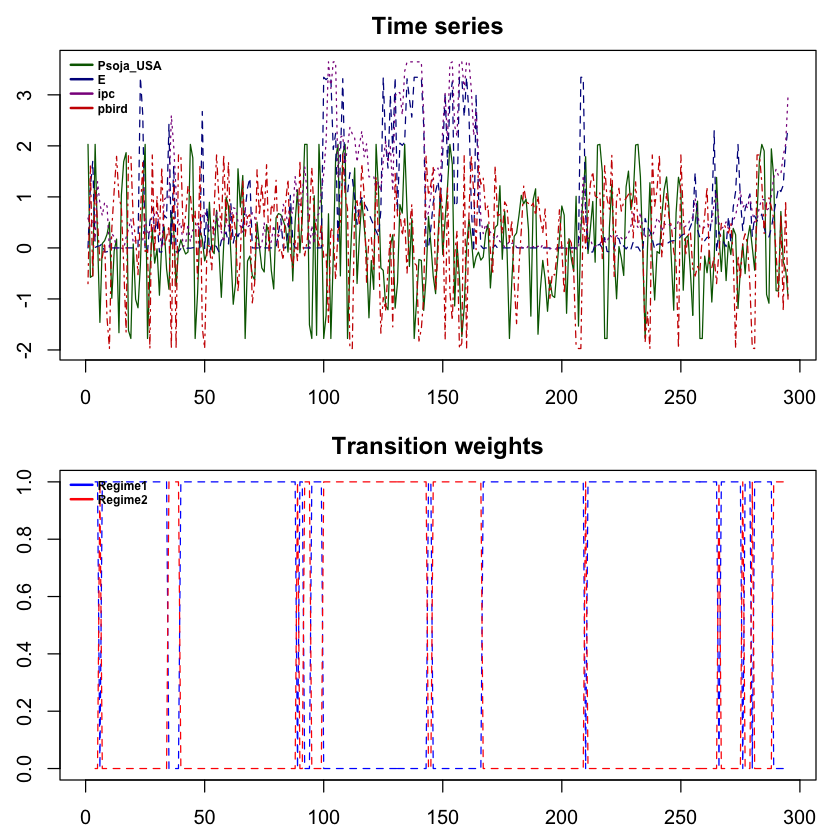

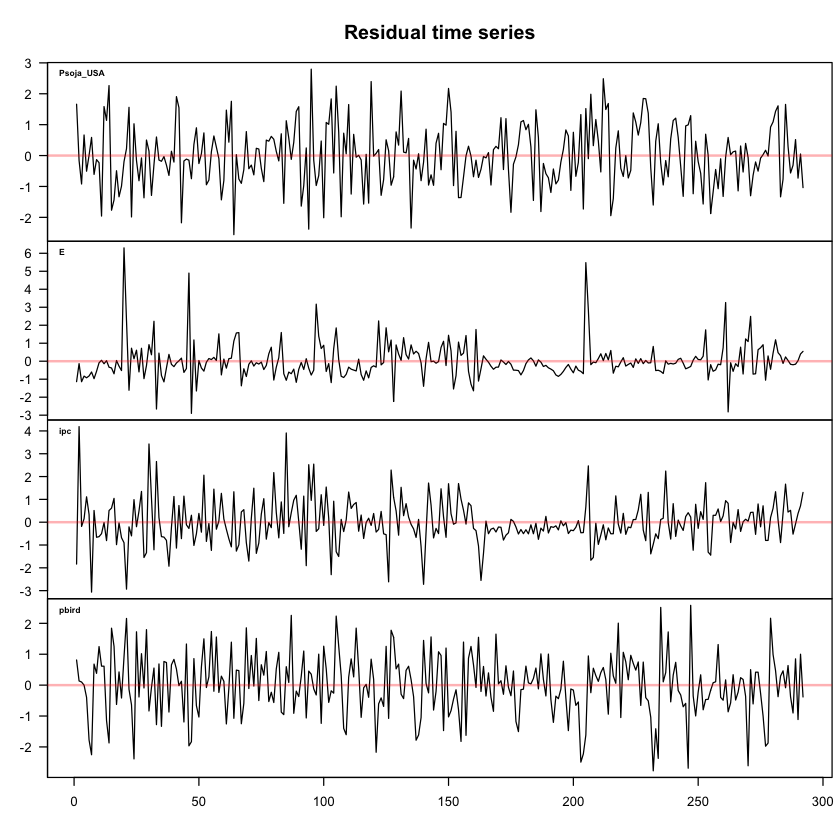

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



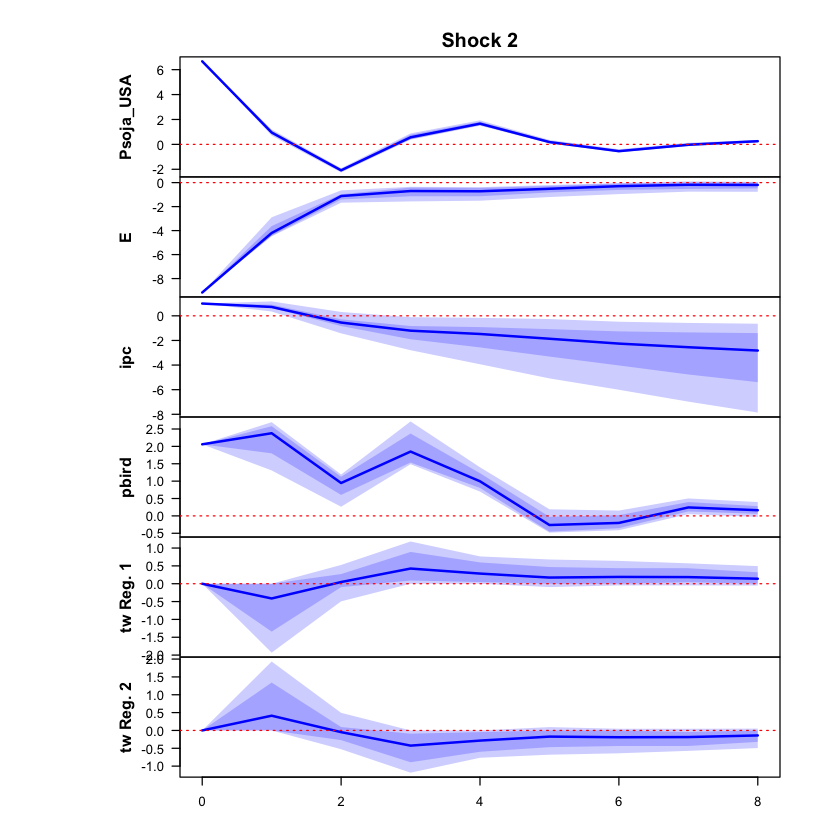

 >>> Linear IRF ( 1  shock units)


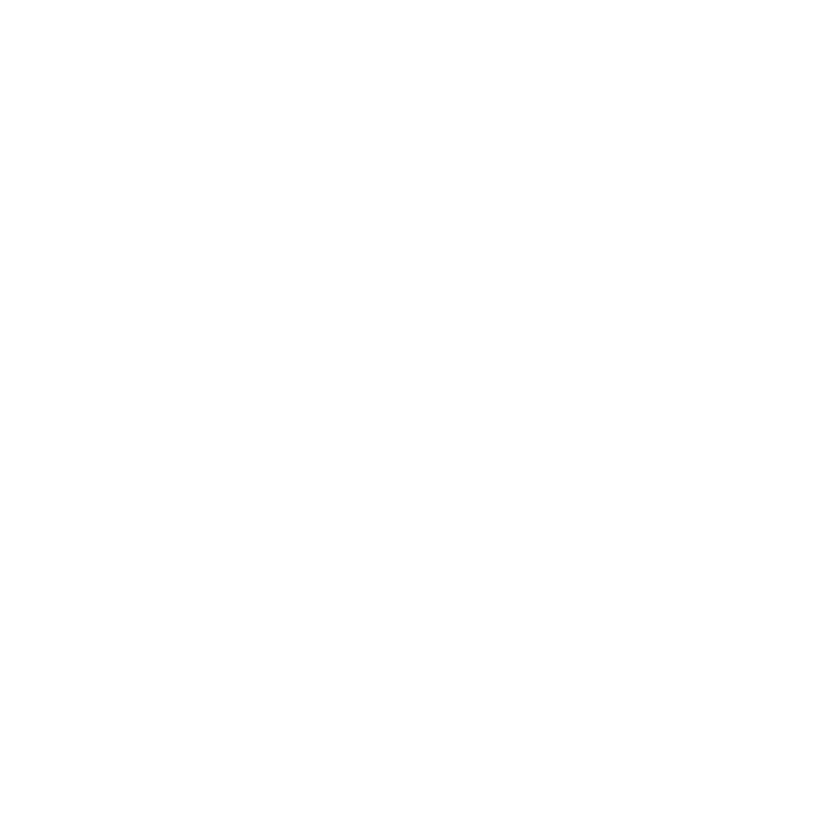

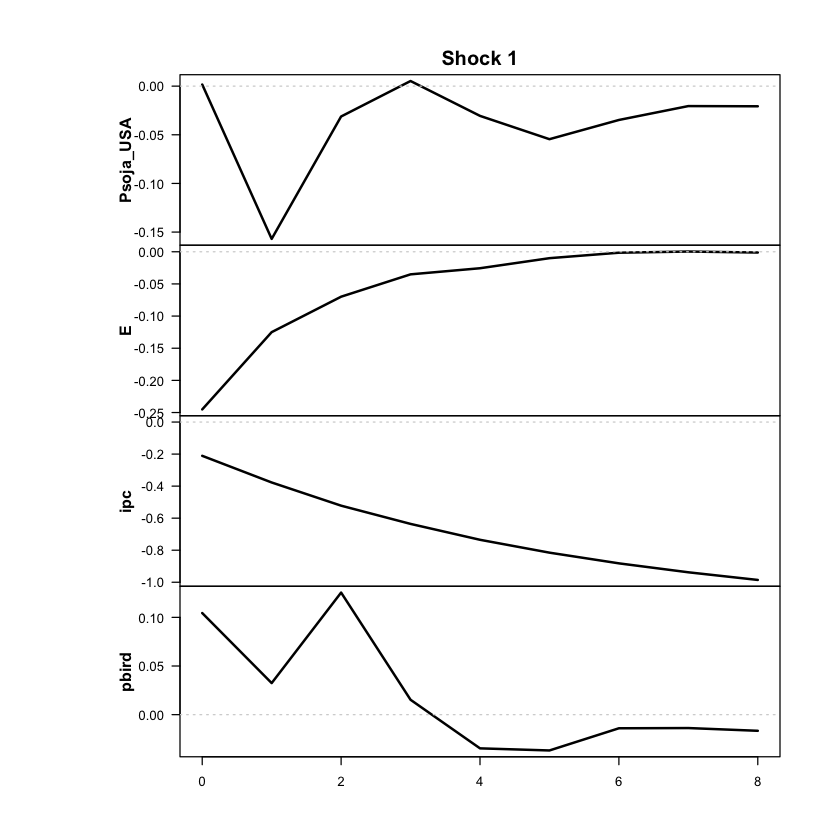

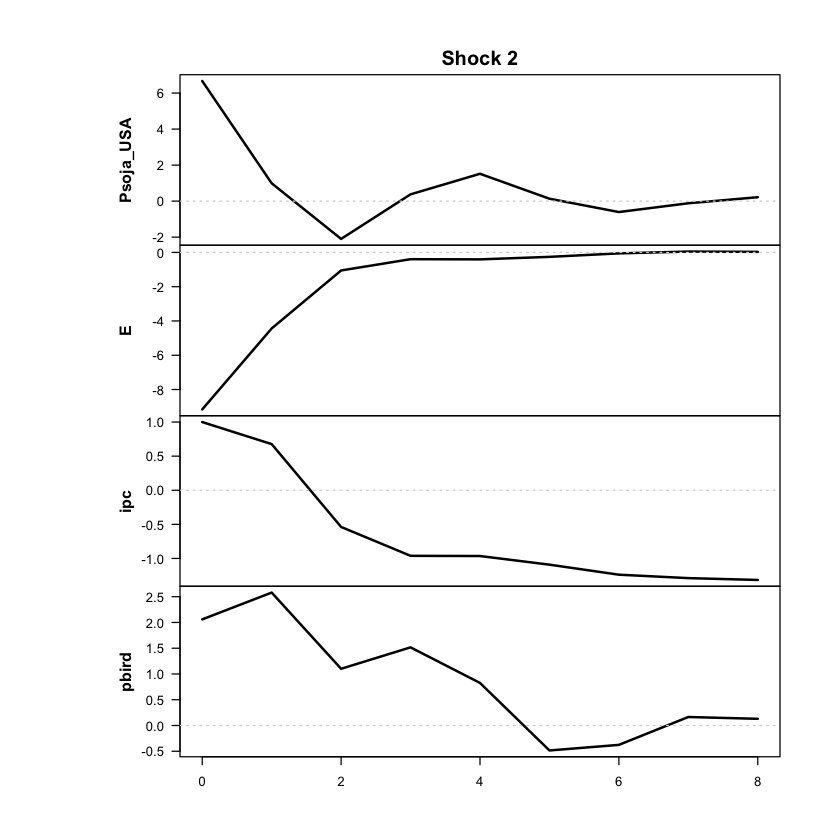

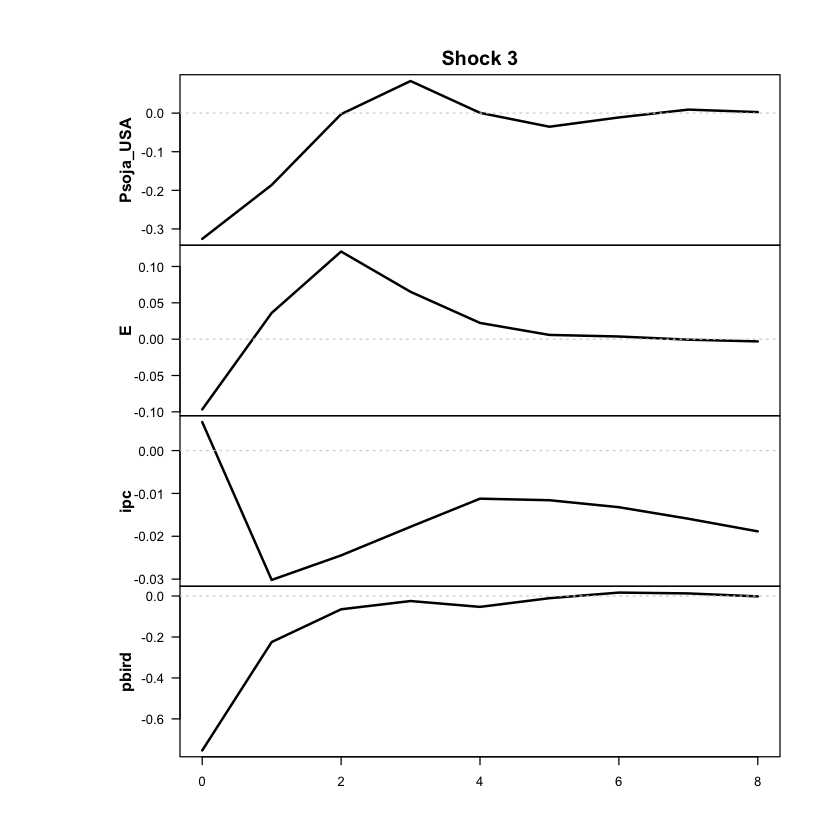

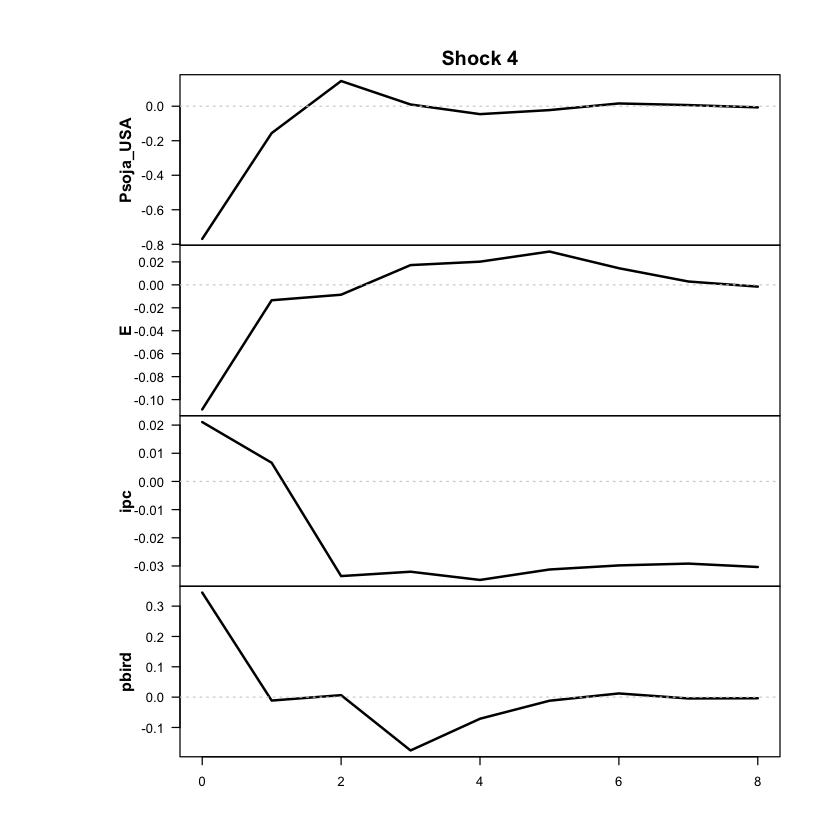

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



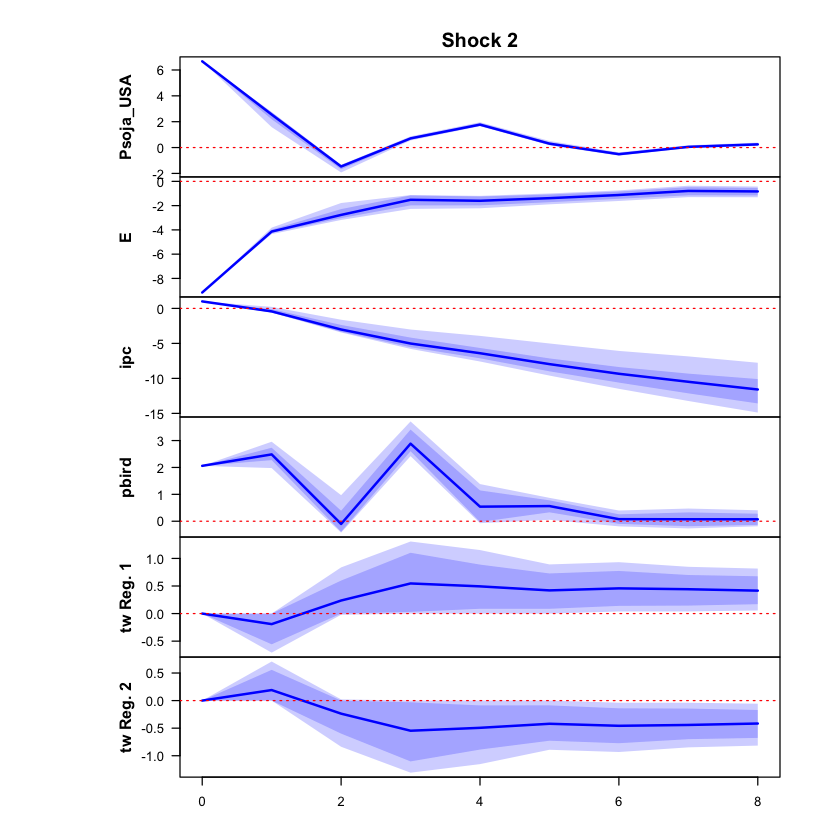

 >>> Linear IRF ( 1  shock units)


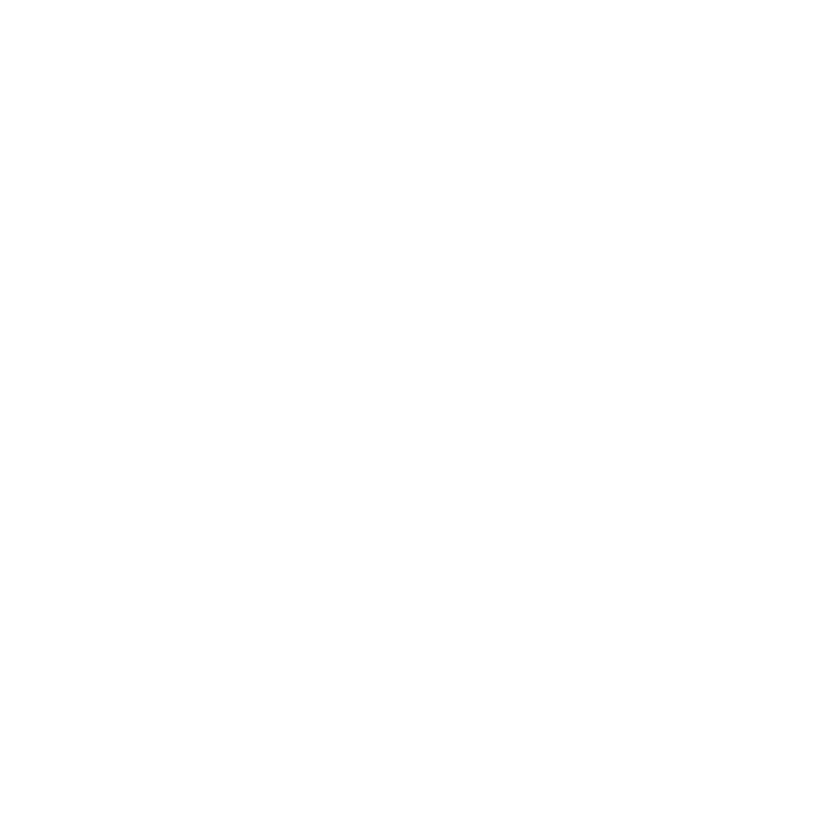

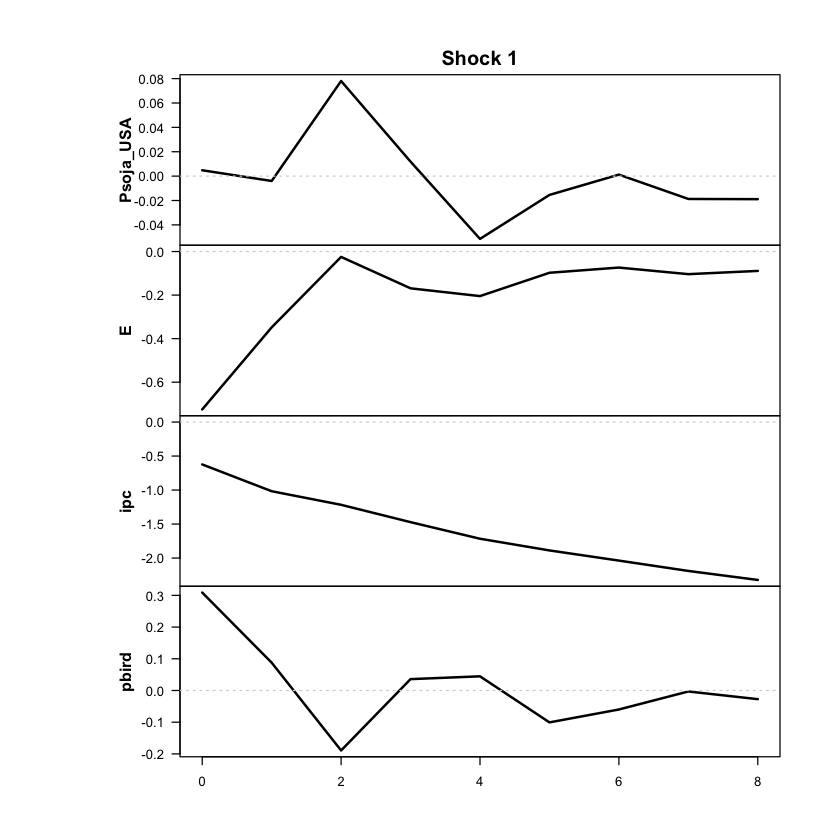

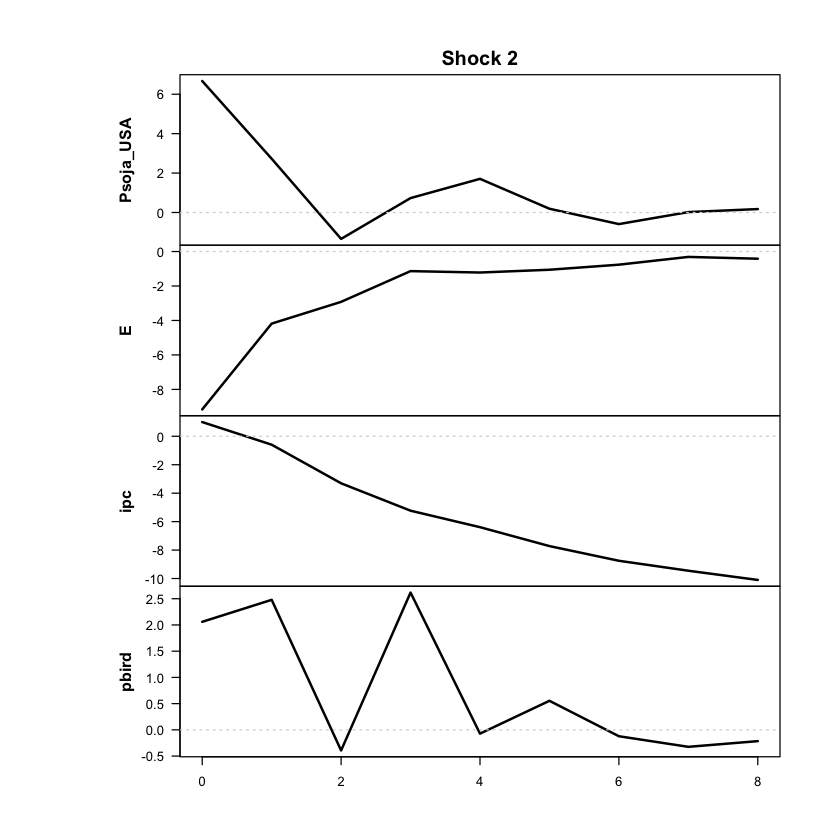

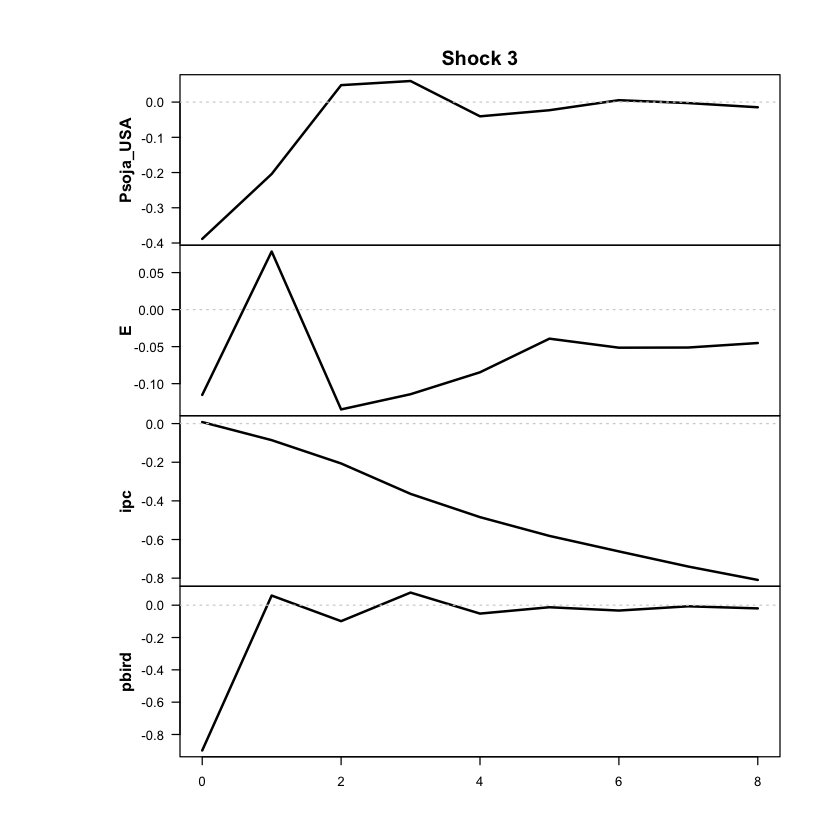

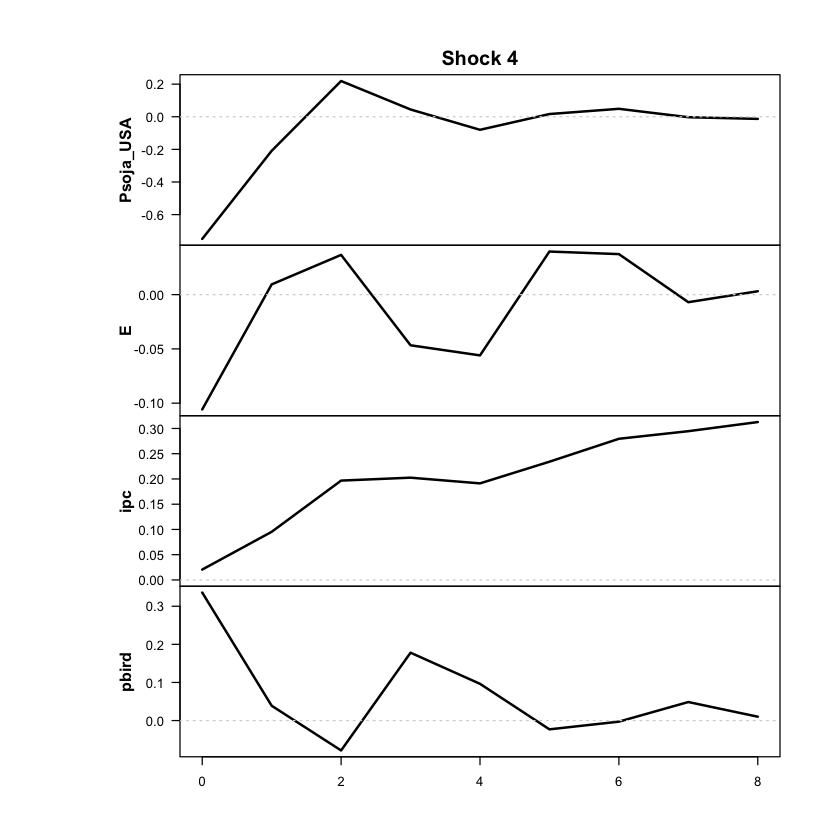

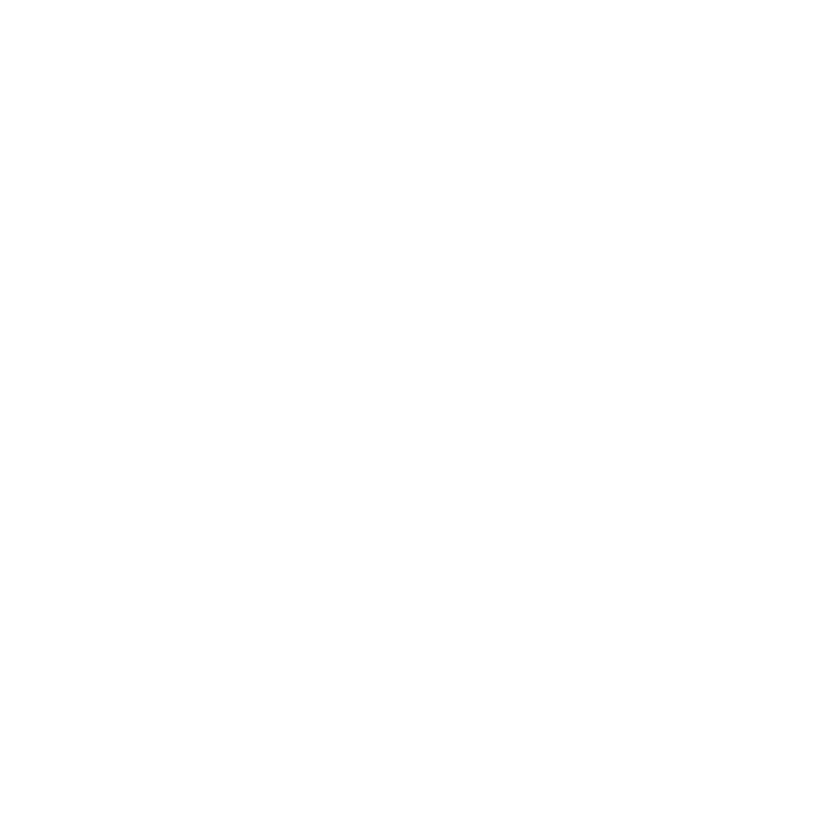

In [17]:
res <- run_threshold_tvar(
  data = df_ERPT_Arg_capped,
  endog = c("Psoja_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual' o mensual
  feature_lag = 3,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Psoja_USA","ipc","pbird")
  run_tests = TRUE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [18]:
print_passthrough(res, endog = c("Psoja_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1091
1         1      -0.0786
2         2       0.0596
3         3       0.1316
4         4       0.1609
5         5       0.2031
6         6       0.2462
7         7       0.2783
8         8       0.3078

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.1091
2         1      -0.0739
3         2       0.0587
4         3       0.1050
5         4       0.1053
6         5       0.1191
7         6       0.1352
8         7       0.1406
9         8       0.1436

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1091
1         1       0.0466
2         2       0.3290
3         3       0.5477
4         4       0.6988
5         5       0.8689
6         6       1.0194
7         7       1.1445
8         8       1.2646

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Psoja_USA: 
   2.5%   10%  mean   90% 97.5%
0  6.67  6.67  6.67  6.67  6.67
1  0.70  0.84  0.95  1.03  1.26
2 -2.26 -2.17 -2.09 -2.00 -1.94
3  0.38  0.39  0.56  0.78  0.88
4  1.51  1.53  1.67  1.83  1.89
5  0.10  0.13  0.20  0.28  0.36
6 -0.66 -0.62 -0.54 -0.46 -0.37
7 -0.14 -0.11 -0.03  0.06  0.12
8  0.18  0.21  0.26  0.33  0.41

The response of E: 
   2.5%   10%  mean   90% 97.5%
0 -9.16 -9.16 -9.16 -9.16 -9.16
1 -4.46 -4.44 -4.18 -3.65 -3.00
2 -1.58 -1.37 -1.11 -0.87 -0.55
3 -1.33 -1.09 -0.69 -0.40 -0.37
4 -1.43 -1.07 -0.71 -0.41 -0.28
5 -1.15 -0.82 -0.51 -0.27 -0.14
6 -0.80 -0.62 -0.30 -0.06  0.02
7 -0.72 -0.45 -0.18  0.05  0.14
8 -0.72 -0.44 -0.18  0.03  0.16

The response of ipc: 
   2.5%   10%  mean   90% 97.5%
0  1.00  1.00  1.00  1.00  1.00
1  0.54  0.67  0.76  0.94  1.36
2 -1.07 -0.73 -0.48 -0.11  0.56
3 -2.23 -1.63 -1.12 -0.74  0.19
4 -3.1

### MAÍZ

Desvíos usados para escalar:
 Pmaíz_USA          E        ipc      pbird 
0.08994179 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1268.515

The largest loglik: -1111.995

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1222.192

The largest loglik: -1076.324

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> TESTS
PARA CORRER LOS TESTS CORRER LA SIGUIENTE FUNCION:
run_tests_sstvar(res, c(' ipc '), TRUE , NULL , 1 , 500 )

 >>> DIAGNOSTIC PLOTS


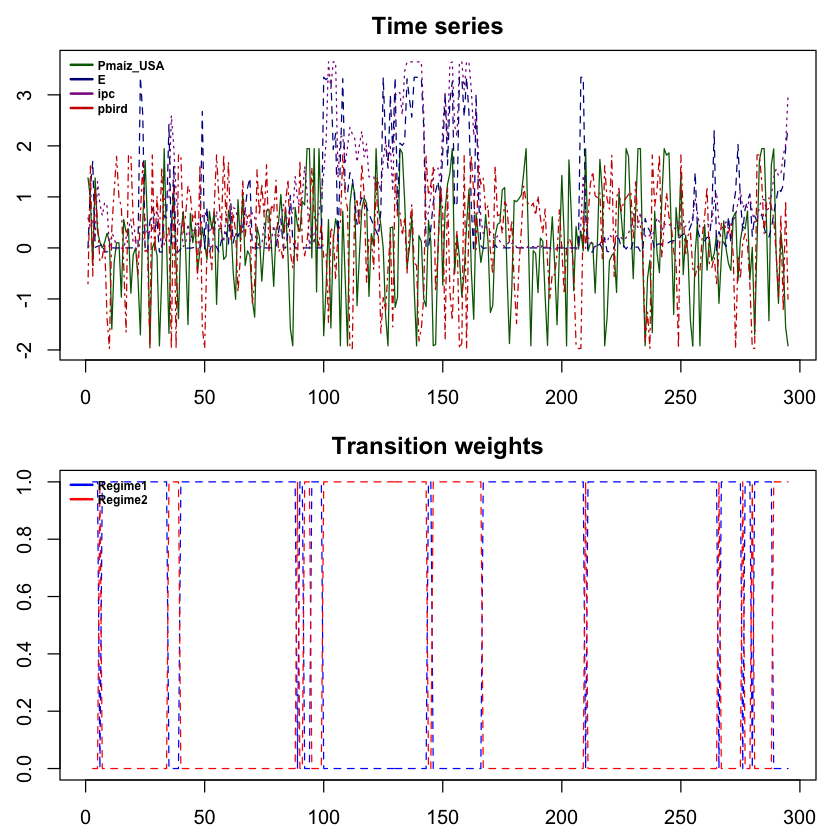

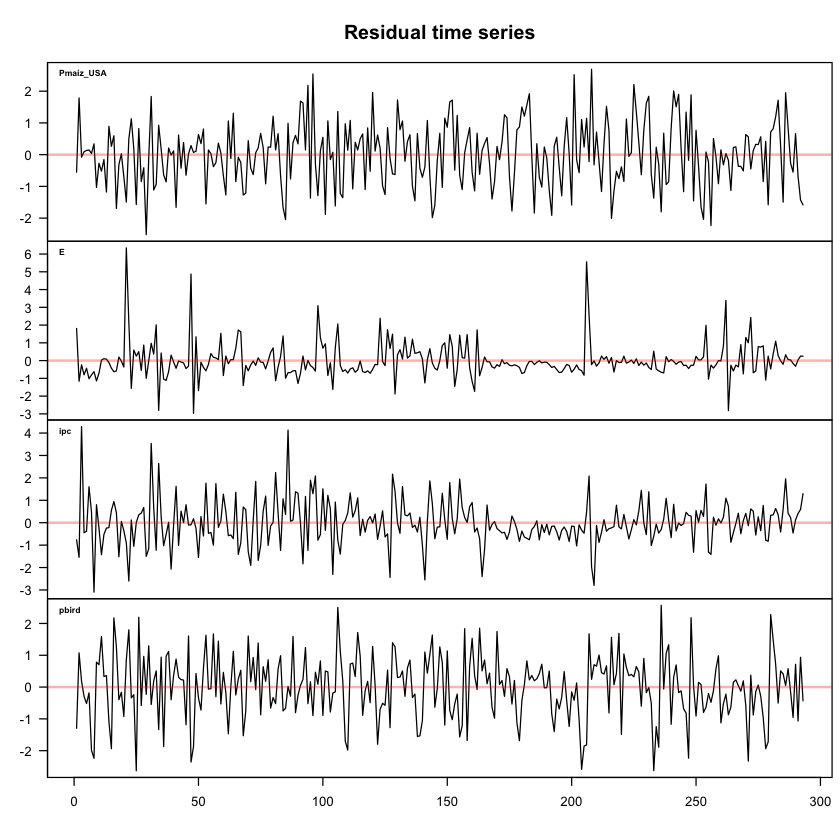

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



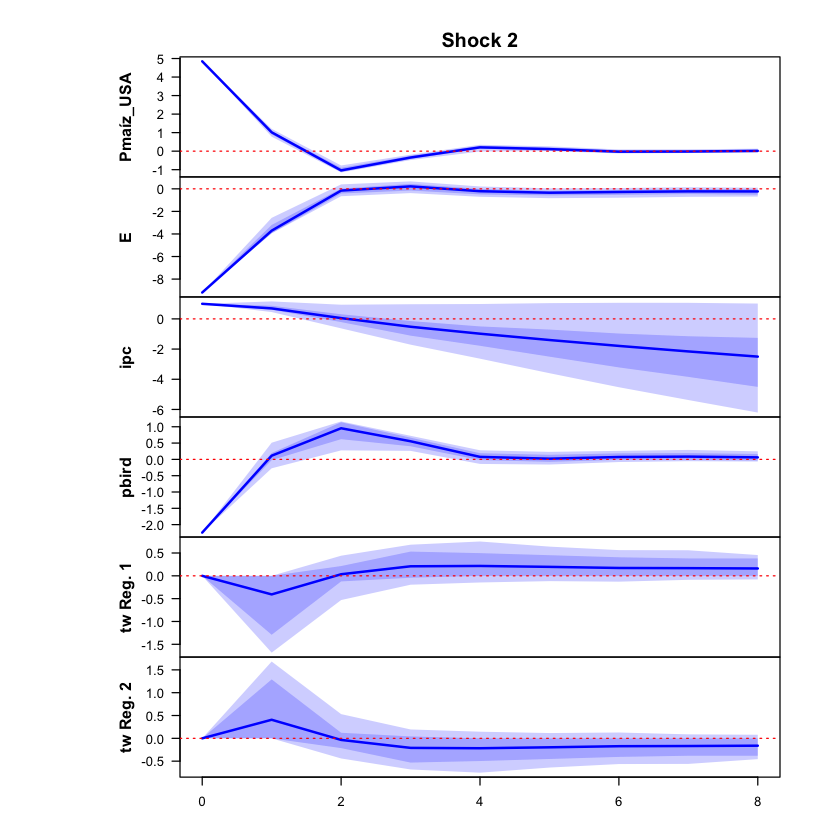

 >>> Linear IRF ( 1  shock units)


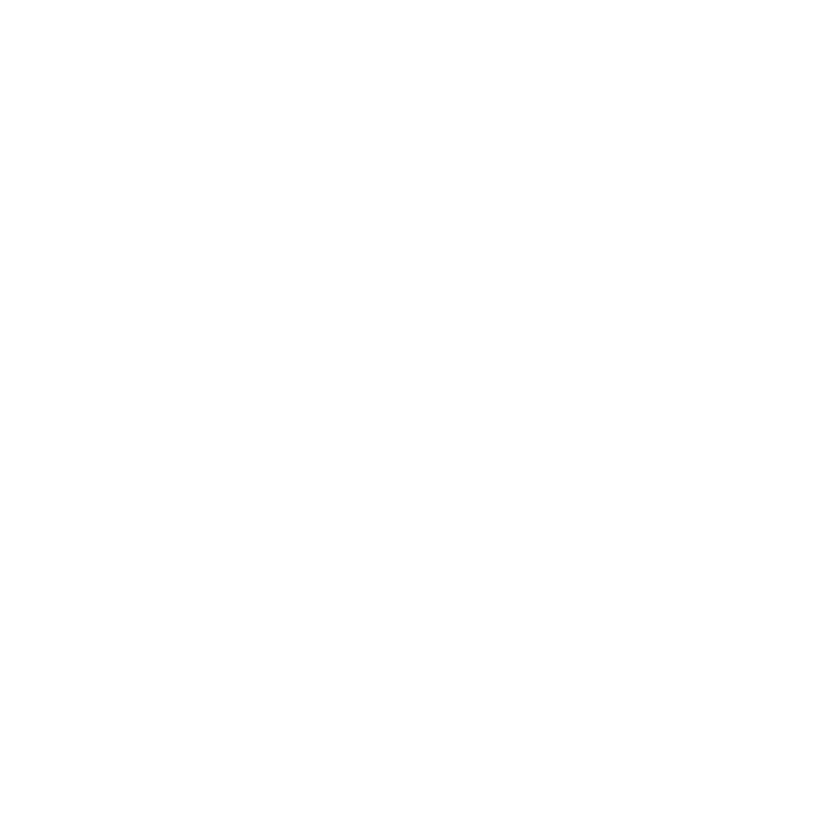

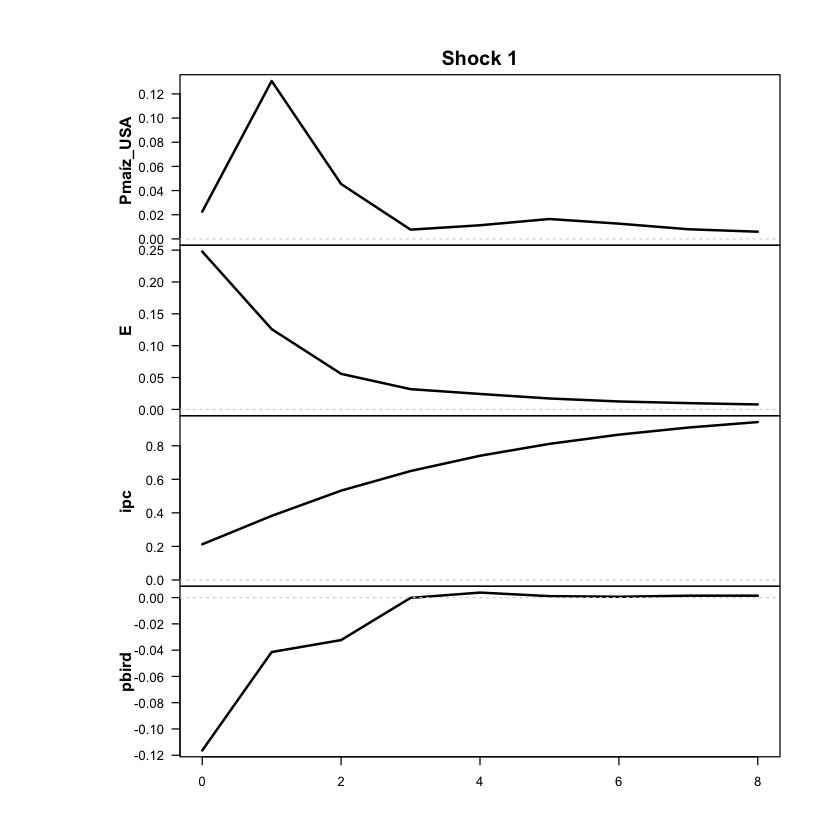

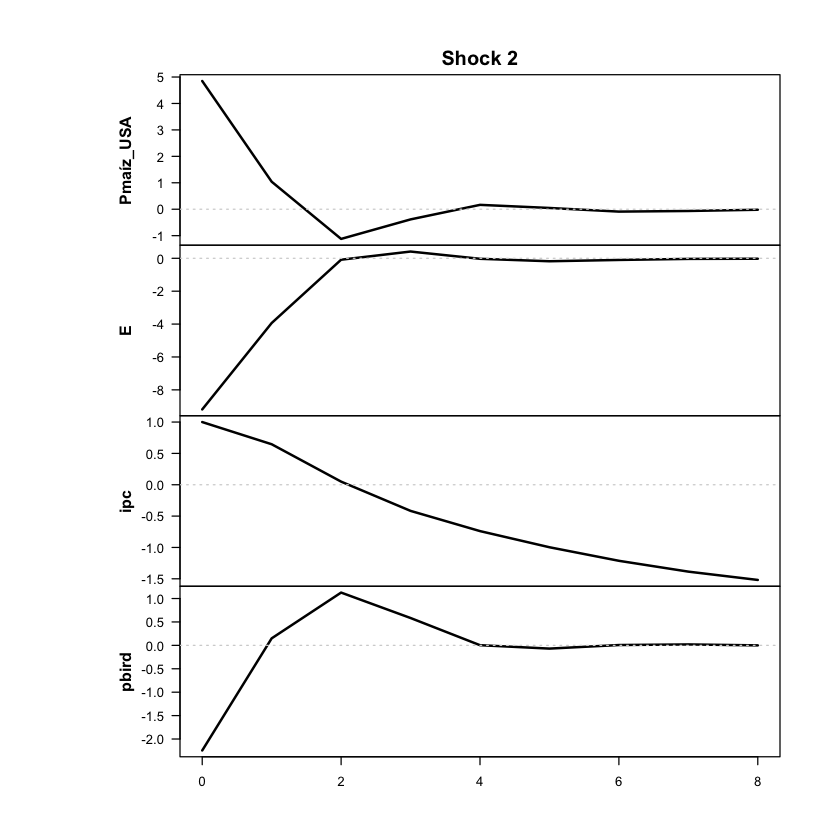

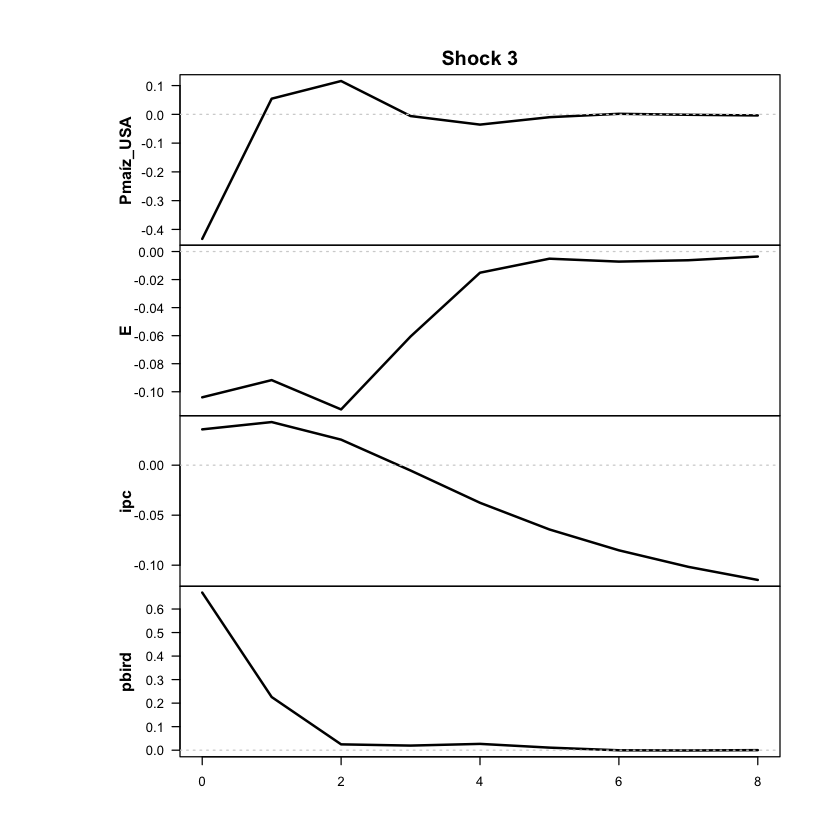

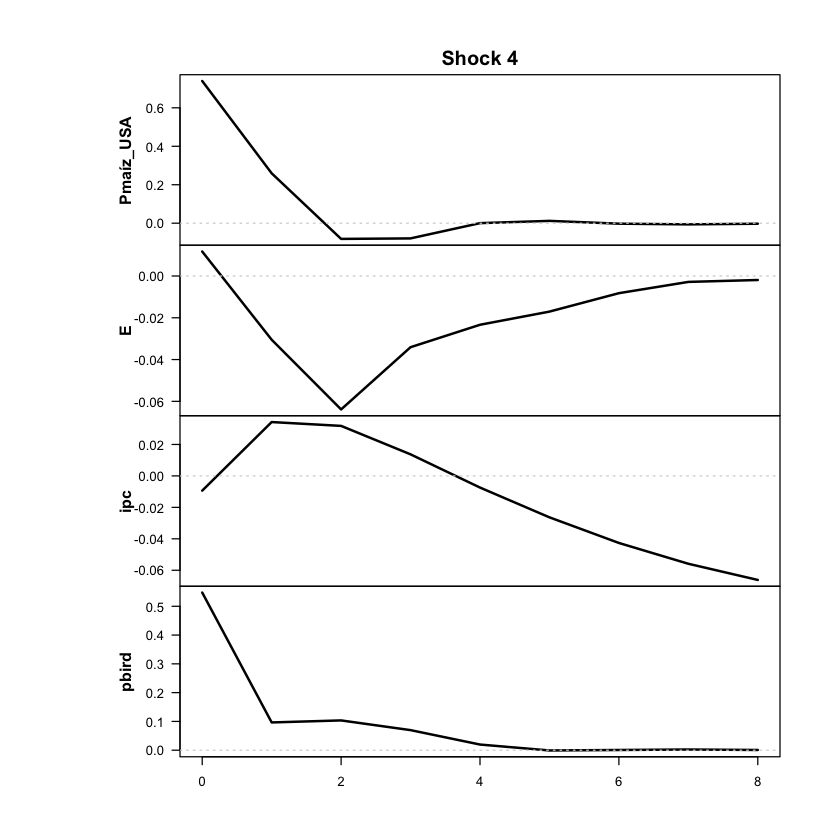

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



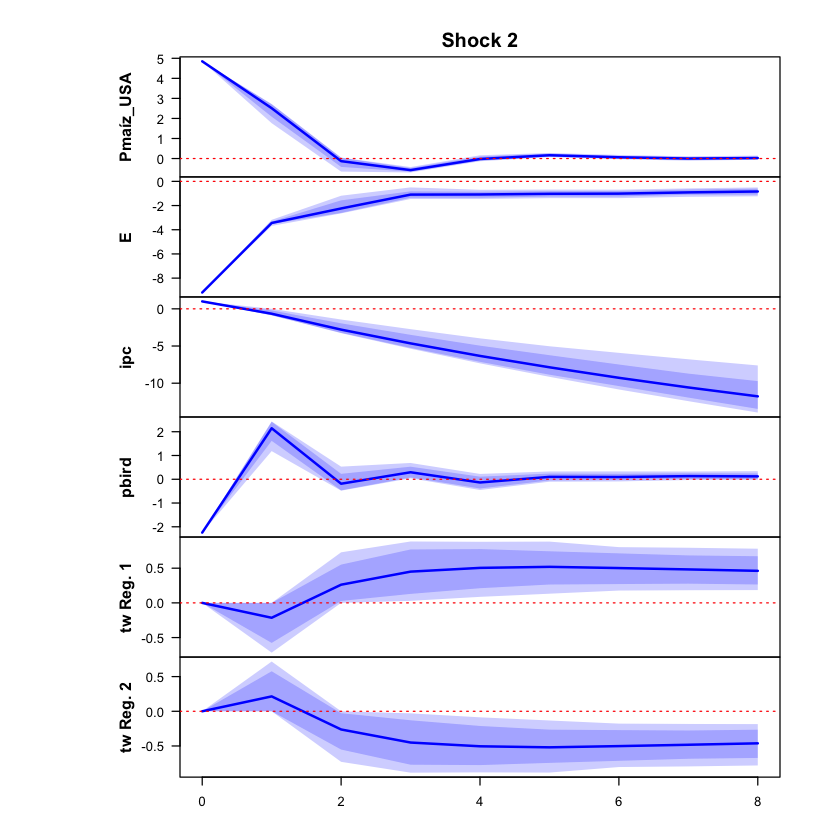

 >>> Linear IRF ( 1  shock units)


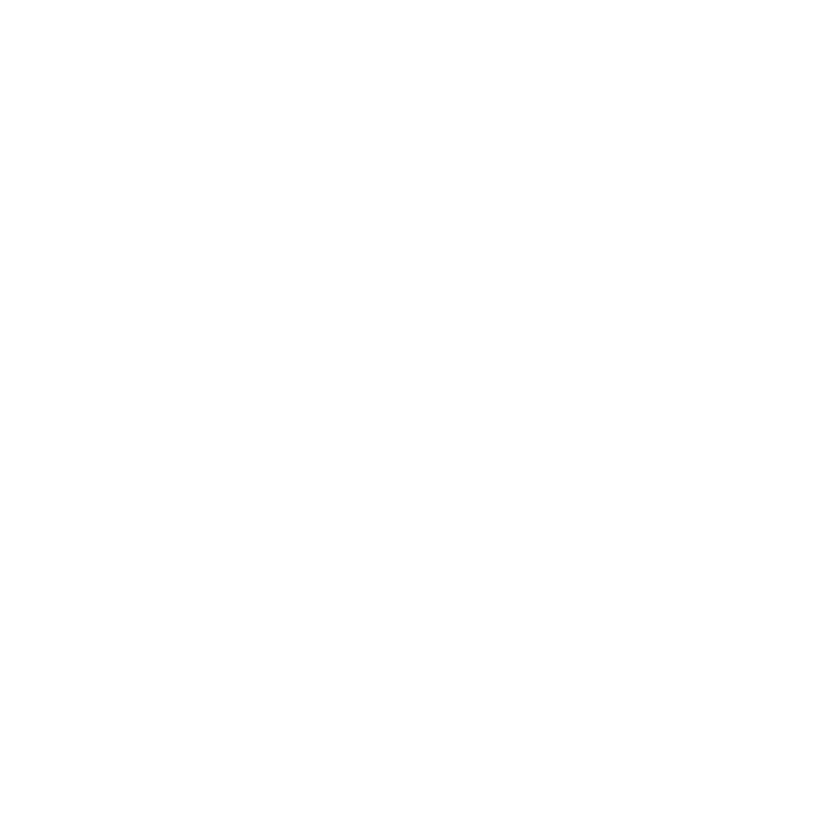

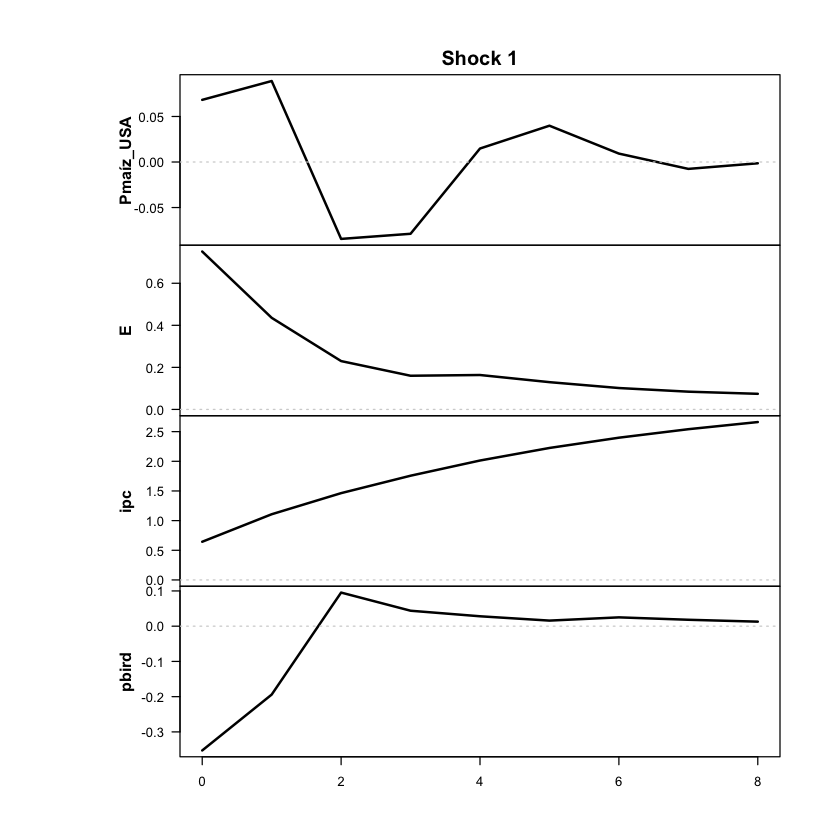

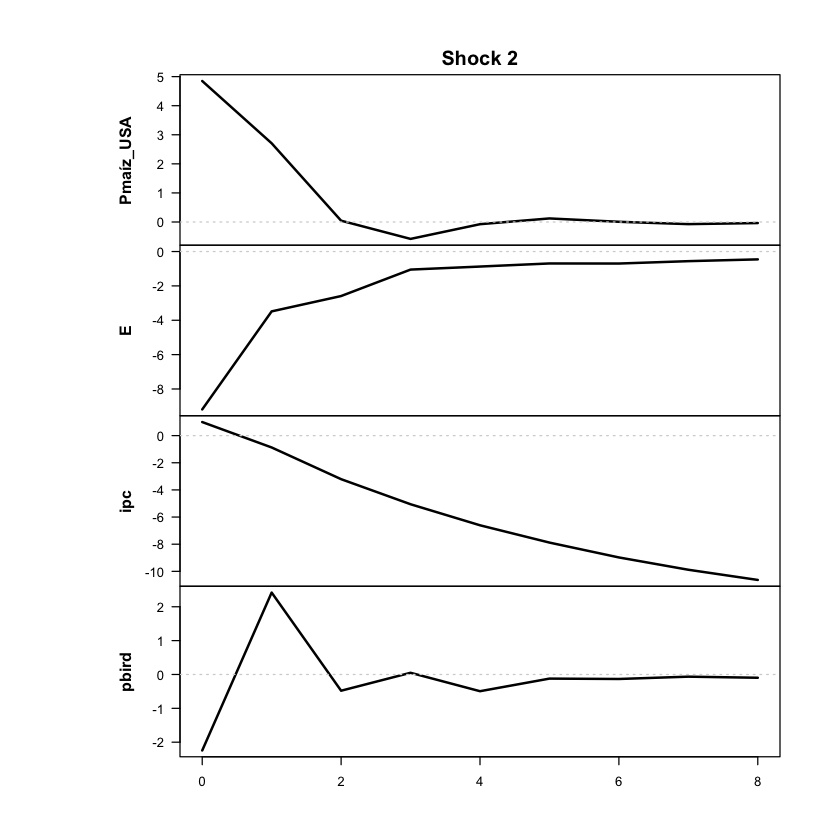

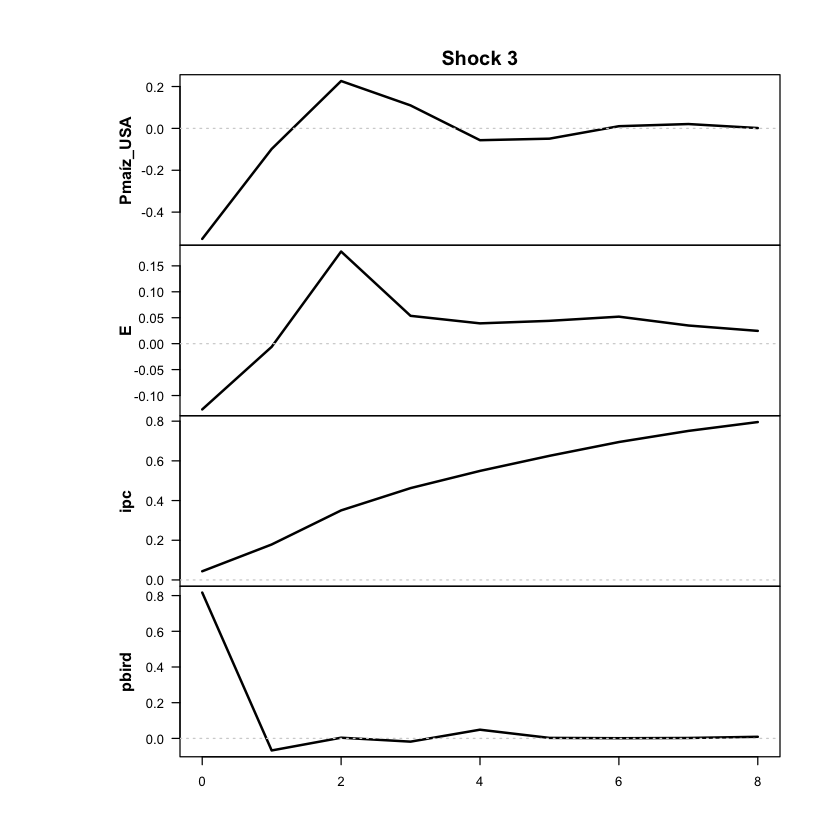

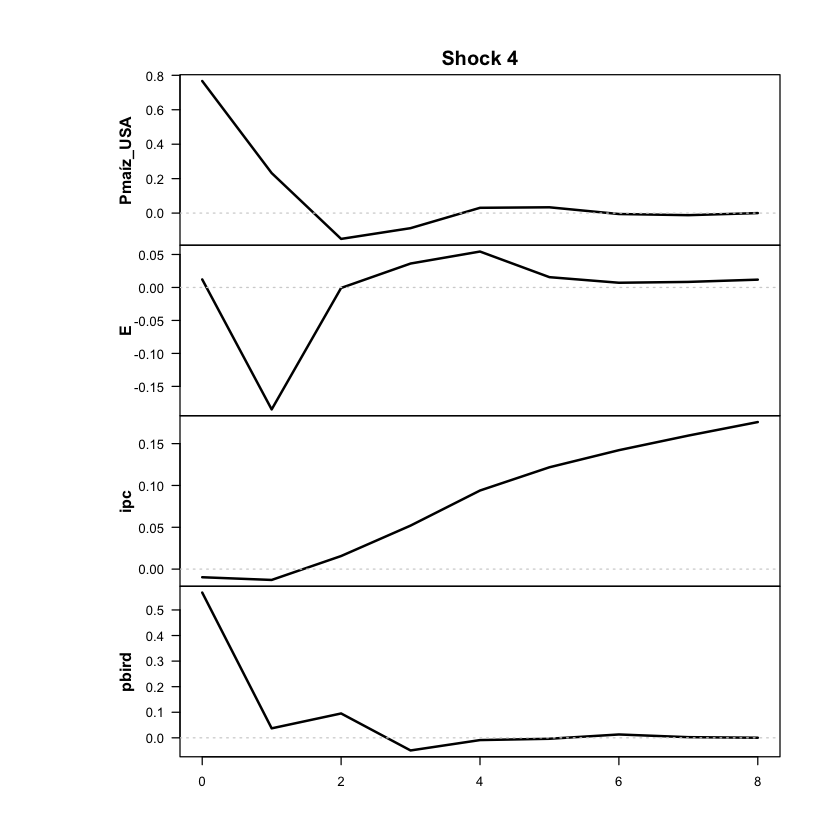

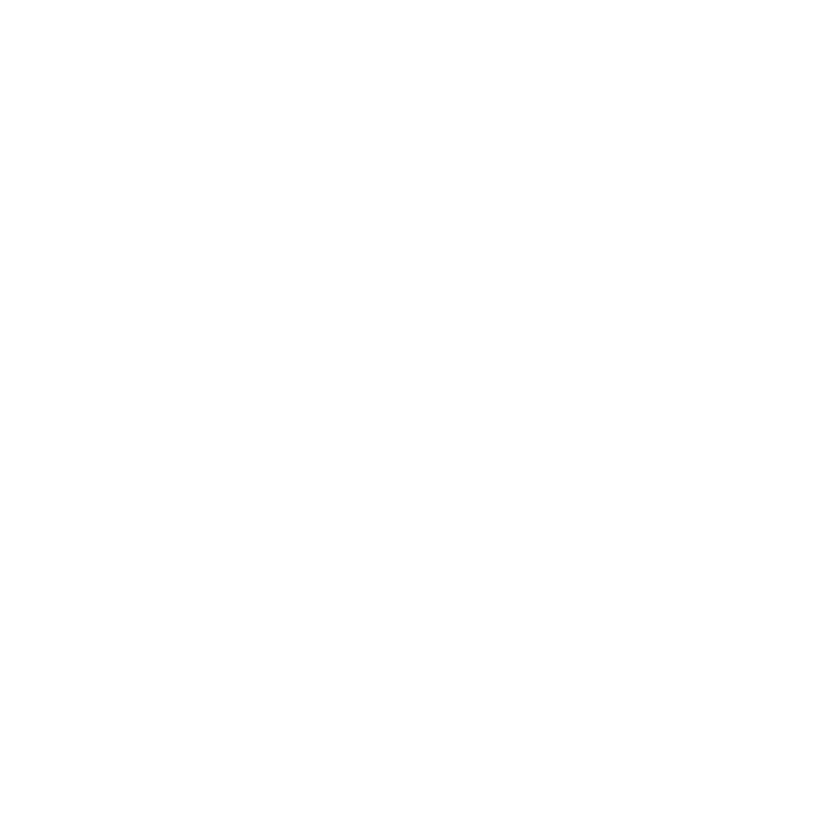

In [11]:
res <- run_threshold_tvar(
  data = df_ERPT_Arg_capped,
  endog = c("Pmaíz_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual' o mensual
  feature_lag = 2,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Pmaíz_USA","ipc","pbird")
  run_tests = TRUE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [12]:
print_passthrough(res, endog = c("Pmaíz_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1088
1         1      -0.0756
2         2      -0.0057
3         3       0.0566
4         4       0.1068
5         5       0.1523
6         6       0.1948
7         7       0.2346
8         8       0.2720

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.1088
2         1      -0.0703
3         2      -0.0054
4         3       0.0454
5         4       0.0804
6         5       0.1085
7         6       0.1320
8         7       0.1508
9         8       0.1652

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1088
1         1       0.0714
2         2       0.3040
3         3       0.5054
4         4       0.6890
5         5       0.8552
6         6       1.0092
7         7       1.1503
8         8       1.2806

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Pmaíz_USA: 
   2.5%   10%  mean   90% 97.5%
0 -0.24 -0.24 -0.24 -0.24 -0.24
1 -0.17 -0.16 -0.12 -0.07  0.02
2  0.08  0.11  0.17  0.20  0.21
3 -0.06 -0.01  0.04  0.07  0.08
4 -0.07 -0.04 -0.01  0.01  0.03
5 -0.04 -0.03  0.00  0.02  0.03
6 -0.04 -0.02  0.00  0.02  0.03
7 -0.04 -0.03  0.00  0.01  0.03
8 -0.03 -0.02  0.00  0.01  0.02

The response of E: 
   2.5%   10%  mean   90% 97.5%
0 -3.29 -3.29 -3.29 -3.29 -3.29
1 -1.00 -0.95 -0.43  0.40  1.04
2 -0.06  0.03  0.32  0.77  1.13
3 -0.19 -0.06  0.18  0.48  0.69
4 -0.23 -0.13  0.09  0.38  0.59
5 -0.20 -0.12  0.09  0.34  0.54
6 -0.18 -0.09  0.08  0.28  0.46
7 -0.17 -0.10  0.07  0.26  0.47
8 -0.17 -0.08  0.06  0.21  0.36

The response of ipc: 
   2.5%  10% mean  90% 97.5%
0  1.00 1.00 1.00 1.00  1.00
1  0.80 0.83 1.11 1.51  1.86
2  0.62 0.71 1.28 2.09  2.94
3  0.51 0.64 1.45 2.56  3.69
4  0.39 0.59 1.57 2.8

Desvíos usados para escalar:
 Pmaíz_USA          E        ipc      pbird 
0.08994179 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1635.324

The largest loglik: -1122.941

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1217.166

The largest loglik: -992.415

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> TESTS
PARA CORRER LOS TESTS CORRER LA SIGUIENTE FUNCION:
run_tests_sstvar(res, c(' ipc '), TRUE , NULL , 1 , 500 )

 >>> DIAGNOSTIC PLOTS


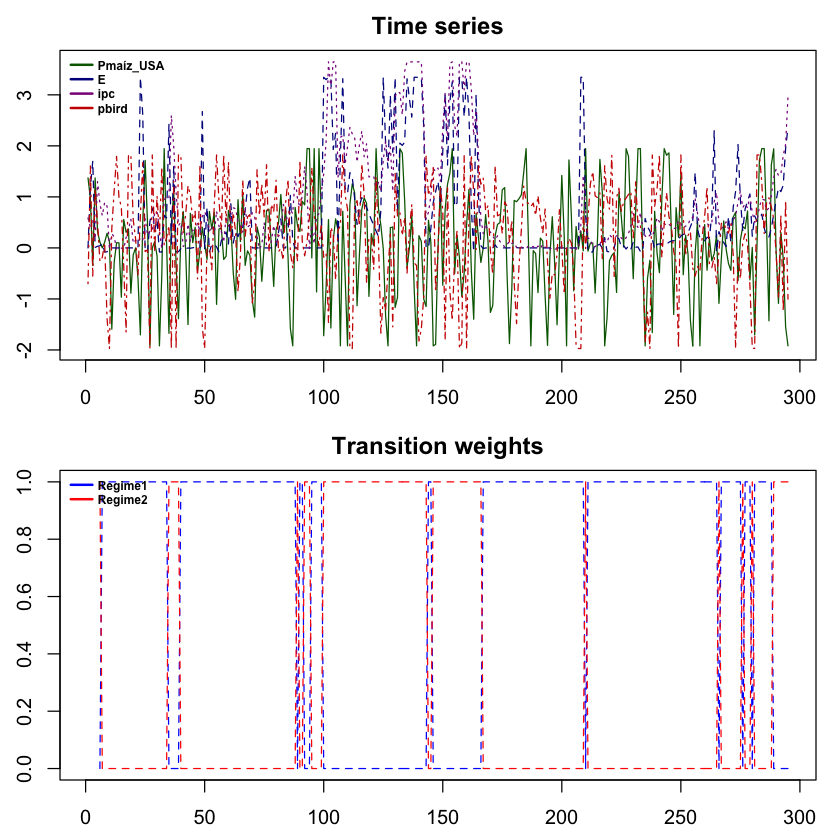

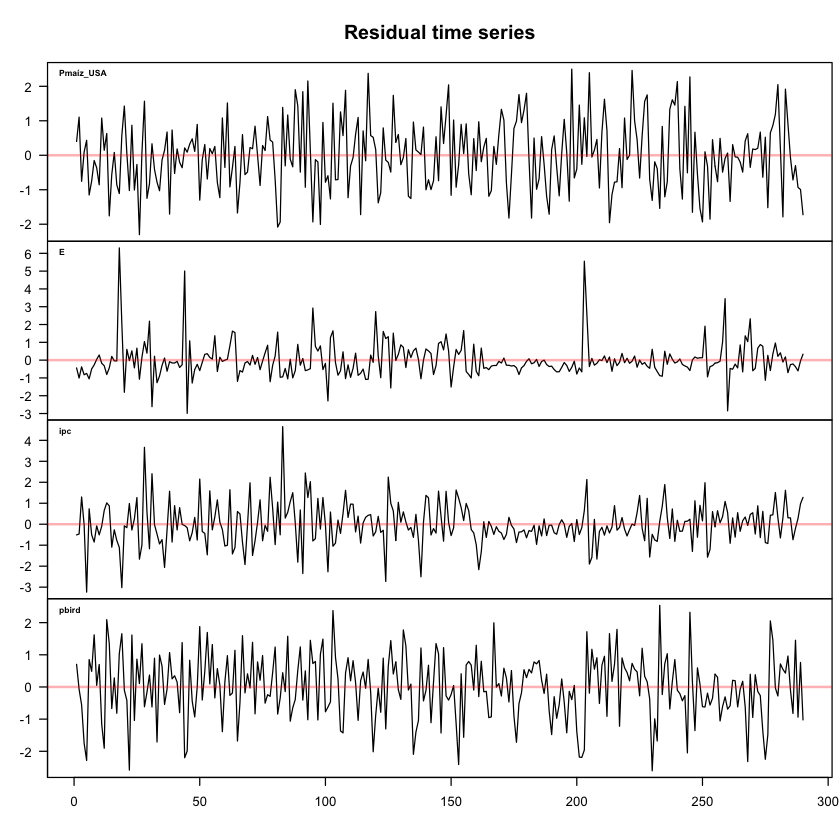

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



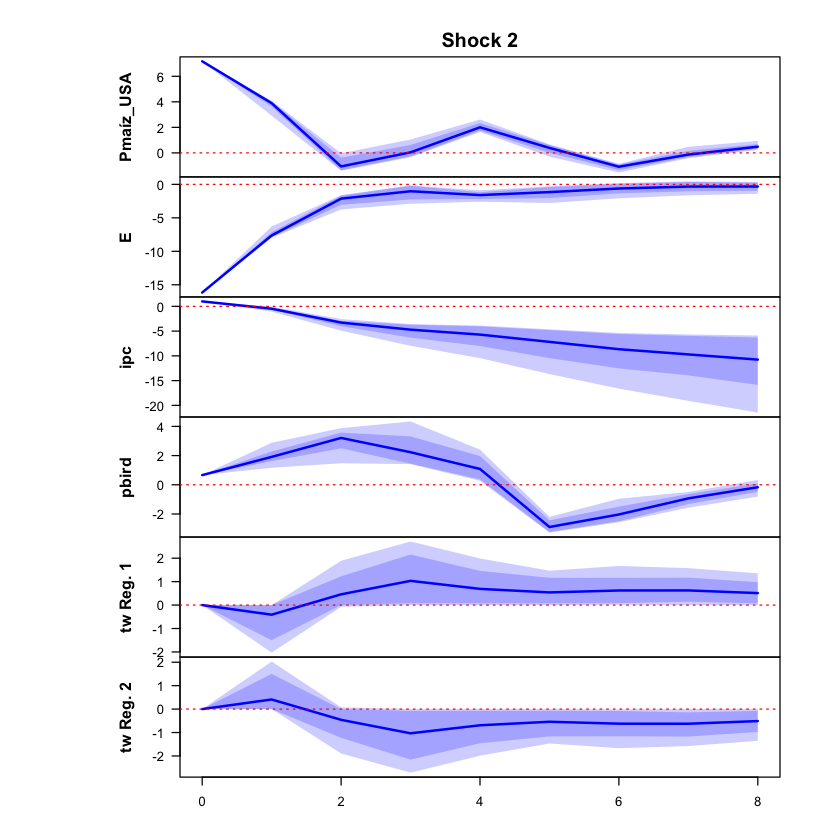

 >>> Linear IRF ( 1  shock units)


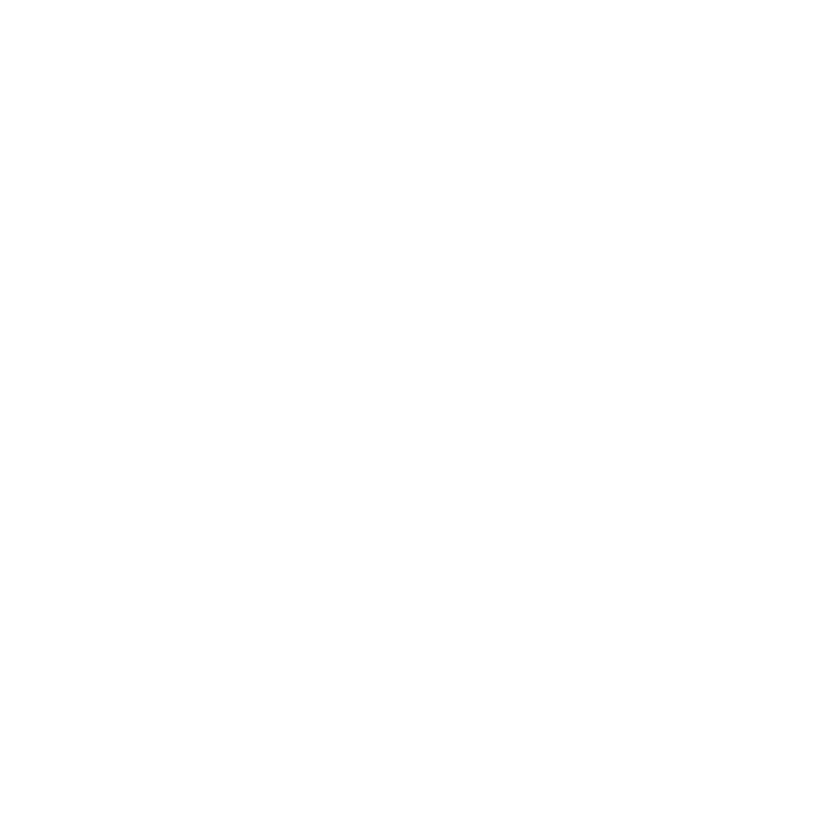

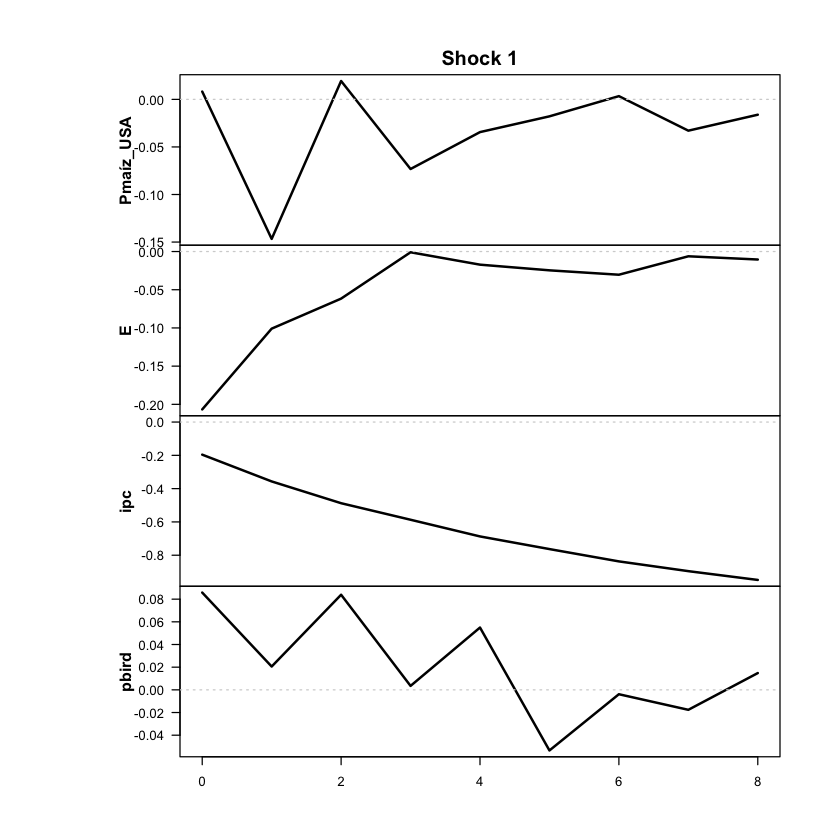

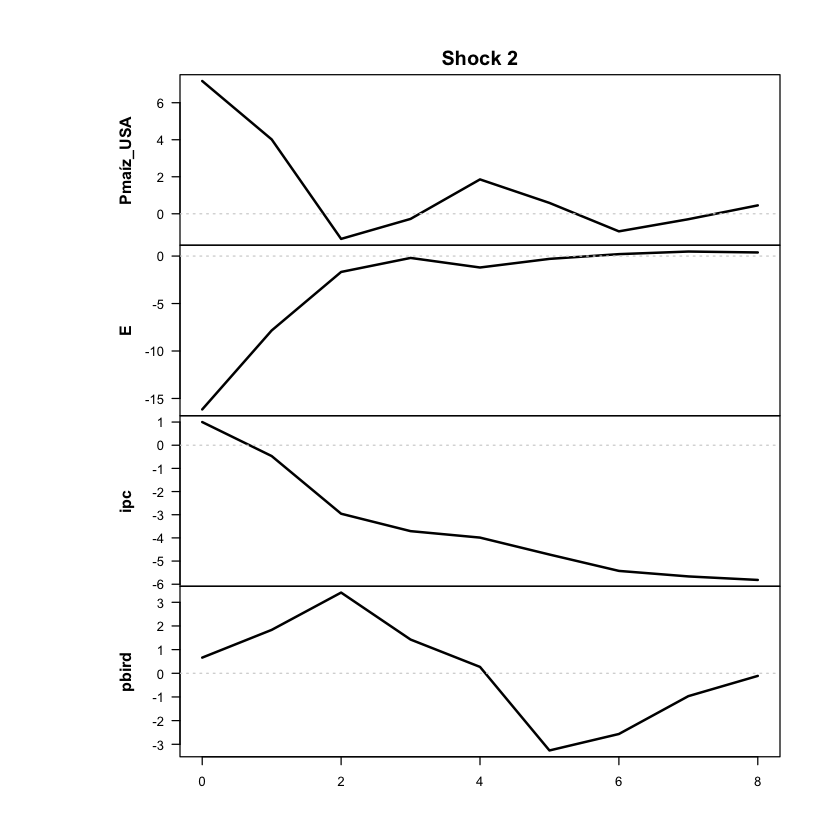

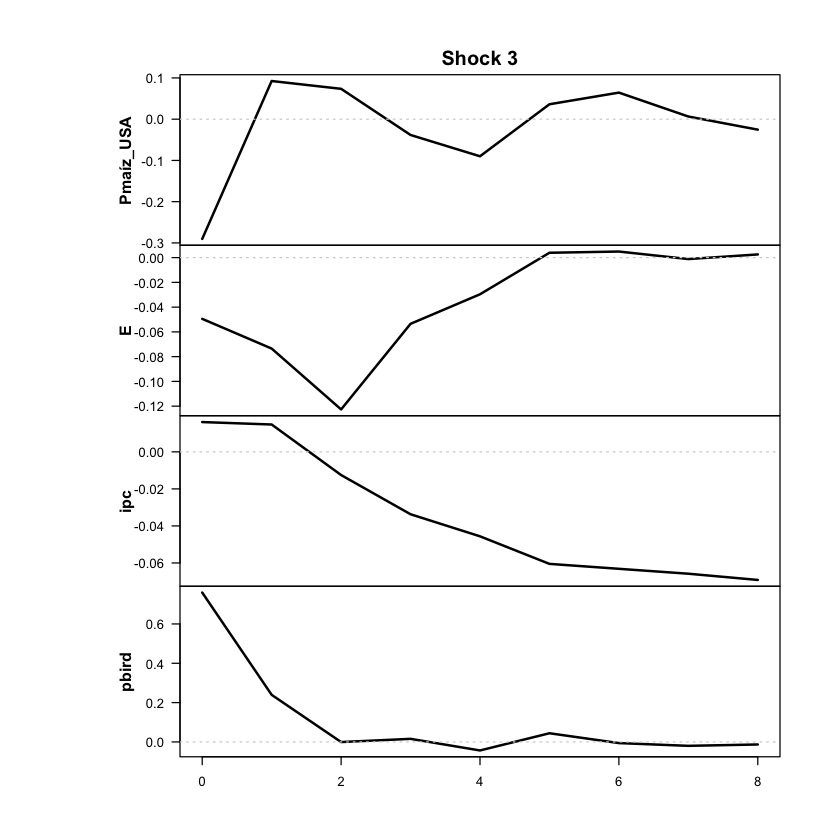

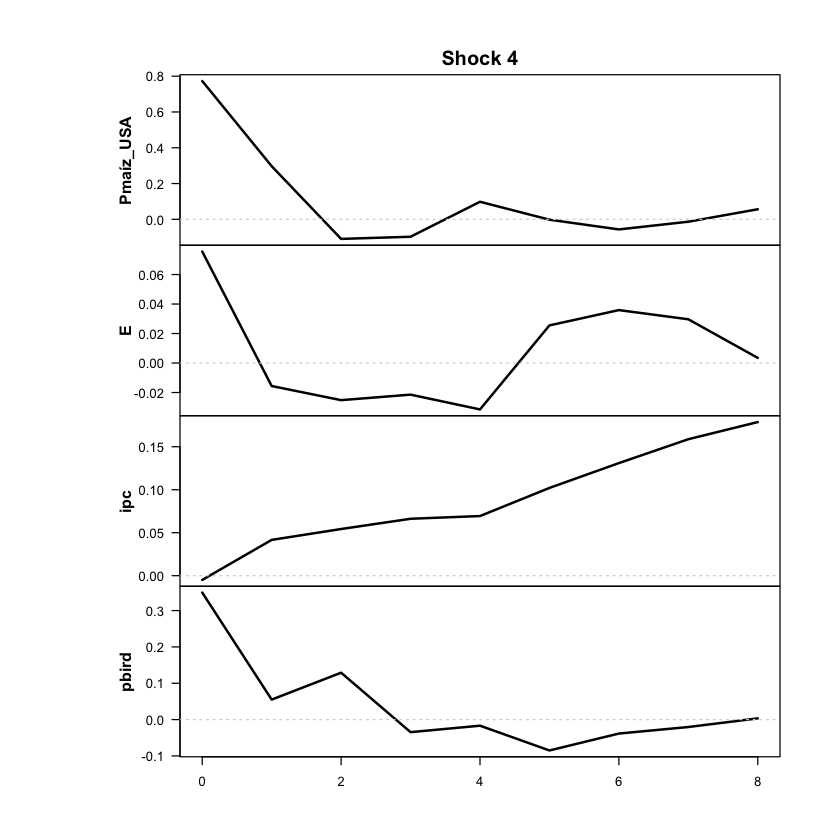

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



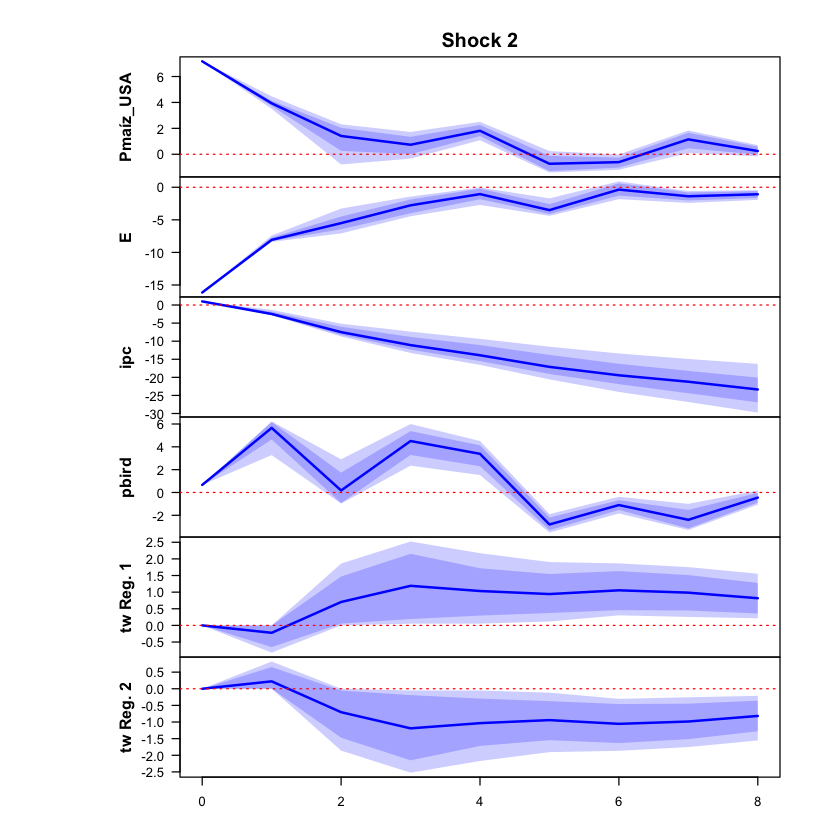

 >>> Linear IRF ( 1  shock units)


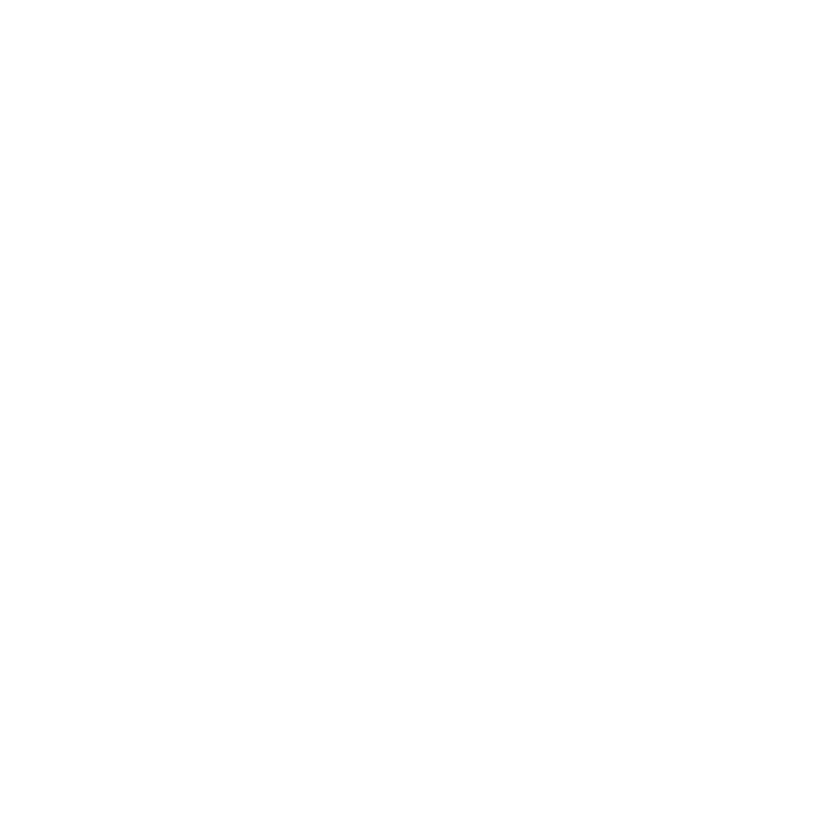

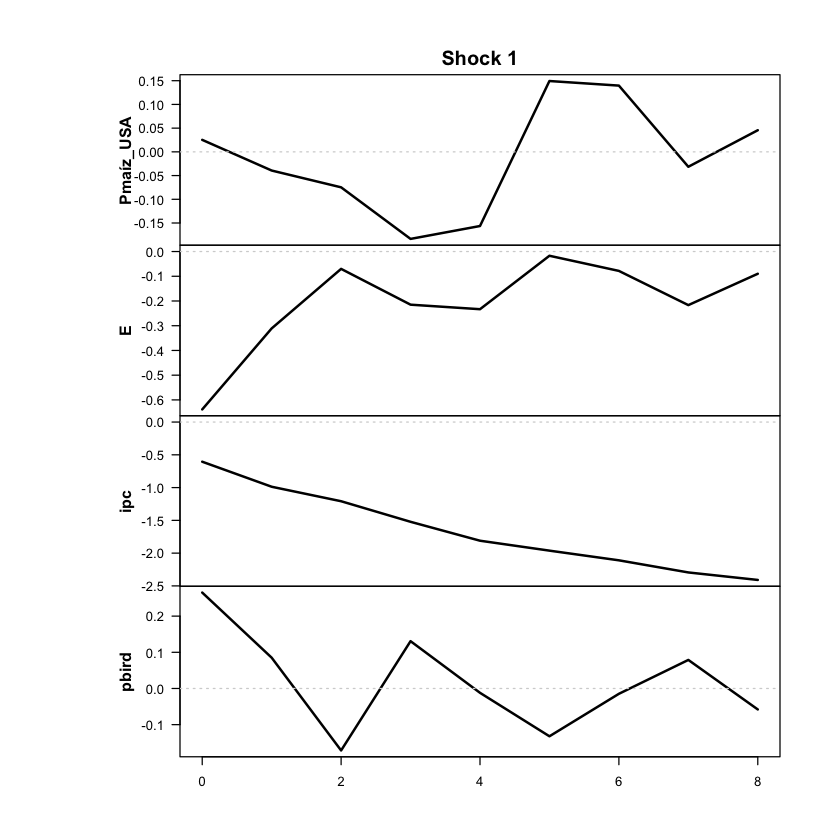

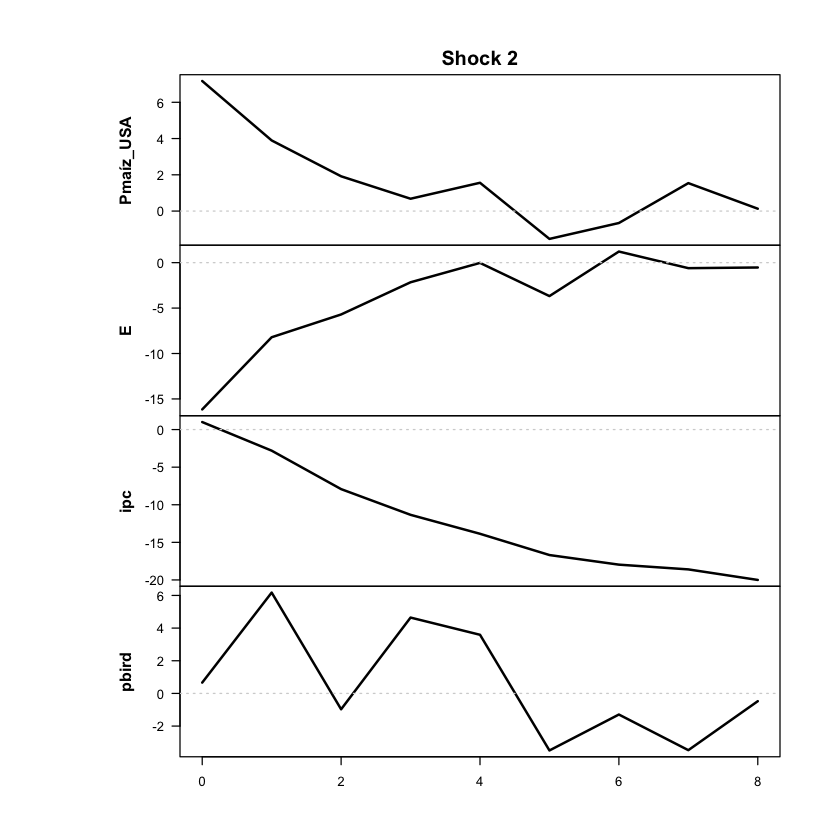

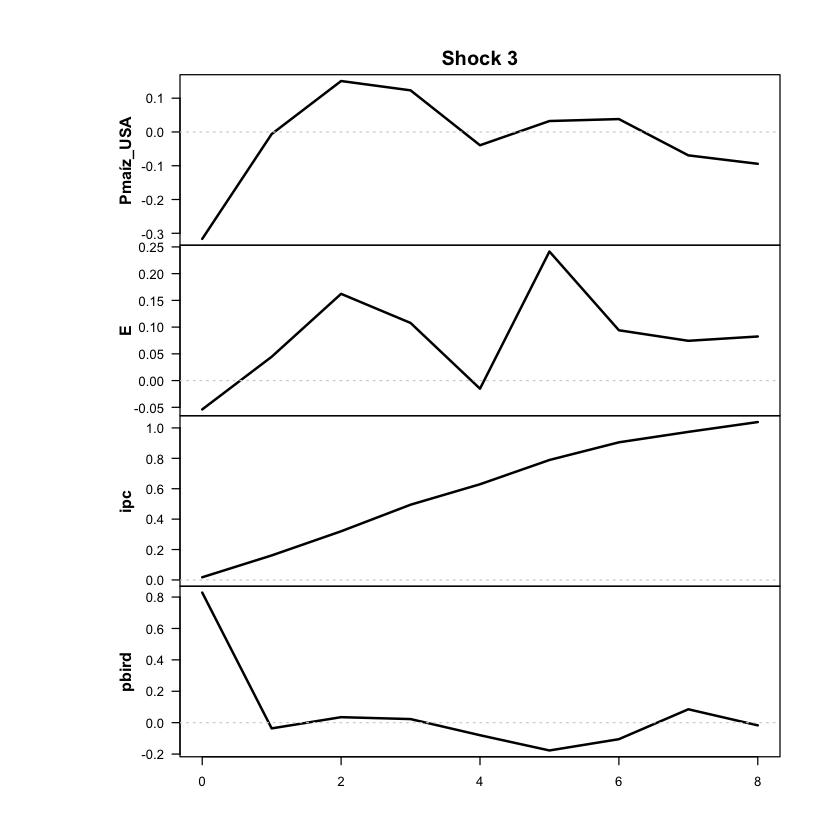

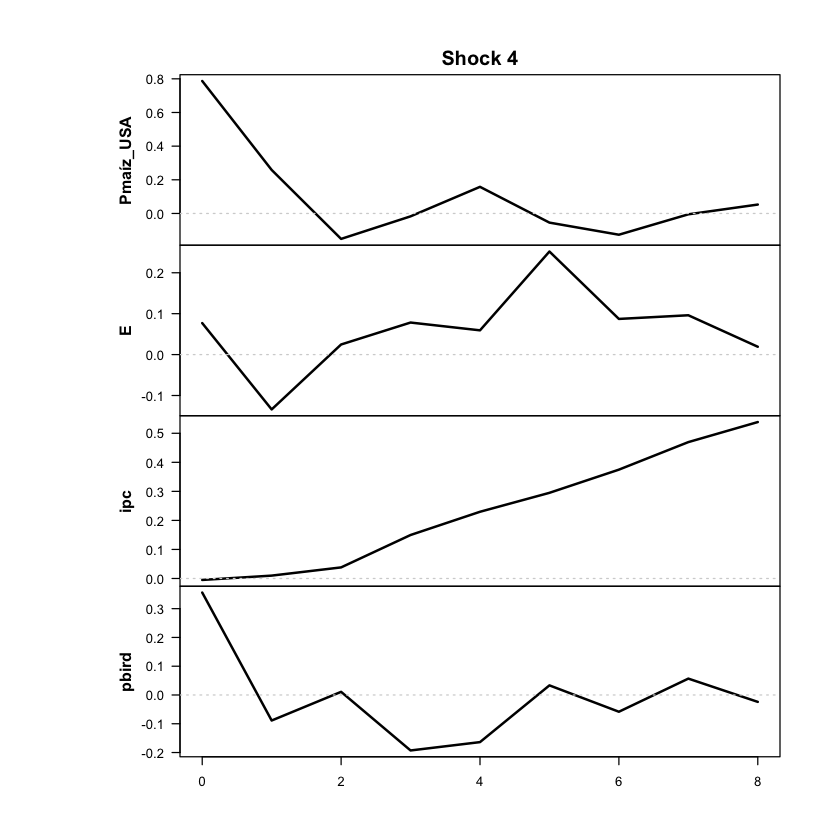

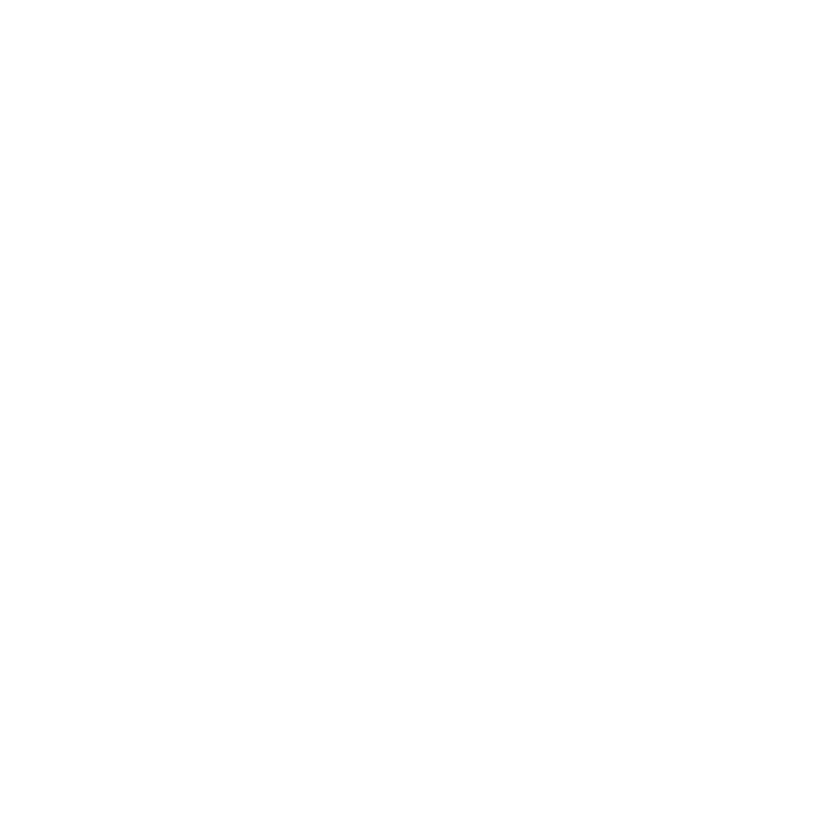

In [13]:
res <- run_threshold_tvar(
  data = df_ERPT_Arg_capped,
  endog = c("Pmaíz_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual' o mensual
  feature_lag = 5,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Pmaíz_USA","ipc","pbird")
  run_tests = TRUE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [14]:
print_passthrough(res, endog = c("Pmaíz_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0619
1         1       0.0295
2         2       0.2028
3         3       0.2914
4         4       0.3532
5         5       0.4440
6         6       0.5358
7         7       0.6007
8         8       0.6658

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.0619
2         1       0.0289
3         2       0.1830
4         3       0.2296
5         4       0.2468
6         5       0.2921
7         6       0.3358
8         7       0.3505
9         8       0.3600

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0619
1         1       0.1534
2         2       0.4642
3         3       0.6863
4         4       0.8600
5         5       1.0589
6         6       1.2028
7         7       1.3132
8         8       1.4456

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Pmaíz_USA: 
   2.5%   10%  mean   90% 97.5%
0  0.19  0.19  0.19  0.19  0.19
1 -1.77 -1.20 -1.12 -1.05 -0.92
2 -2.66 -2.55 -2.42 -2.09 -1.56
3  0.37  0.55  0.70  1.06  1.40
4 -2.30 -2.28 -2.02 -1.46 -1.08
5 -2.47 -2.31 -2.22 -2.06 -1.94
6 -0.72 -0.47 -0.30 -0.19 -0.11
7 -0.83 -0.75 -0.64 -0.48 -0.32
8 -0.88 -0.85 -0.72 -0.51 -0.32

The response of E: 
   2.5%   10%  mean   90% 97.5%
0 19.23 19.23 19.23 19.23 19.23
1  2.47  2.55  2.70  3.10  3.78
2  1.65  1.78  2.10  2.90  3.70
3  3.44  3.63  3.86  4.27  4.53
4  1.97  2.13  2.37  2.80  3.39
5  0.49  0.70  0.96  1.36  1.84
6  0.95  1.07  1.31  1.70  2.14
7  0.43  0.68  0.92  1.25  1.64
8  0.72  0.89  1.13  1.48  1.85

The response of ipc: 
  2.5%  10%  mean   90% 97.5%
0 1.00 1.00  1.00  1.00  1.00
1 3.07 3.29  3.37  3.54  3.81
2 5.08 5.45  5.75  6.18  6.86
3 5.64 6.05  6.54  7.31  8.34
4 6.06 6.82  7.4

### TRIGO

Desvíos usados para escalar:
Ptrigo_USA          E        ipc      pbird 
0.07672900 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1316.413

The largest loglik: -1133.434

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1202.596

The largest loglik: -1112.602

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> TESTS
PARA CORRER LOS TESTS CORRER LA SIGUIENTE FUNCION:
run_tests_sstvar(res, c(' ipc '), TRUE , NULL , 1 , 500 )

 >>> DIAGNOSTIC PLOTS


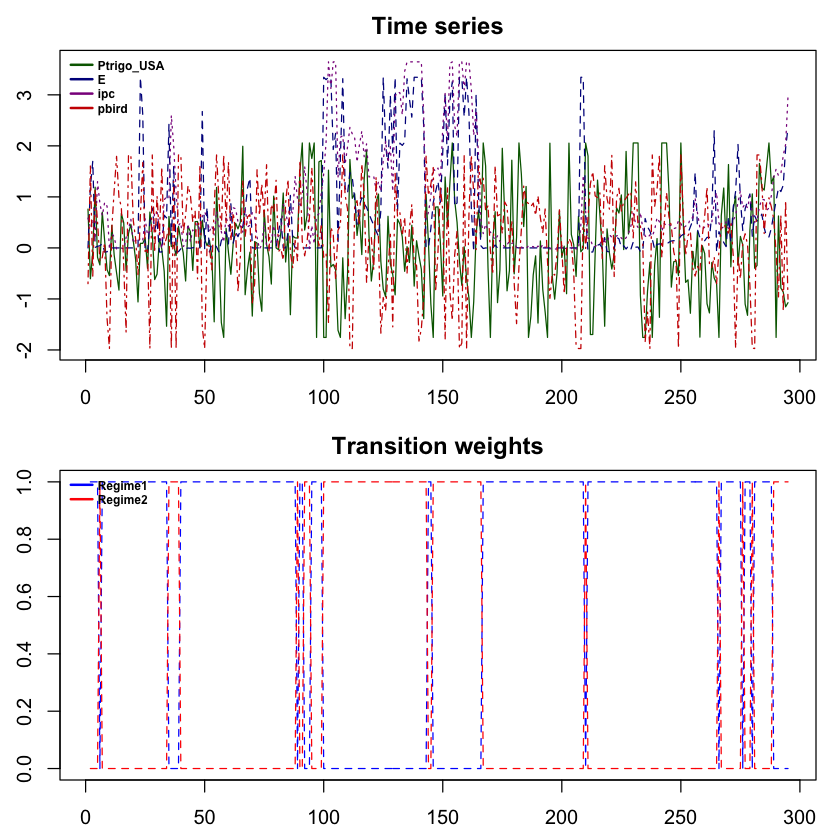

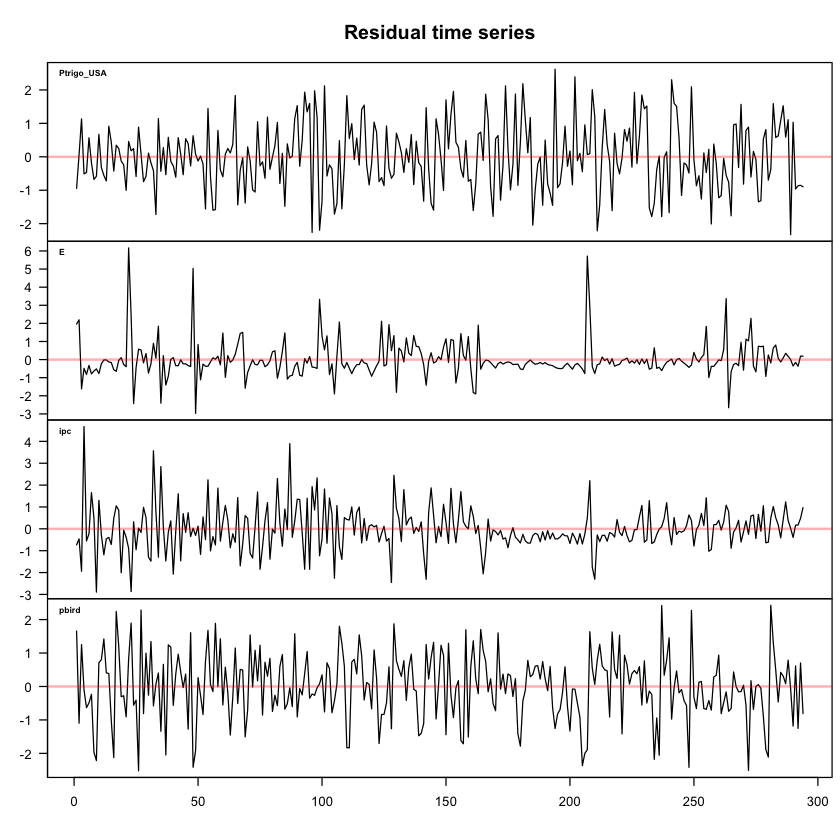

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



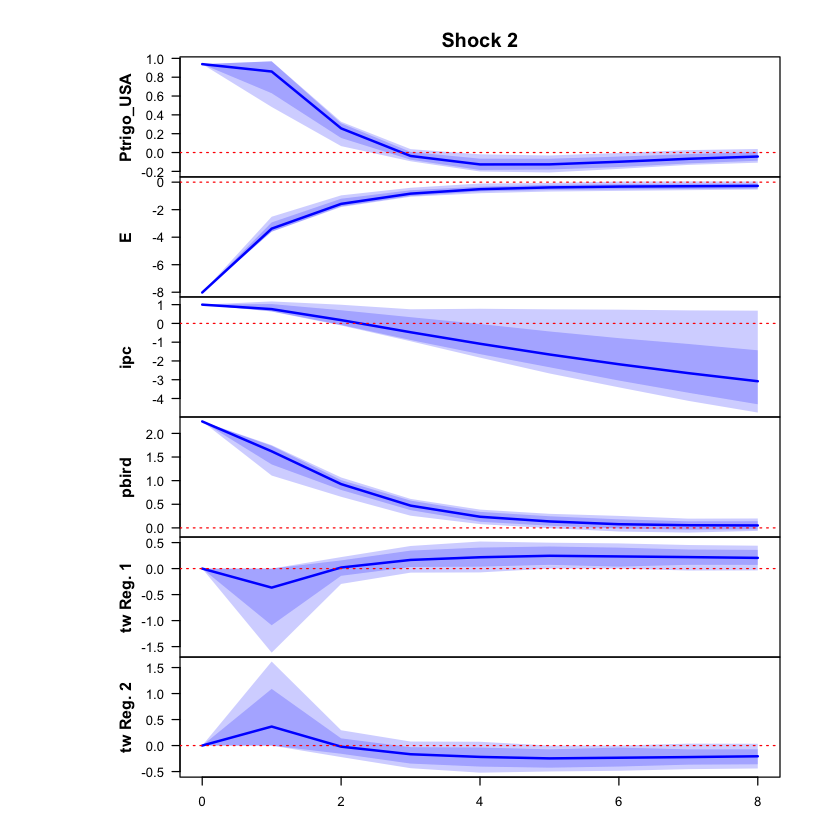

 >>> Linear IRF ( 1  shock units)


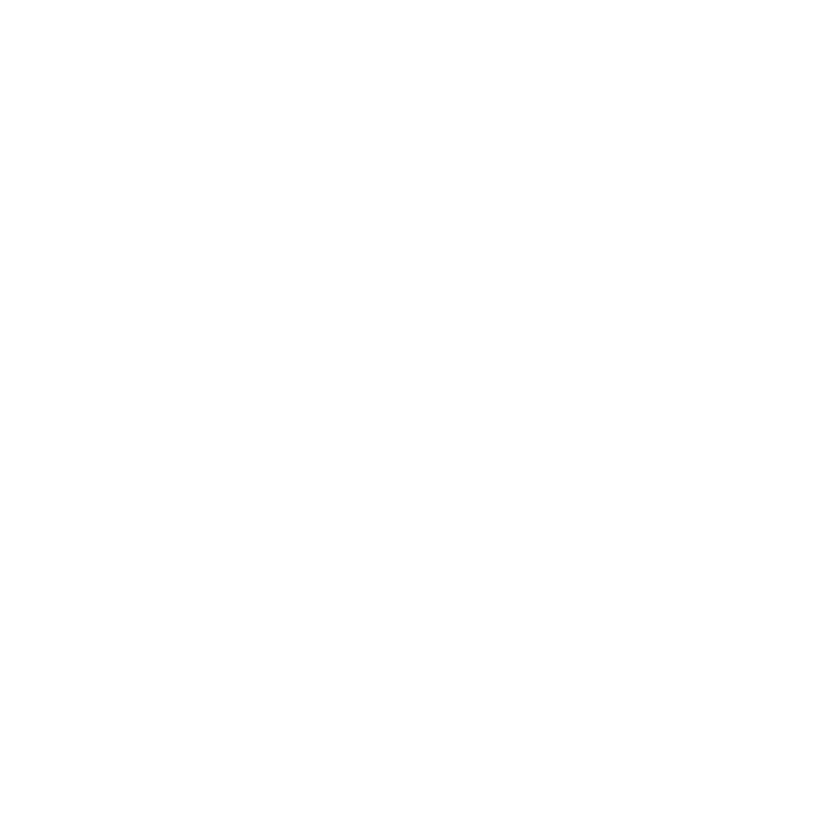

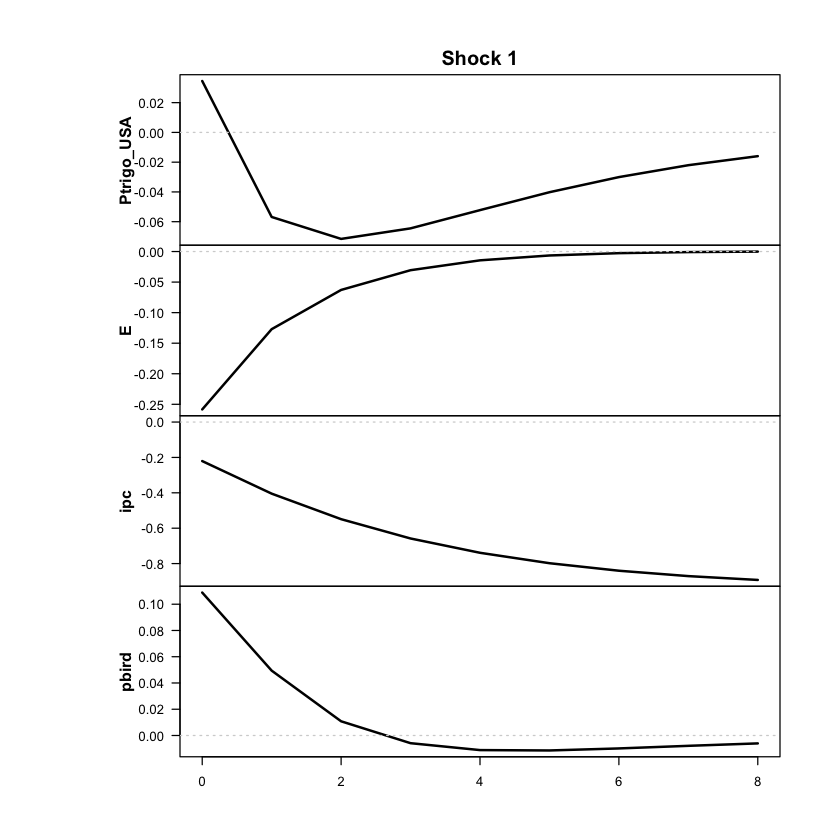

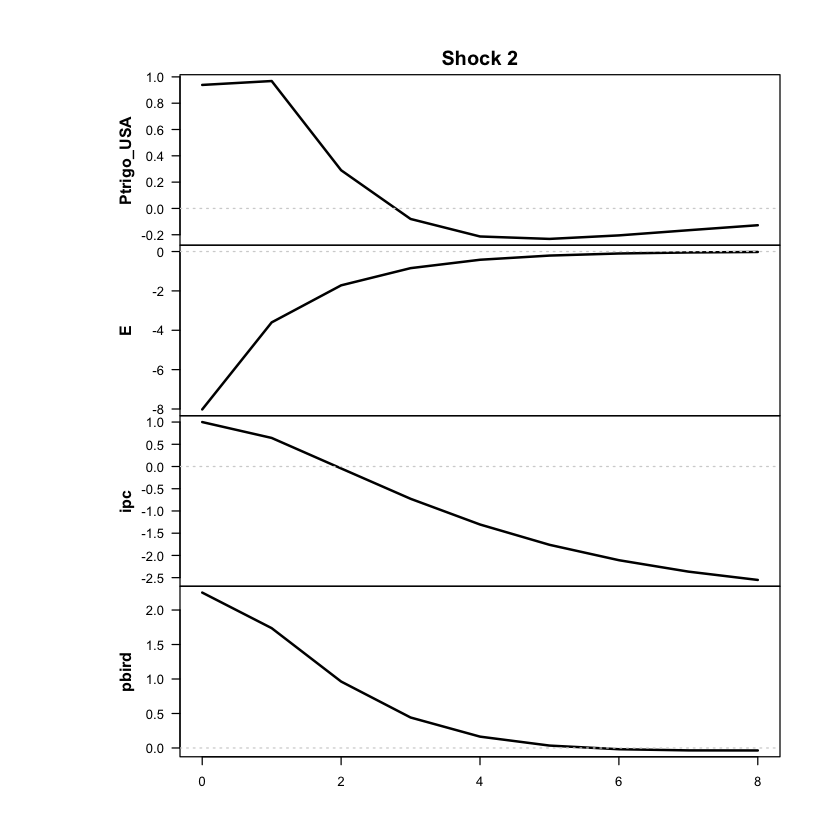

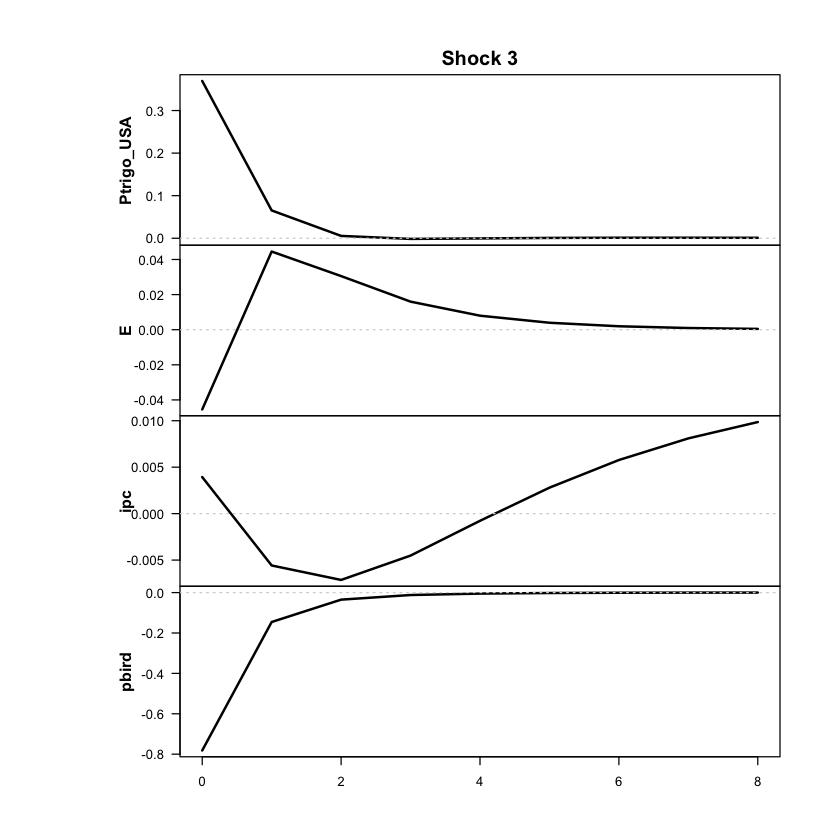

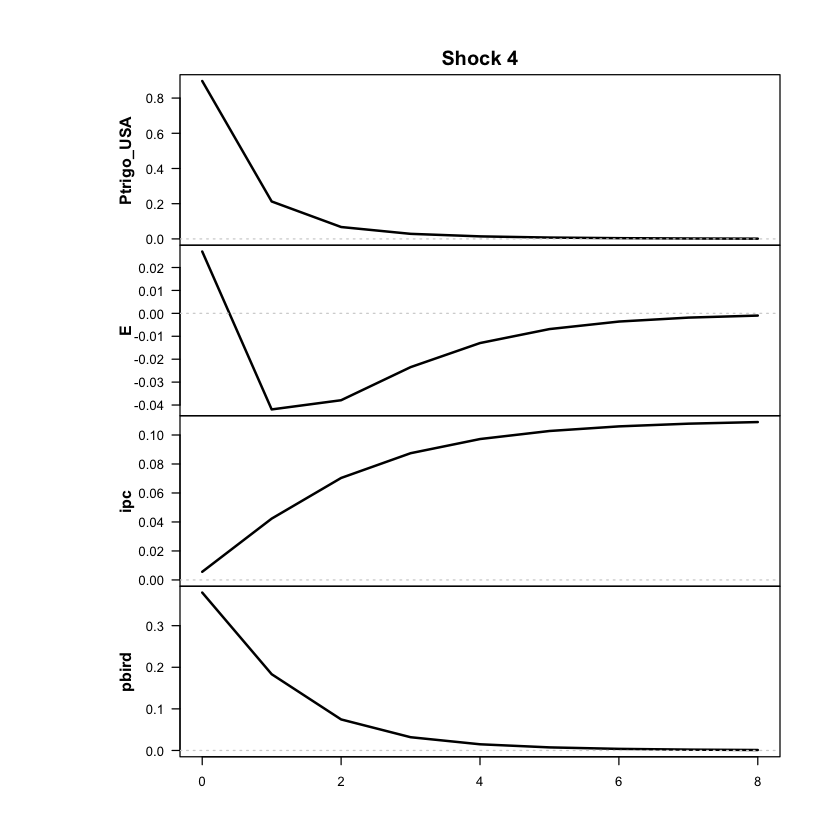

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



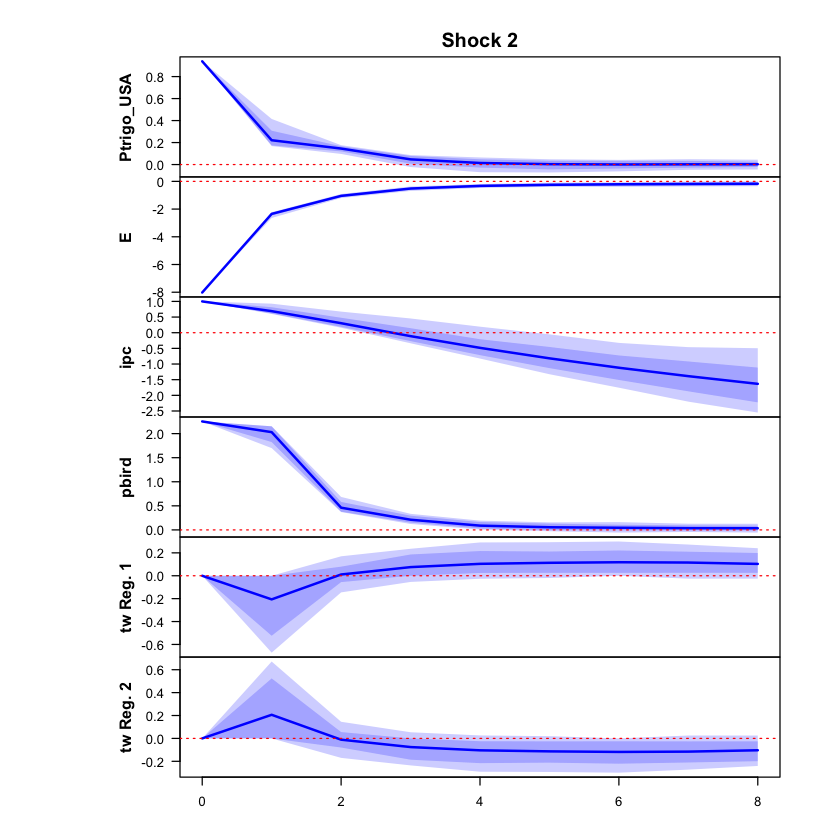

 >>> Linear IRF ( 1  shock units)


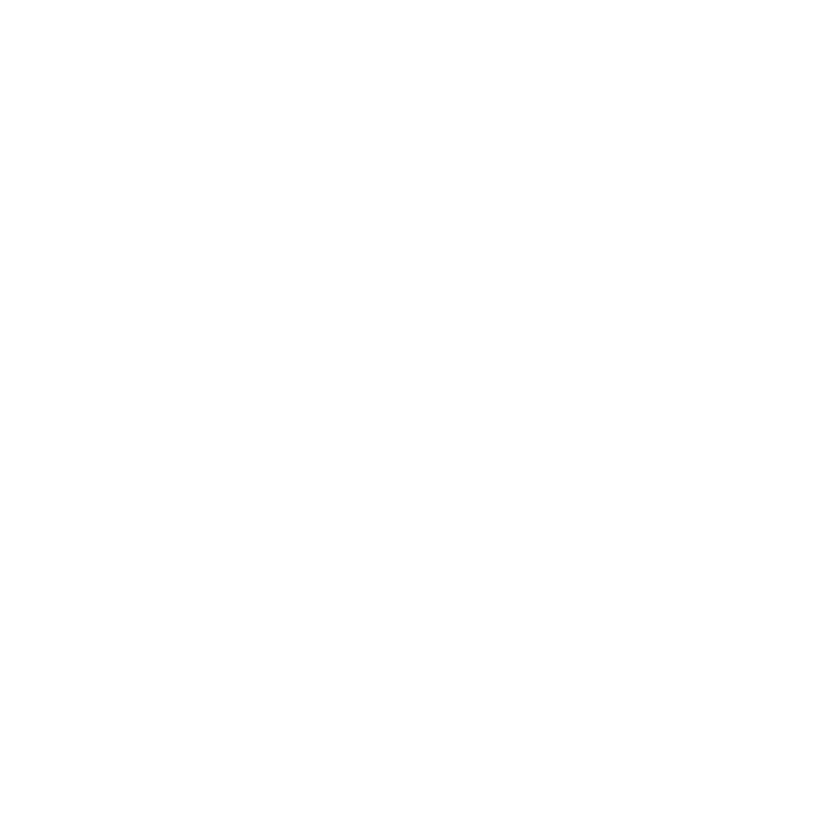

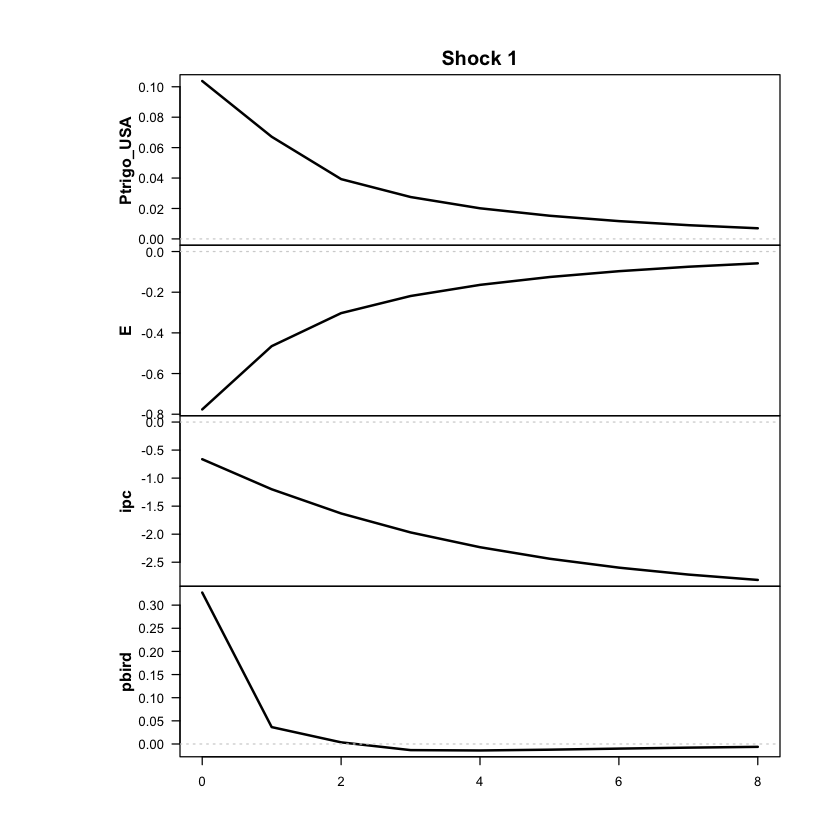

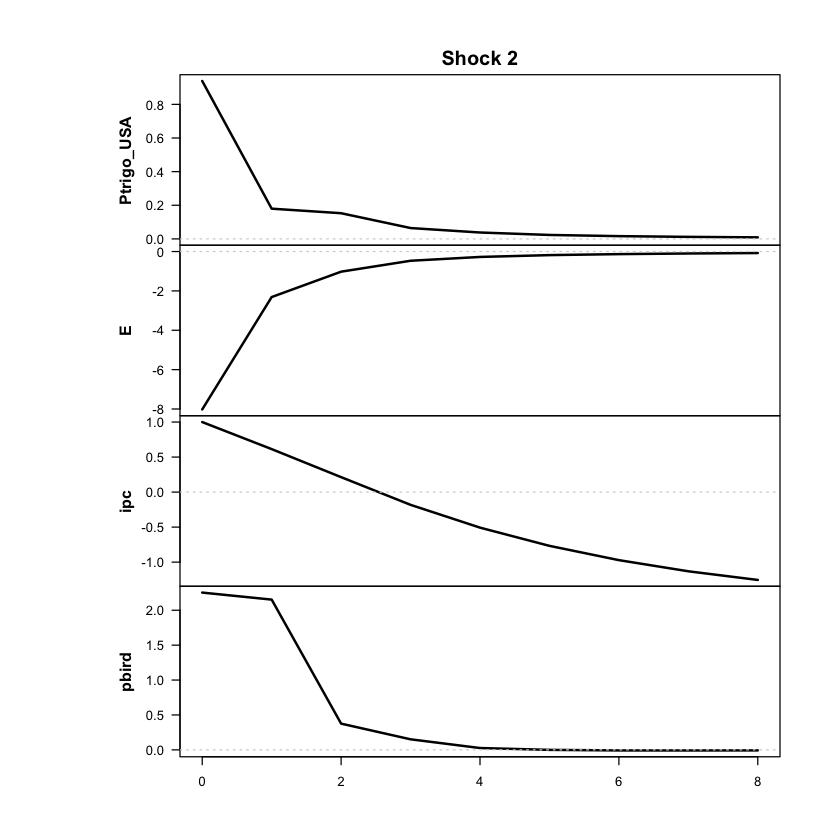

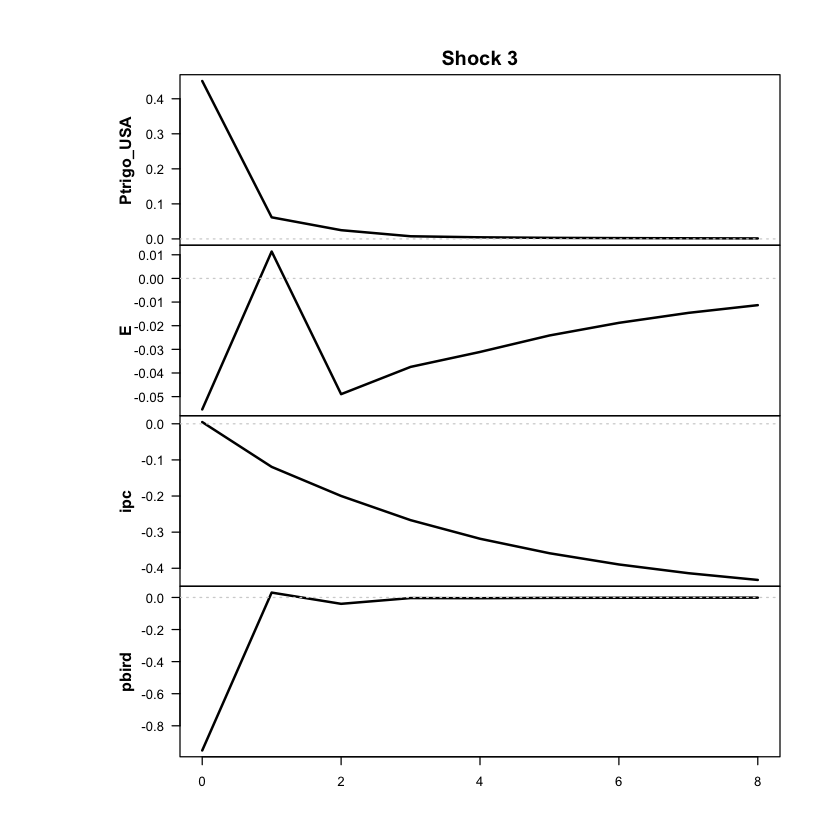

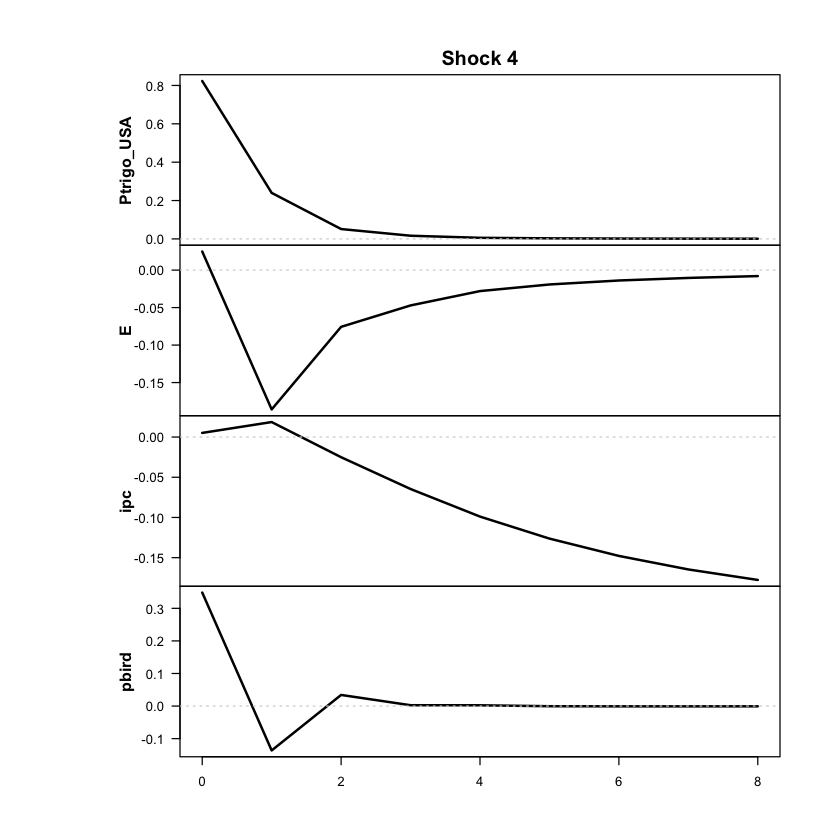

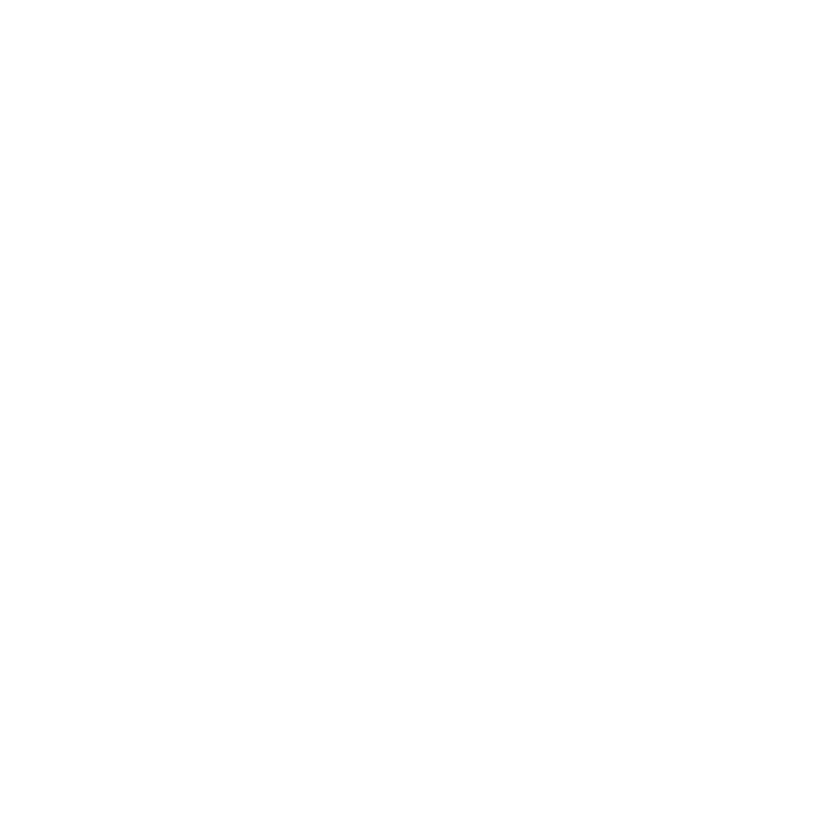

In [15]:
res <- run_threshold_tvar(
  data = df_ERPT_Arg_capped,
  endog = c("Ptrigo_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual' o mensual
  feature_lag = 1,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Ptrigo_USA","ipc","pbird")
  run_tests = TRUE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [16]:
print_passthrough(res, endog = c("Ptrigo_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1247
1         1      -0.0950
2         2      -0.0219
3         3       0.0586
4         4       0.1351
5         5       0.2063
6         6       0.2712
7         7       0.3303
8         8       0.3841

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.1247
2         1      -0.0801
3         2       0.0054
4         3       0.0905
5         4       0.1626
6         5       0.2195
7         6       0.2627
8         7       0.2947
9         8       0.3181

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1247
1         1      -0.0859
2         2      -0.0379
3         3       0.0136
4         4       0.0602
5         5       0.1020
6         6       0.1394
7         7       0.1730
8         8       0.2036

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Ptrigo_USA: 
   2.5%   10%  mean  90% 97.5%
0  3.37  3.37  3.37 3.37  3.37
1  0.22  0.68  1.65 2.14  2.14
2  0.01  0.14  0.26 0.34  0.38
3 -0.23 -0.12 -0.01 0.09  0.15
4 -0.17 -0.11 -0.02 0.07  0.11
5 -0.16 -0.10 -0.02 0.05  0.11
6 -0.14 -0.09 -0.01 0.06  0.09
7 -0.12 -0.07  0.00 0.07  0.11
8 -0.10 -0.06  0.00 0.06  0.09

The response of E: 
    2.5%    10%   mean    90%  97.5%
0 -13.31 -13.31 -13.31 -13.31 -13.31
1  -1.97  -1.97  -1.02   0.66   1.32
2  -0.73  -0.54  -0.10   0.71   1.23
3  -0.68  -0.44  -0.07   0.44   0.82
4  -0.50  -0.36  -0.04   0.33   0.74
5  -0.58  -0.43  -0.08   0.32   0.53
6  -0.54  -0.37  -0.05   0.26   0.49
7  -0.52  -0.36  -0.08   0.19   0.46
8  -0.57  -0.36  -0.09   0.15   0.38

The response of ipc: 
   2.5%   10% mean  90% 97.5%
0  1.00  1.00 1.00 1.00  1.00
1  0.74  0.77 1.29 2.31  2.66
2  0.39  0.47 1.31 3.10  3.66
3 -0.

Desvíos usados para escalar:
Ptrigo_USA          E        ipc      pbird 
0.07672900 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1337.227

The largest loglik: -1133.707

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1233.091

The largest loglik: -1090.741

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> TESTS
PARA CORRER LOS TESTS CORRER LA SIGUIENTE FUNCION:
run_tests_sstvar(res, c(' ipc '), TRUE , NULL , 1 , 500 )

 >>> DIAGNOSTIC PLOTS


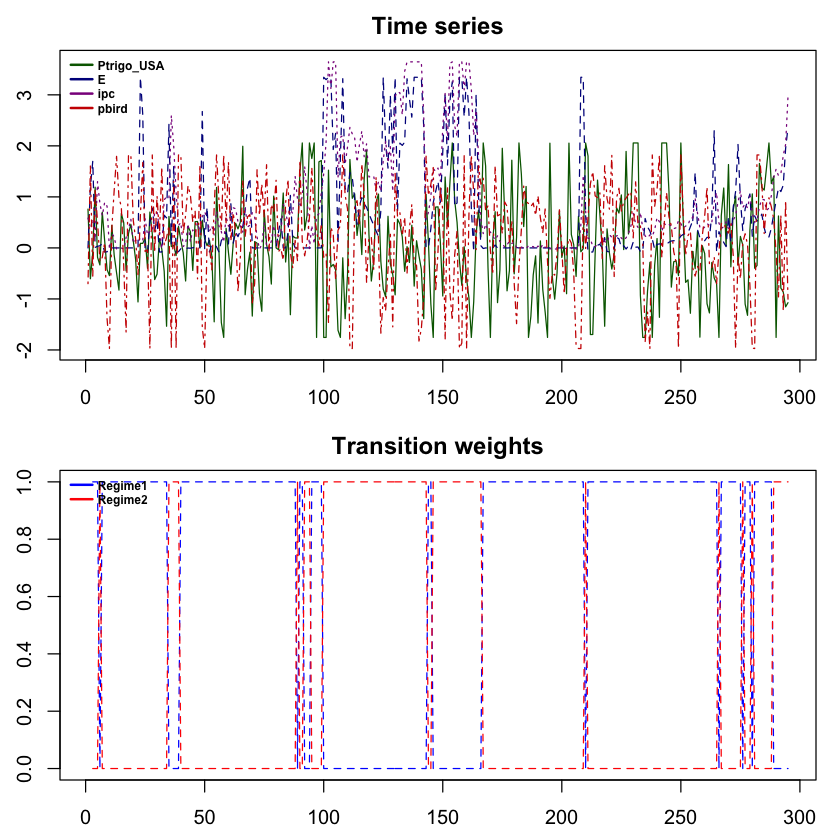

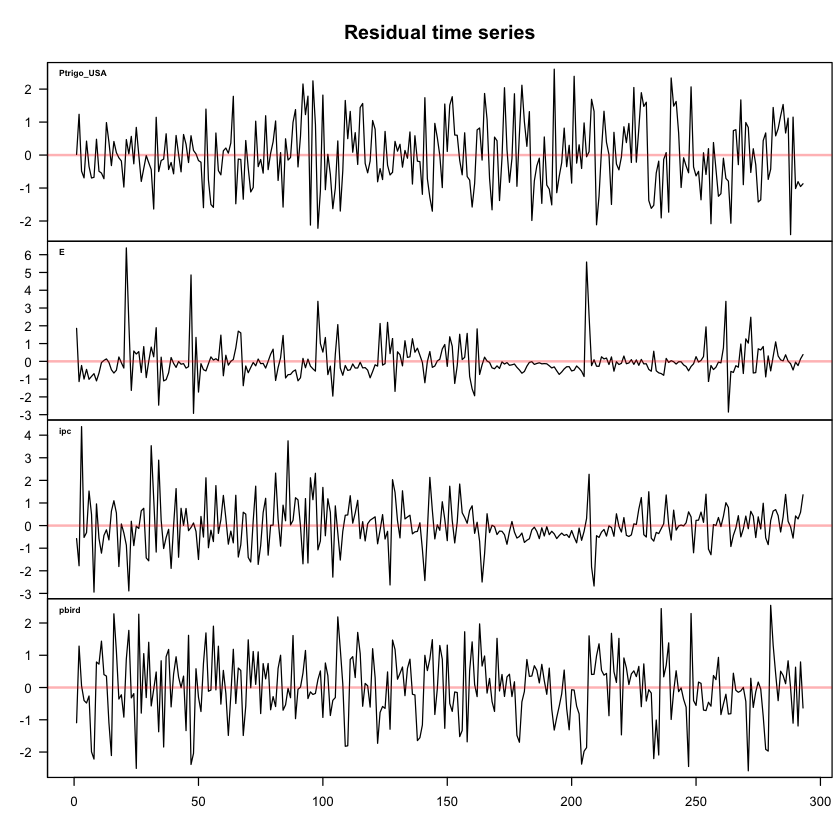

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



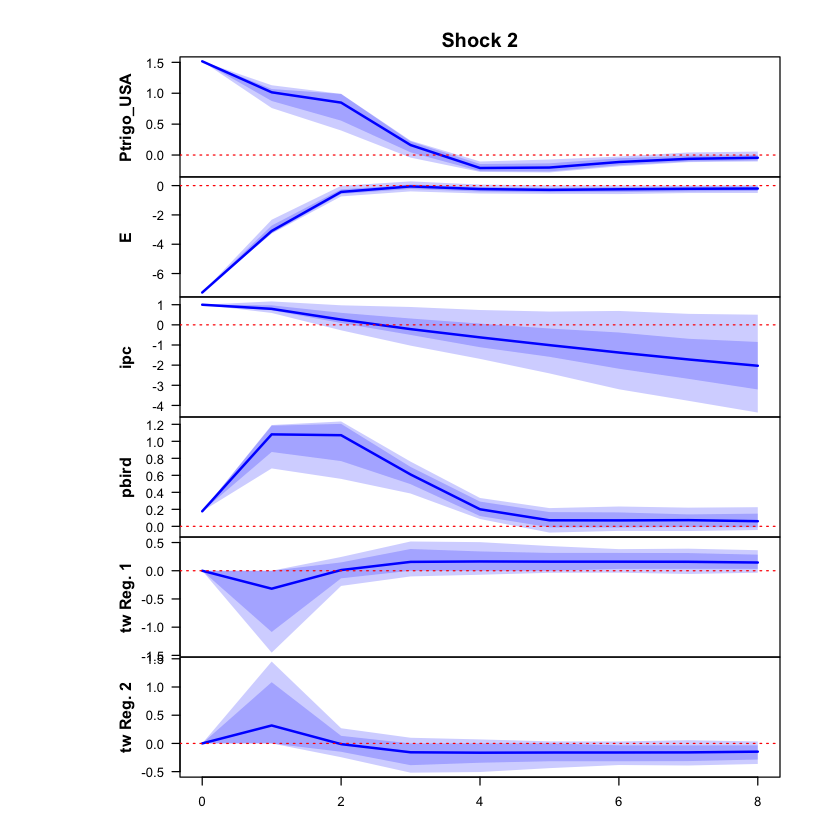

 >>> Linear IRF ( 1  shock units)


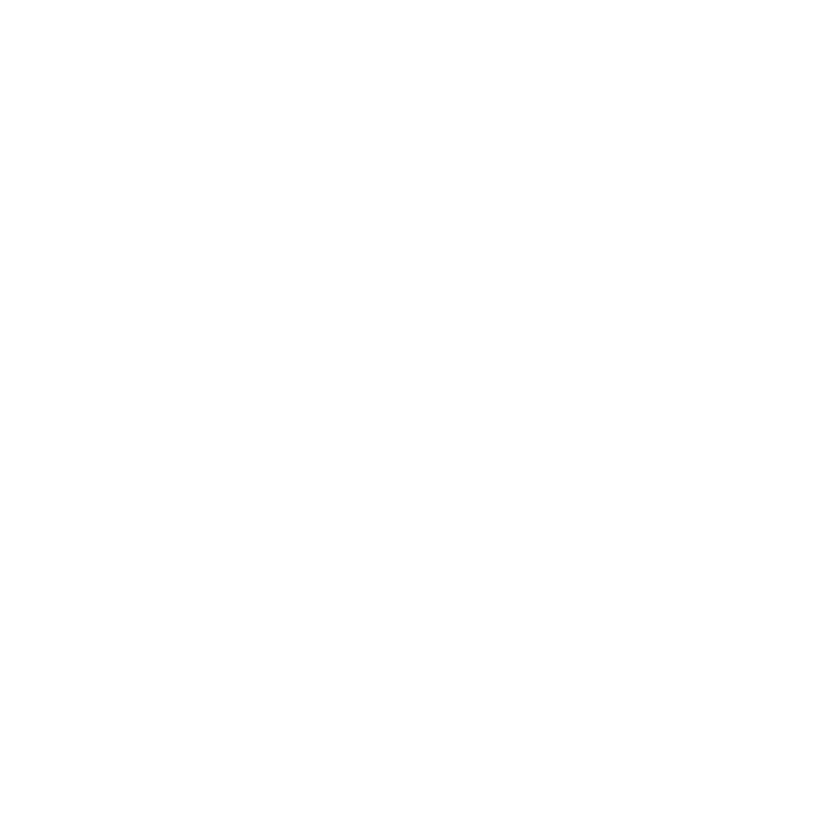

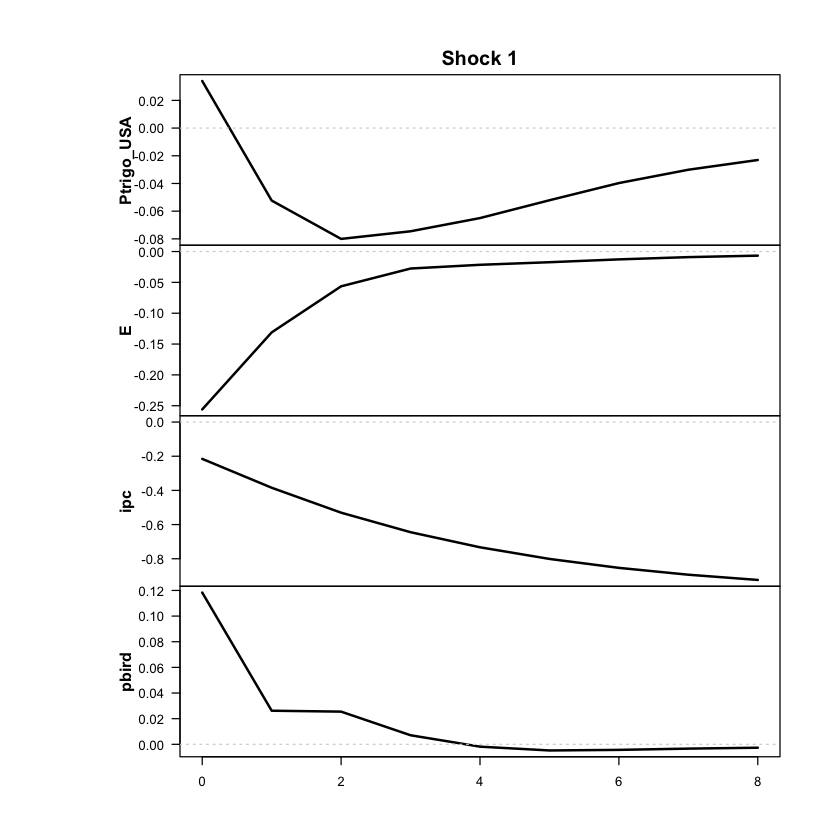

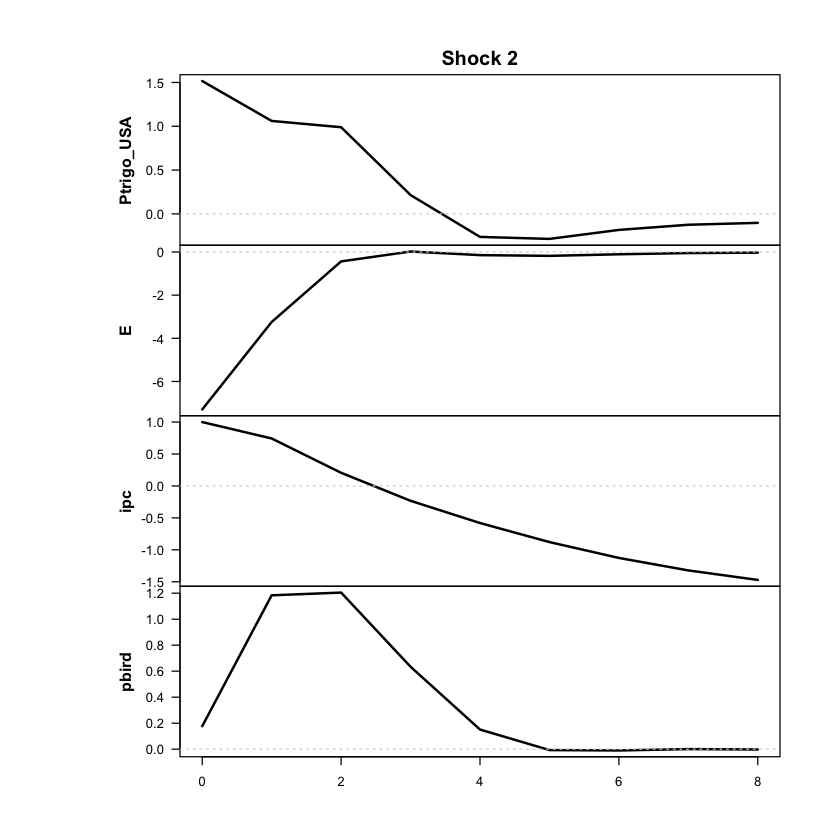

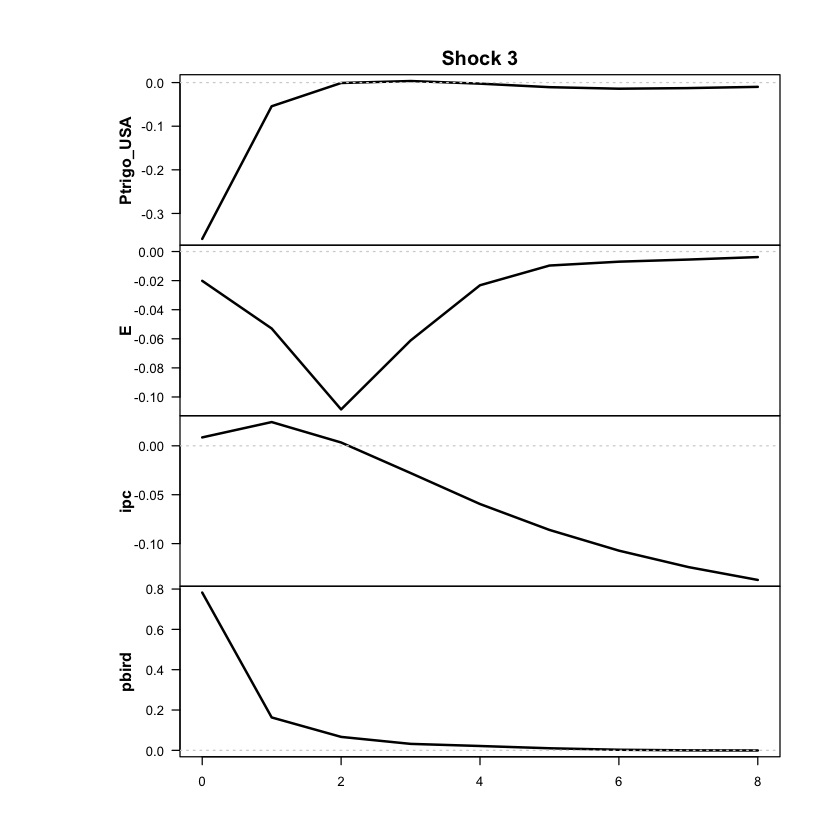

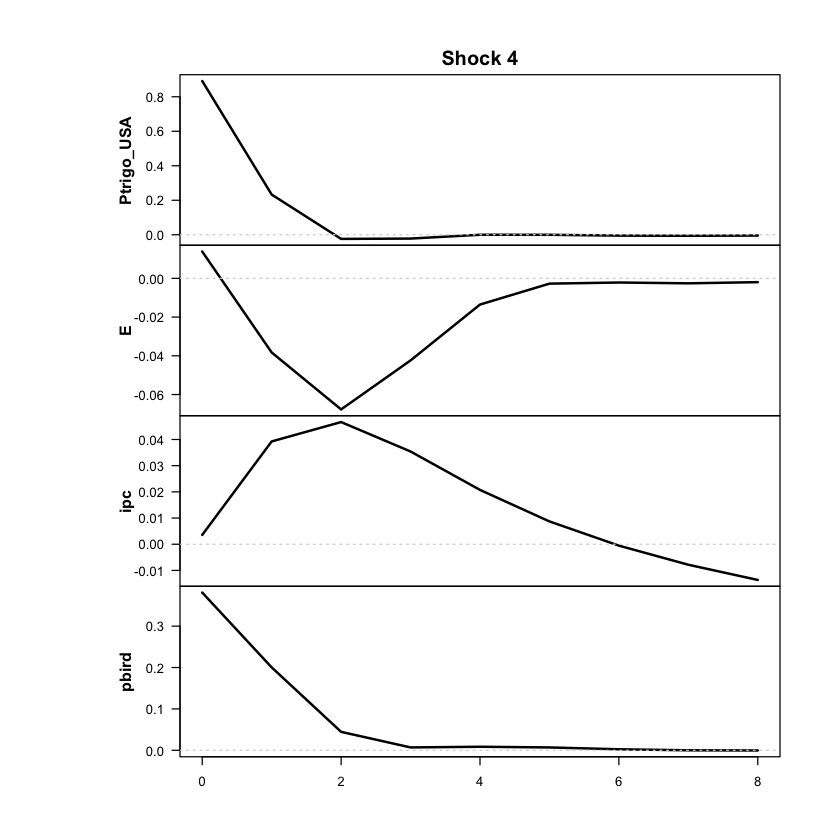

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



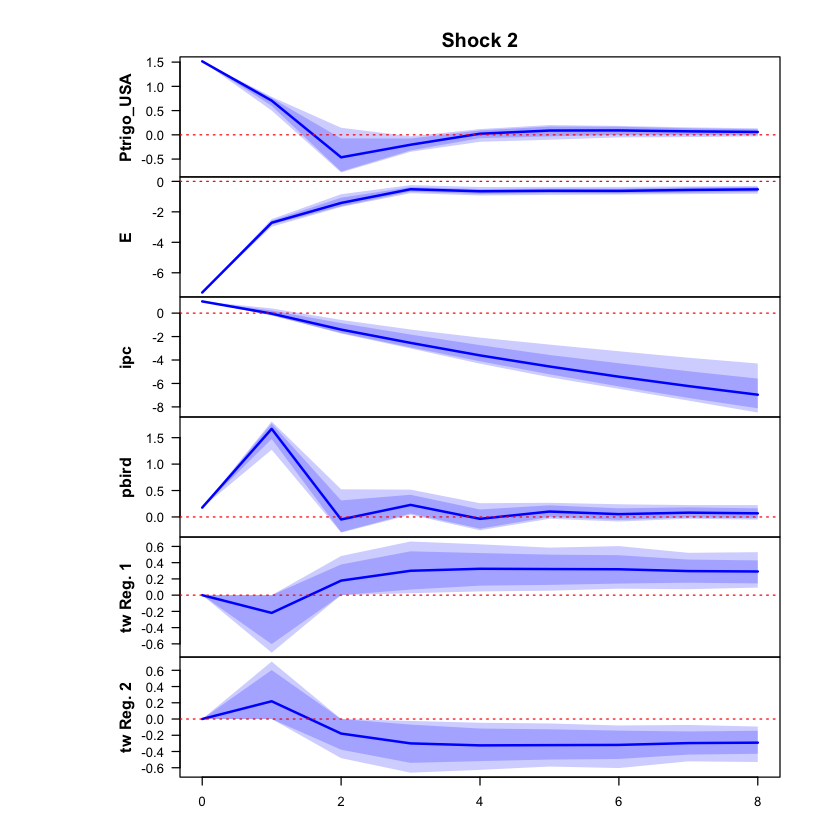

 >>> Linear IRF ( 1  shock units)


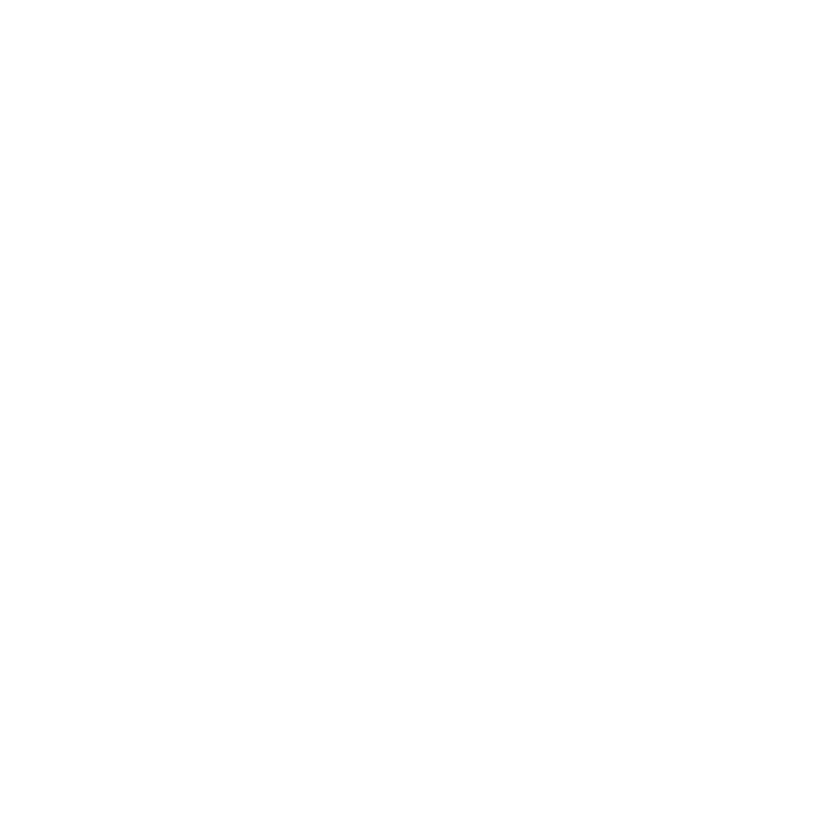

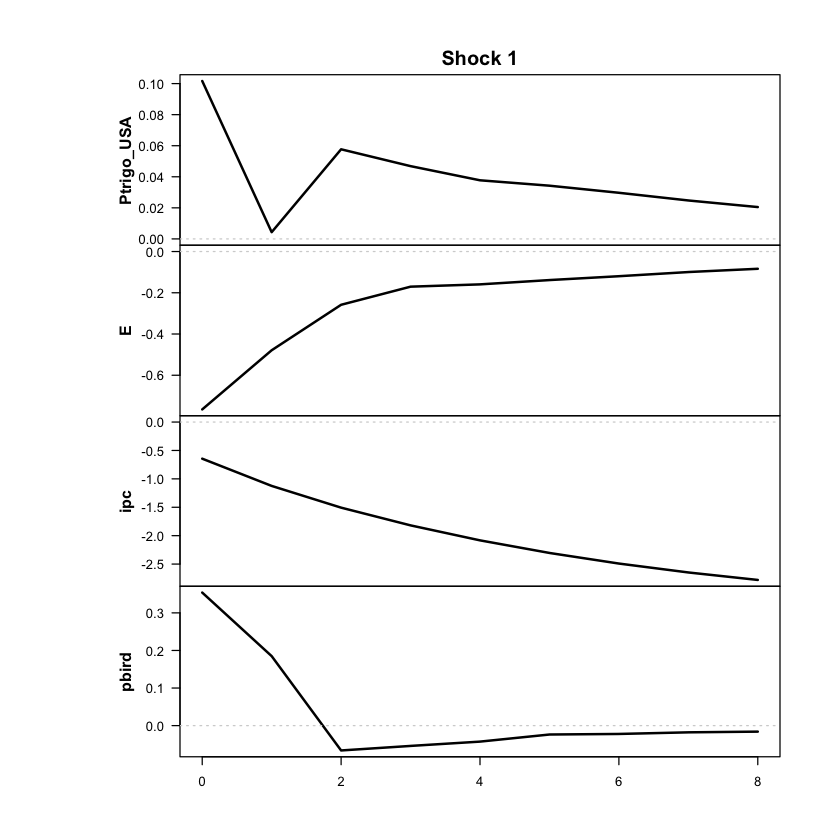

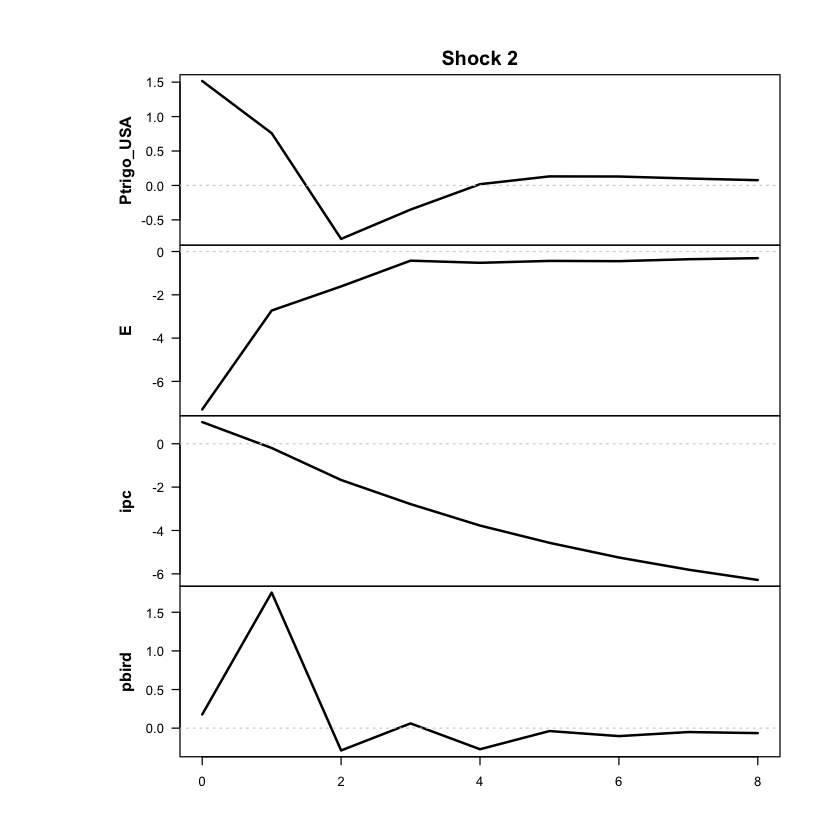

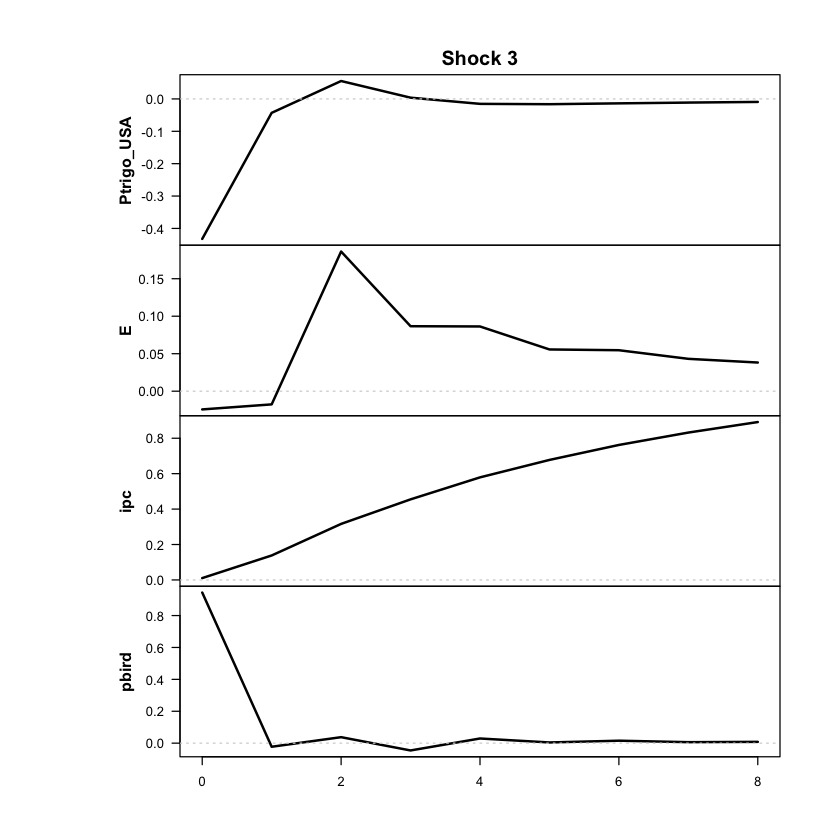

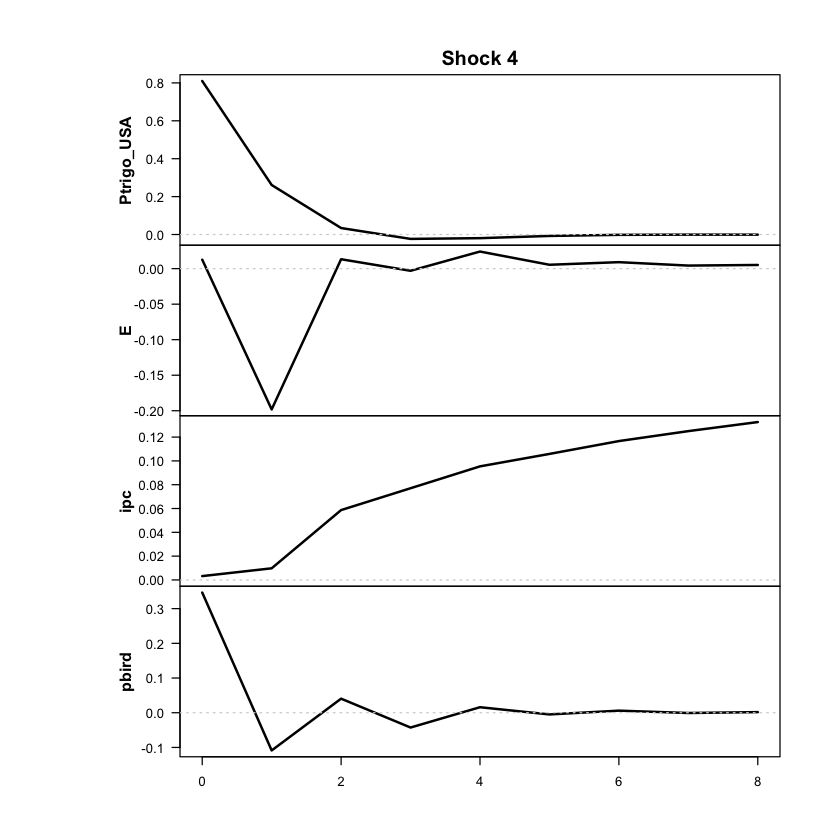

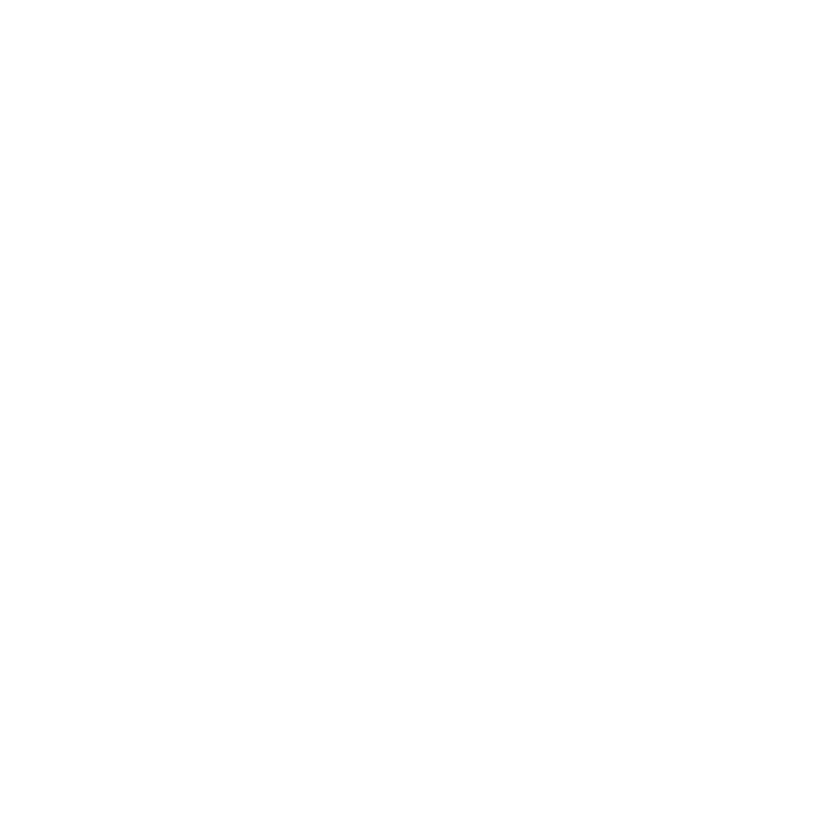

In [17]:
res <- run_threshold_tvar(
  data = df_ERPT_Arg_capped,
  endog = c("Ptrigo_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual' o mensual
  feature_lag = 2,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Ptrigo_USA","ipc","pbird")
  run_tests = TRUE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [18]:
print_passthrough(res, endog = c("Ptrigo_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1371
1         1      -0.1089
2         2      -0.0358
3         3       0.0290
4         4       0.0851
5         5       0.1380
6         6       0.1883
7         7       0.2354
8         8       0.2784

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.1371
2         1      -0.1019
3         2      -0.0282
4         3       0.0318
5         4       0.0795
6         5       0.1204
7         6       0.1544
8         7       0.1812
9         8       0.2016

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1371
1         1       0.0056
2         2       0.1924
3         3       0.3480
4         4       0.4943
5         5       0.6240
6         6       0.7436
7         7       0.8529
8         8       0.9542

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Ptrigo_USA: 
    2.5%    10%   mean   90% 97.5%
0   3.82   3.82   3.82  3.82  3.82
1  -3.06  -3.06  -2.85 -2.16 -0.95
2 -12.42 -12.25 -11.18 -8.10 -3.94
3  -5.01  -4.98  -4.53 -3.35 -2.36
4   0.01   0.55   0.89  1.18  1.62
5  -0.65  -0.09   0.21  0.55  0.80
6  -0.98  -0.61  -0.38 -0.05  0.22
7  -0.81  -0.56  -0.30 -0.01  0.44
8  -0.66  -0.37  -0.11  0.27  0.54

The response of E: 
    2.5%    10%   mean    90%  97.5%
0 141.50 141.50 141.50 141.50 141.50
1  46.06  52.59  56.49  57.65  57.65
2   9.08   9.74  11.41  16.40  20.04
3   3.55   4.33   5.42   8.57  10.81
4   0.68   2.83   4.28   6.31   8.15
5   0.17   2.06   3.62   5.30   7.30
6  -1.60   0.89   2.50   4.26   6.05
7  -1.86   0.61   2.27   3.80   5.10
8  -1.03   0.58   2.13   3.60   5.10

The response of ipc: 
   2.5%   10%  mean   90% 97.5%
0  1.00  1.00  1.00  1.00  1.00
1 13.41 16.28 17.68 1

Desvíos usados para escalar:
Ptrigo_USA          E        ipc      pbird 
0.07672900 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1419.585

The largest loglik: -1128.378

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1214.272

The largest loglik: -1001.272

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> TESTS
PARA CORRER LOS TESTS CORRER LA SIGUIENTE FUNCION:
run_tests_sstvar(res, c(' ipc '), TRUE , NULL , 1 , 500 )

 >>> DIAGNOSTIC PLOTS


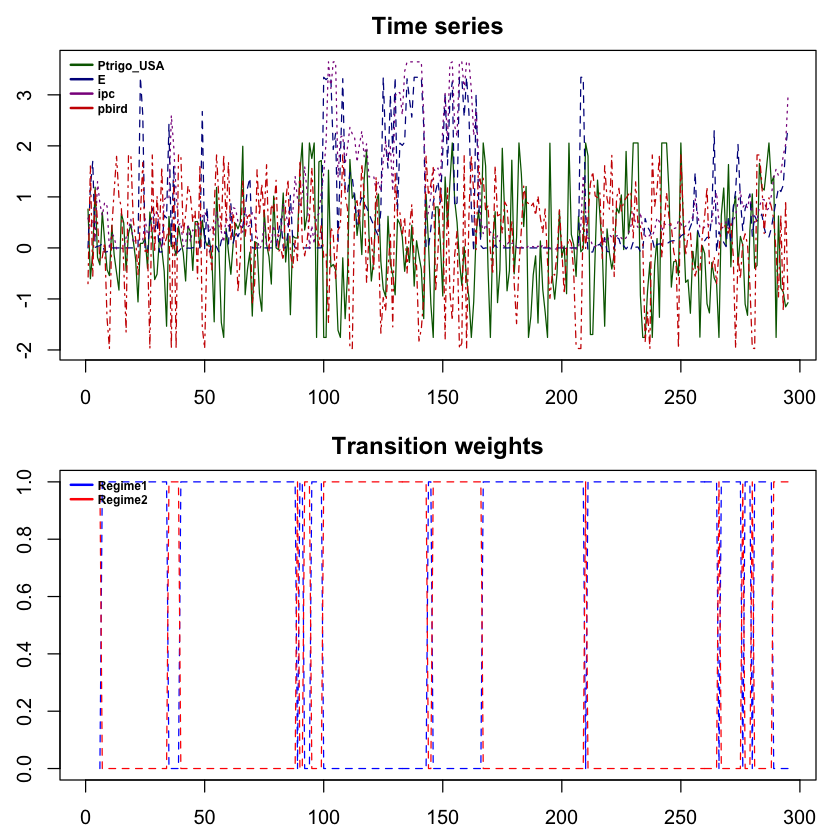

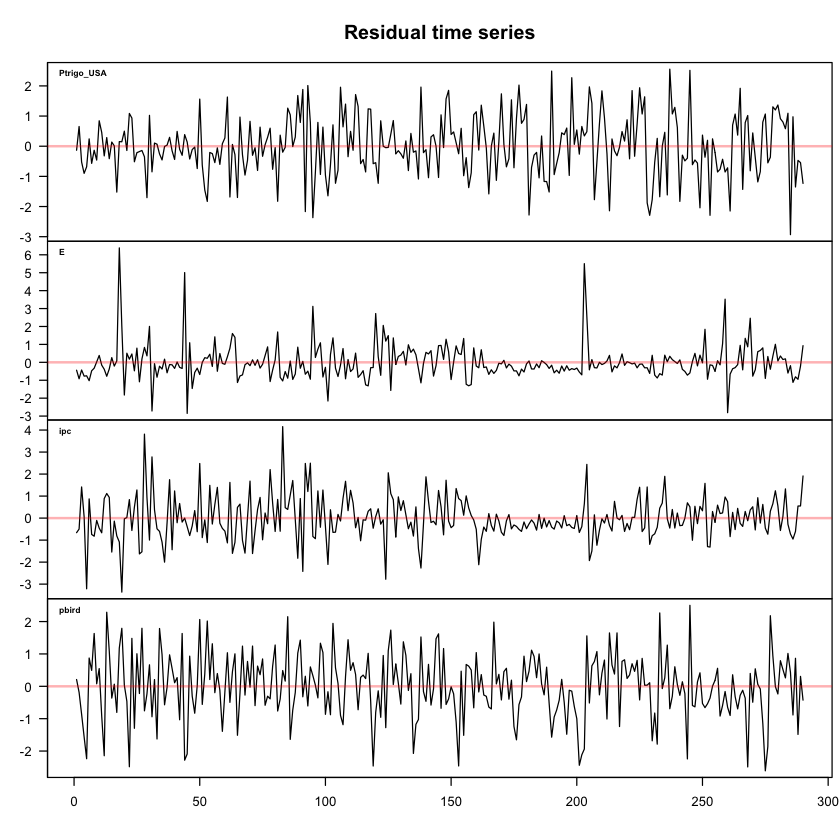

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



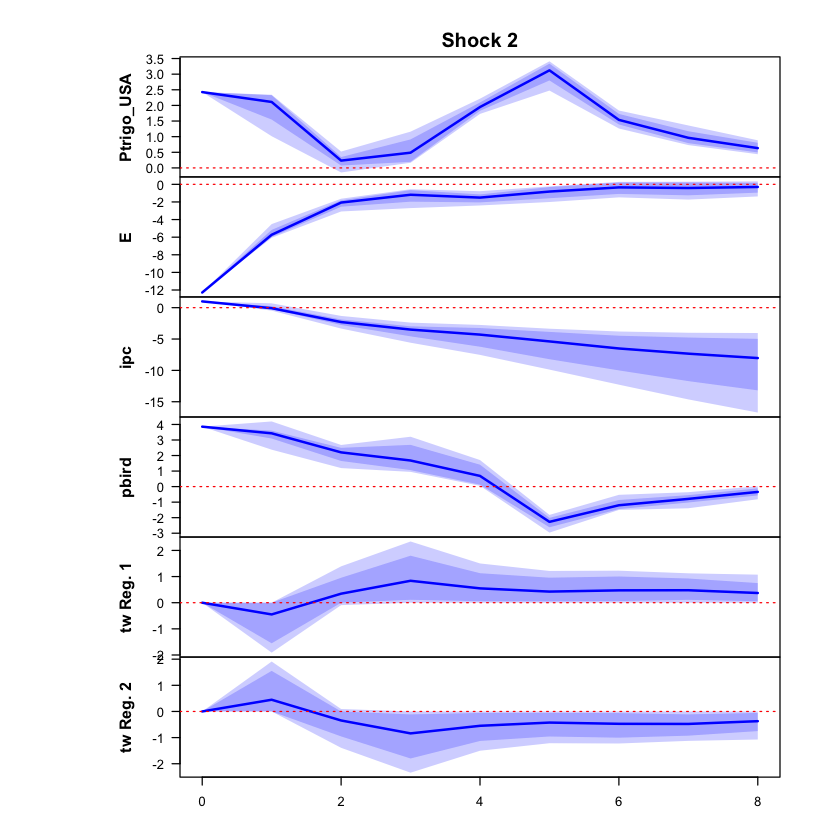

 >>> Linear IRF ( 1  shock units)


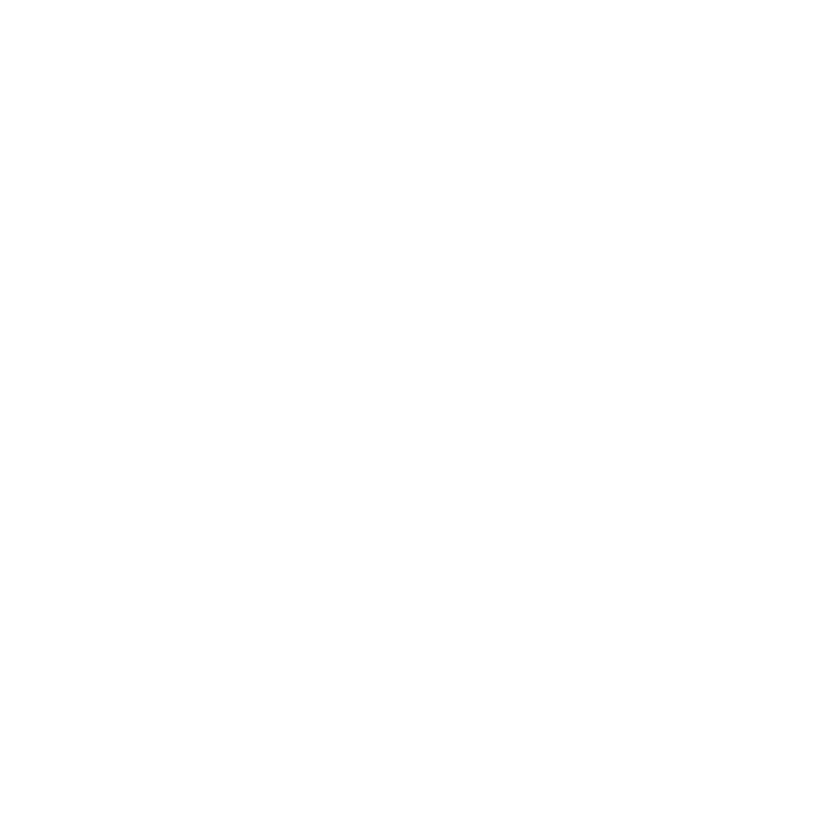

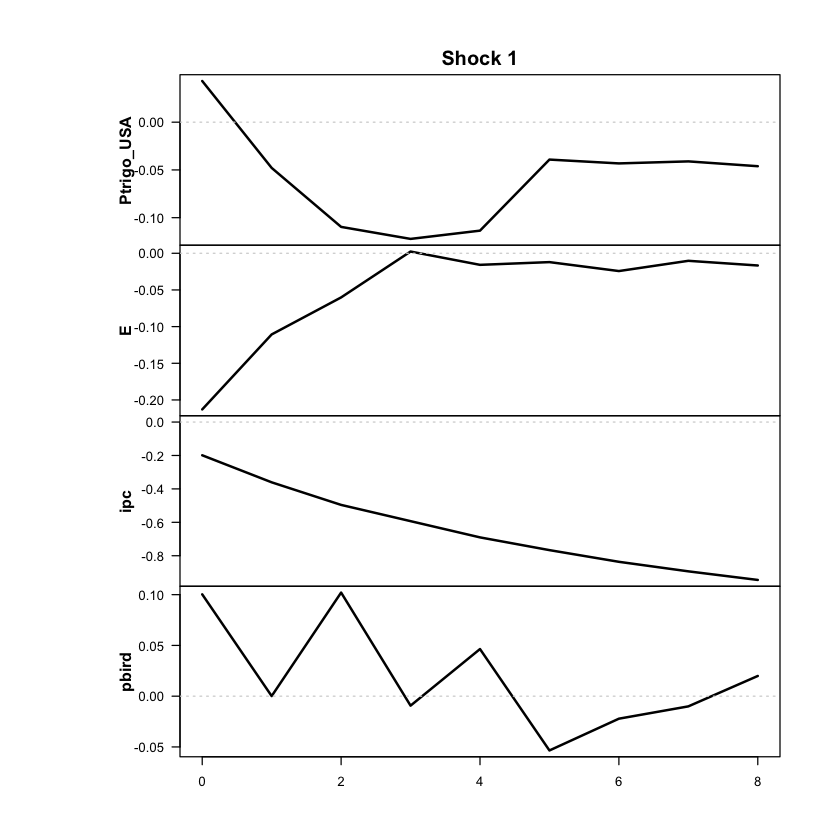

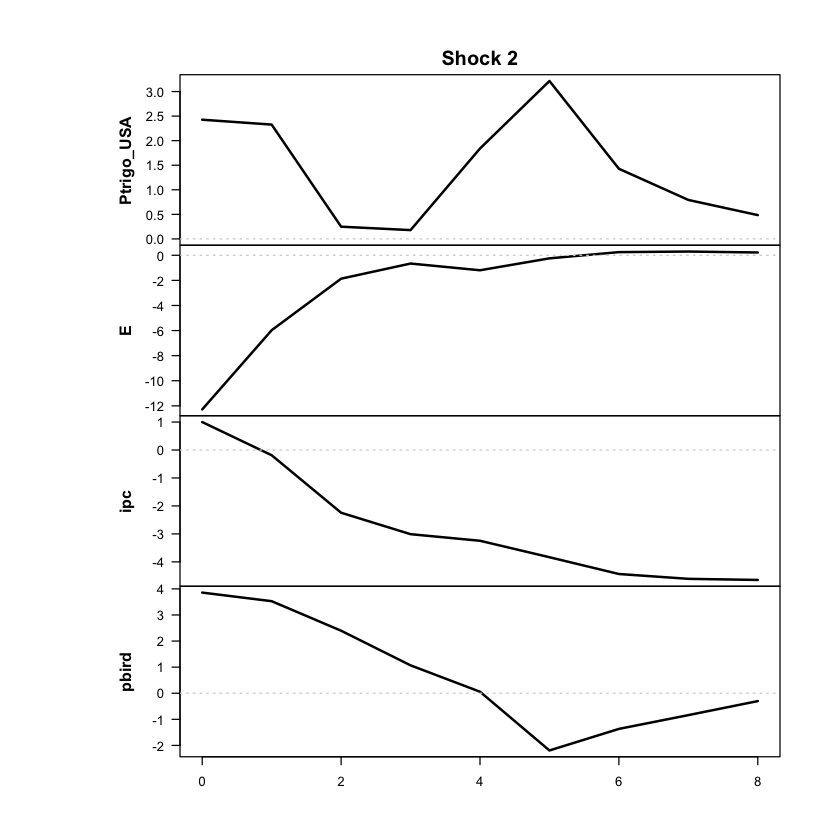

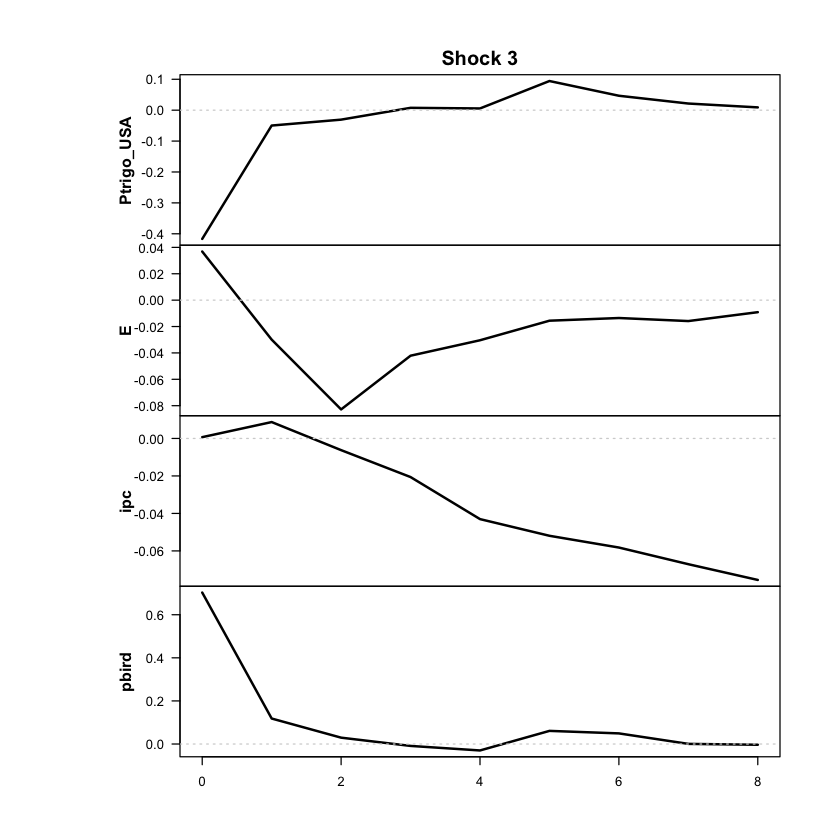

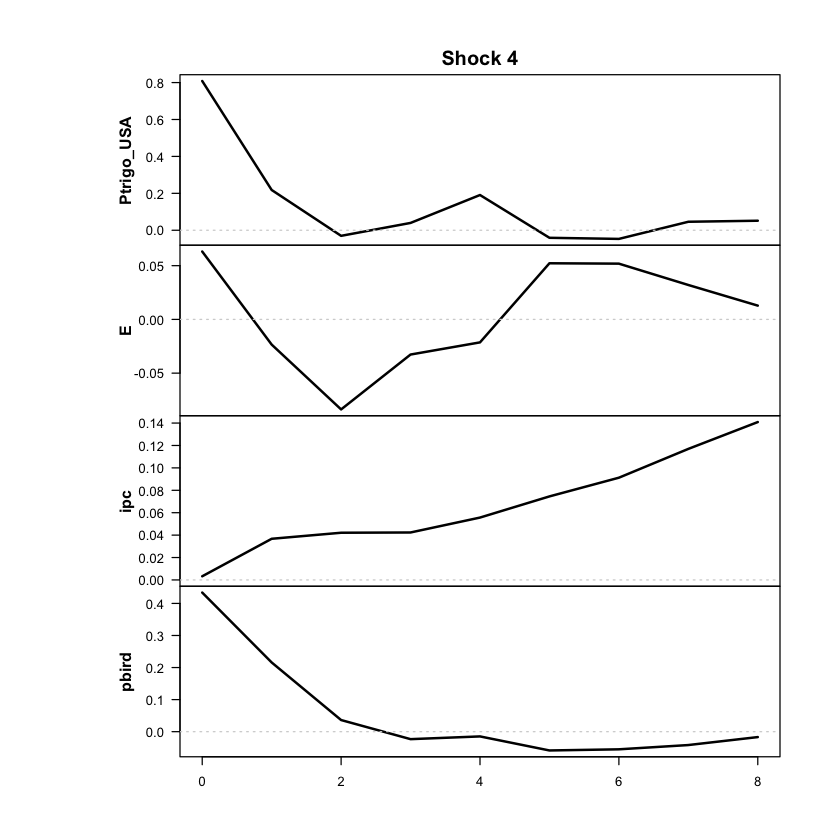

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



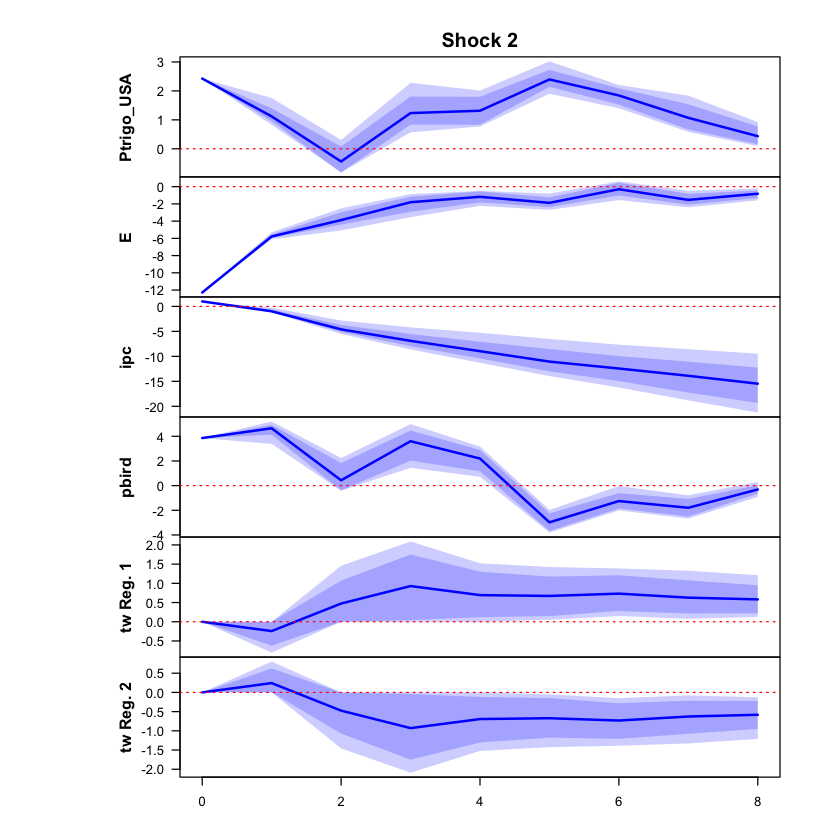

 >>> Linear IRF ( 1  shock units)


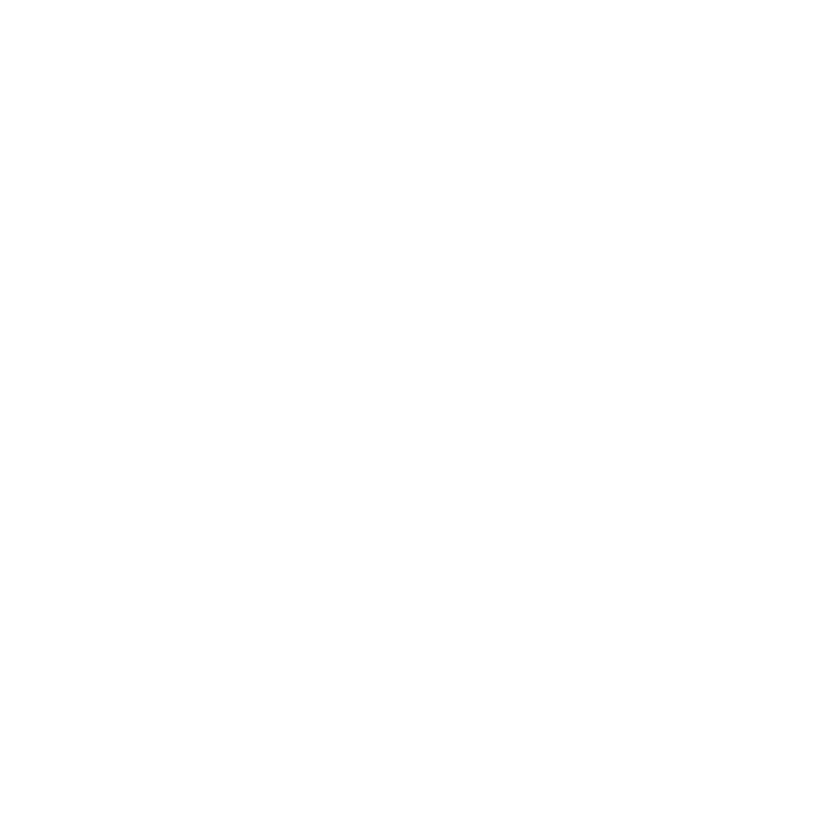

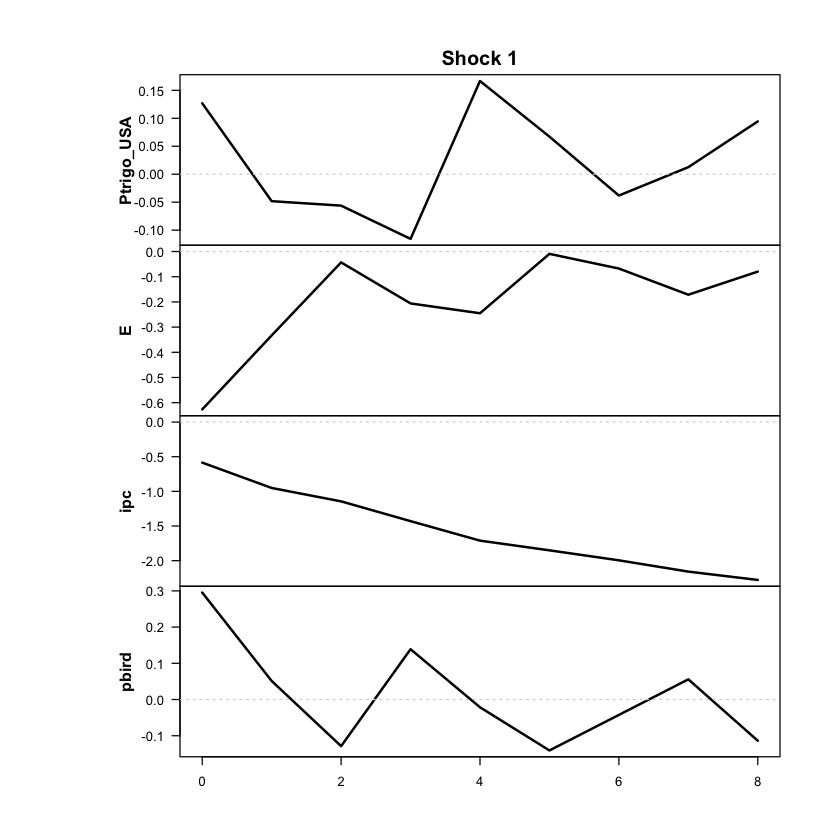

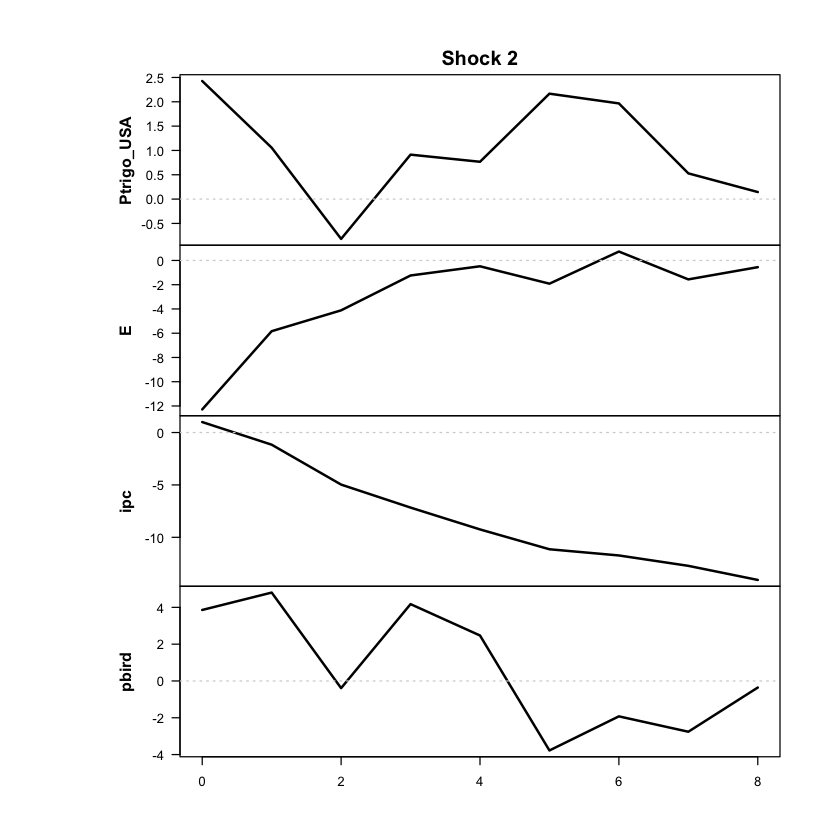

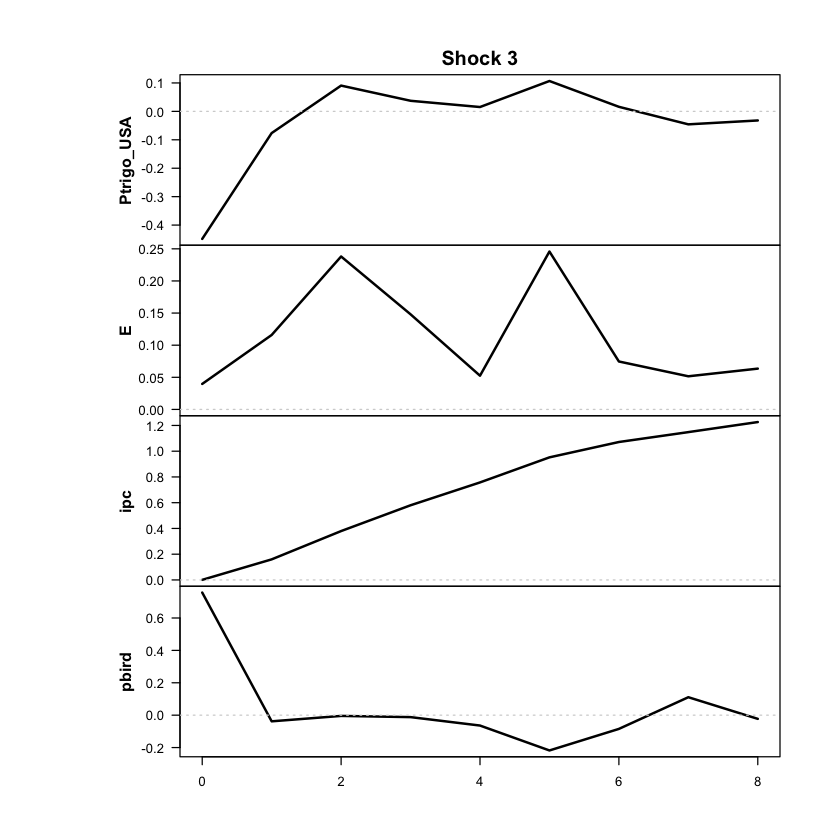

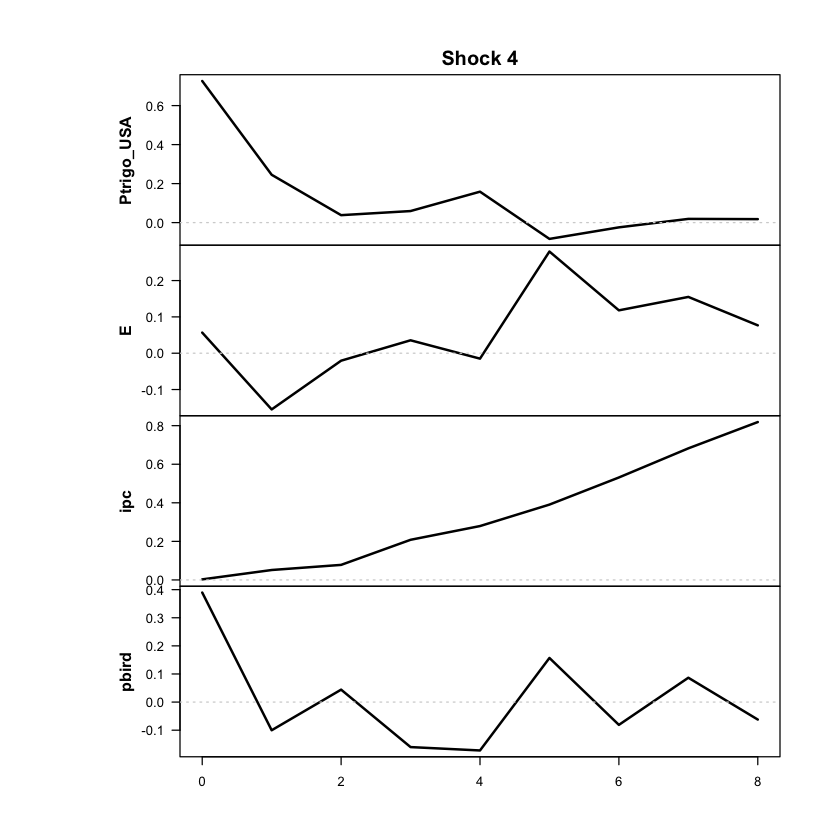

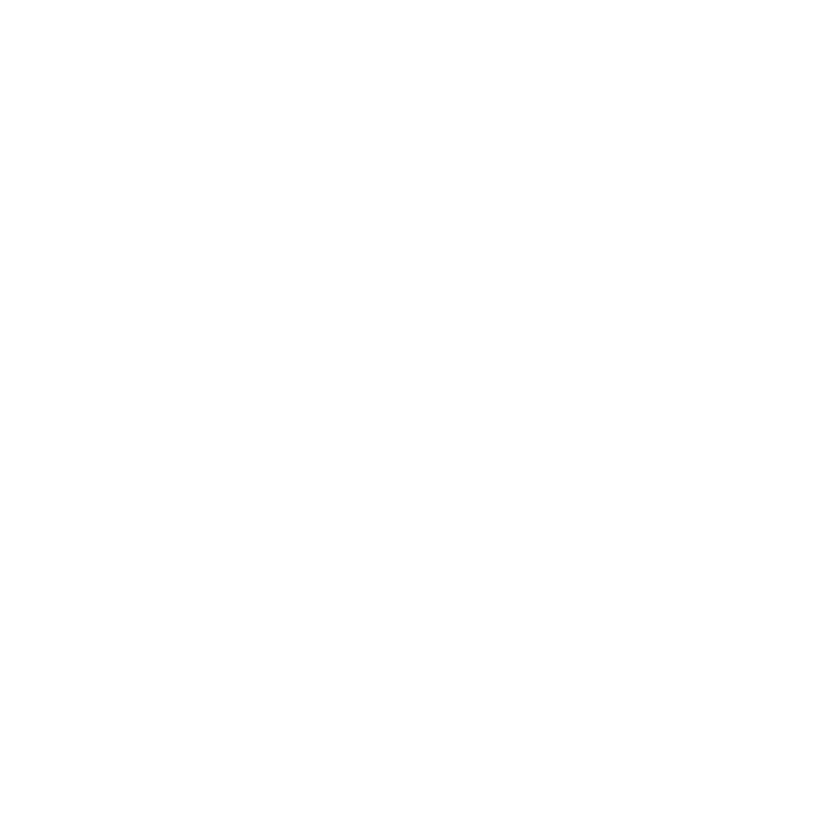

In [19]:
res <- run_threshold_tvar(
  data = df_ERPT_Arg_capped,
  endog = c("Ptrigo_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual' o mensual
  feature_lag = 5,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Ptrigo_USA","ipc","pbird")
  run_tests = TRUE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [20]:
print_passthrough(res, endog = c("Ptrigo_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0814
1         1       0.0070
2         2       0.1865
3         3       0.2845
4         4       0.3495
5         5       0.4379
6         6       0.5295
7         7       0.5969
8         8       0.6541

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.0814
2         1       0.0152
3         2       0.1826
4         3       0.2450
5         4       0.2642
6         5       0.3121
7         6       0.3610
8         7       0.3750
9         8       0.3783

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0814
1         1       0.0797
2         2       0.3743
3         3       0.5612
4         4       0.7296
5         5       0.8994
6         6       1.0121
7         7       1.1307
8         8       1.2592

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Ptrigo_USA: 
   2.5%   10%  mean   90% 97.5%
0 -0.77 -0.77 -0.77 -0.77 -0.77
1  1.83  1.88  1.91  1.95  2.18
2 -1.13 -1.10 -1.02 -0.86 -0.30
3  0.01  0.09  0.21  0.43  0.78
4  0.25  0.32  0.39  0.54  0.74
5 -0.56 -0.53 -0.41 -0.23  0.00
6 -0.21 -0.16 -0.09  0.01  0.11
7 -0.51 -0.43 -0.35 -0.25 -0.17
8 -0.41 -0.34 -0.24 -0.14 -0.05

The response of E: 
   2.5%   10%  mean   90% 97.5%
0 15.25 15.25 15.25 15.25 15.25
1  4.25  4.66  4.85  4.94  5.14
2  4.01  4.68  5.02  5.14  5.29
3  3.32  3.70  4.07  4.40  4.69
4  0.02  0.35  0.63  0.90  1.33
5  2.11  2.34  2.69  3.02  3.45
6  0.48  0.83  1.12  1.48  1.70
7  0.64  0.94  1.24  1.53  1.90
8  0.68  0.90  1.24  1.62  1.90

The response of ipc: 
  2.5%   10%  mean   90% 97.5%
0 1.00  1.00  1.00  1.00  1.00
1 1.51  1.85  1.91  2.07  2.39
2 4.49  5.01  5.33  5.50  5.84
3 5.19  6.01  6.47  6.87  7.13
4 6.43  7.

## Ejemplo VLSTAR (logistic)

### SOJA

Desvíos usados para escalar:
 Psoja_USA          E        ipc      pbird 
0.08443089 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1425.015

The largest loglik: -1124.727

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1288.076

The largest loglik: -1079.895

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> DIAGNOSTIC PLOTS


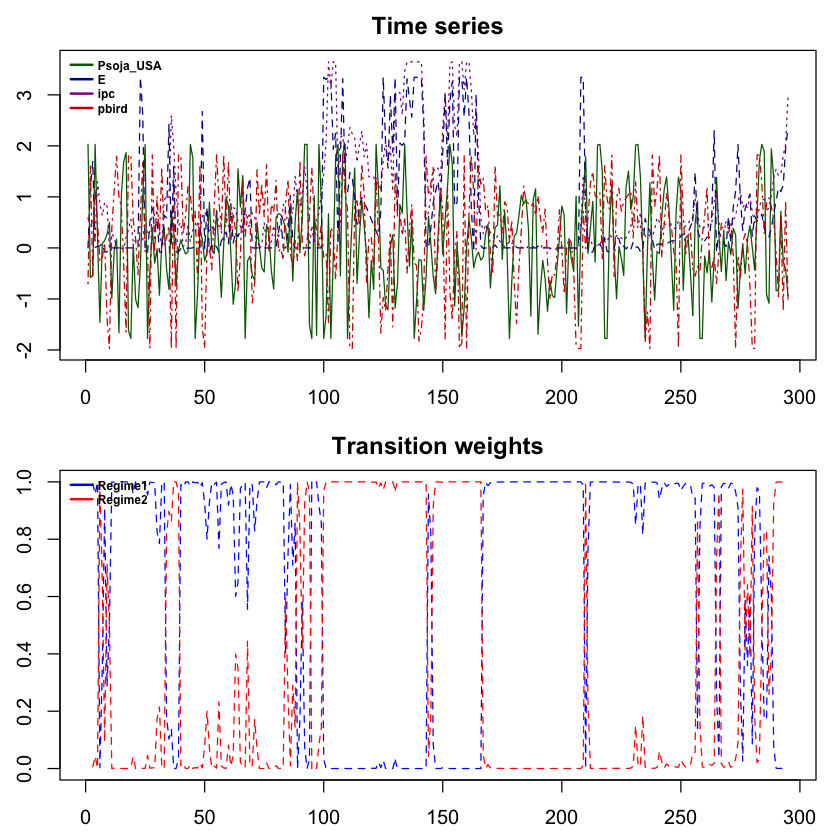

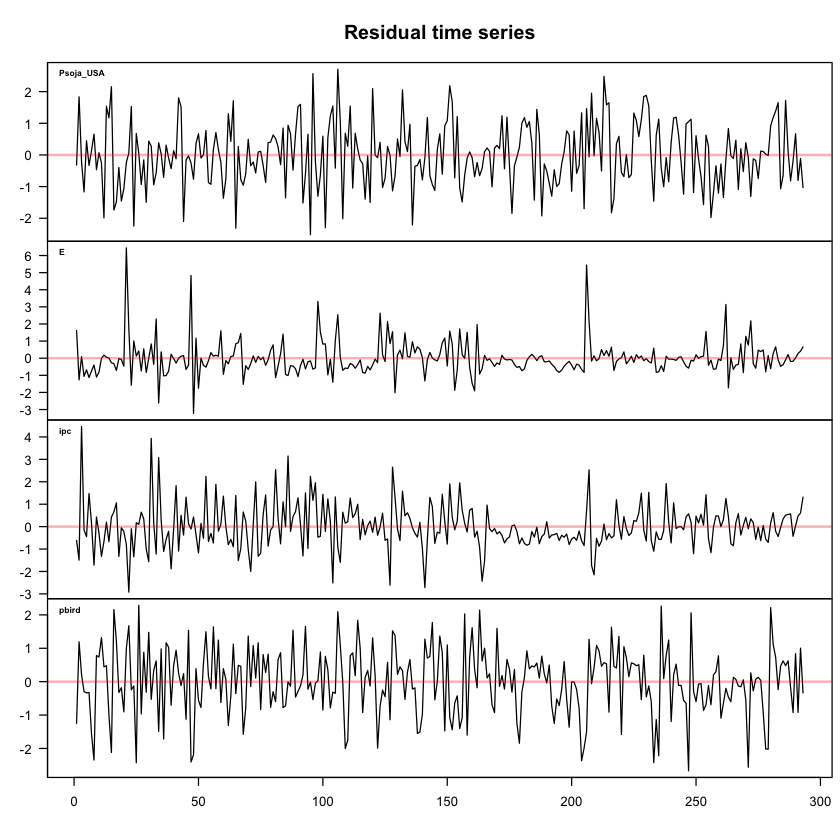

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



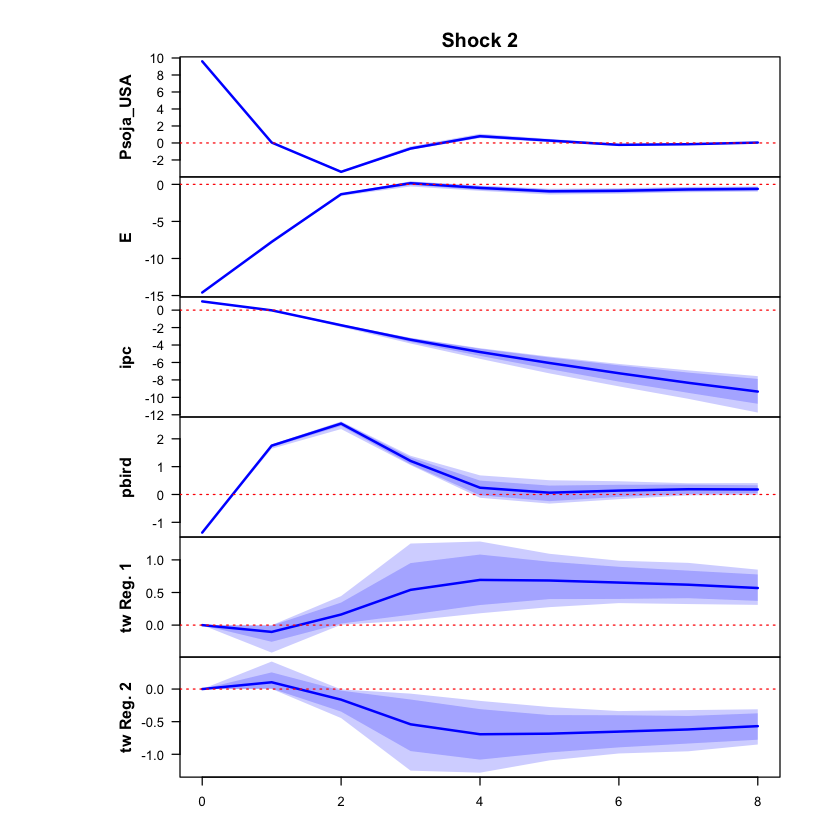

 >>> Linear IRF ( 1  shock units)


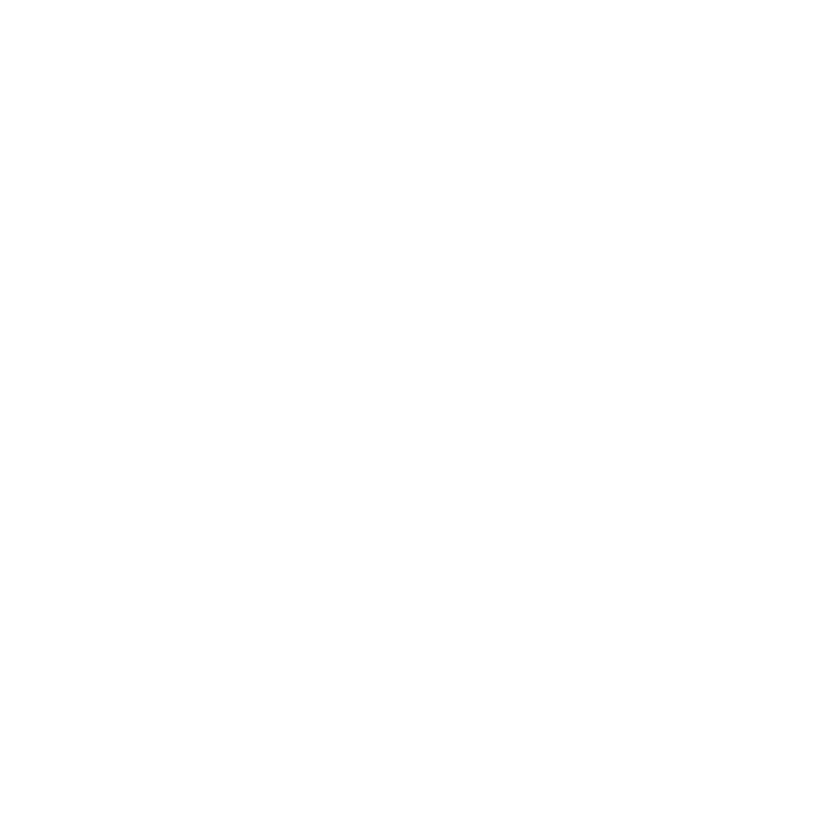

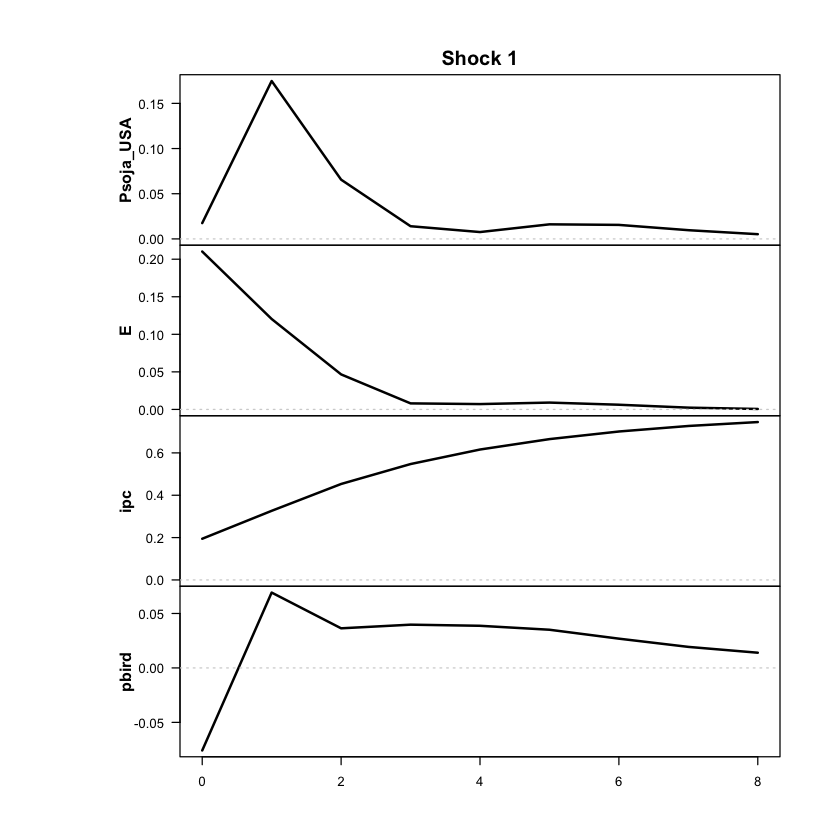

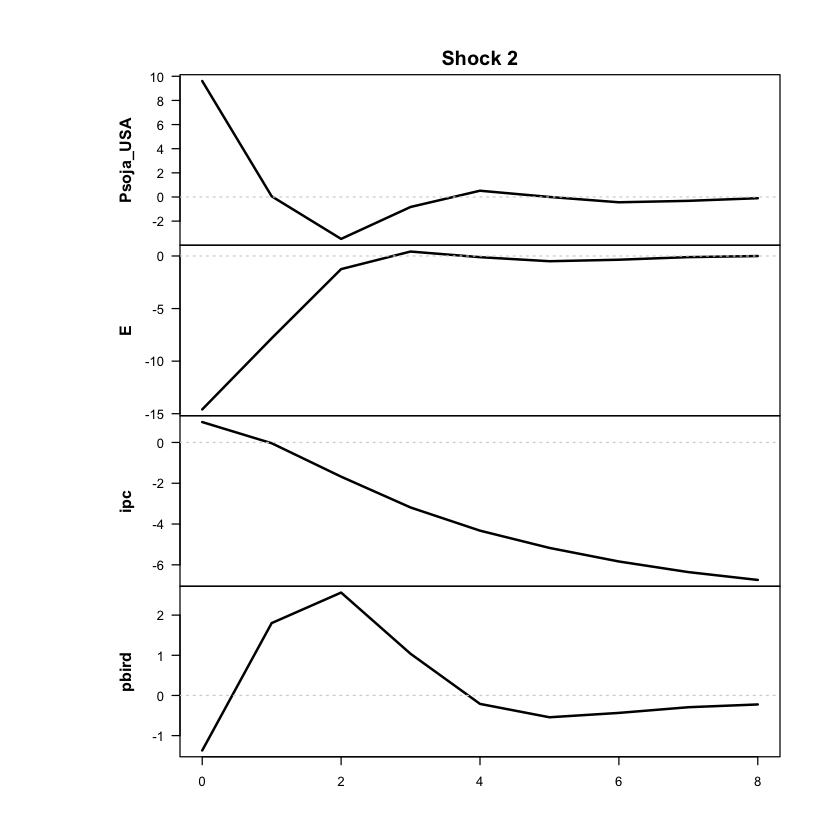

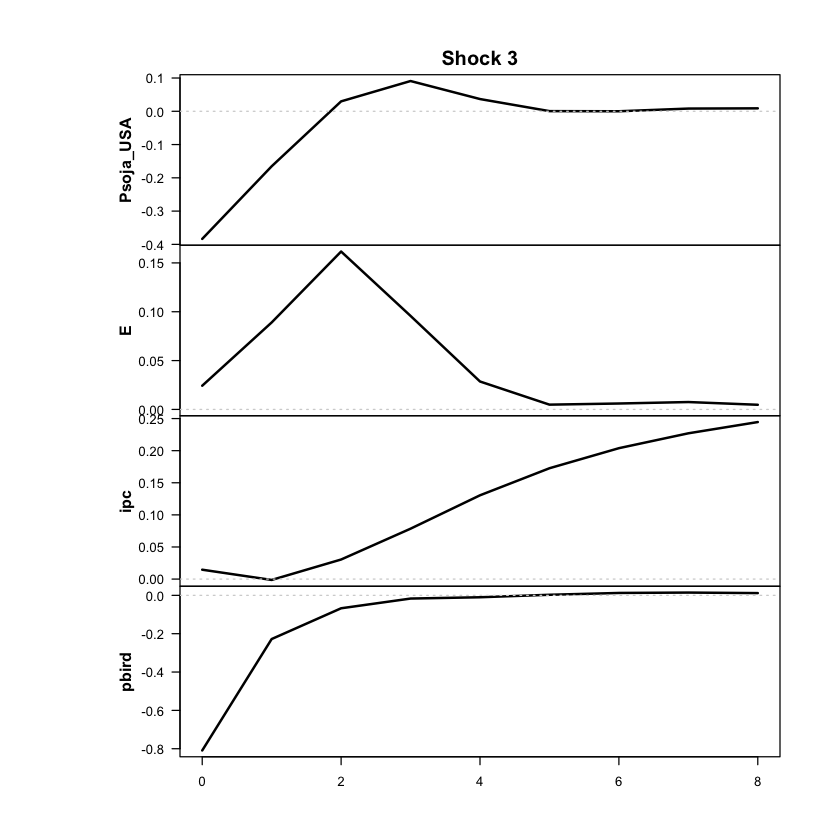

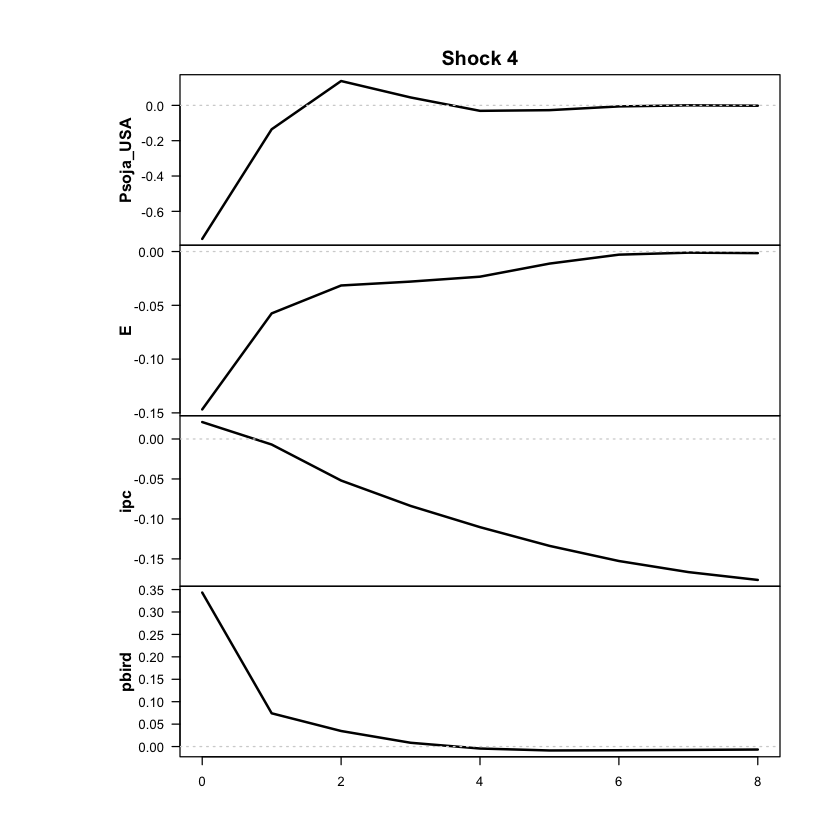

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



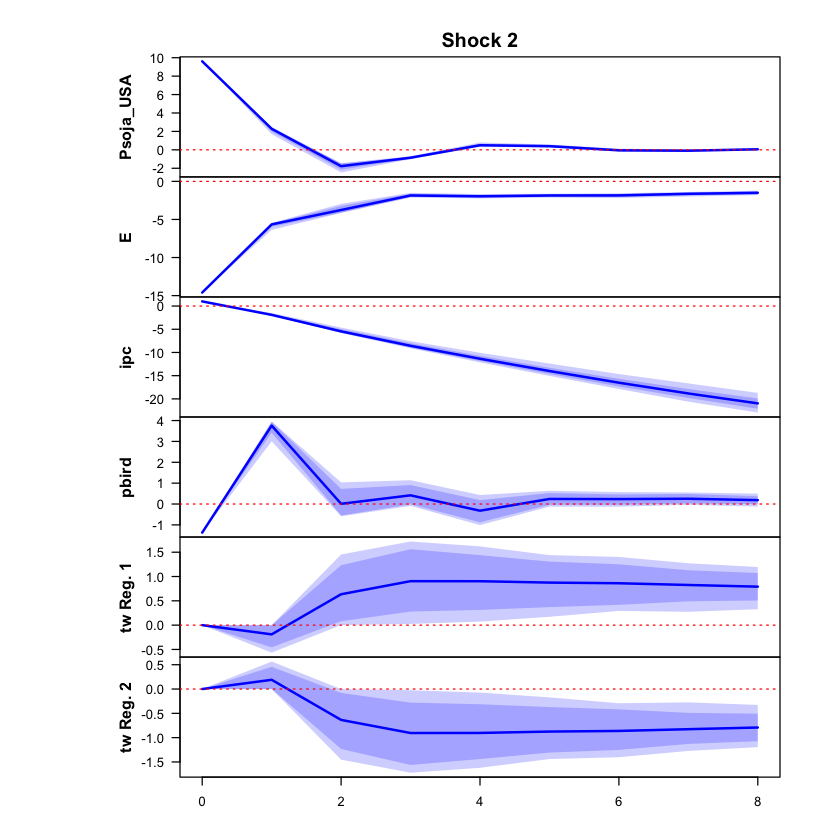

 >>> Linear IRF ( 1  shock units)


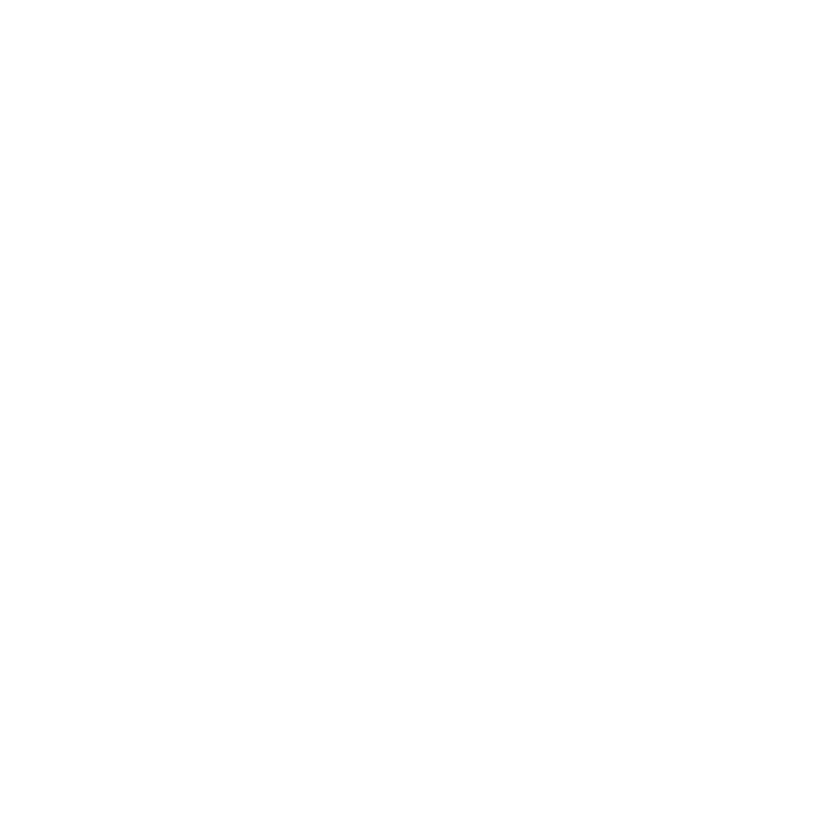

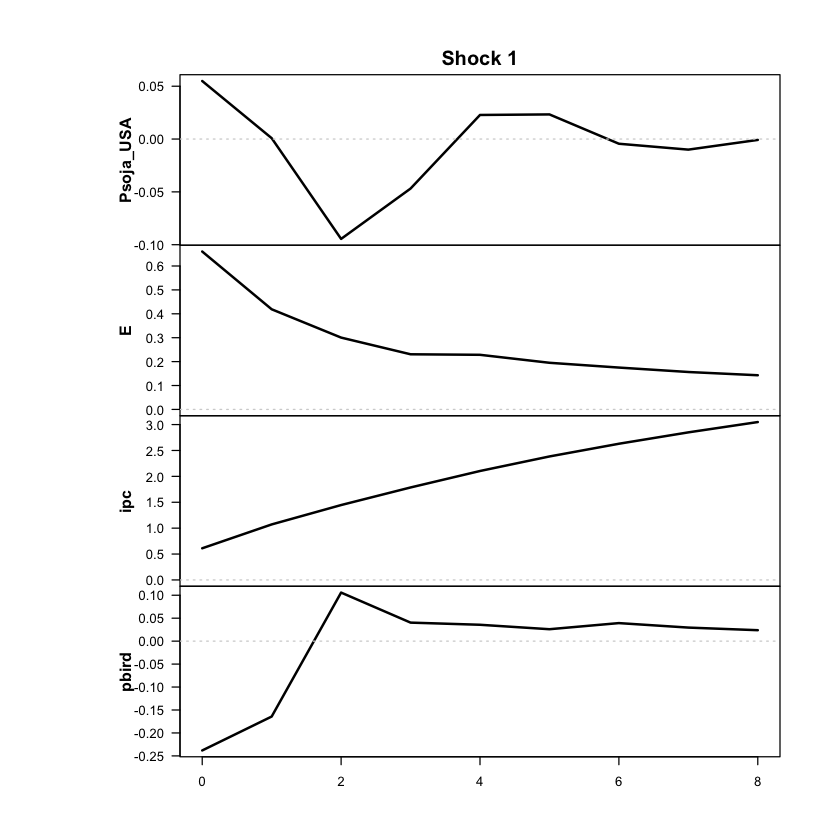

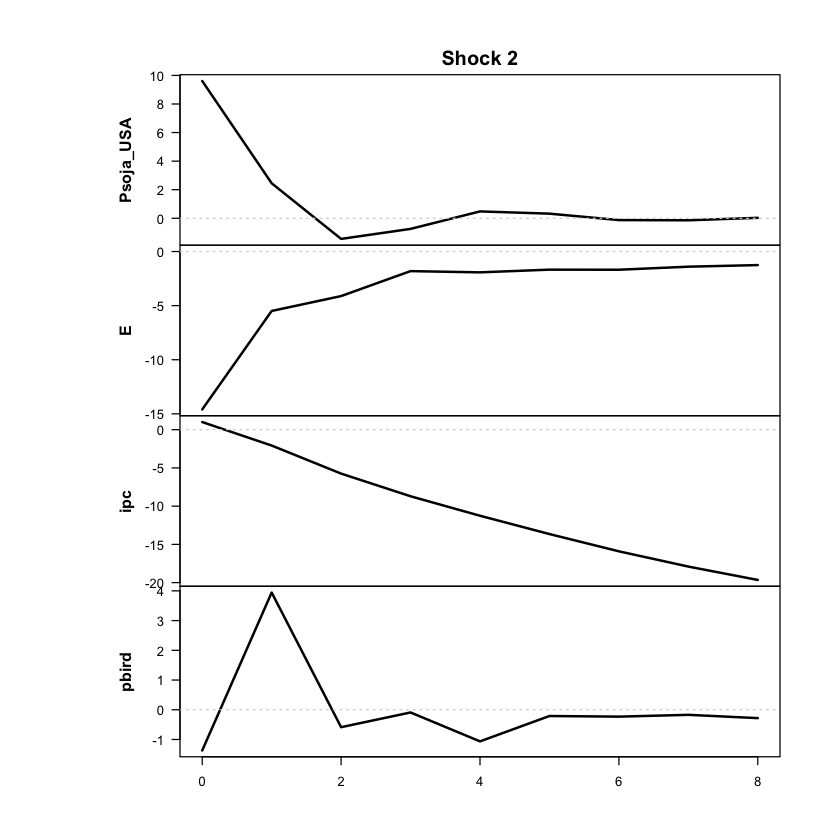

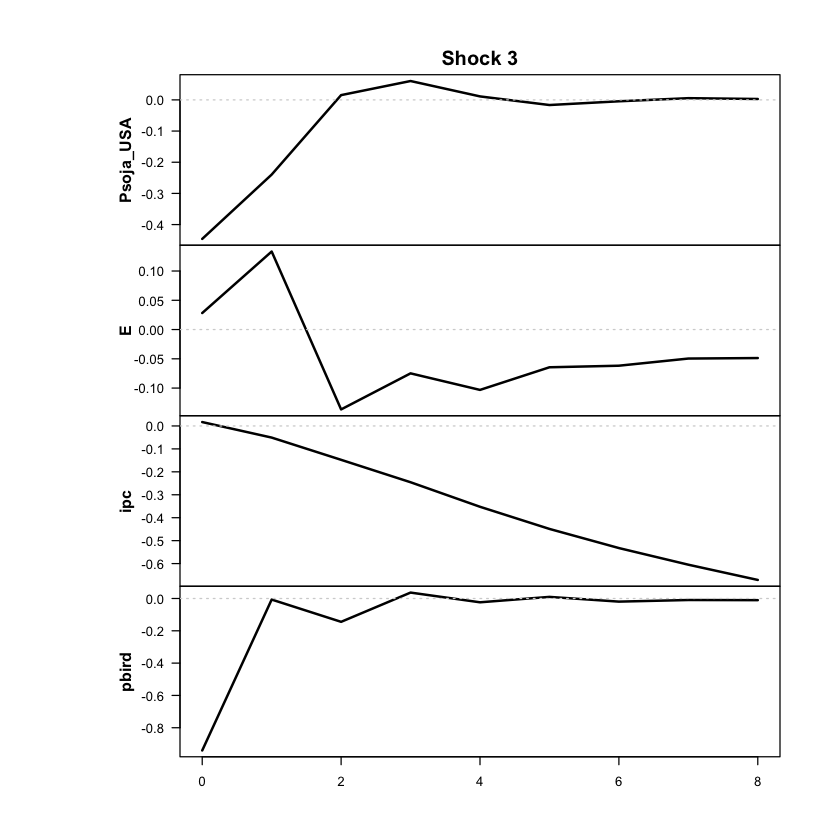

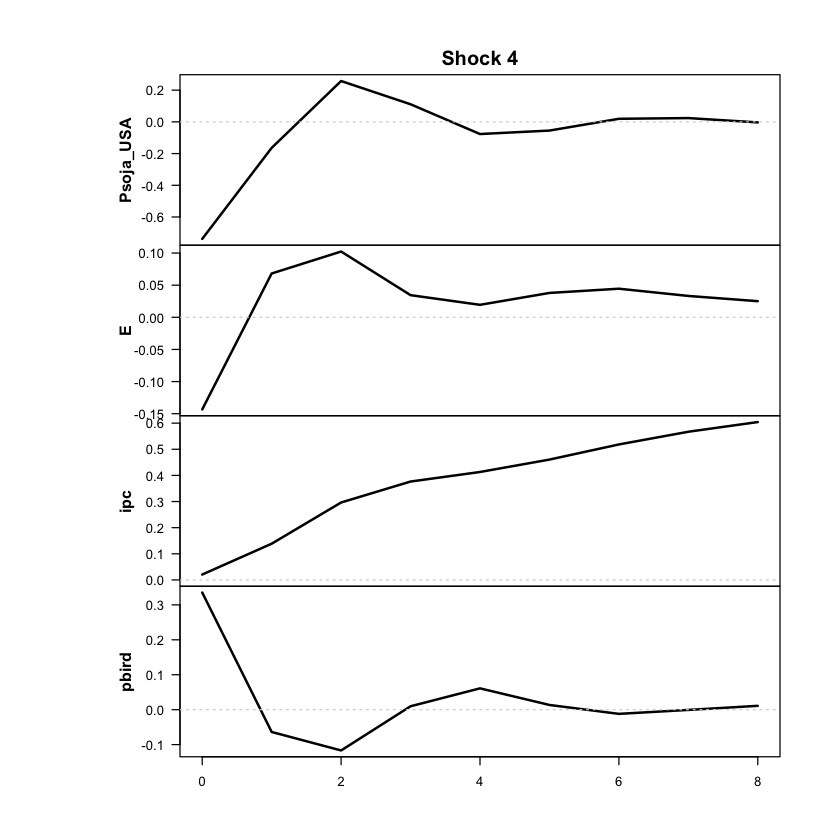

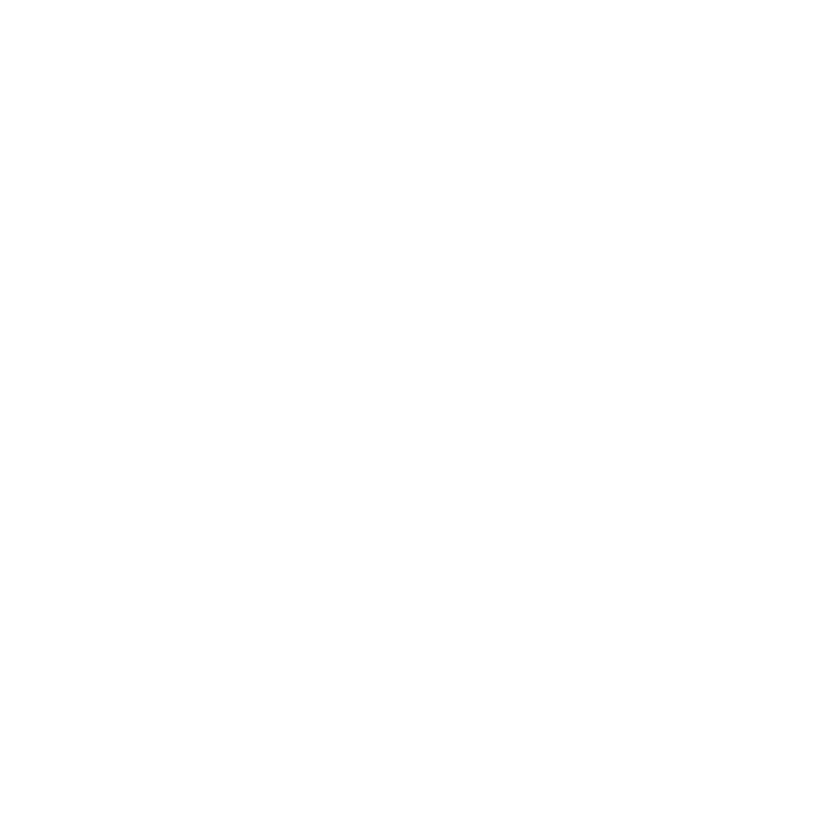

In [21]:
res <- run_vlstar (
  data = df_ERPT_Arg_capped,
  endog = c("Psoja_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual'
  feature_lag = 2,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Psoja_USA","ipc","pbird")
  run_tests = FALSE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [22]:
print_passthrough(res, endog = c("Psoja_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0685
1         1       0.0016
2         2       0.1185
3         3       0.2325
4         4       0.3291
5         5       0.4153
6         6       0.4958
7         7       0.5709
8         8       0.6399

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.0685
2         1       0.0026
3         2       0.1149
4         3       0.2184
5         4       0.2964
6         5       0.3544
7         6       0.4000
8         7       0.4356
9         8       0.4620

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0685
1         1       0.1304
2         2       0.3739
3         3       0.5868
4         4       0.7779
5         5       0.9591
6         6       1.1317
7         7       1.2907
8         8       1.4368

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Psoja_USA: 
   2.5%   10%  mean   90% 97.5%
0  9.61  9.61  9.61  9.61  9.61
1 -0.04  0.03  0.05  0.07  0.09
2 -3.47 -3.46 -3.39 -3.29 -3.21
3 -0.81 -0.78 -0.64 -0.48 -0.37
4  0.60  0.63  0.81  1.00  1.08
5  0.11  0.15  0.29  0.43  0.48
6 -0.33 -0.30 -0.22 -0.13 -0.07
7 -0.24 -0.21 -0.14 -0.07 -0.03
8 -0.03 -0.01  0.05  0.12  0.19

The response of E: 
    2.5%    10%   mean    90%  97.5%
0 -14.59 -14.59 -14.59 -14.59 -14.59
1  -7.83  -7.83  -7.76  -7.65  -7.42
2  -1.58  -1.45  -1.34  -1.25  -1.24
3  -0.32  -0.14   0.14   0.36   0.40
4  -0.89  -0.78  -0.49  -0.23  -0.17
5  -1.34  -1.23  -0.94  -0.68  -0.61
6  -1.33  -1.14  -0.88  -0.61  -0.52
7  -1.14  -0.99  -0.71  -0.46  -0.36
8  -1.02  -0.90  -0.63  -0.40  -0.30

The response of ipc: 
    2.5%    10%  mean   90% 97.5%
0   1.00   1.00  1.00  1.00  1.00
1  -0.09  -0.05 -0.02  0.02  0.07
2  -2.04  -1.8

Desvíos usados para escalar:
 Psoja_USA          E        ipc      pbird 
0.08443089 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1429.015

The largest loglik: -1117.151

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1288.607

The largest loglik: -1047.729

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> DIAGNOSTIC PLOTS


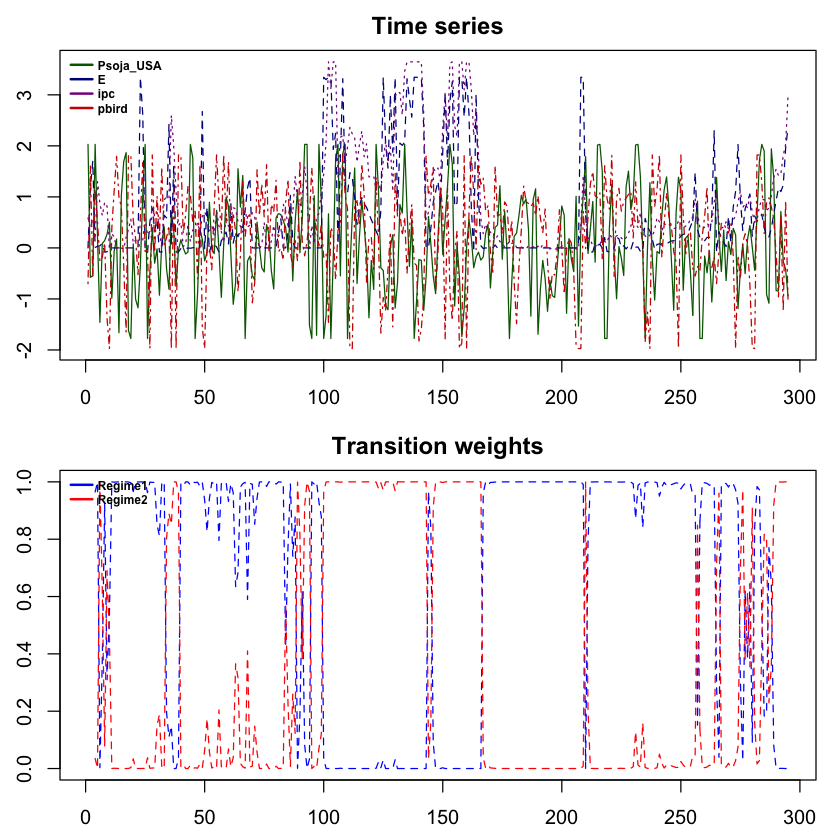

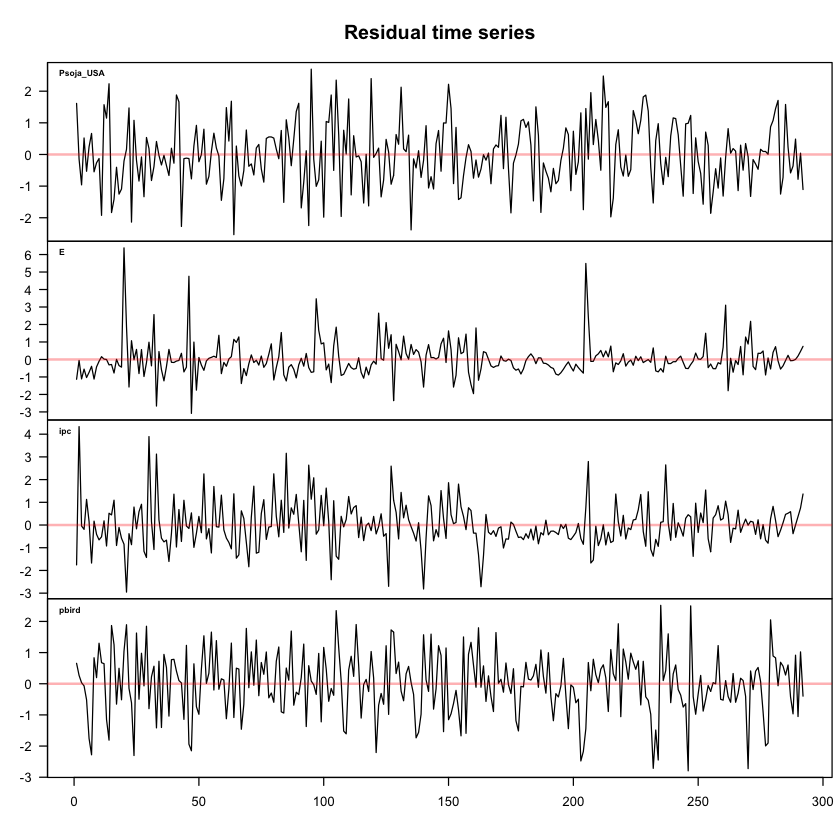

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



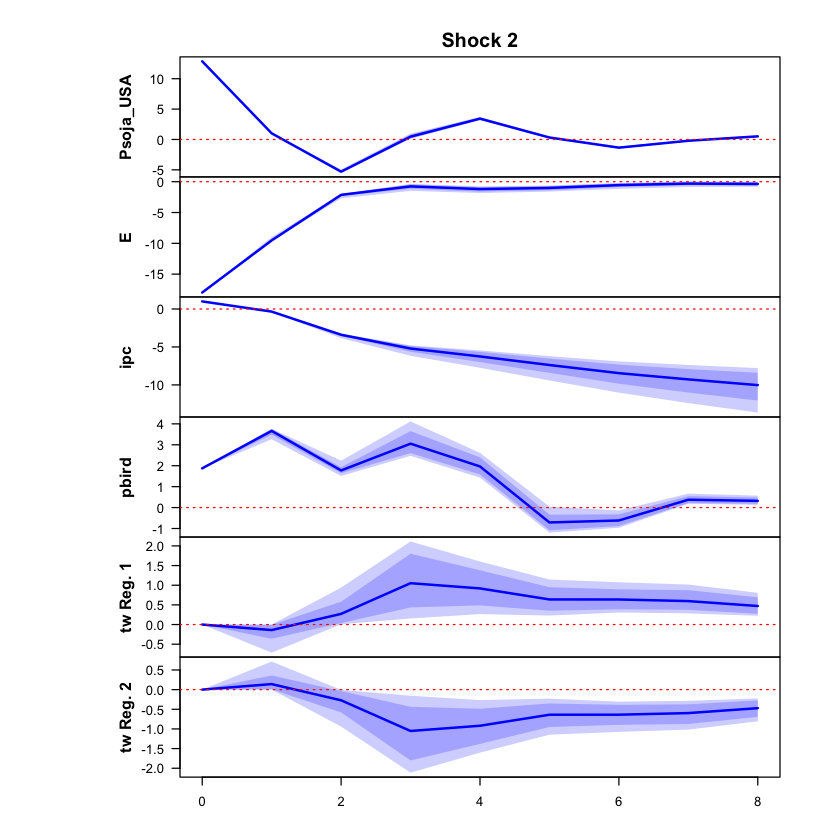

 >>> Linear IRF ( 1  shock units)


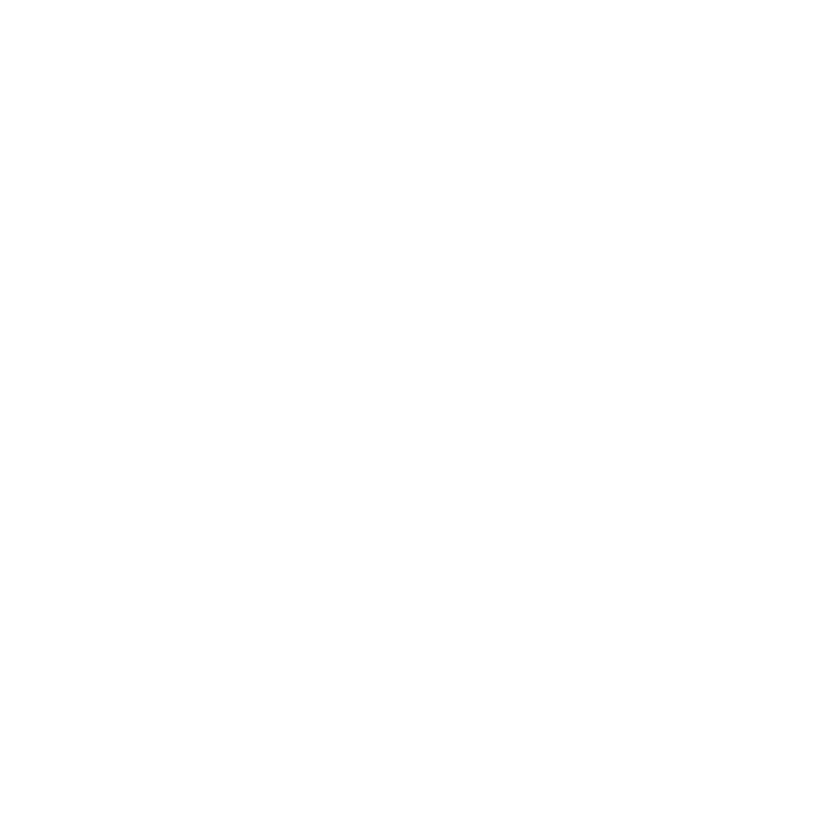

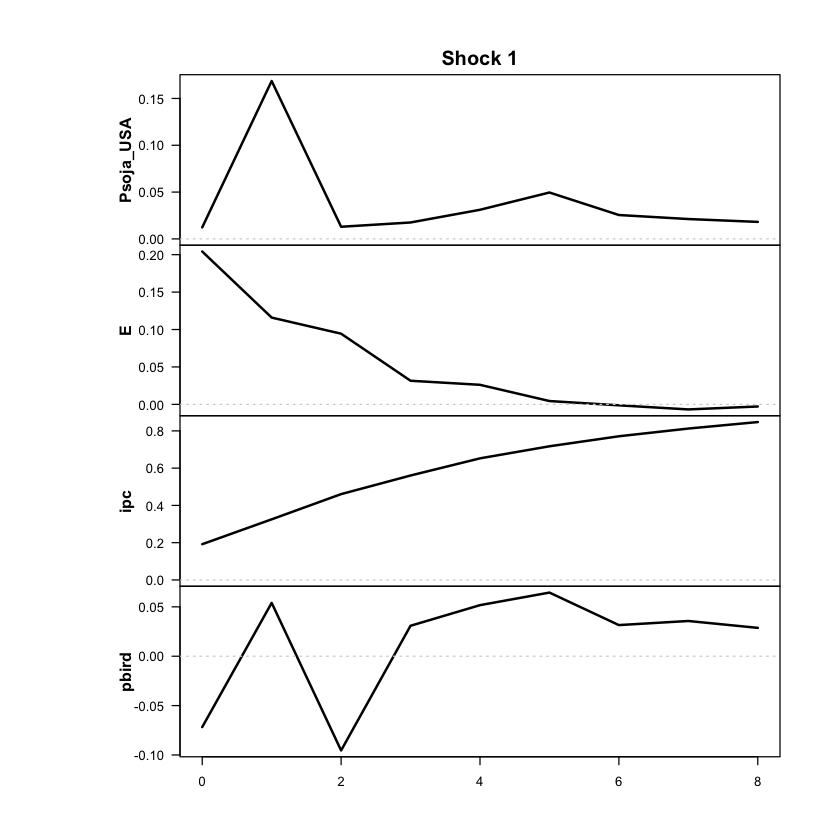

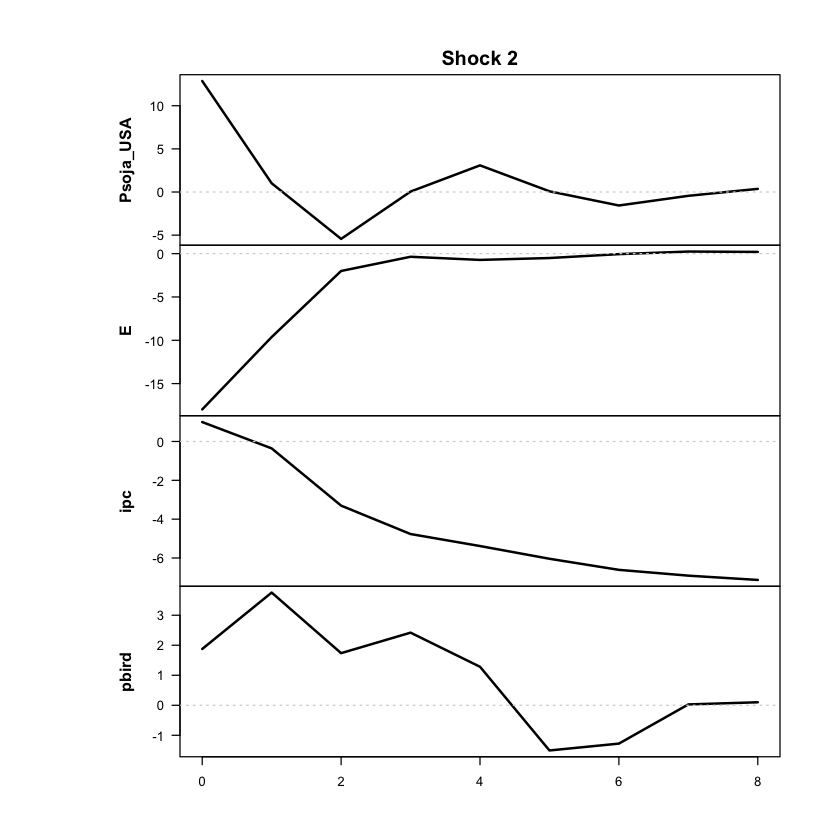

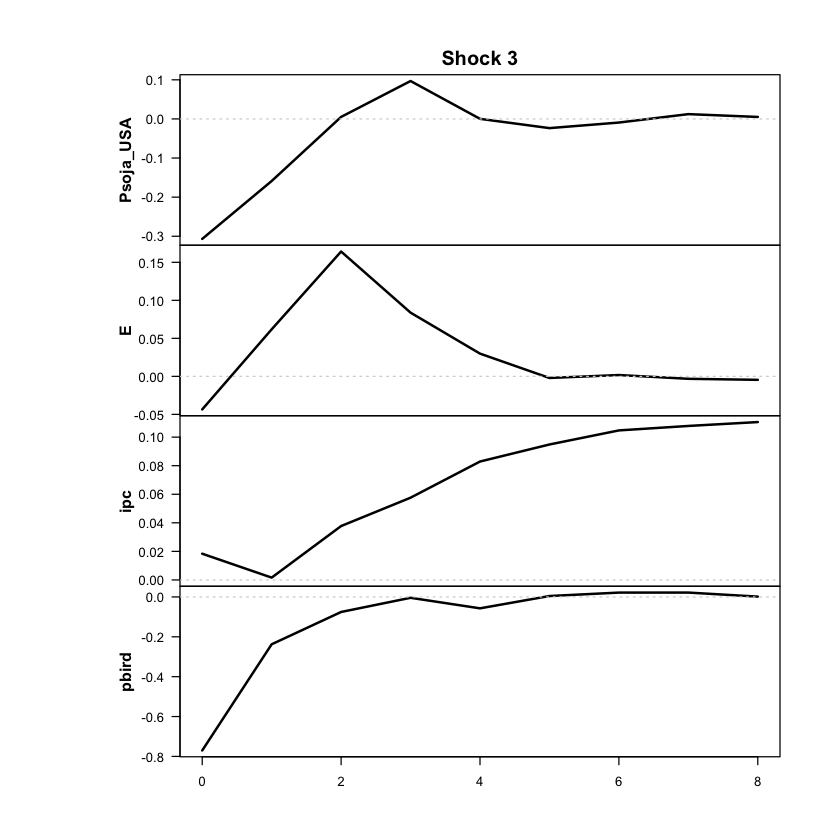

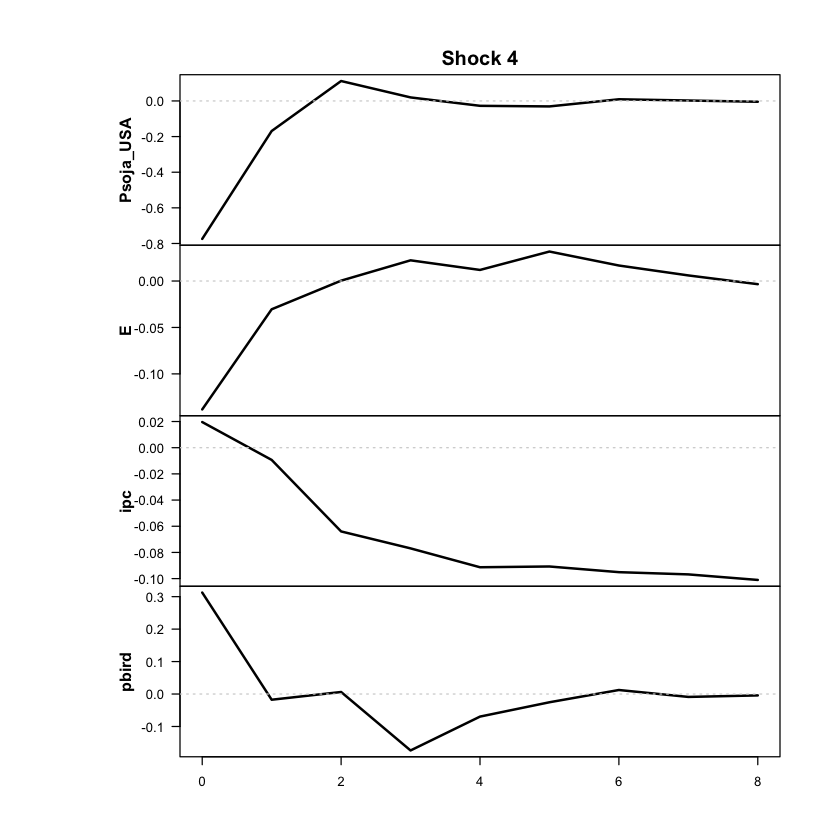

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



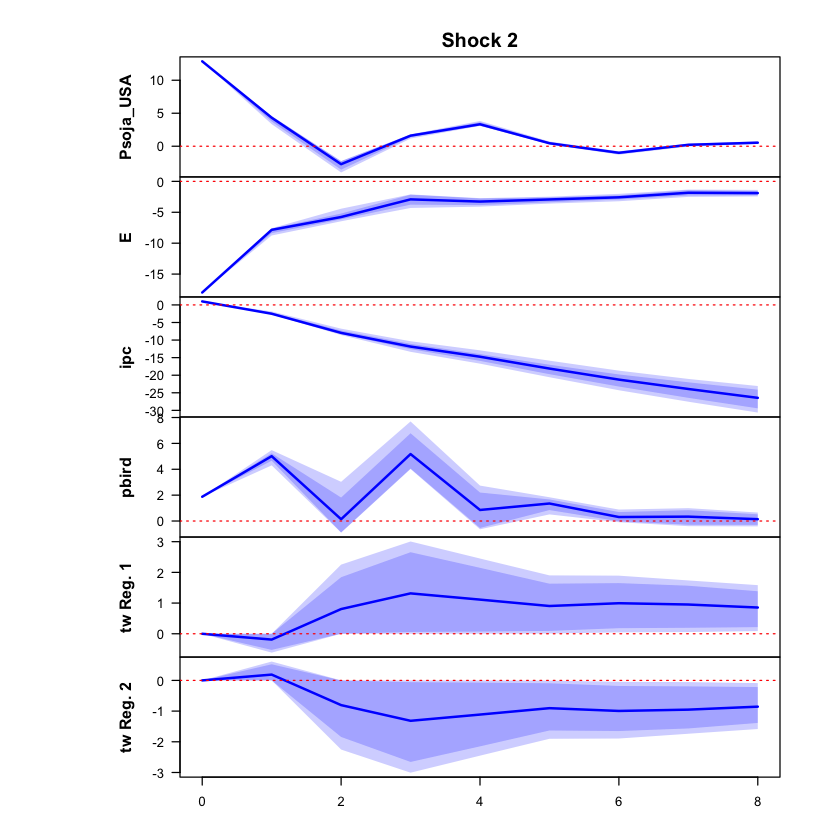

 >>> Linear IRF ( 1  shock units)


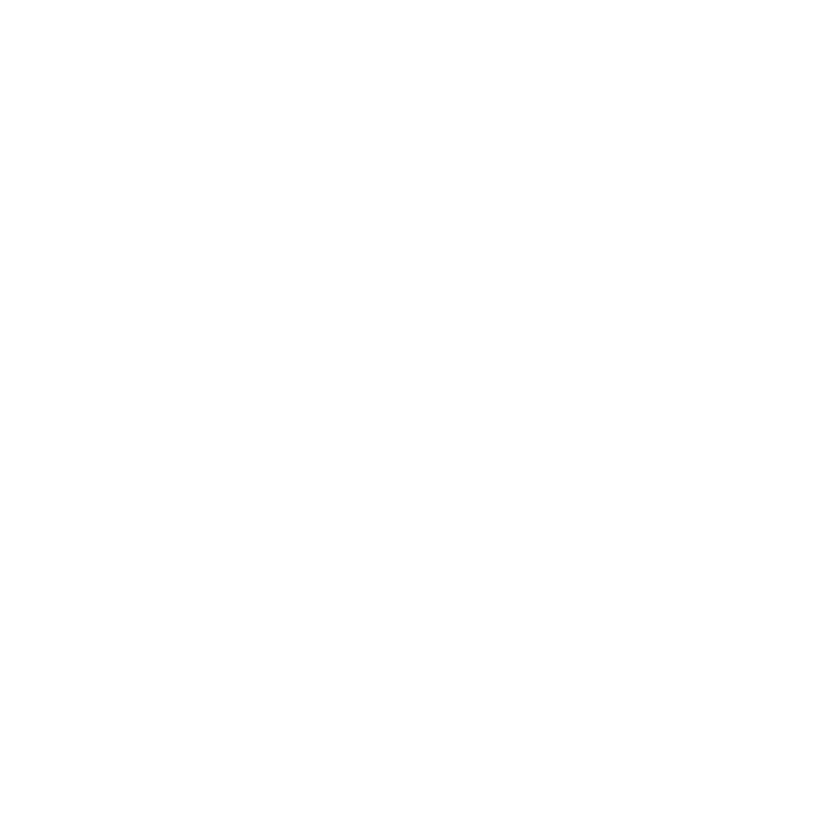

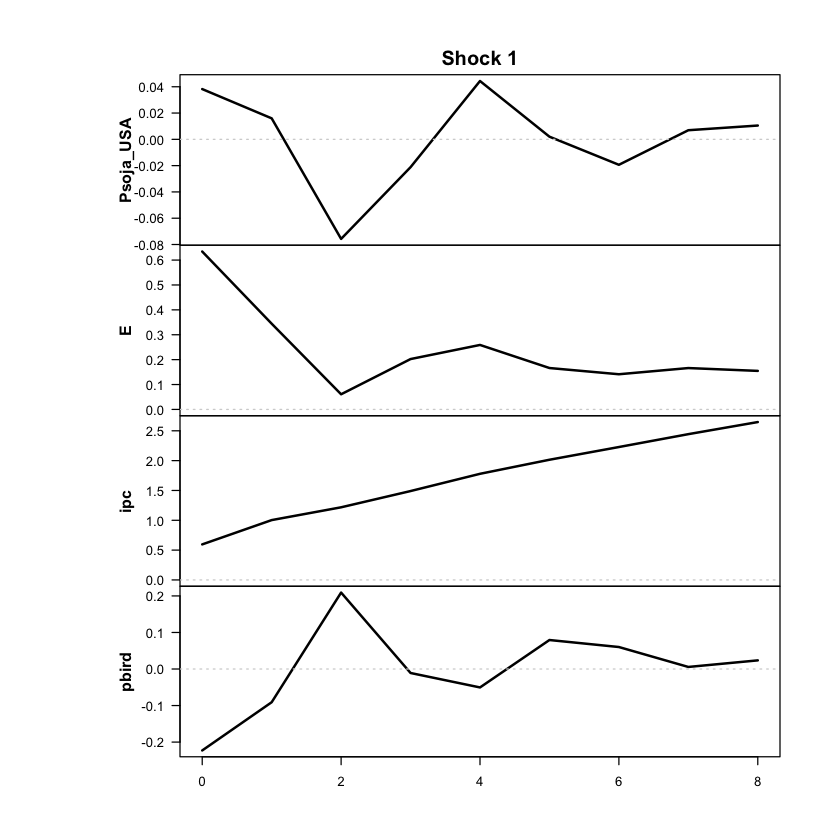

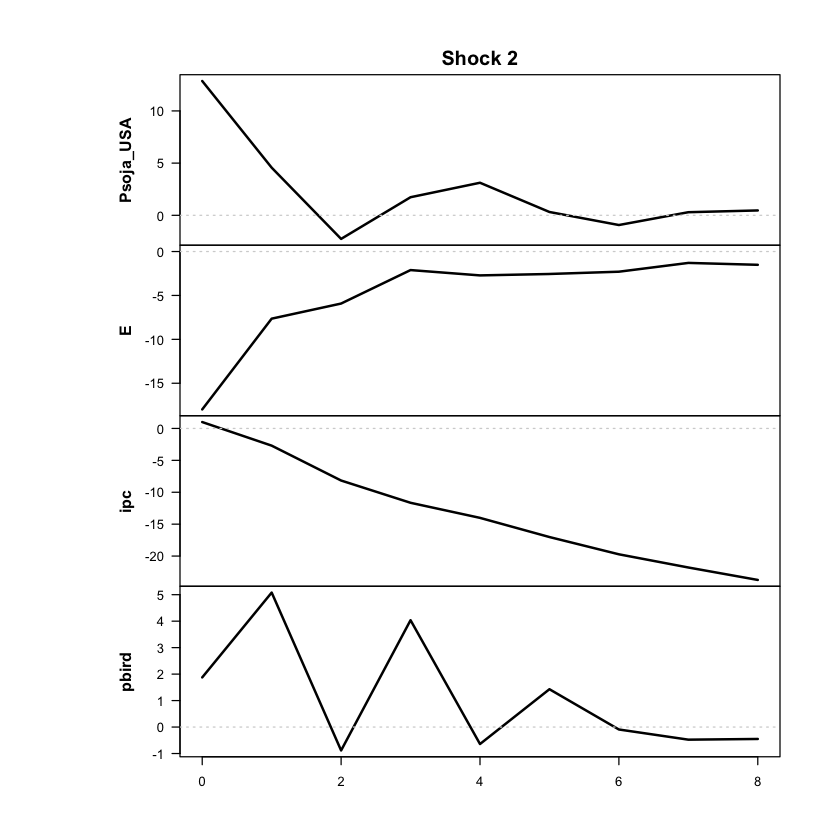

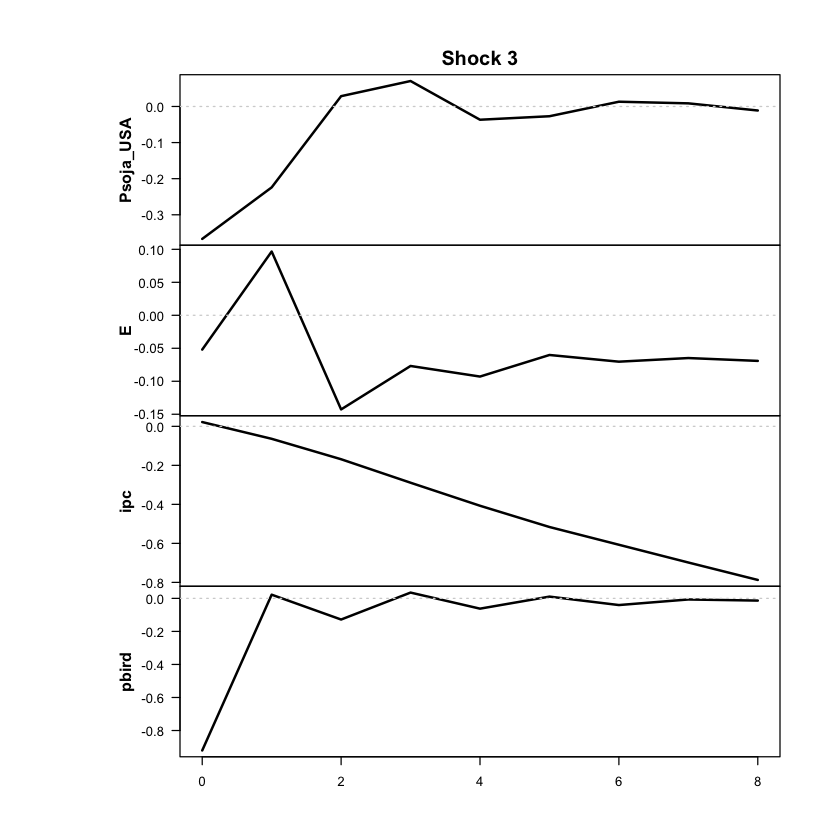

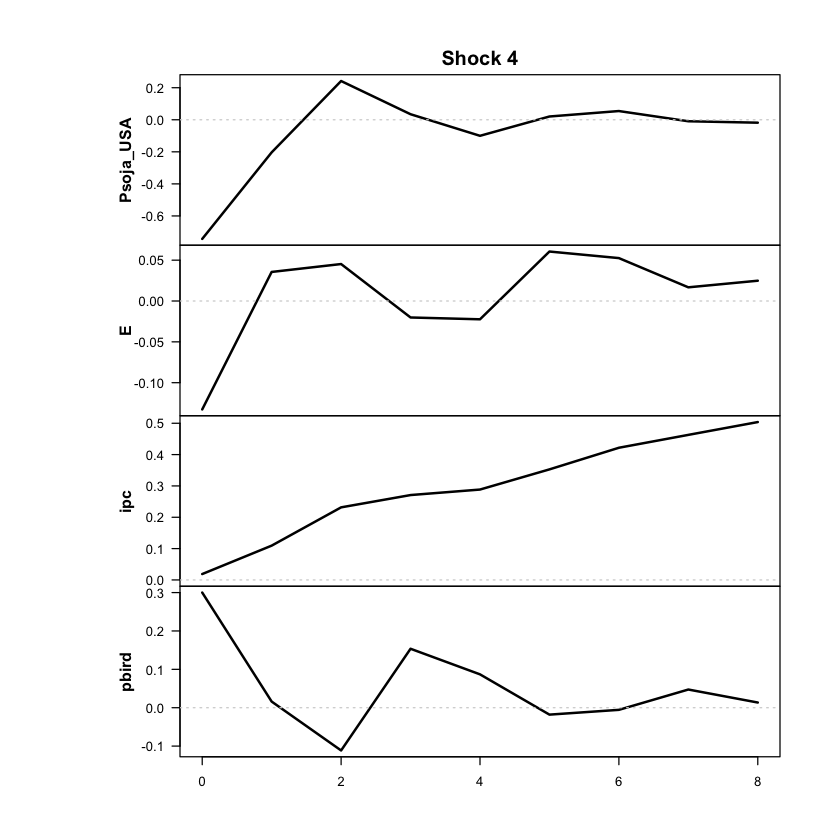

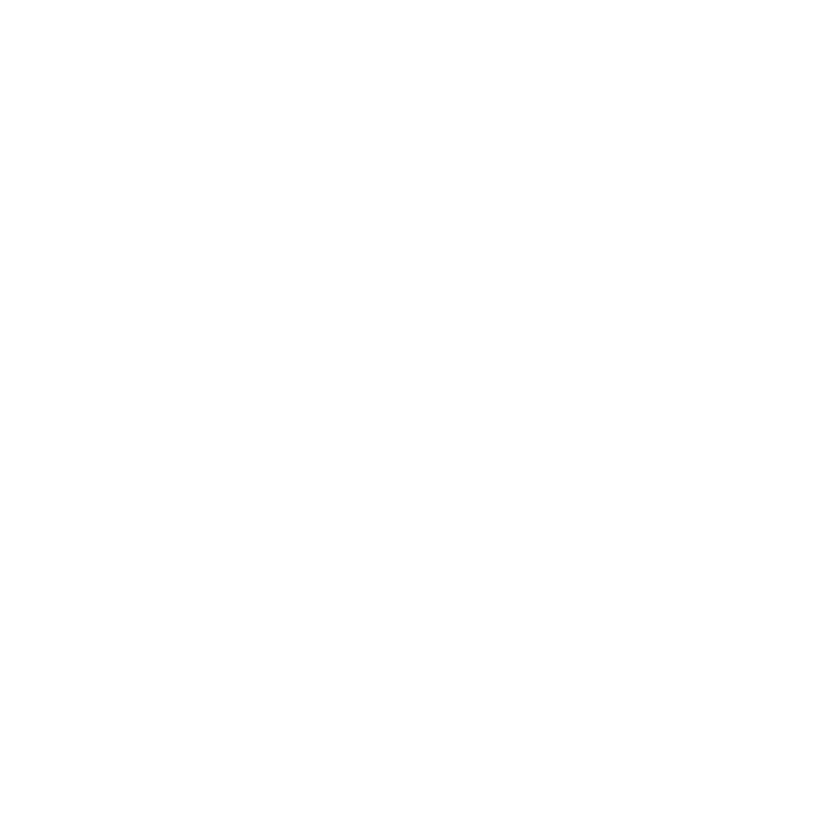

In [23]:
res <- run_vlstar (
  data = df_ERPT_Arg_capped,
  endog = c("Psoja_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual'
  feature_lag = 3,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Psoja_USA","ipc","pbird")
  run_tests = FALSE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [24]:
print_passthrough(res, endog = c("Psoja_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0556
1         1       0.0191
2         2       0.1888
3         3       0.2896
4         4       0.3476
5         5       0.4103
6         6       0.4699
7         7       0.5158
8         8       0.5575

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.0556
2         1       0.0198
3         2       0.1837
4         3       0.2651
5         4       0.2994
6         5       0.3359
7         6       0.3676
8         7       0.3843
9         8       0.3966

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0556
1         1       0.1397
2         2       0.4423
3         3       0.6589
4         4       0.8196
5         5       1.0071
6         6       1.1817
7         7       1.3300
8         8       1.4704

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF


+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Psoja_USA: 
   2.5%   10%  mean   90% 97.5%
0 12.86 12.86 12.86 12.86 12.86
1  0.92  0.98  1.01  1.03  1.07
2 -5.43 -5.43 -5.30 -5.14 -4.86
3  0.10  0.19  0.48  0.84  1.08
4  3.19  3.25  3.43  3.63  3.75
5  0.18  0.21  0.33  0.45  0.57
6 -1.50 -1.46 -1.35 -1.25 -1.17
7 -0.35 -0.31 -0.21 -0.12 -0.01
8  0.40  0.43  0.50  0.58  0.64

The response of E: 
    2.5%    10%   mean    90%  97.5%
0 -17.98 -17.98 -17.98 -17.98 -17.98
1  -9.63  -9.63  -9.52  -9.31  -8.97
2  -2.67  -2.39  -2.14  -2.00  -1.98
3  -1.62  -1.23  -0.78  -0.44  -0.36
4  -1.93  -1.59  -1.20  -0.82  -0.75
5  -1.62  -1.42  -1.03  -0.70  -0.62
6  -1.13  -0.89  -0.57  -0.27  -0.17
7  -0.77  -0.57  -0.29  -0.03   0.04
8  -0.81  -0.63  -0.36  -0.10  -0.05

The response of ipc: 
    2.5%    10%   mean   90% 97.5%
0   1.00   1.00   1.00  1.00  1.00
1  -0.40  -0.37  -0.34 -0.27 -0.22
2  -3.76  -3.52  -3.39 -3.2

### MAÍZ

Desvíos usados para escalar:
 Pmaíz_USA          E        ipc      pbird 
0.08994179 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1386.074

The largest loglik: -1128.765

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1241.754

The largest loglik: -1079.447

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> DIAGNOSTIC PLOTS


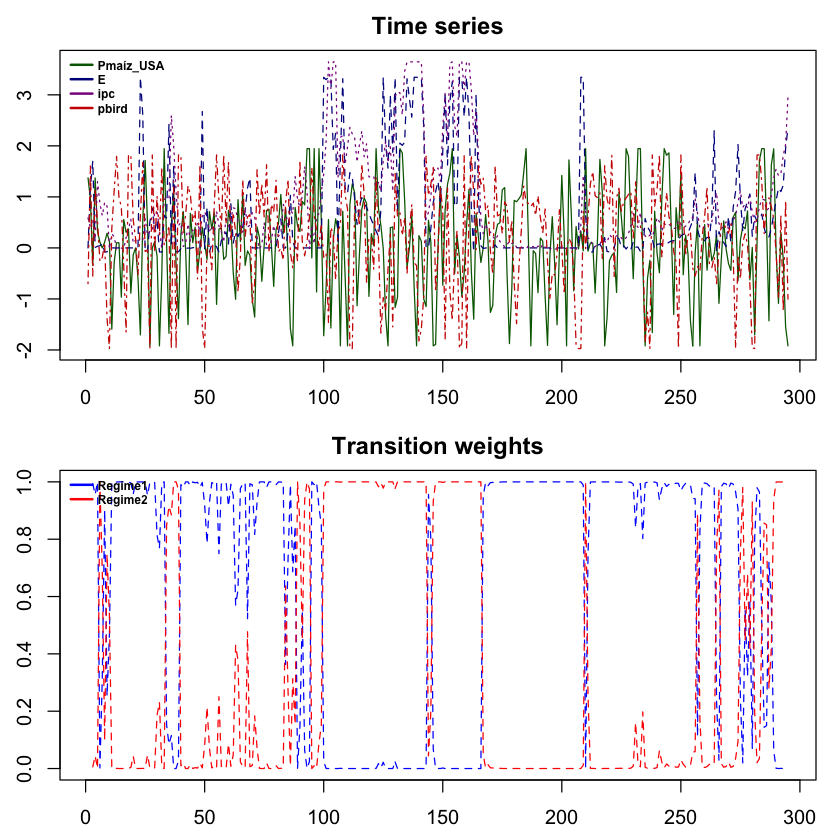

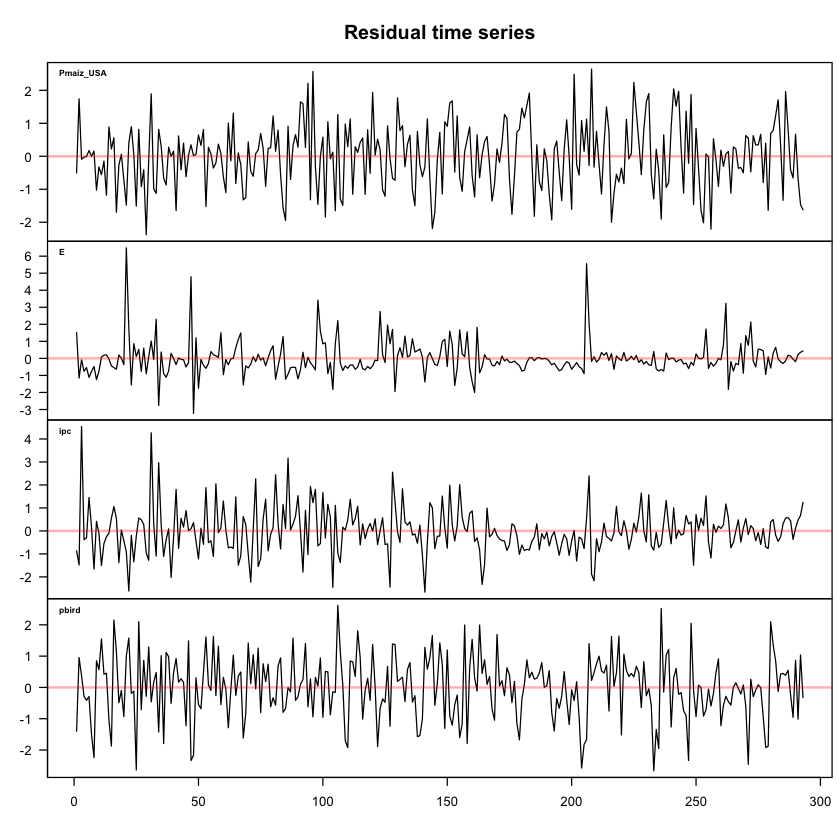

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



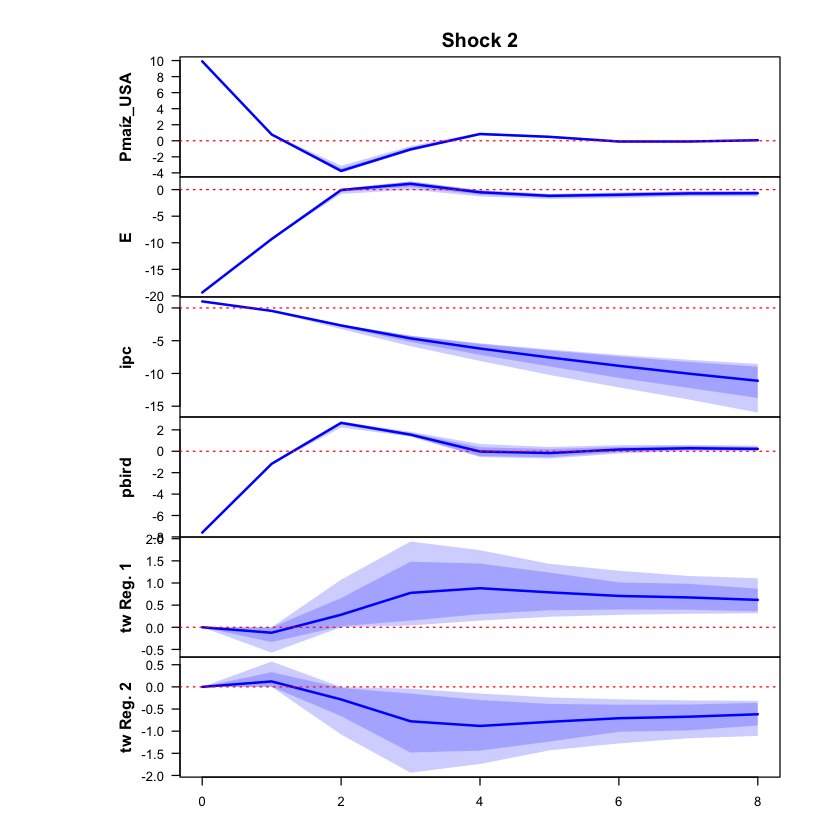

 >>> Linear IRF ( 1  shock units)


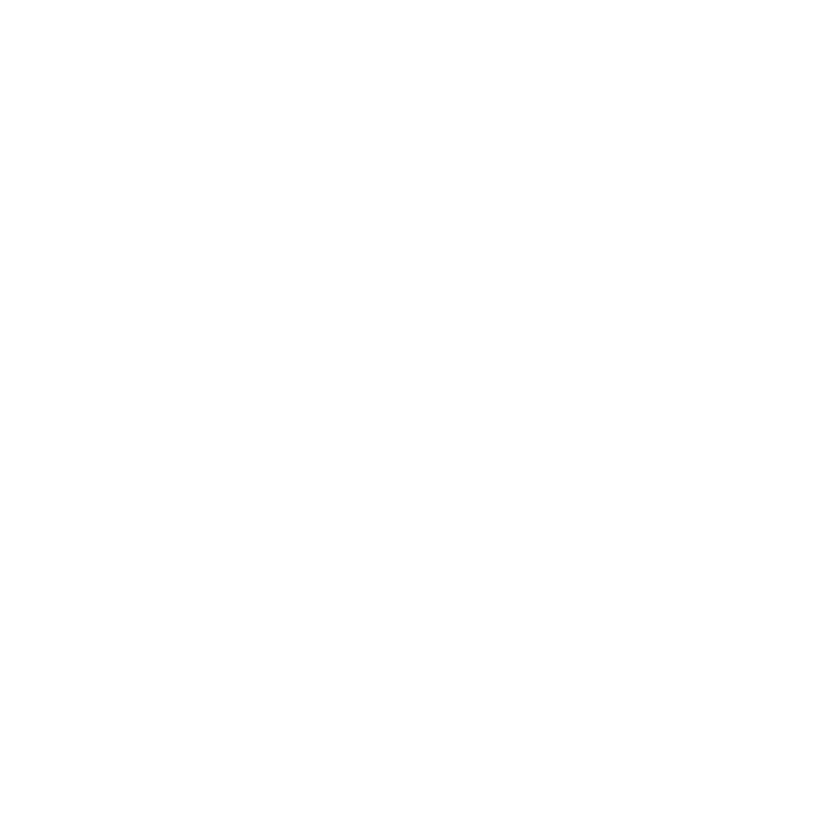

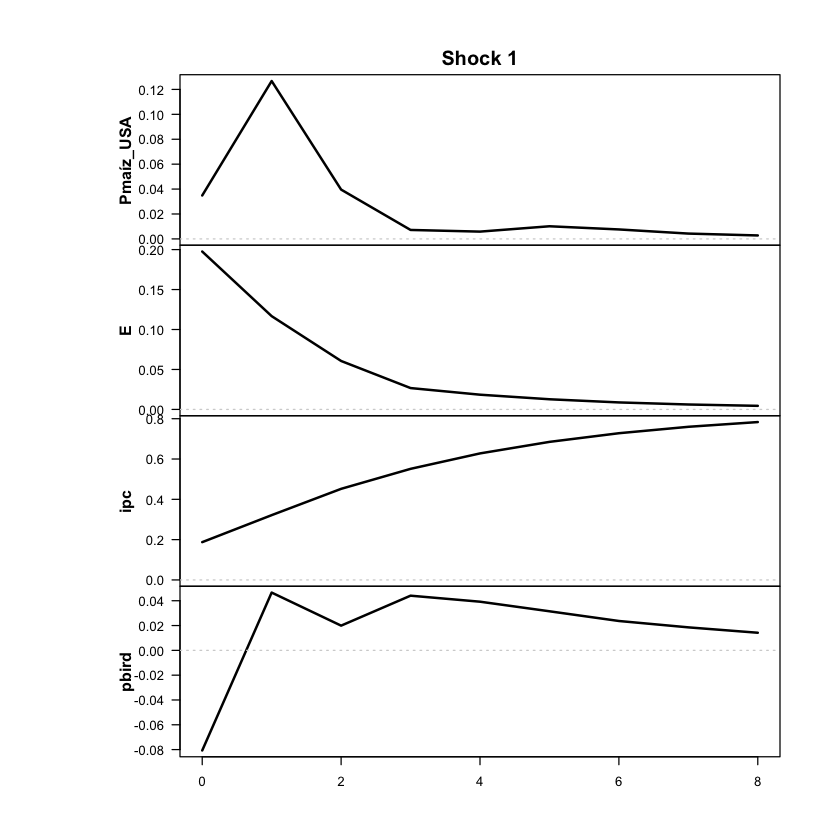

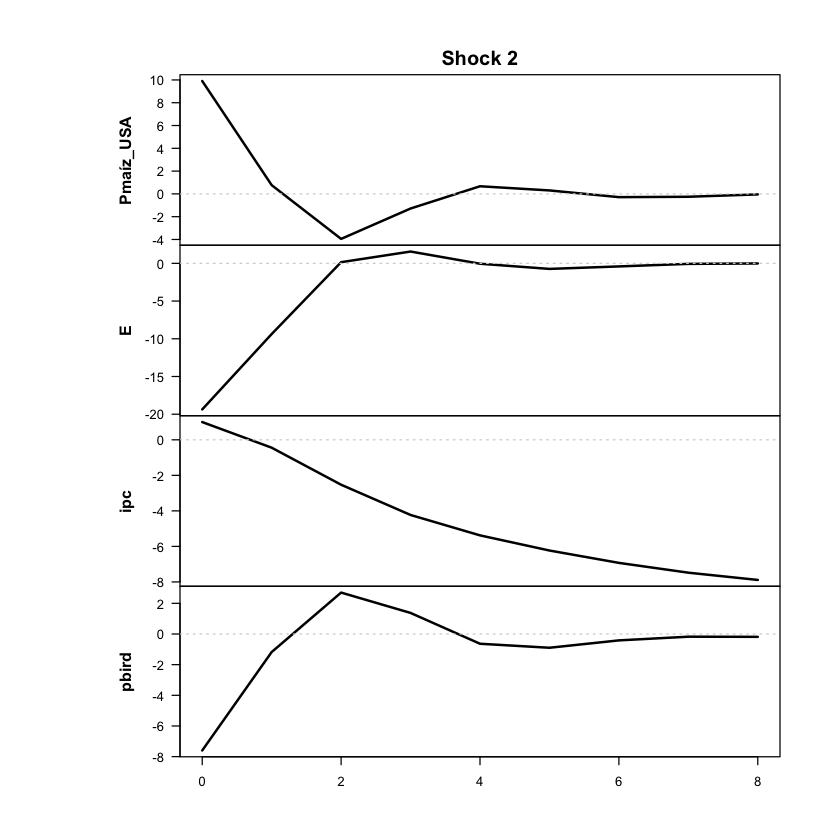

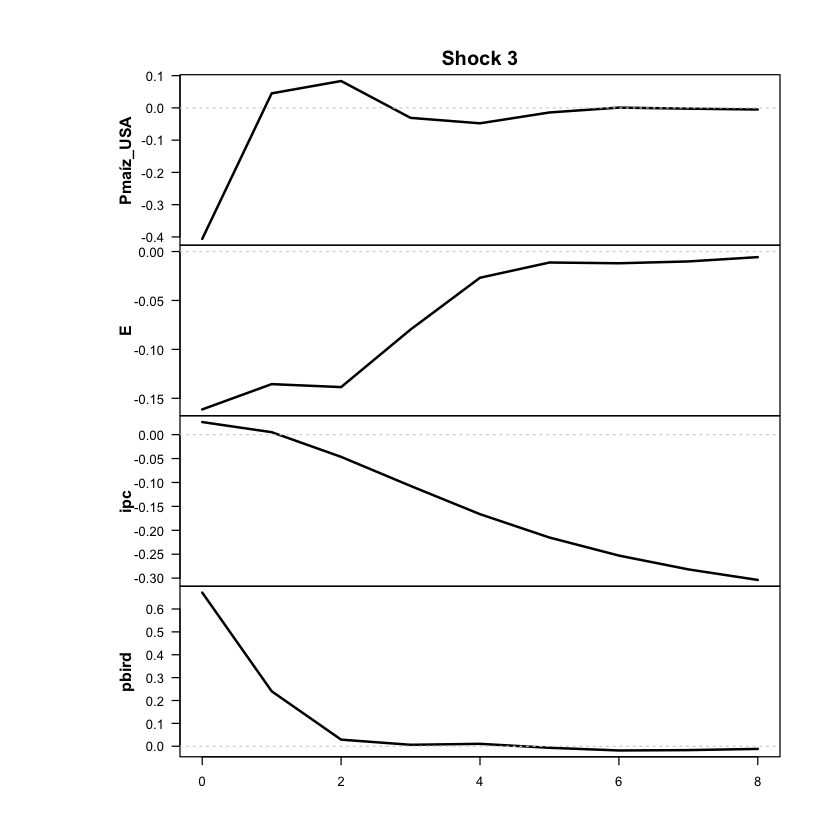

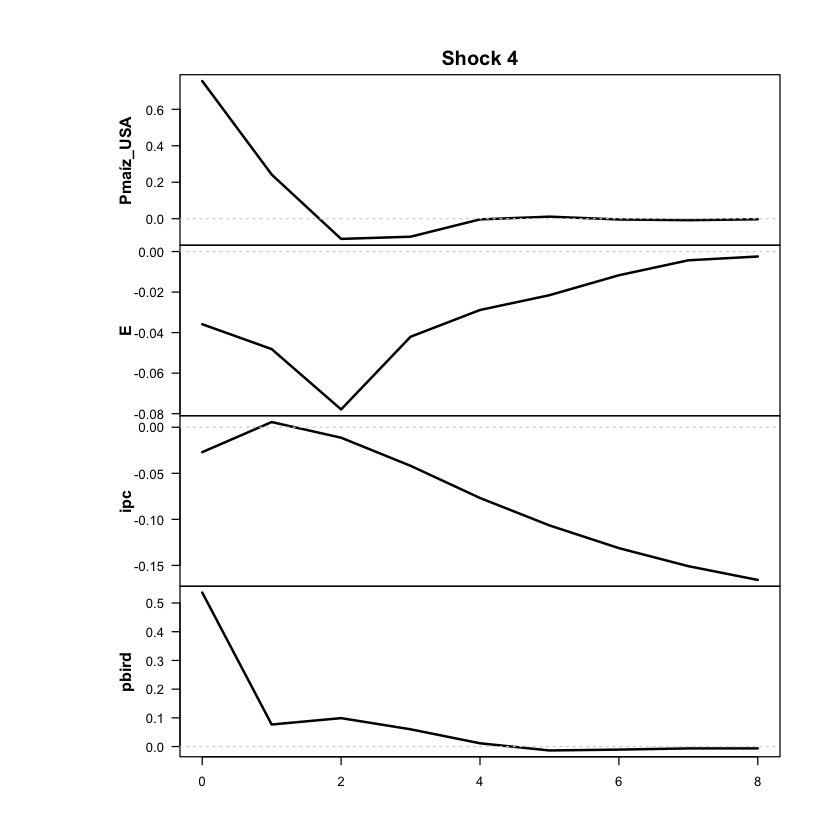

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



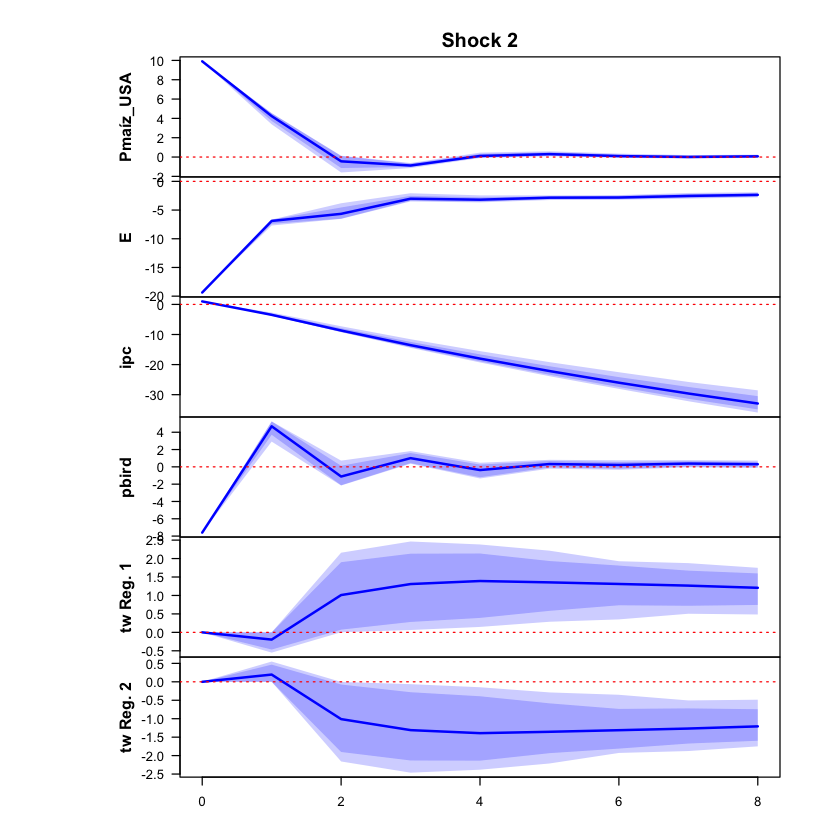

 >>> Linear IRF ( 1  shock units)


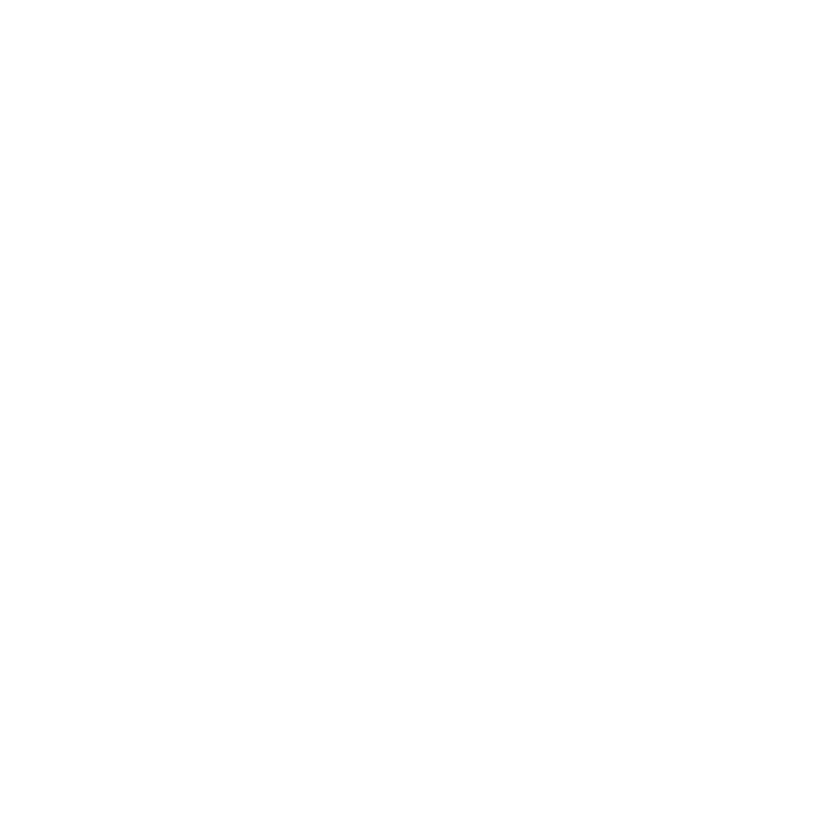

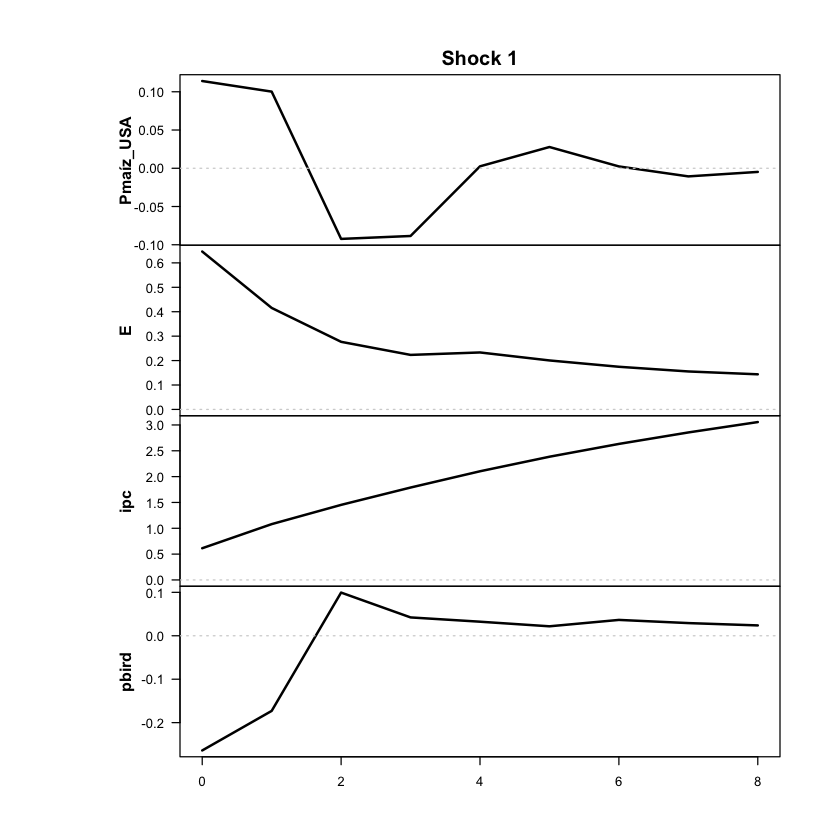

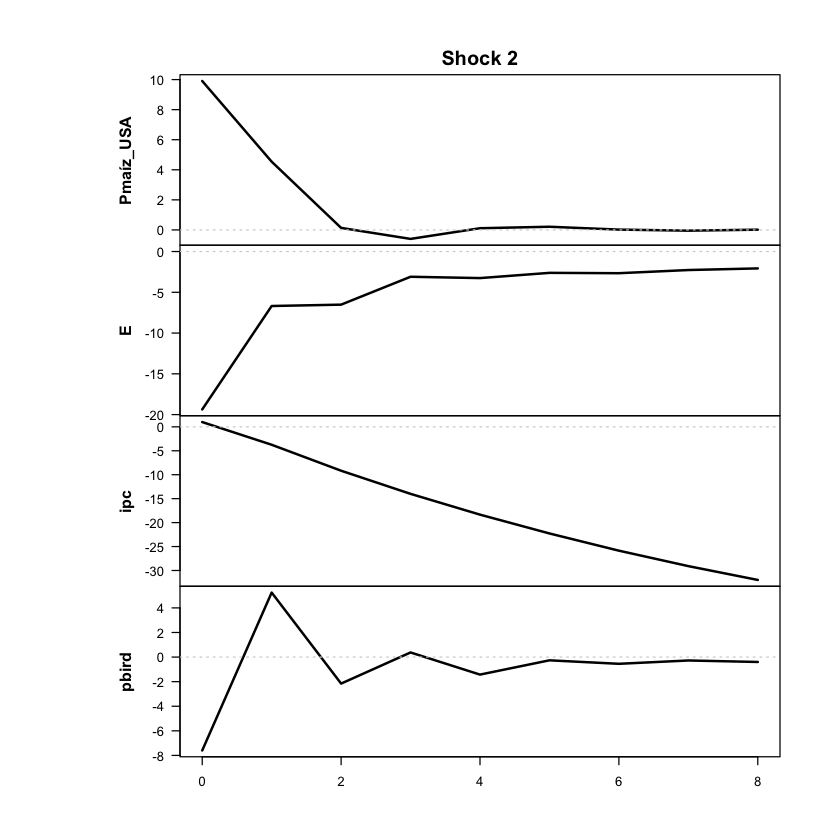

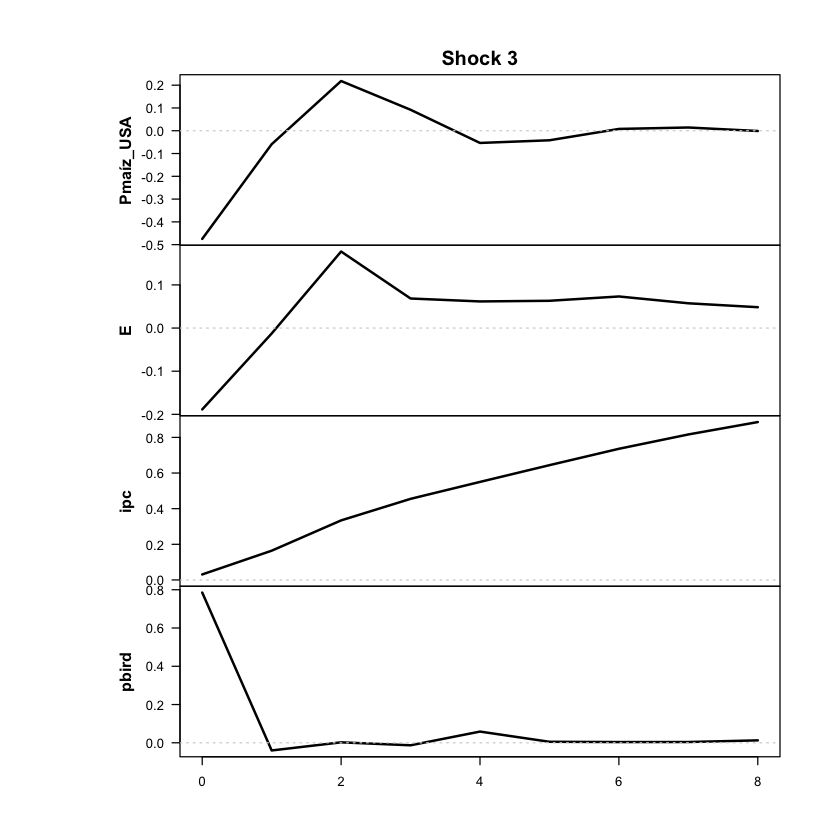

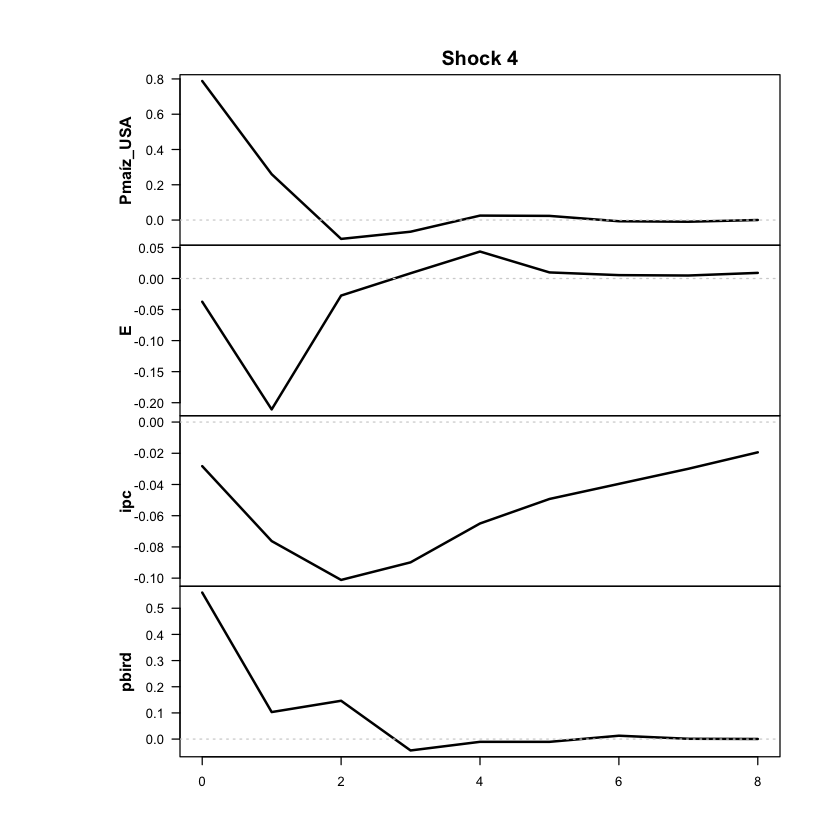

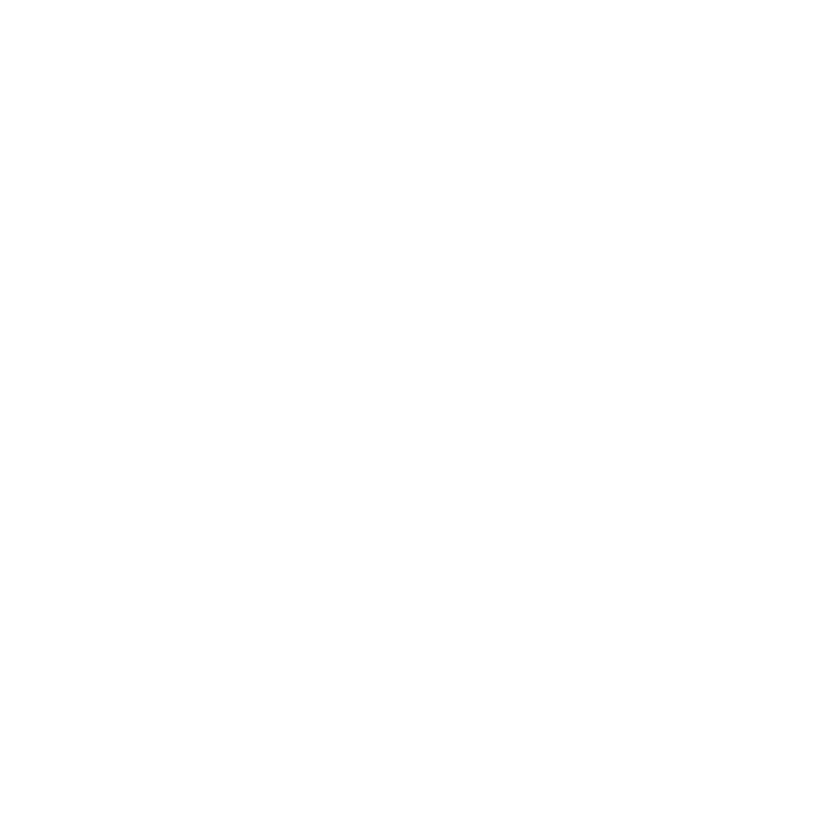

In [25]:
res <- run_vlstar (
  data = df_ERPT_Arg_capped,
  endog = c("Pmaíz_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual'
  feature_lag = 2,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Pmaíz_USA","ipc","pbird")
  run_tests = FALSE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [26]:
print_passthrough(res, endog = c("Pmaíz_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0516
1         1       0.0232
2         2       0.1380
3         3       0.2398
4         4       0.3200
5         5       0.3901
6         6       0.4561
7         7       0.5175
8         8       0.5742

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.0516
2         1       0.0229
3         2       0.1305
4         3       0.2184
5         4       0.2777
6         5       0.3218
7         6       0.3577
8         7       0.3862
9         8       0.4073

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0516
1         1       0.1789
2         2       0.4478
3         3       0.6988
4         4       0.9299
5         5       1.1433
6         6       1.3435
7         7       1.5290
8         8       1.7008

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Pmaíz_USA: 
   2.5%   10%  mean   90% 97.5%
0  0.25  0.25  0.25  0.25  0.25
1  0.59  0.60  0.61  0.62  0.63
2 -0.24 -0.23 -0.22 -0.21 -0.20
3 -0.12 -0.12 -0.11 -0.11 -0.10
4  0.09  0.09  0.10  0.11  0.11
5  0.07  0.08  0.09  0.10  0.10
6  0.04  0.05  0.06  0.07  0.08
7  0.02  0.03  0.05  0.06  0.07
8  0.02  0.03  0.04  0.05  0.06

The response of E: 
    2.5%    10%   mean    90%  97.5%
0 -12.96 -12.96 -12.96 -12.96 -12.96
1  -2.39  -2.36  -2.31  -2.24  -2.22
2  -0.07  -0.05  -0.01   0.03   0.05
3  -0.24  -0.22  -0.19  -0.15  -0.13
4  -0.41  -0.39  -0.35  -0.30  -0.28
5  -0.44  -0.41  -0.36  -0.30  -0.27
6  -0.45  -0.42  -0.35  -0.29  -0.27
7  -0.48  -0.45  -0.35  -0.28  -0.25
8  -0.48  -0.43  -0.35  -0.27  -0.24

The response of ipc: 
   2.5%   10%  mean   90% 97.5%
0  1.00  1.00  1.00  1.00  1.00
1  1.35  1.35  1.38  1.40  1.42
2  0.54  0.57  0.63 

Desvíos usados para escalar:
 Pmaíz_USA          E        ipc      pbird 
0.08994179 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1235.636

The largest loglik: -1113.574

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1226.969

The largest loglik: -993.123

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> DIAGNOSTIC PLOTS


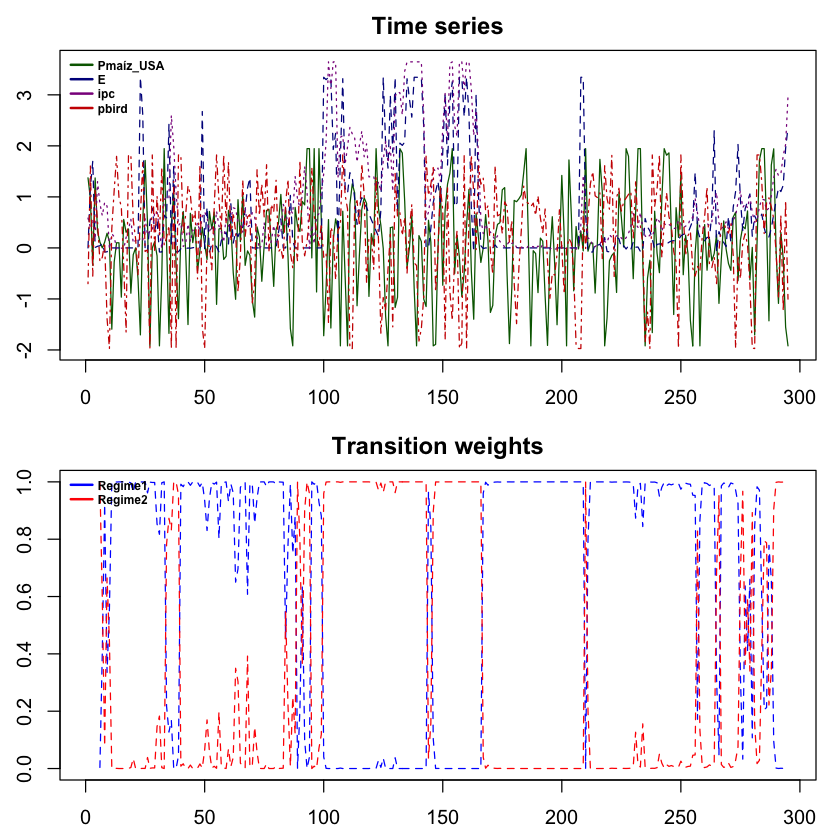

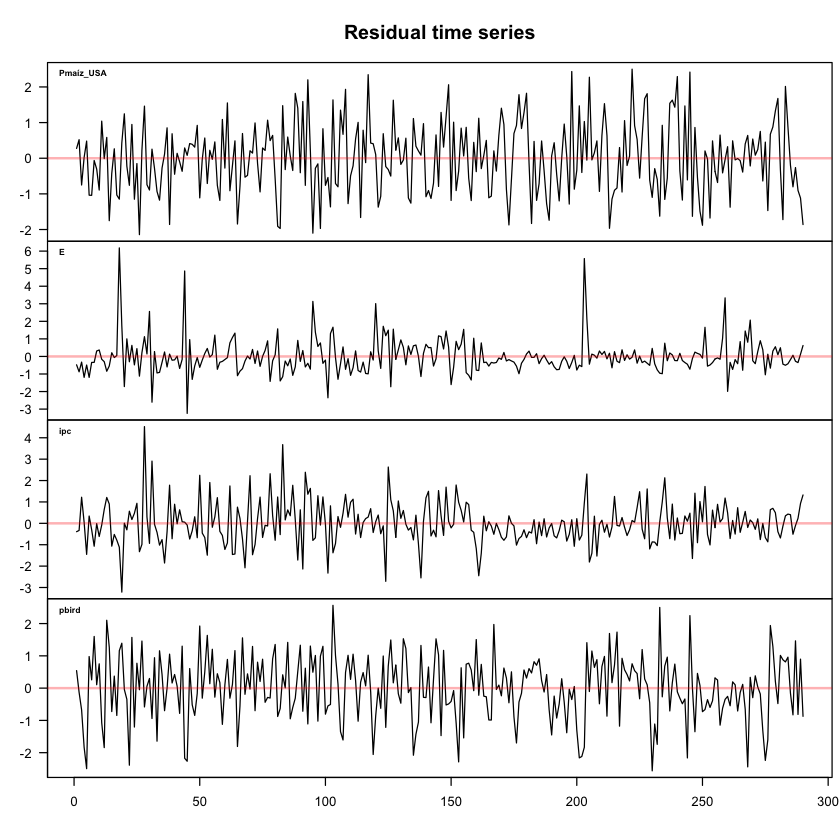

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



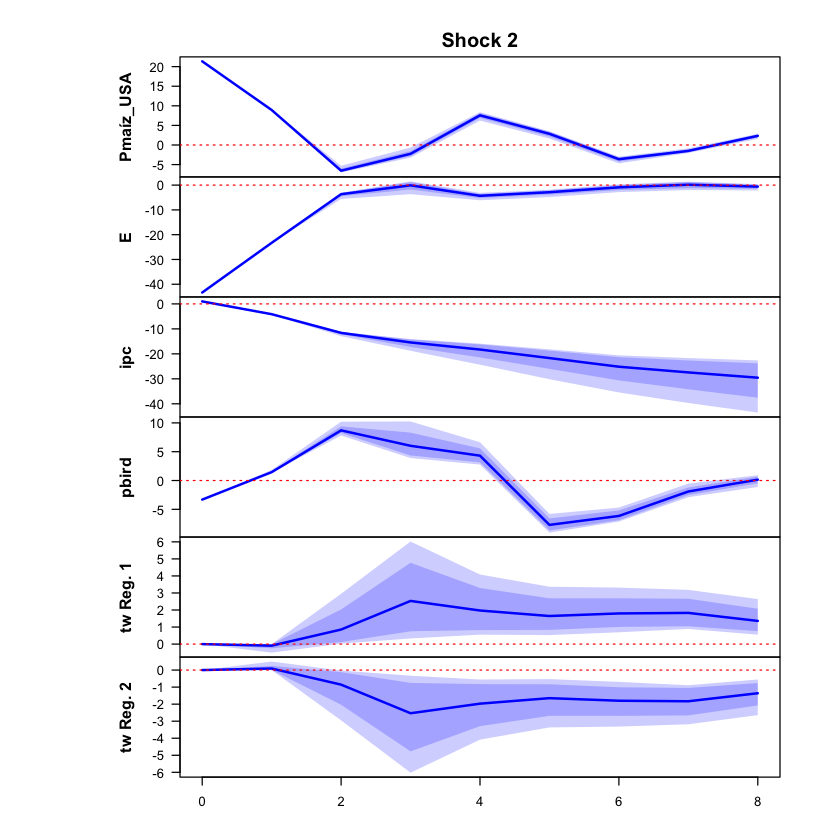

 >>> Linear IRF ( 1  shock units)


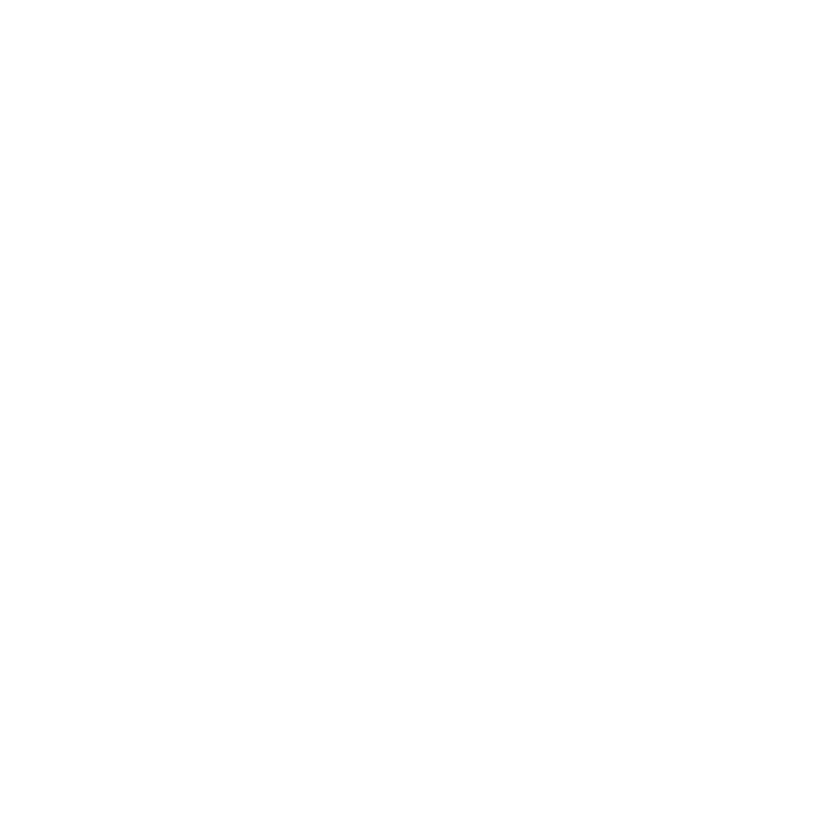

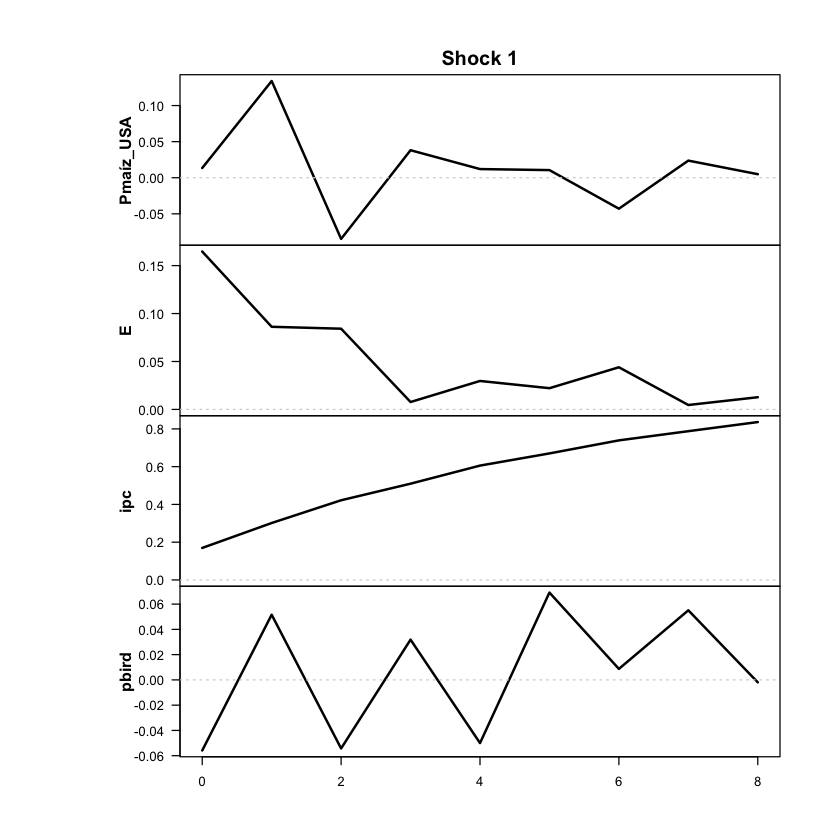

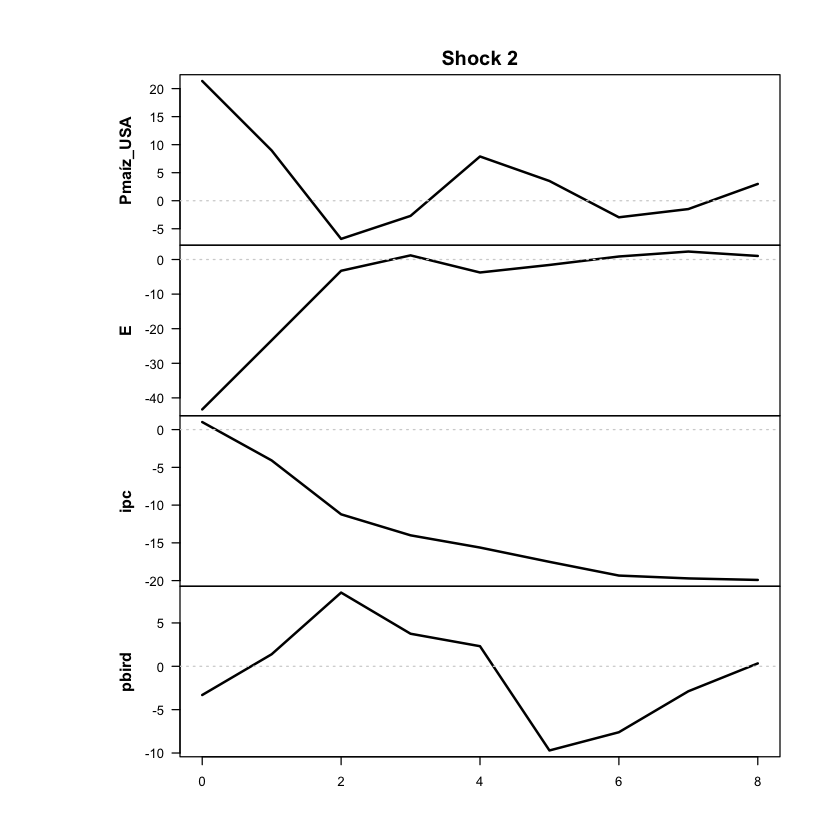

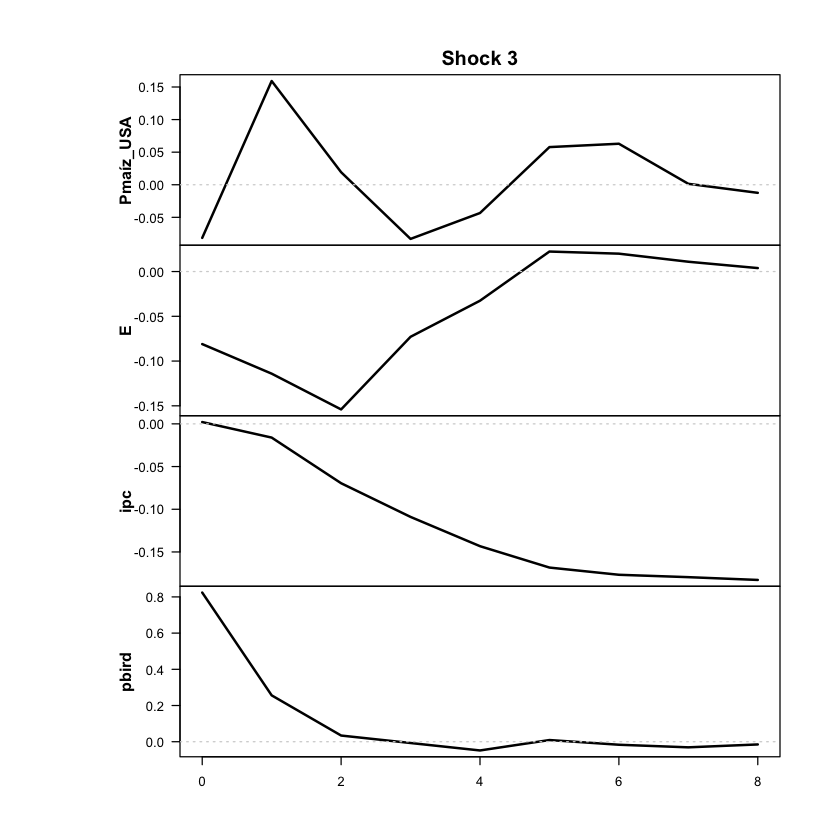

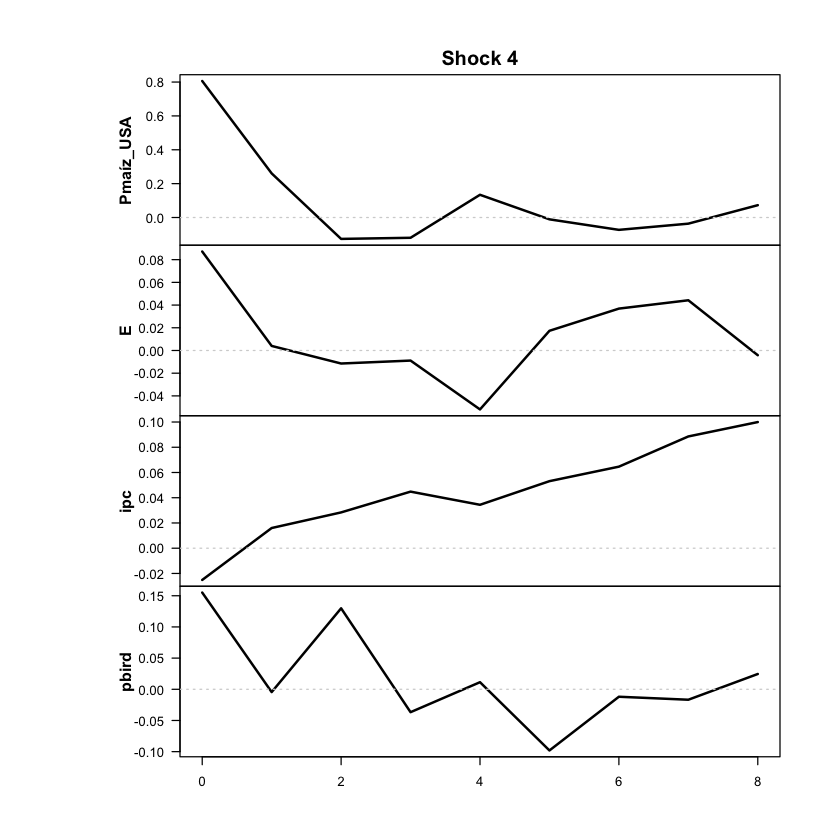

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



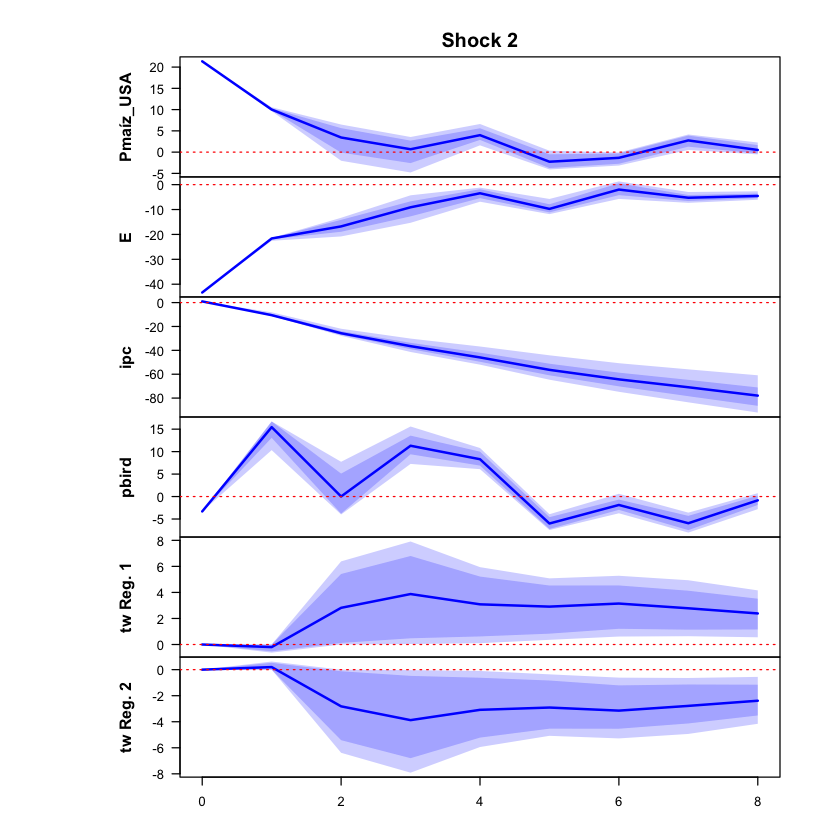

 >>> Linear IRF ( 1  shock units)


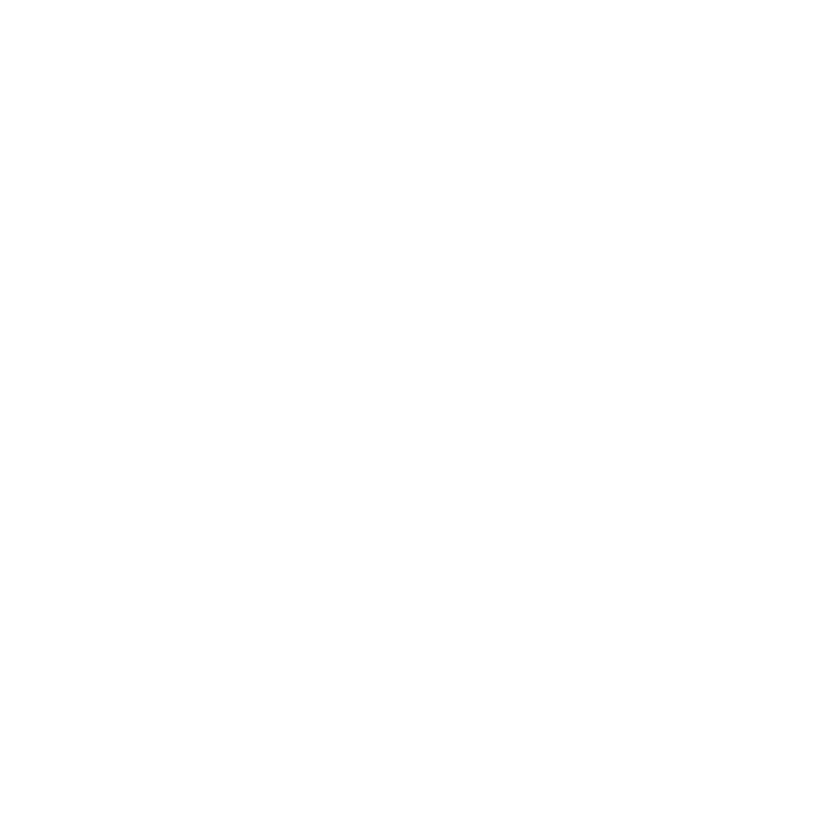

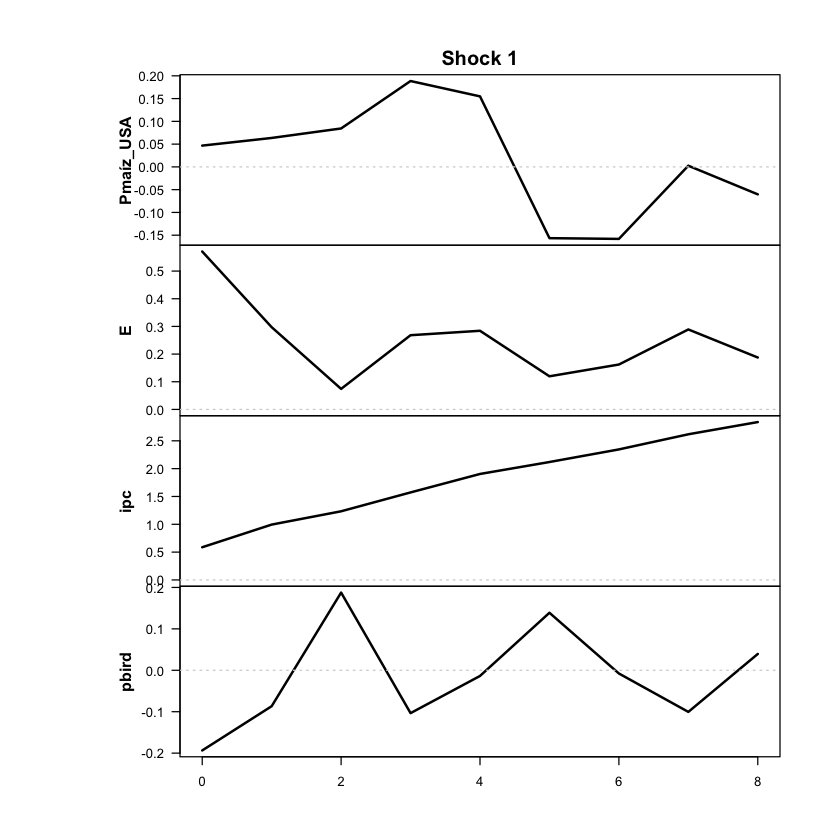

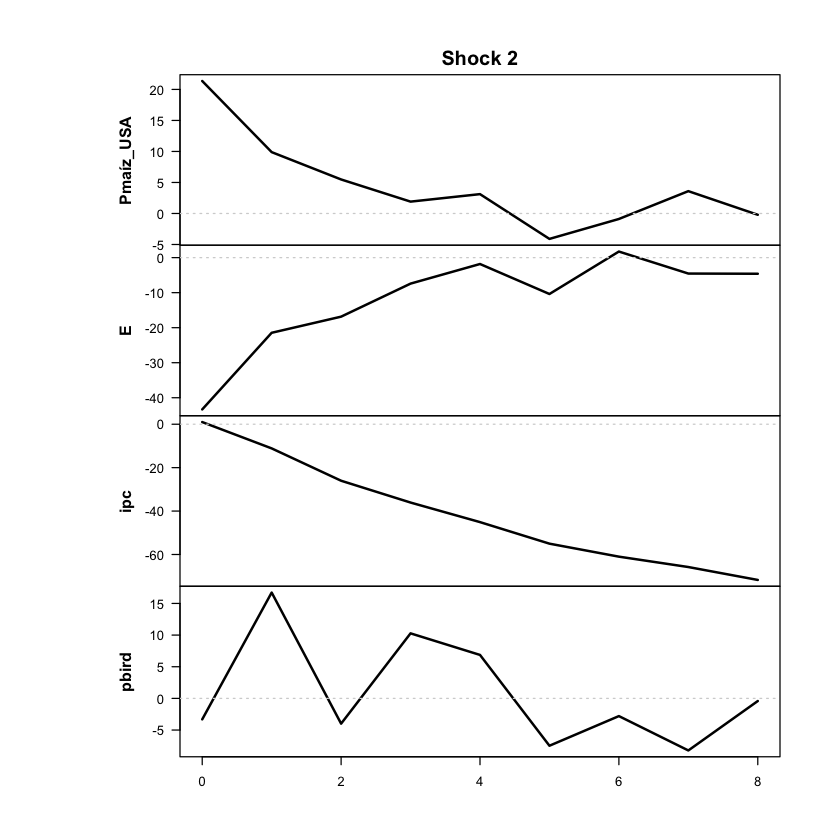

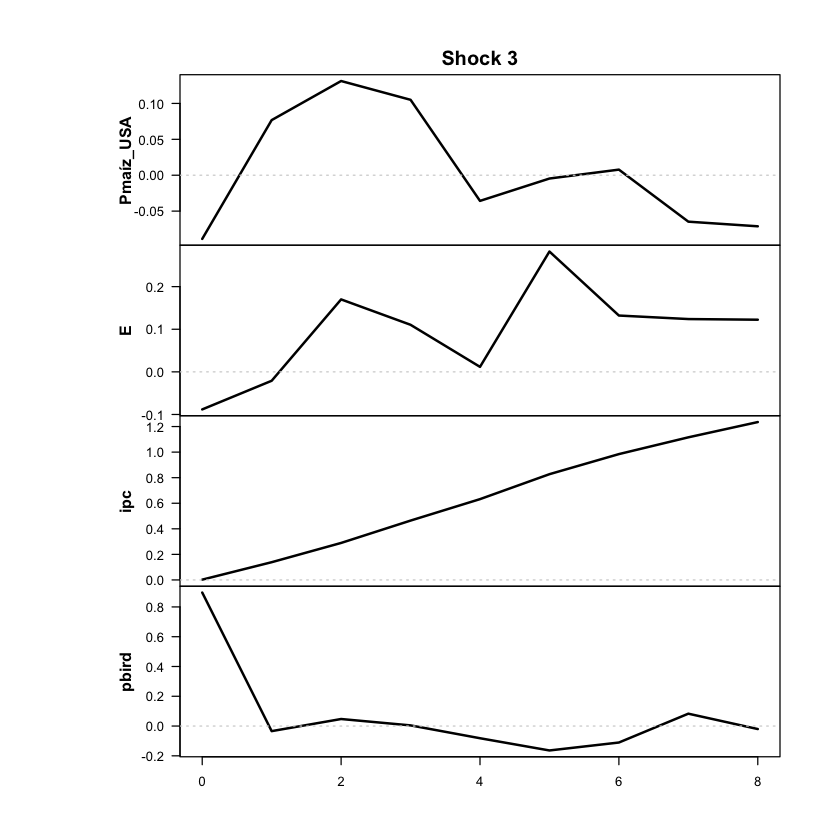

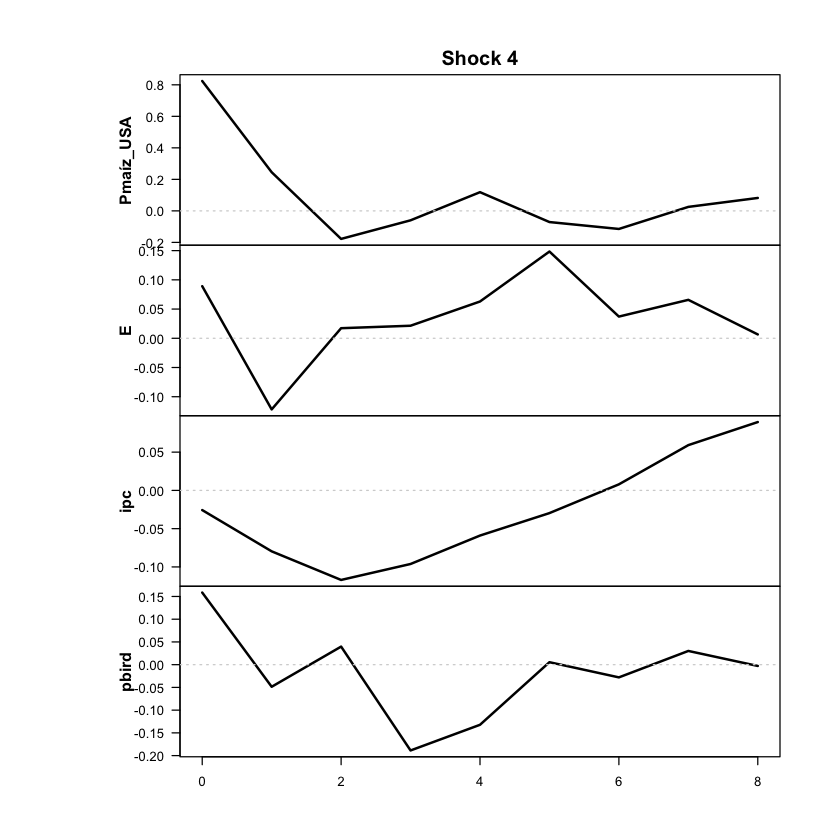

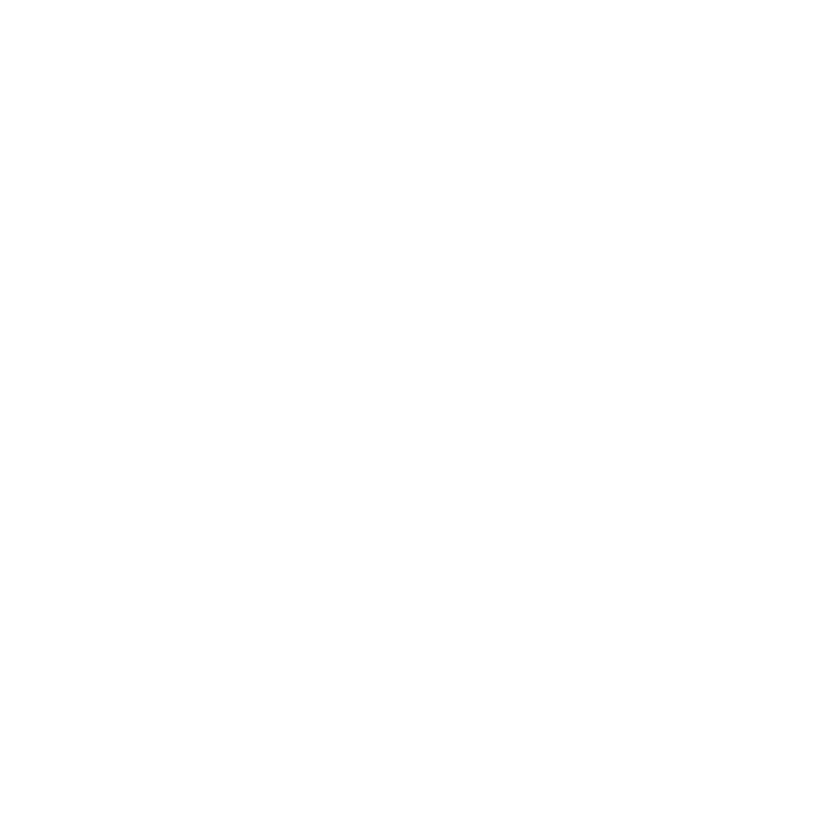

In [27]:
res <- run_vlstar (
  data = df_ERPT_Arg_capped,
  endog = c("Pmaíz_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual'
  feature_lag = 5,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Pmaíz_USA","ipc","pbird")
  run_tests = FALSE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [28]:
print_passthrough(res, endog = c("Pmaíz_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0231
1         1       0.0950
2         2       0.2676
3         3       0.3561
4         4       0.4217
5         5       0.5004
6         6       0.5802
7         7       0.6330
8         8       0.6818

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.0231
2         1       0.0942
3         2       0.2589
4         3       0.3231
5         4       0.3605
6         5       0.4042
7         6       0.4461
8         7       0.4548
9         8       0.4595

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0231
1         1       0.2429
2         2       0.5922
3         3       0.8420
4         4       1.0601
5         5       1.3001
6         6       1.4841
7         7       1.6368
8         8       1.7984

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF


+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Pmaíz_USA: 
   2.5%   10%  mean   90% 97.5%
0 -1.52 -1.52 -1.52 -1.52 -1.52
1 -0.80 -0.80 -0.80 -0.79 -0.78
2  0.82  0.83  0.84  0.84  0.85
3  0.61  0.63  0.64  0.64  0.65
4  0.02  0.02  0.03  0.03  0.04
5 -0.05 -0.04 -0.02 -0.01 -0.01
6 -0.05 -0.04 -0.02 -0.01 -0.01
7  0.03  0.04  0.05  0.06  0.06
8  0.07  0.07  0.08  0.09  0.09

The response of E: 
  2.5%  10% mean  90% 97.5%
0 6.28 6.28 6.28 6.28  6.28
1 2.85 2.88 2.91 2.94  2.95
2 2.59 2.63 2.67 2.70  2.71
3 1.78 1.81 1.85 1.89  1.90
4 1.55 1.58 1.63 1.67  1.68
5 1.80 1.82 1.88 1.92  1.93
6 1.48 1.52 1.57 1.61  1.63
7 1.27 1.30 1.35 1.39  1.41
8 1.11 1.15 1.20 1.25  1.26

The response of ipc: 
  2.5%  10% mean  90% 97.5%
0 1.00 1.00 1.00 1.00  1.00
1 2.25 2.26 2.27 2.28  2.29
2 3.43 3.44 3.46 3.48  3.49
3 4.57 4.58 4.61 4.64  4.65
4 5.74 5.77 5.80 5.84  5.86
5 6.48 6.51 6.56 6.61  6.64
6 7.34 7.38 7.43 7.50  7.5

### TRIGO

Desvíos usados para escalar:
Ptrigo_USA          E        ipc      pbird 
0.07672900 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1488.194

The largest loglik: -1148.491

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1287.319

The largest loglik: -1113.284

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> DIAGNOSTIC PLOTS


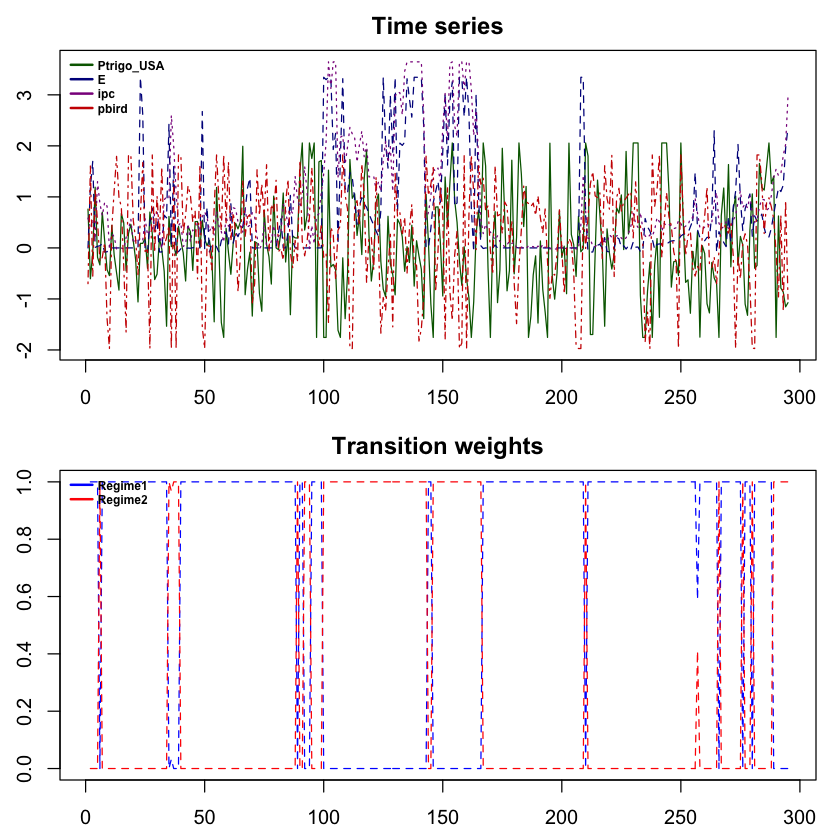

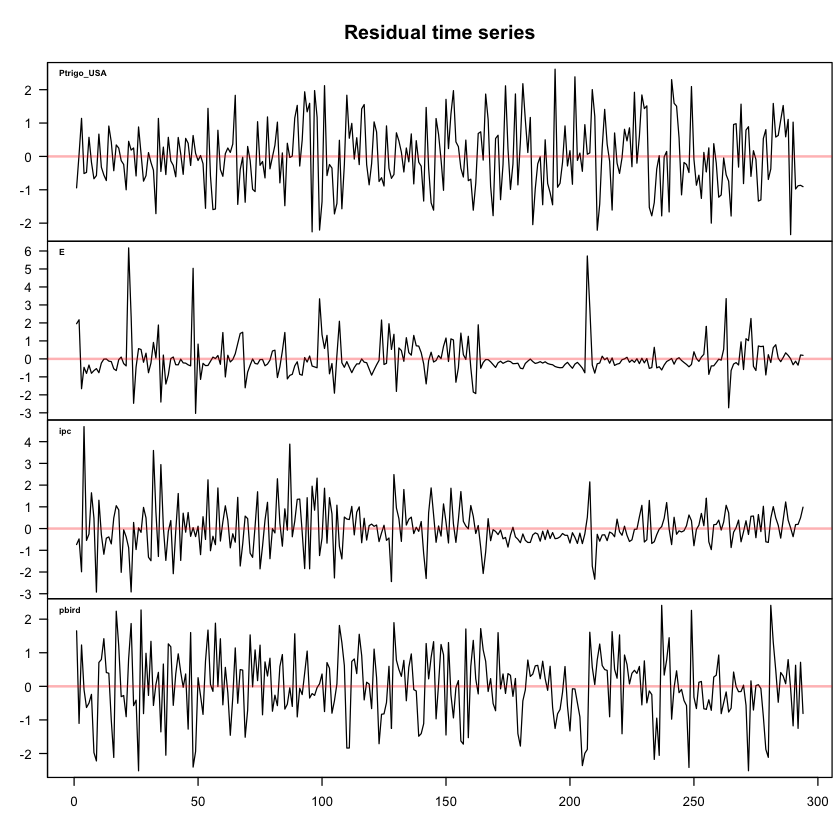

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



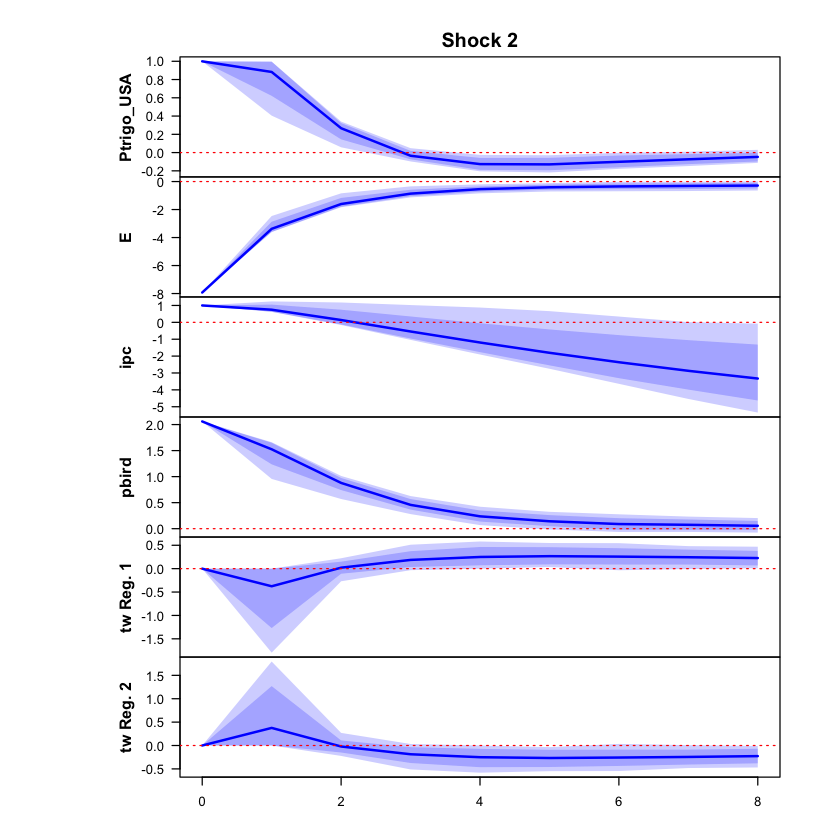

 >>> Linear IRF ( 1  shock units)


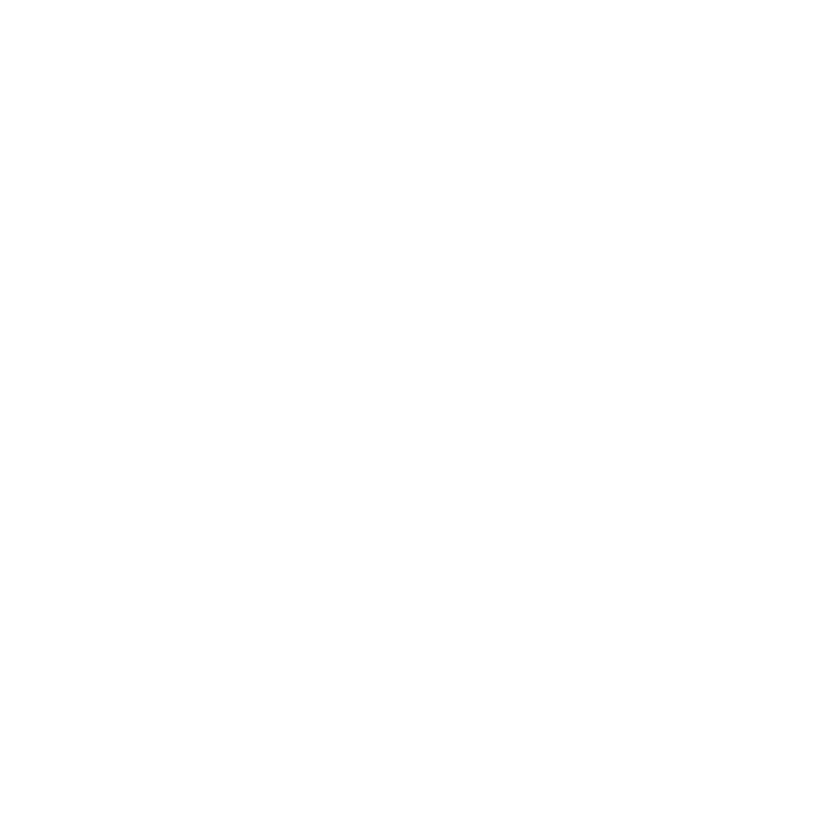

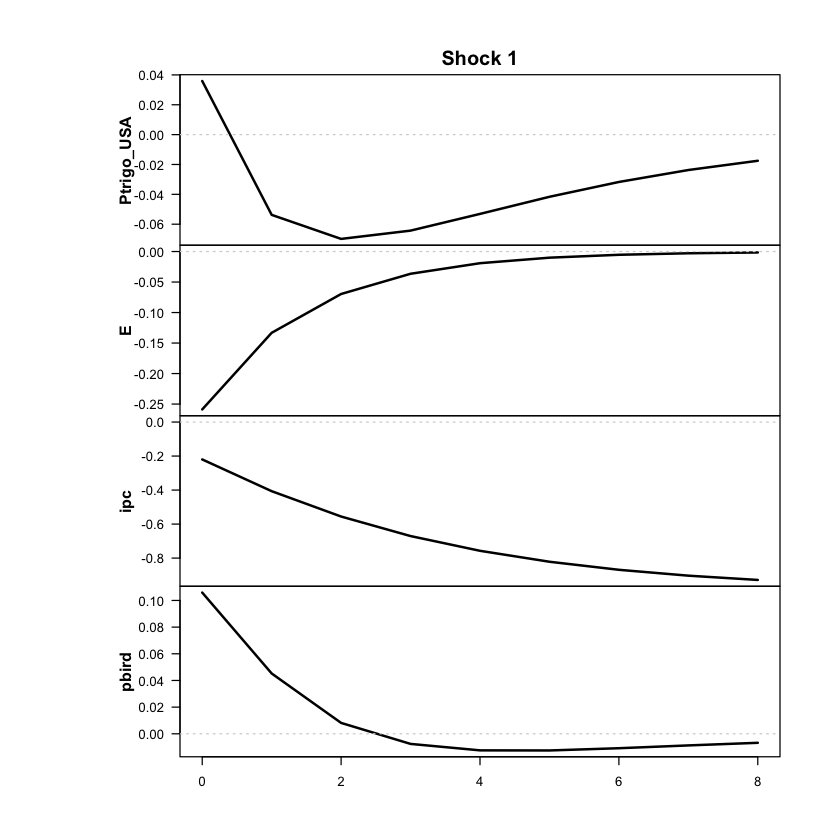

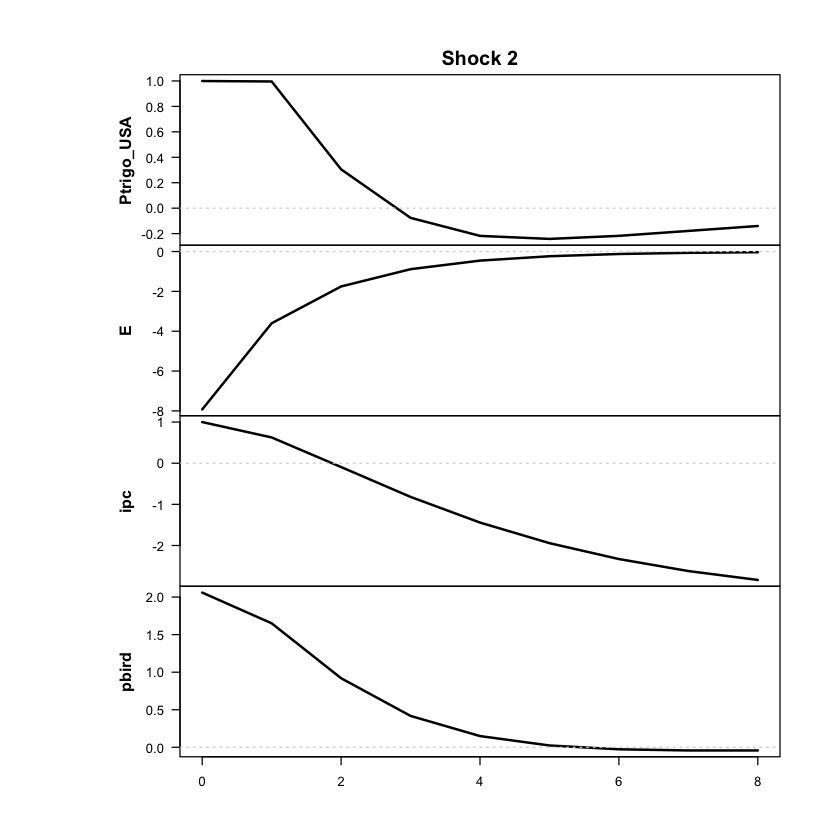

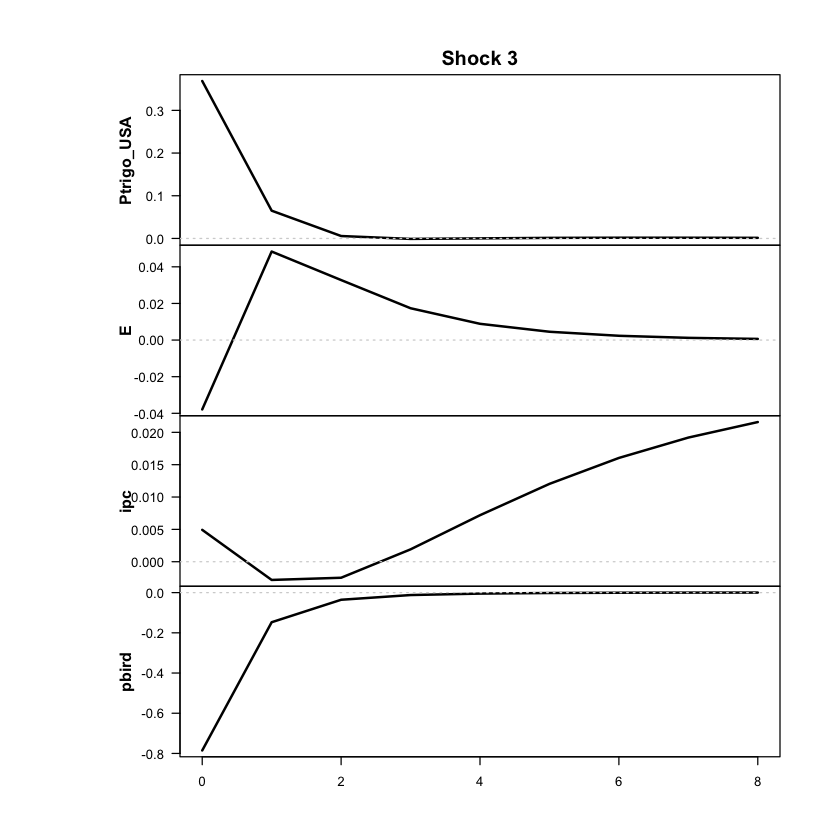

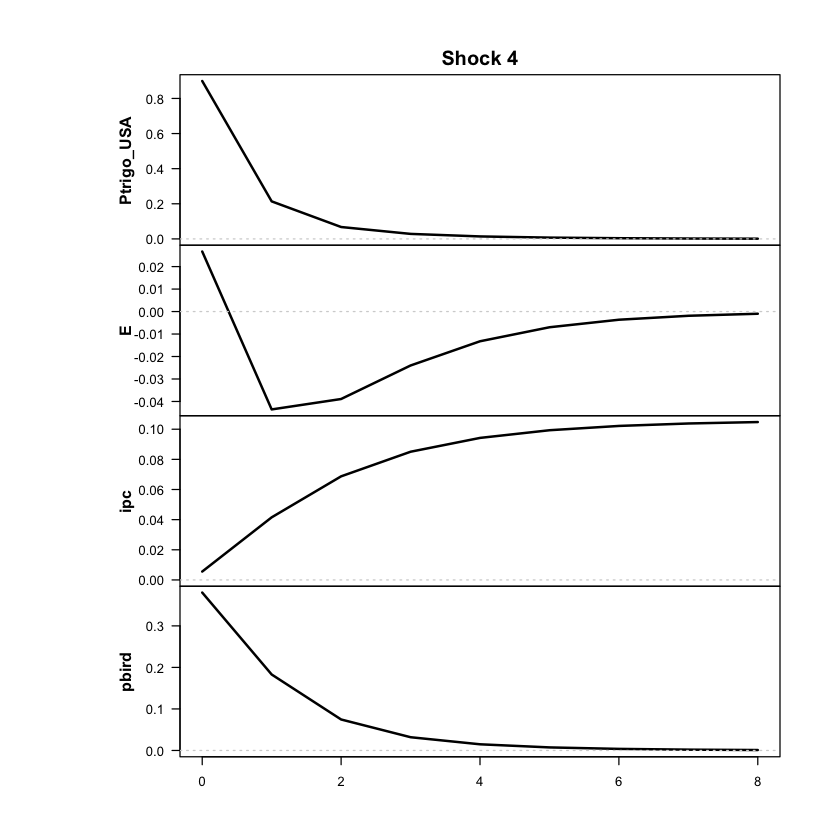

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



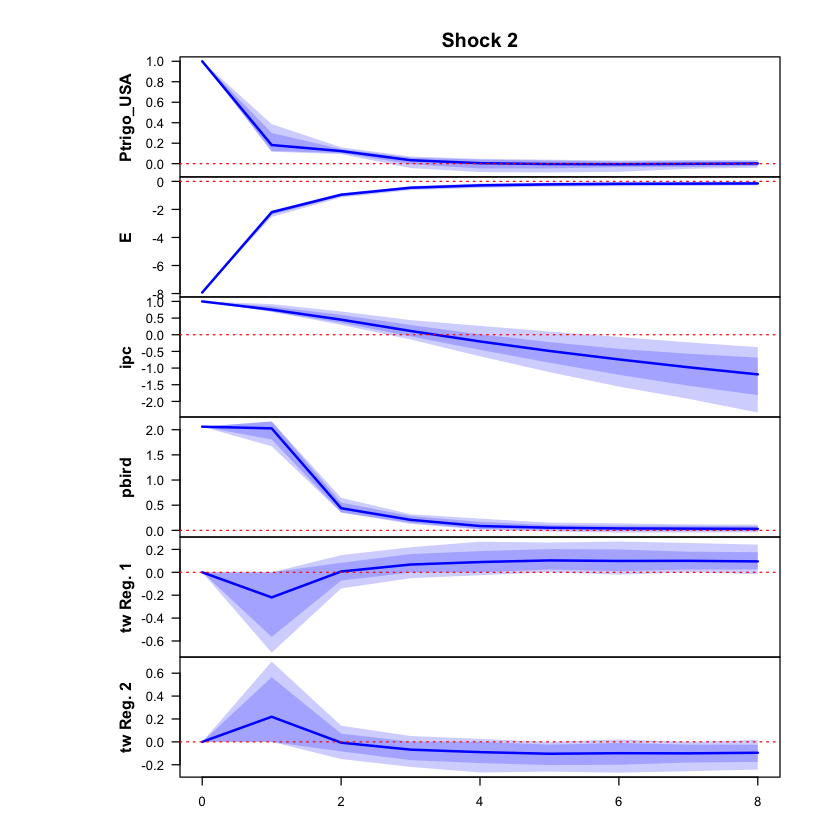

 >>> Linear IRF ( 1  shock units)


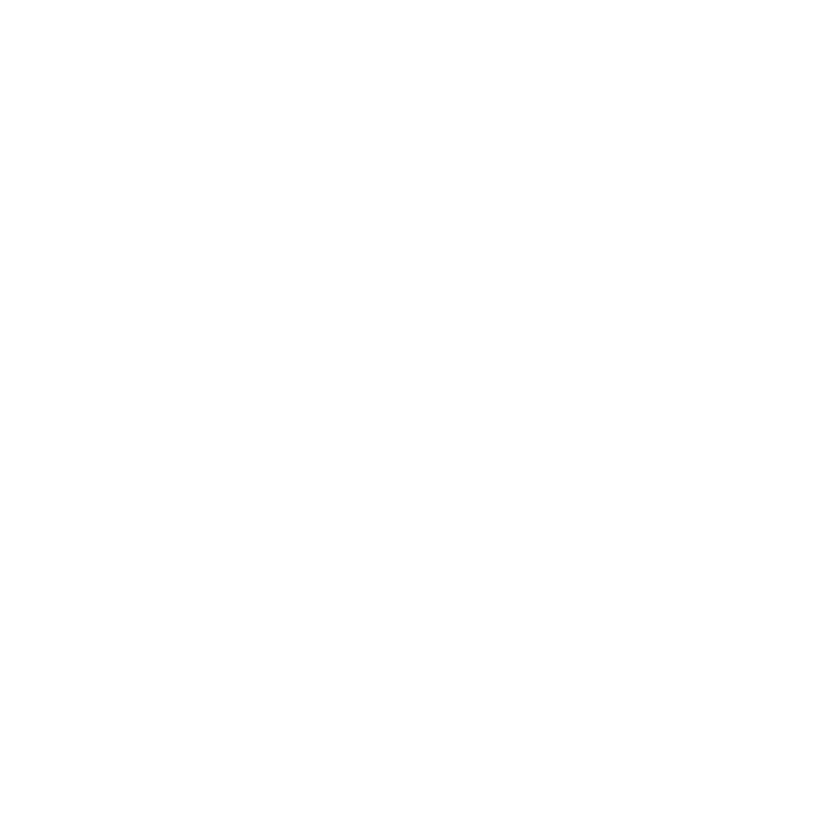

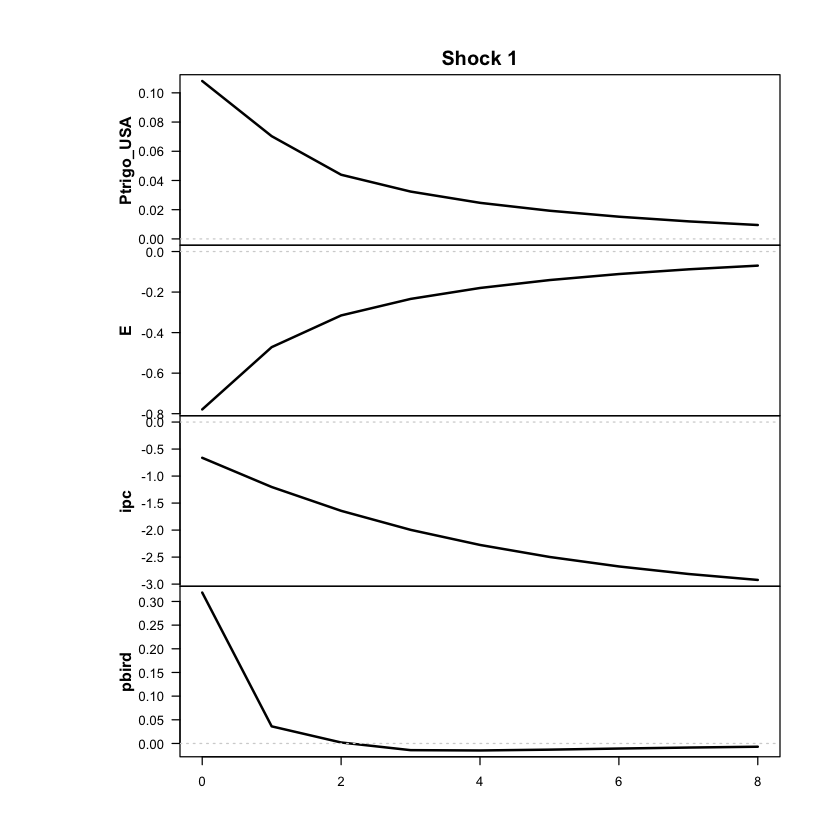

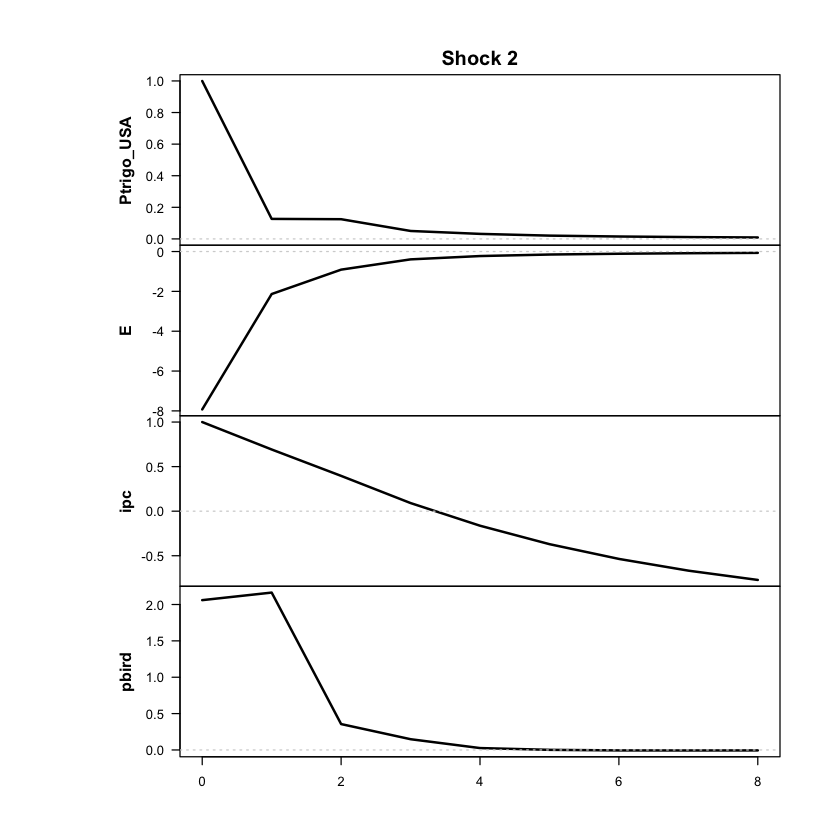

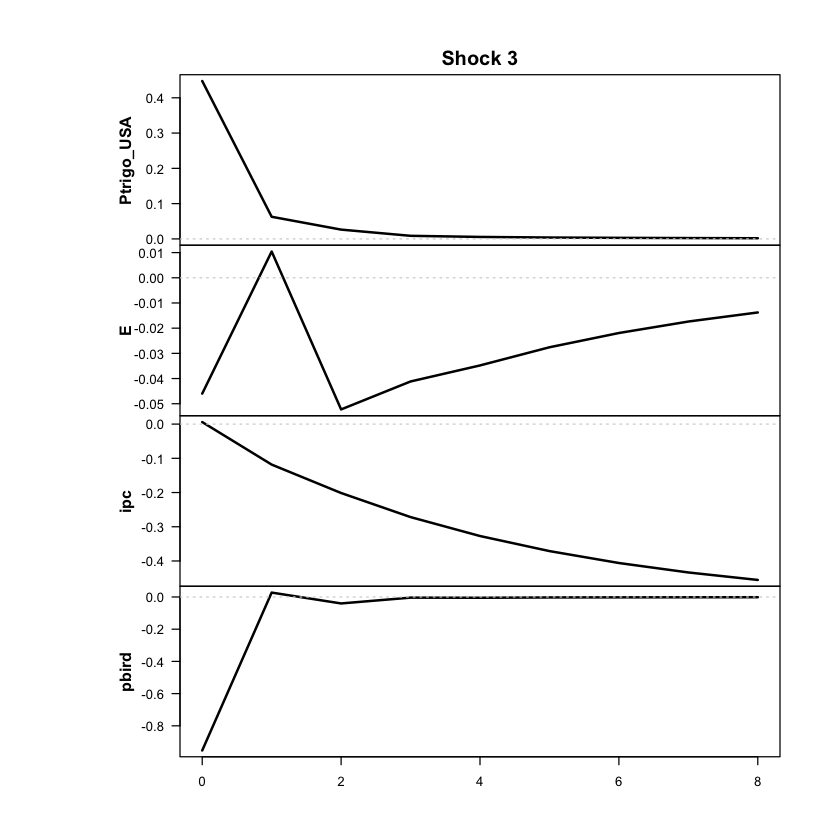

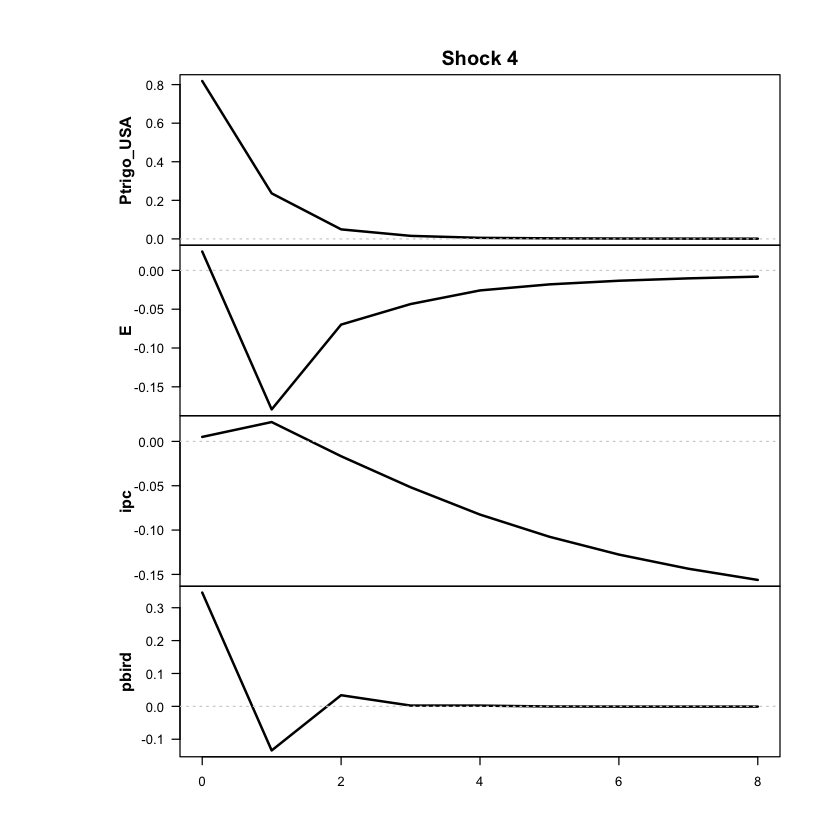

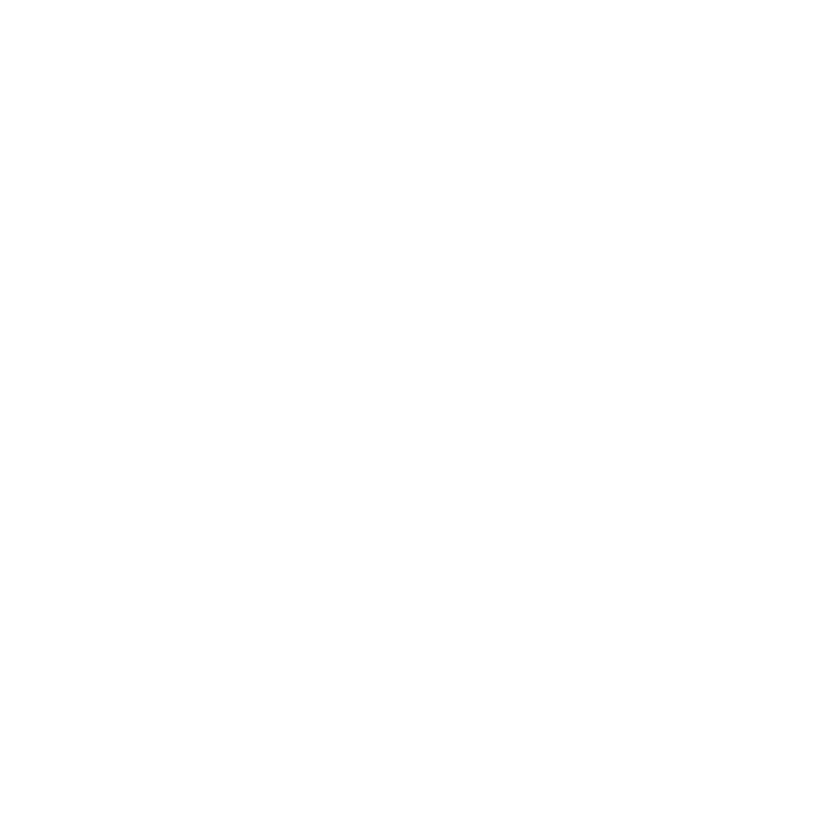

In [29]:
res <- run_vlstar (
  data = df_ERPT_Arg_capped,
  endog = c("Ptrigo_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual'
  feature_lag = 1,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Ptrigo_USA","ipc","pbird")
  run_tests = FALSE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [30]:
print_passthrough(res, endog = c("Ptrigo_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1262
1         1      -0.0944
2         2      -0.0173
3         3       0.0684
4         4       0.1507
5         5       0.2276
6         6       0.2981
7         7       0.3623
8         8       0.4200

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.1262
2         1      -0.0790
3         2       0.0118
4         3       0.1033
5         4       0.1820
6         5       0.2451
7         6       0.2938
8         7       0.3306
9         8       0.3579

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.1262
1         1      -0.0950
2         2      -0.0571
3         3      -0.0143
4         4       0.0255
5         5       0.0613
6         6       0.0934
7         7       0.1231
8         8       0.1500

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Ptrigo_USA: 
   2.5%   10%  mean   90% 97.5%
0 -0.88 -0.88 -0.88 -0.88 -0.88
1 -0.40 -0.40 -0.40 -0.40 -0.40
2 -0.10 -0.09 -0.09 -0.09 -0.09
3  0.01  0.01  0.02  0.02  0.02
4  0.03  0.03  0.04  0.04  0.04
5  0.02  0.02  0.03  0.04  0.04
6  0.00  0.01  0.02  0.03  0.03
7 -0.01  0.00  0.01  0.02  0.02
8 -0.01  0.00  0.01  0.01  0.02

The response of E: 
   2.5%   10%  mean   90% 97.5%
0 -4.50 -4.50 -4.50 -4.50 -4.50
1 -0.99 -0.98 -0.98 -0.97 -0.96
2 -0.14 -0.14 -0.13 -0.12 -0.11
3  0.05  0.05  0.06  0.08  0.09
4  0.07  0.08  0.09  0.12  0.13
5  0.06  0.07  0.09  0.12  0.13
6  0.05  0.06  0.08  0.11  0.13
7  0.04  0.05  0.07  0.10  0.11
8  0.04  0.04  0.07  0.09  0.11

The response of ipc: 
  2.5%  10% mean  90% 97.5%
0 1.00 1.00 1.00 1.00  1.00
1 1.60 1.61 1.61 1.62  1.63
2 2.02 2.02 2.04 2.06  2.07
3 2.32 2.33 2.36 2.39  2.42
4 2.55 2.57 2.62 2.68  2.

Desvíos usados para escalar:
Ptrigo_USA          E        ipc      pbird 
0.07672900 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1564.958

The largest loglik: -1137.801

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1254.2

The largest loglik: -1097.612

Filtering inappropriate estimates...

Filtered through 0 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> DIAGNOSTIC PLOTS


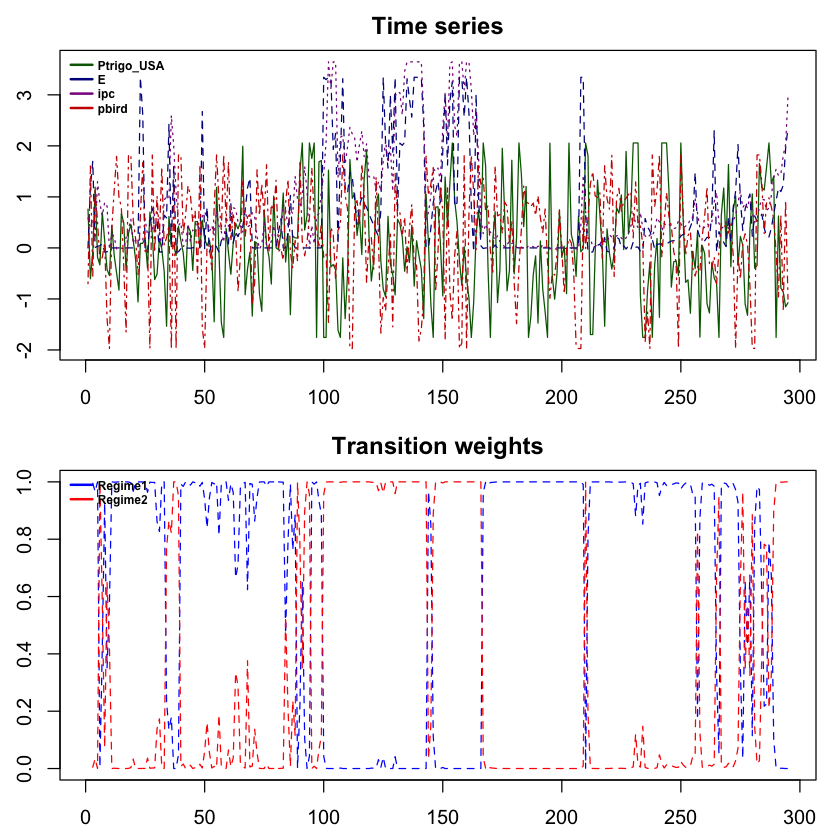

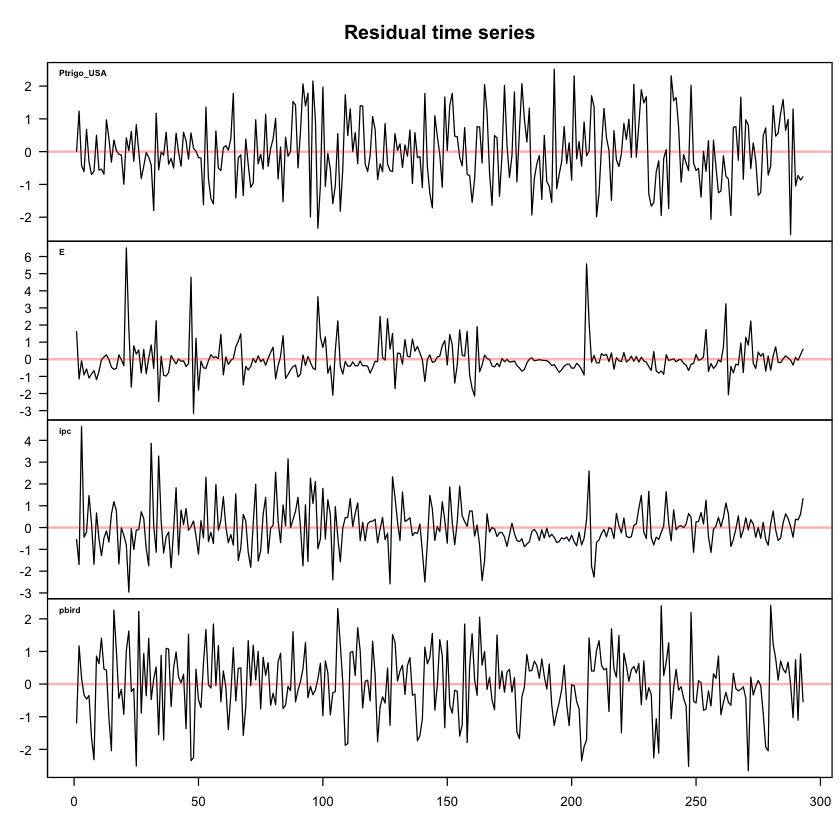

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



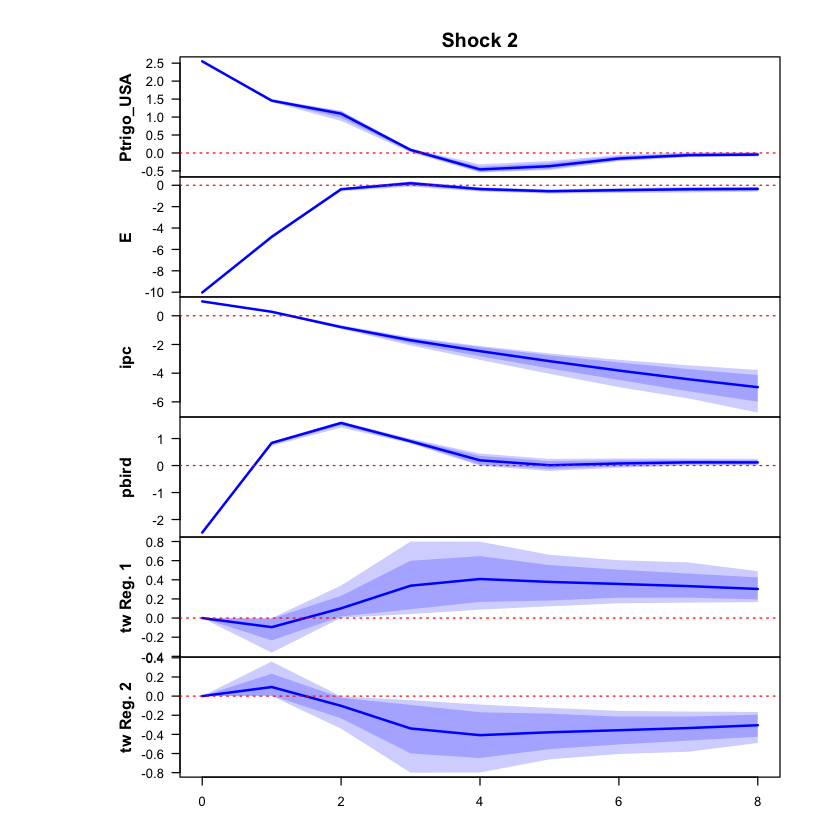

 >>> Linear IRF ( 1  shock units)


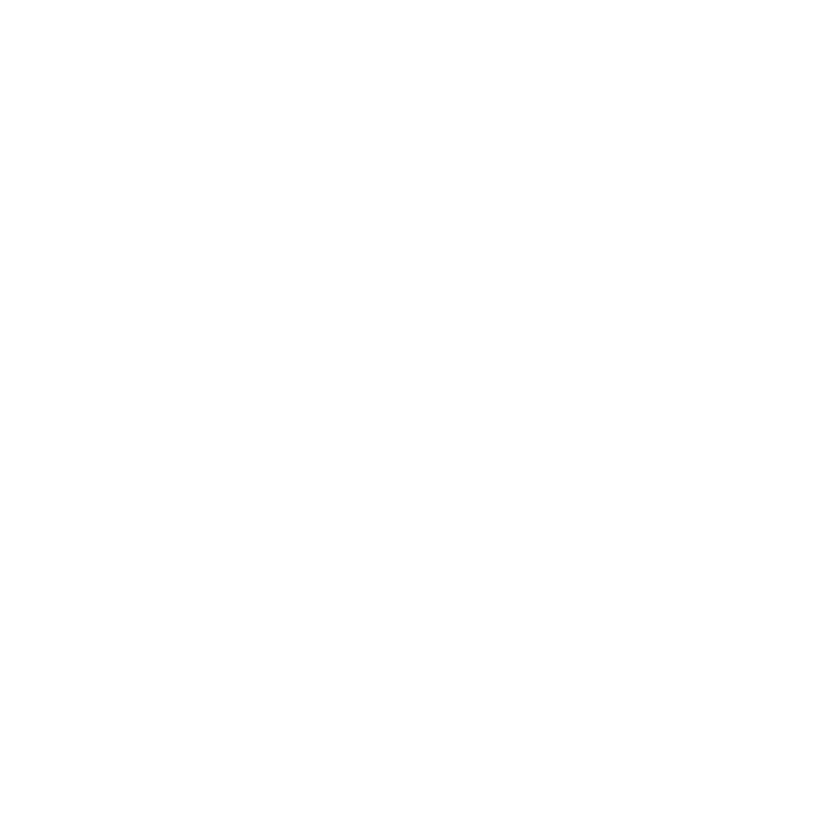

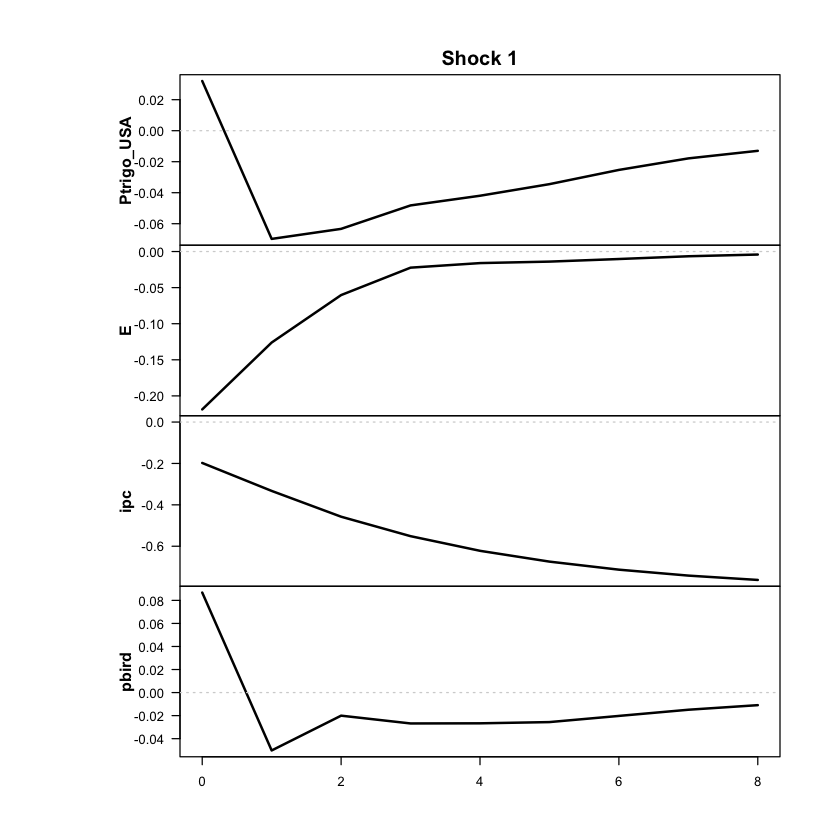

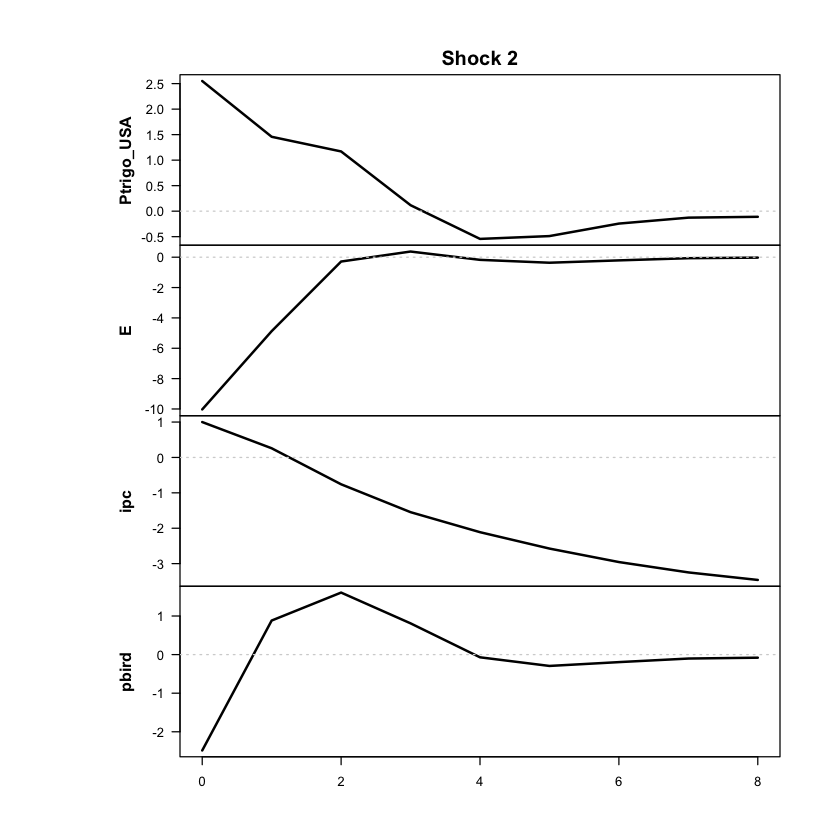

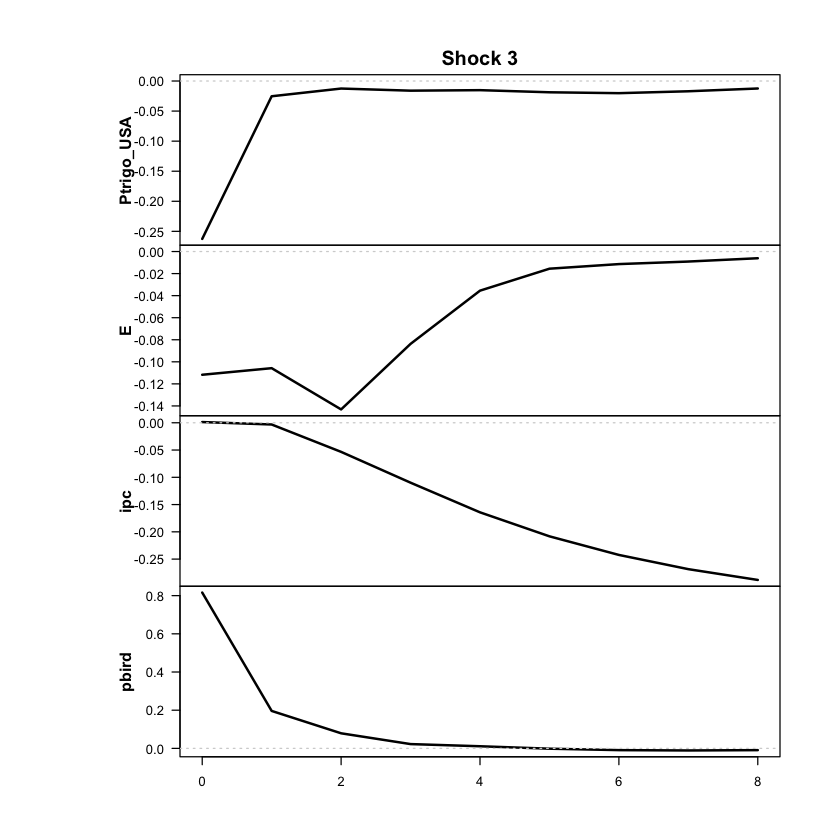

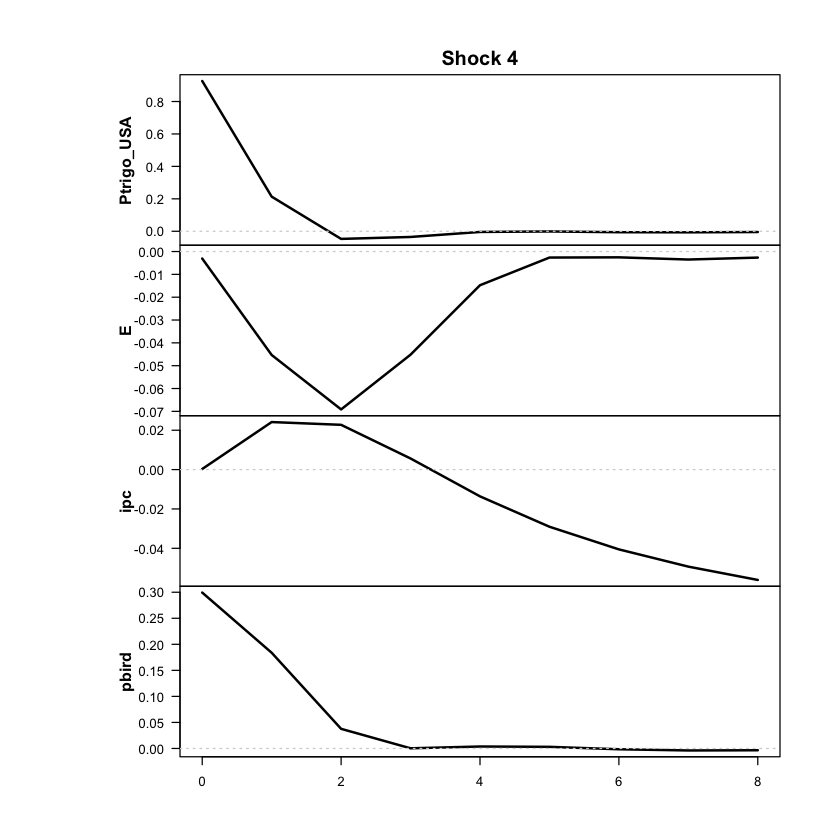

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



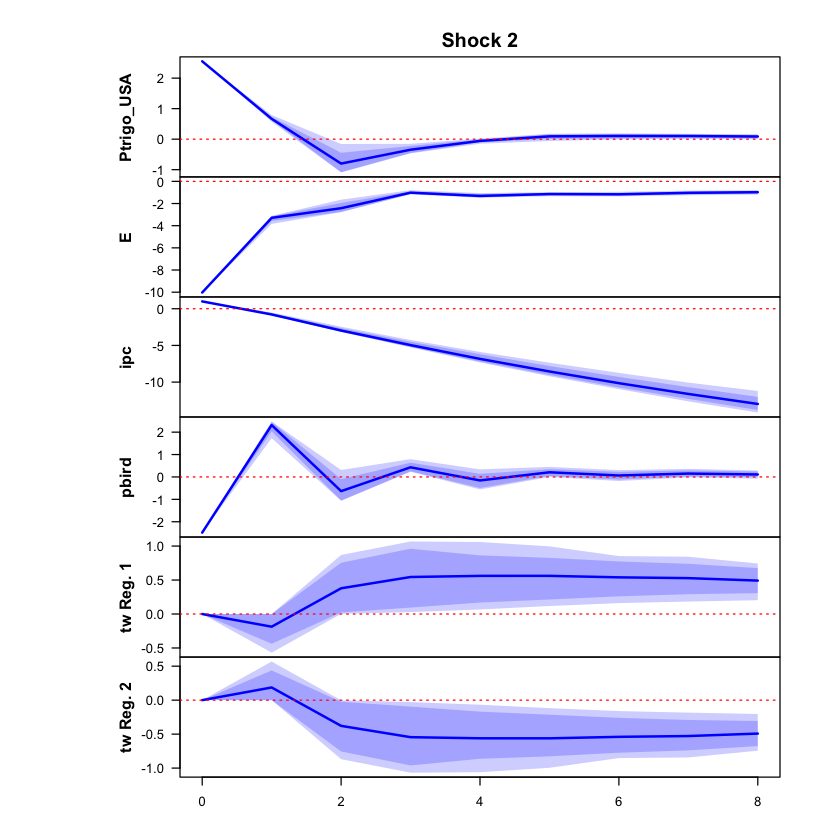

 >>> Linear IRF ( 1  shock units)


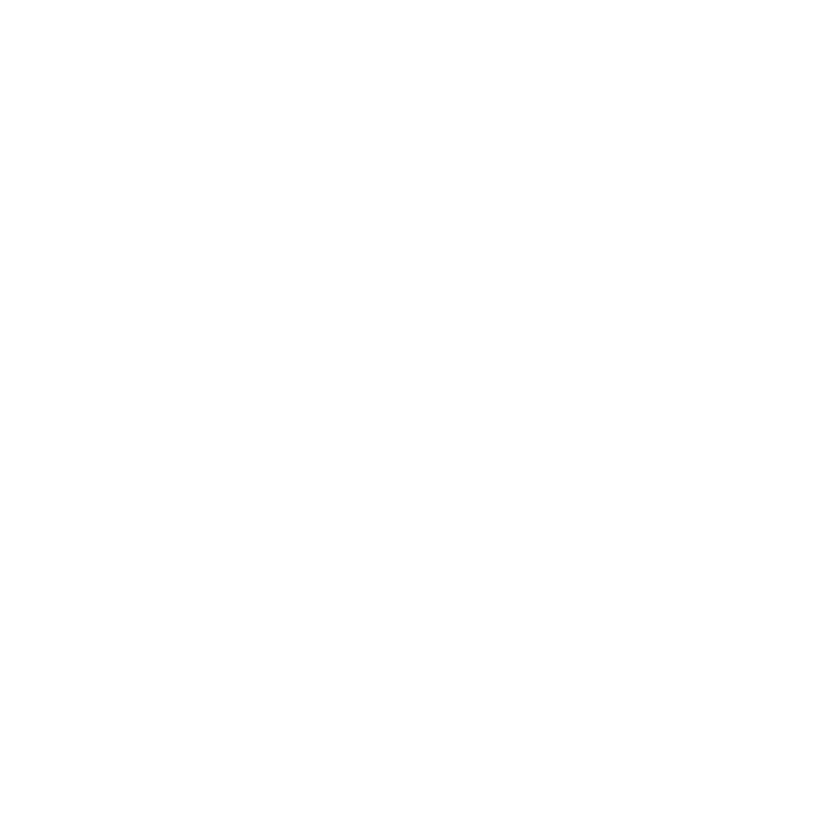

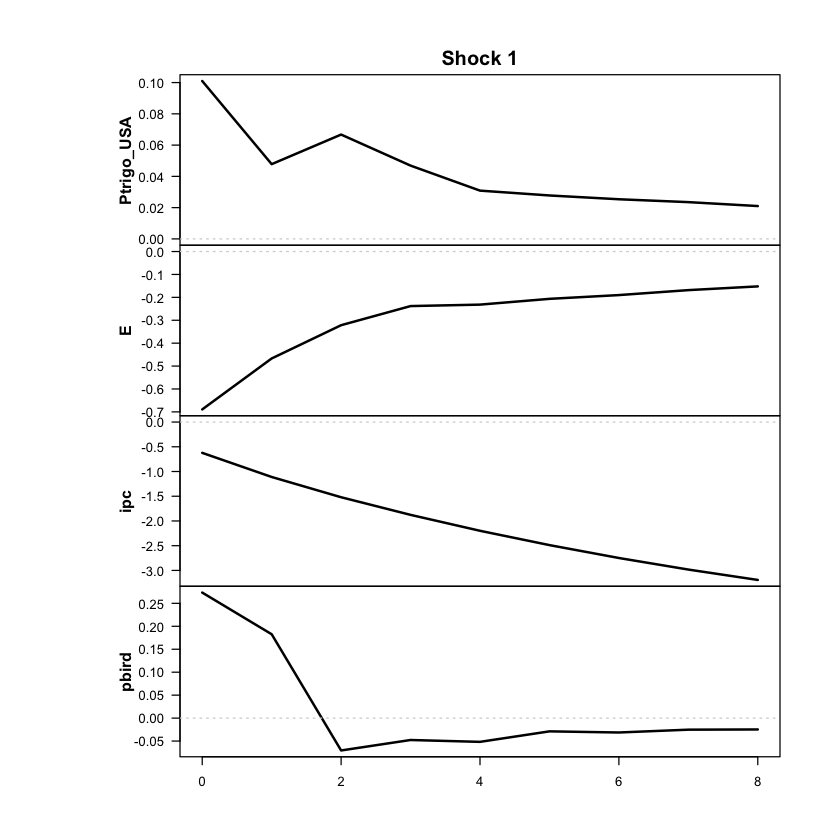

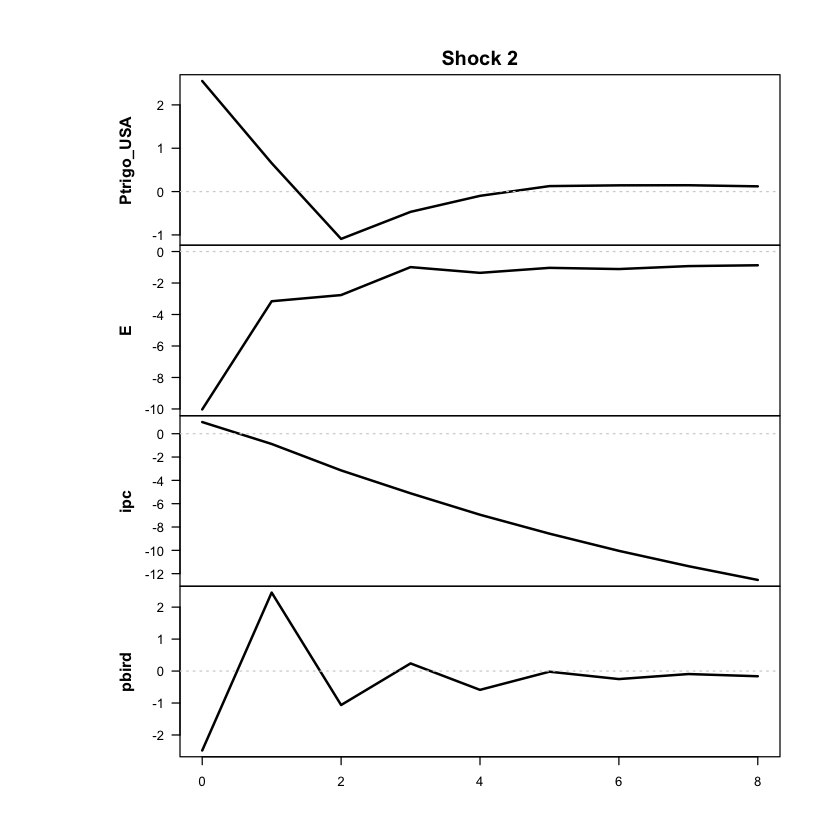

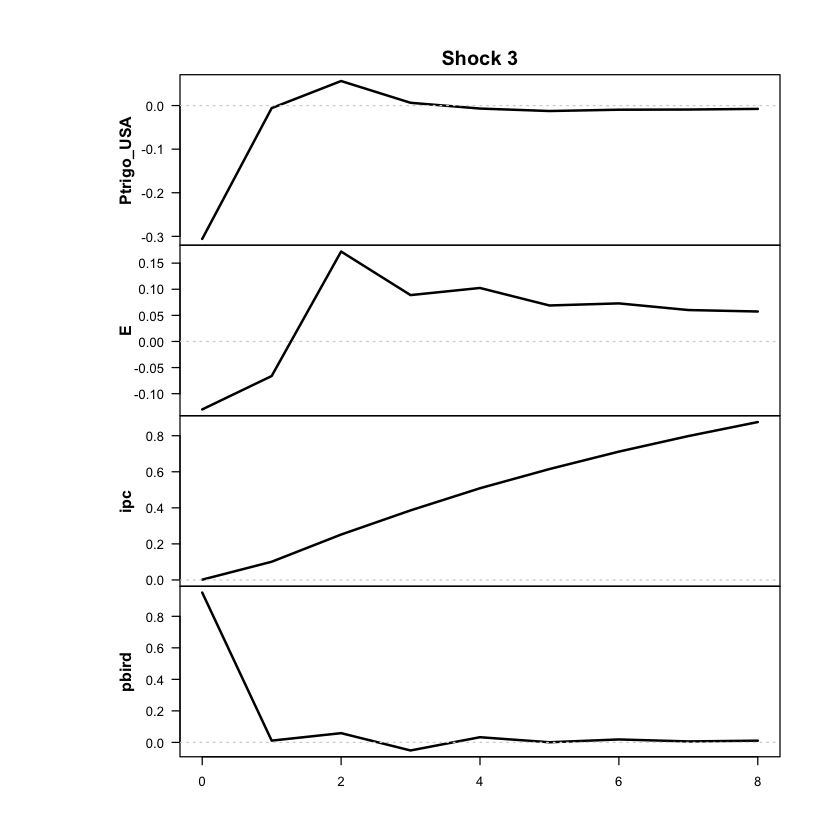

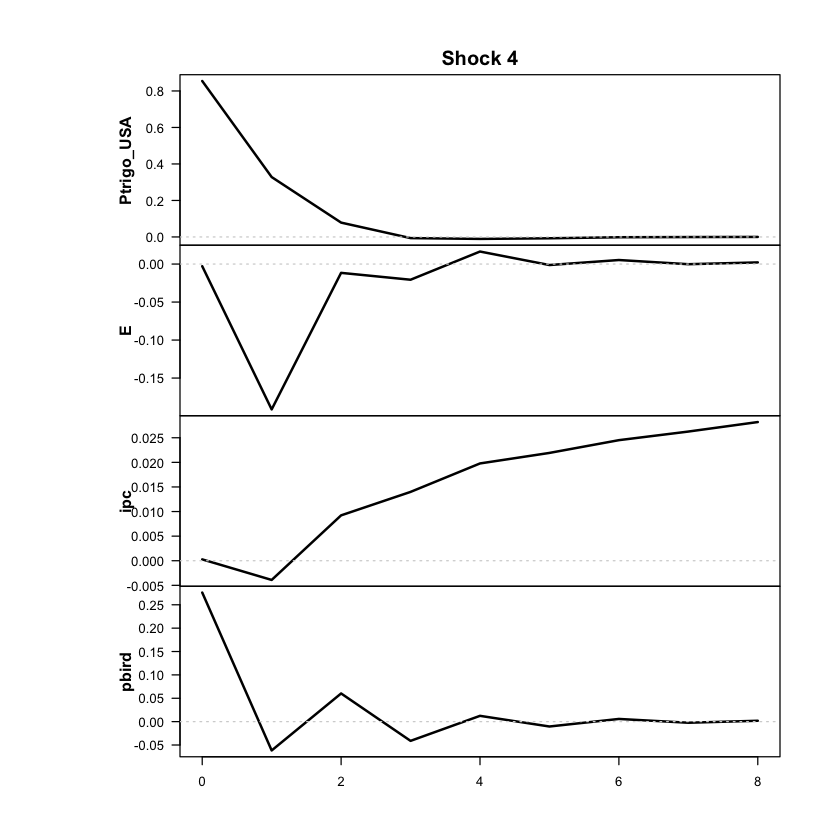

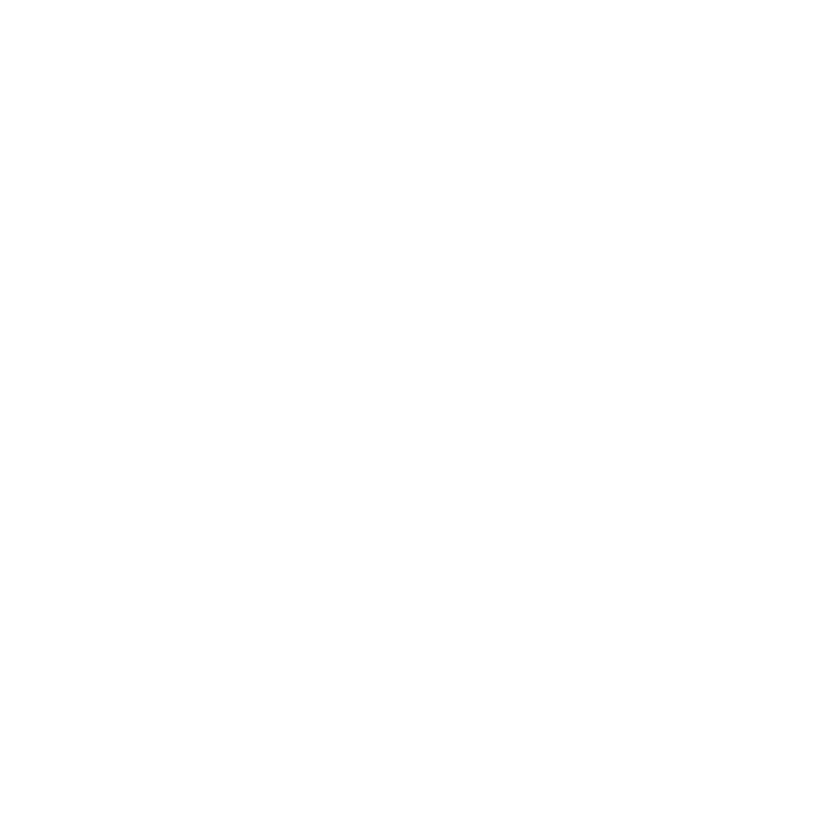

In [31]:
res <- run_vlstar (
  data = df_ERPT_Arg_capped,
  endog = c("Ptrigo_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual'
  feature_lag = 2,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Ptrigo_USA","ipc","pbird")
  run_tests = FALSE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [32]:
print_passthrough(res, endog = c("Ptrigo_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0997
1         1      -0.0276
2         2       0.0787
3         3       0.1702
4         4       0.2458
5         5       0.3151
6         6       0.3804
7         7       0.4408
8         8       0.4961

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.0997
2         1      -0.0258
3         2       0.0756
4         3       0.1541
5         4       0.2105
6         5       0.2567
7         6       0.2947
8         7       0.3238
9         8       0.3451

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.0997
1         1       0.0780
2         2       0.2960
3         3       0.4938
4         4       0.6812
5         5       0.8524
6         6       1.0114
7         7       1.1579
8         8       1.2939

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Ptrigo_USA: 
   2.5%   10%  mean   90% 97.5%
0 -1.46 -1.46 -1.46 -1.46 -1.46
1 -0.85 -0.85 -0.84 -0.83 -0.82
2 -0.26 -0.26 -0.25 -0.24 -0.24
3 -0.16 -0.15 -0.15 -0.15 -0.14
4 -0.13 -0.13 -0.12 -0.12 -0.11
5 -0.09 -0.09 -0.08 -0.08 -0.07
6 -0.08 -0.07 -0.07 -0.06 -0.06
7 -0.06 -0.06 -0.05 -0.05 -0.04
8 -0.05 -0.05 -0.04 -0.04 -0.03

The response of E: 
   2.5%   10%  mean   90% 97.5%
0 -4.64 -4.64 -4.64 -4.64 -4.64
1 -0.98 -0.98 -0.97 -0.95 -0.93
2 -1.18 -1.17 -1.16 -1.16 -1.16
3 -0.53 -0.53 -0.52 -0.51 -0.51
4 -0.47 -0.46 -0.46 -0.45 -0.44
5 -0.30 -0.30 -0.29 -0.27 -0.26
6 -0.26 -0.25 -0.24 -0.22 -0.21
7 -0.19 -0.19 -0.18 -0.16 -0.15
8 -0.17 -0.16 -0.15 -0.13 -0.11

The response of ipc: 
   2.5%   10%  mean   90% 97.5%
0  1.00  1.00  1.00  1.00  1.00
1  1.09  1.09  1.10  1.12  1.13
2  0.71  0.72  0.73  0.76  0.78
3  0.37  0.37  0.40  0.43  0.45
4 -0.

Desvíos usados para escalar:
Ptrigo_USA          E        ipc      pbird 
0.07672900 0.15282085 0.12152850 0.02347437 


Using 6 cores for 500 estimations rounds...

PHASE 1: Estimating all the parameters with a genetic algorithm...

Results from the genetic algorithm:

The lowest loglik:  -1267.07

The largest loglik: -1129.867

PHASE 2: Estimating all the parameters with a variable metric algorithm...

Results from the variable metric algorithm:

The lowest loglik:  -1249.831

The largest loglik: -1000.512

Filtering inappropriate estimates...

Filtered through 6 inappropriate  estimates with a larger log-likelihood

Calculating approximate standard errors...

Warning message in warn_eigens(ret, allow_unstab = allow_unstab):
“Regime 2 has near-unit-roots! Consider building a model from the next-largest local maximum with the function 'alt_stvar' by adjusting its argument 'which_largest' (or use the function 'filter_estimates').”
Finished!




========= Unstructured fitted model ==========


Calculating approximate standard errors...



========= Structured fitted model (heteroskedasticity) ==========
Saving trained models to models/ folder

 >>> DIAGNOSTIC PLOTS


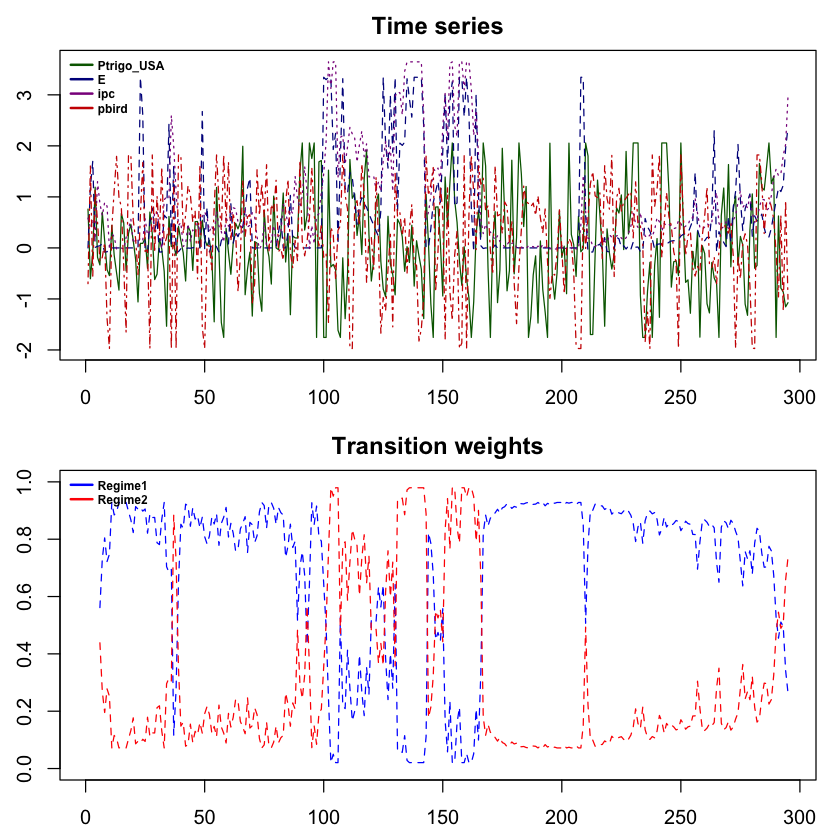

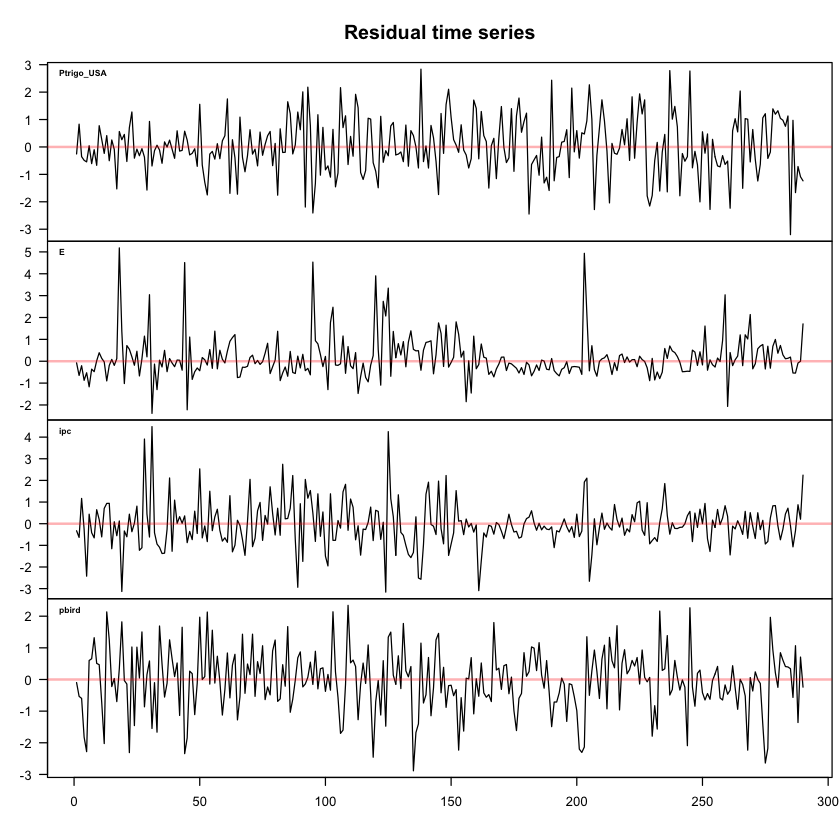

+++++++++ RÉGIMEN  1 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



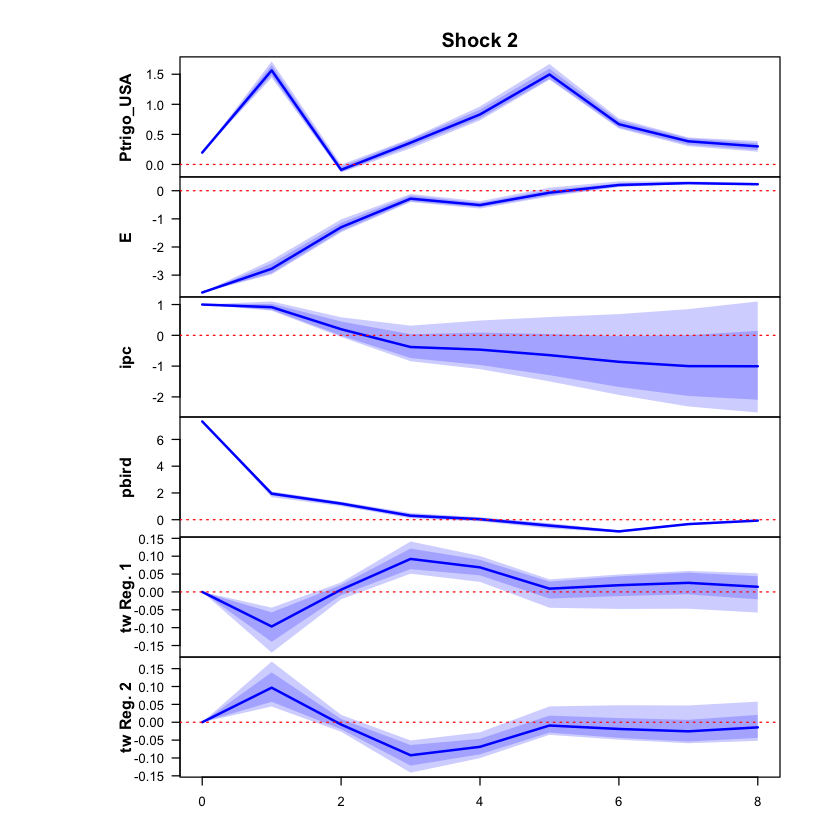

 >>> Linear IRF ( 1  shock units)


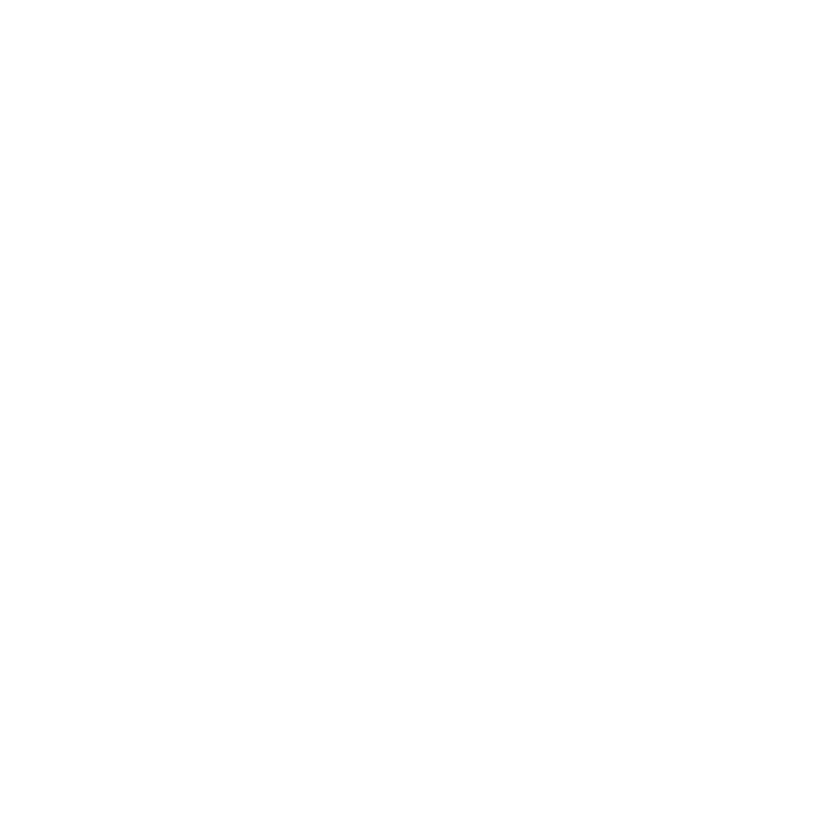

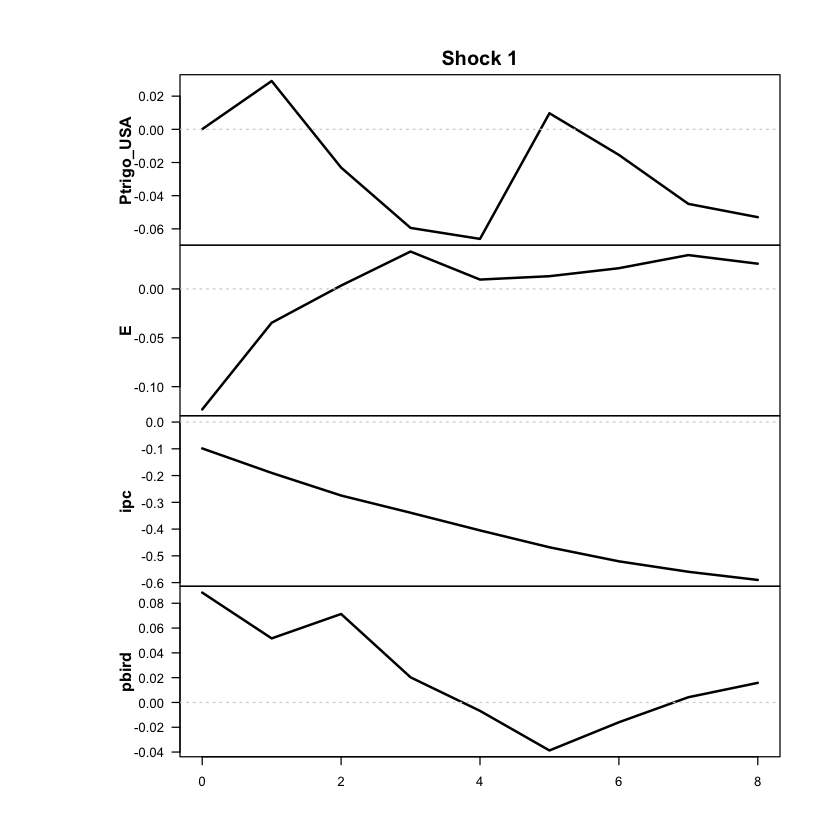

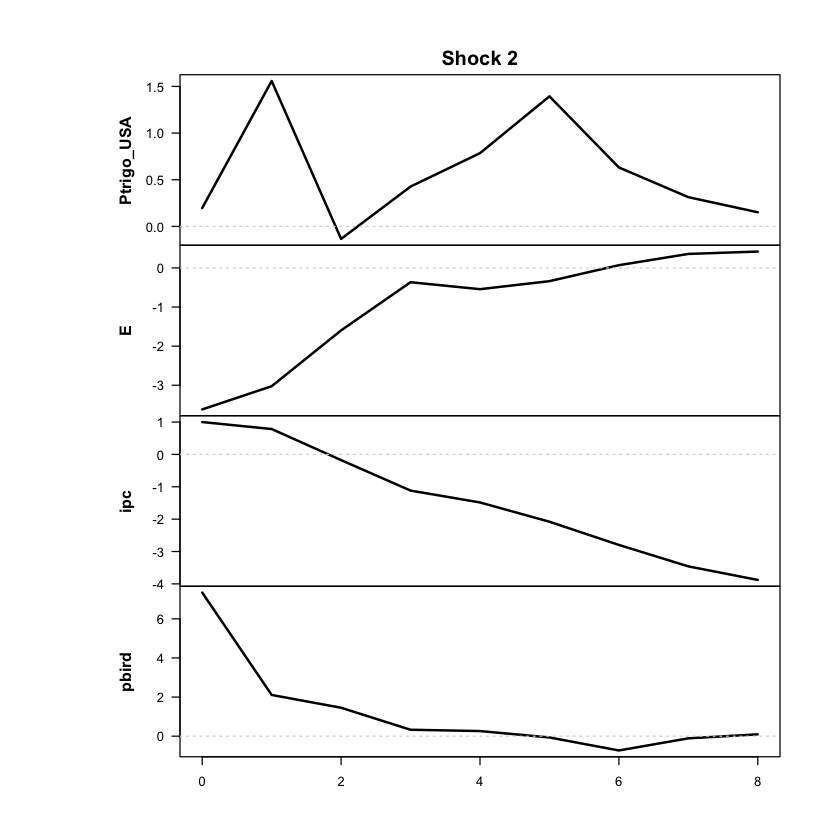

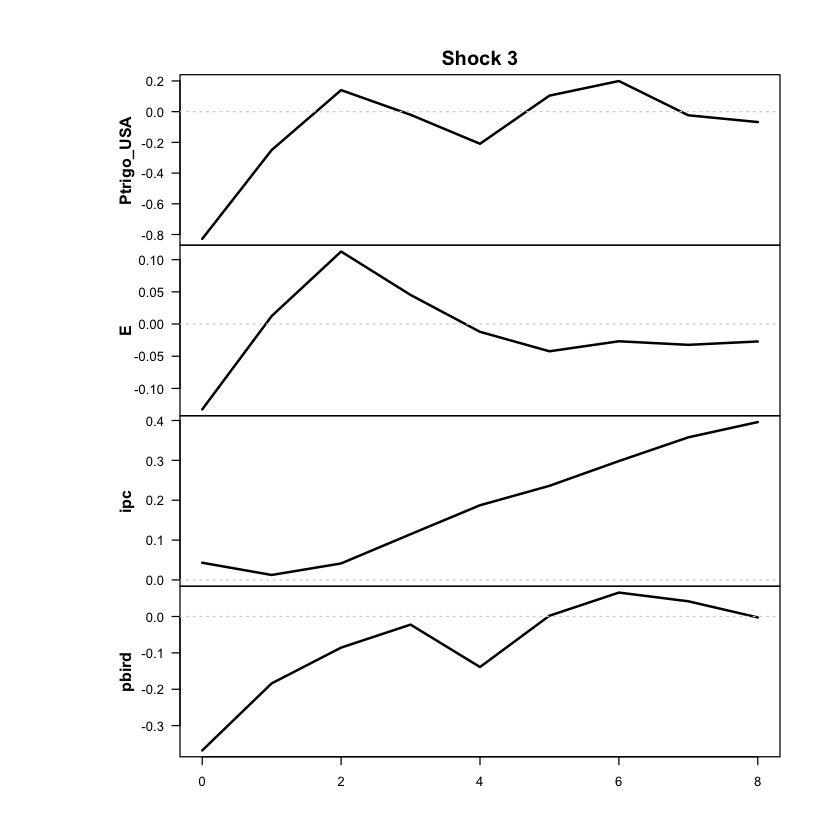

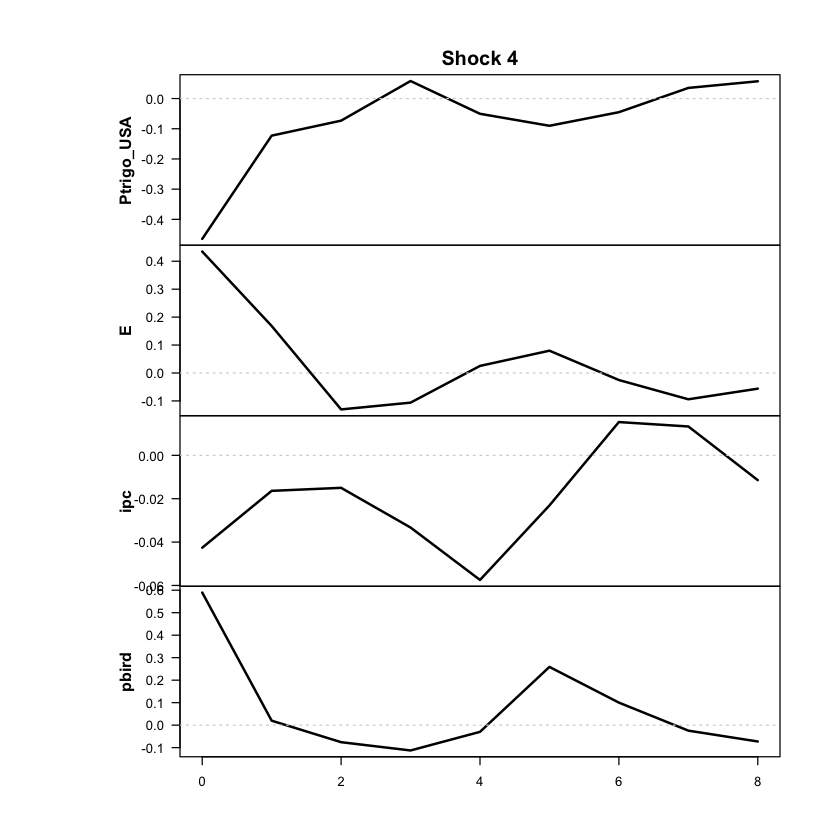

+++++++++ RÉGIMEN  2 +++++++++
 >>> GIRF ( 1  shock units)


Using 6 cores to estimate 250 GIRFs for 1 structural shocks, each based on 500 Monte Carlo repetitions.

Estimating GIRFs for structural shock 2...

Finished!



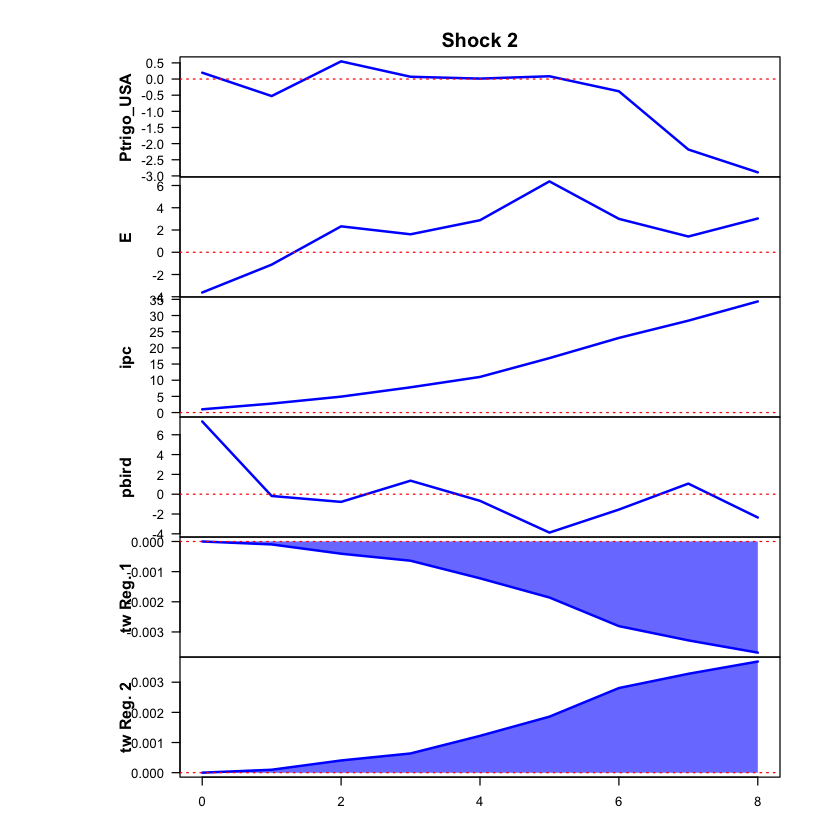

 >>> Linear IRF ( 1  shock units)


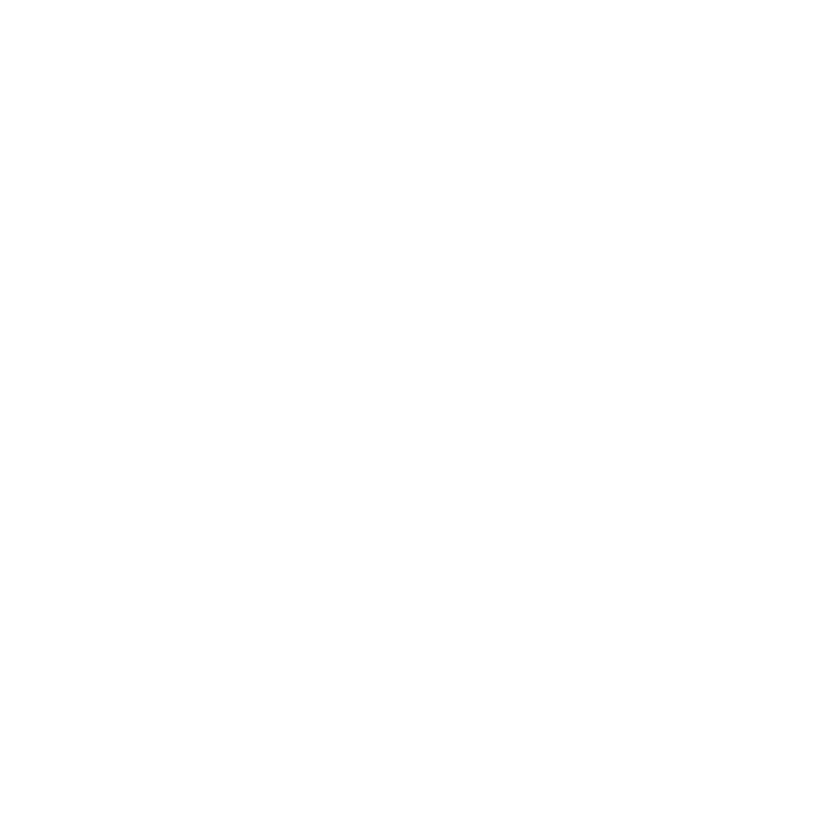

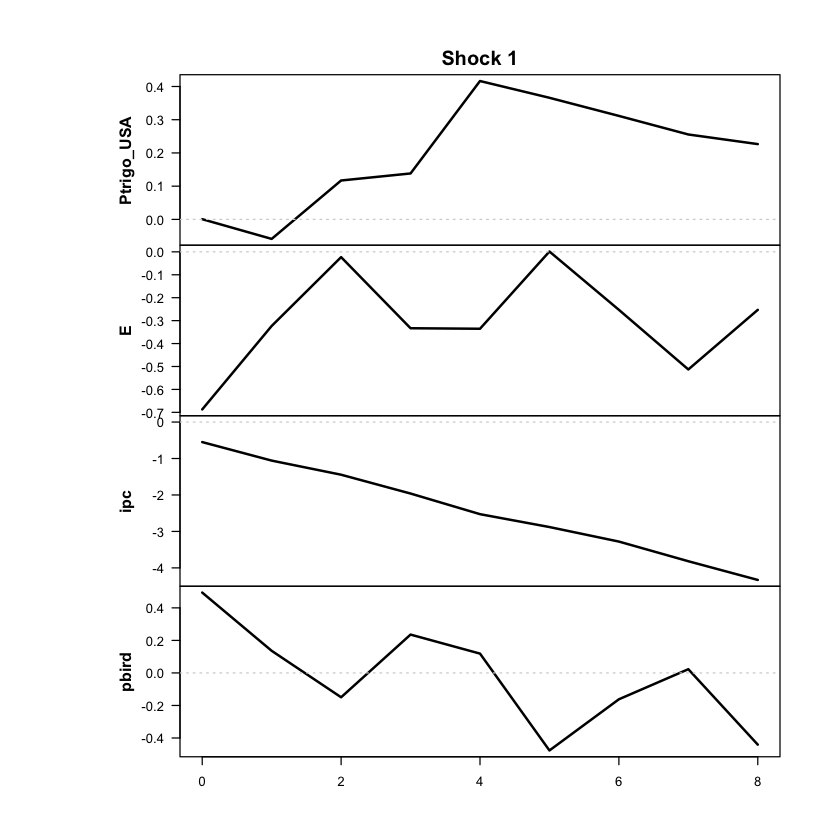

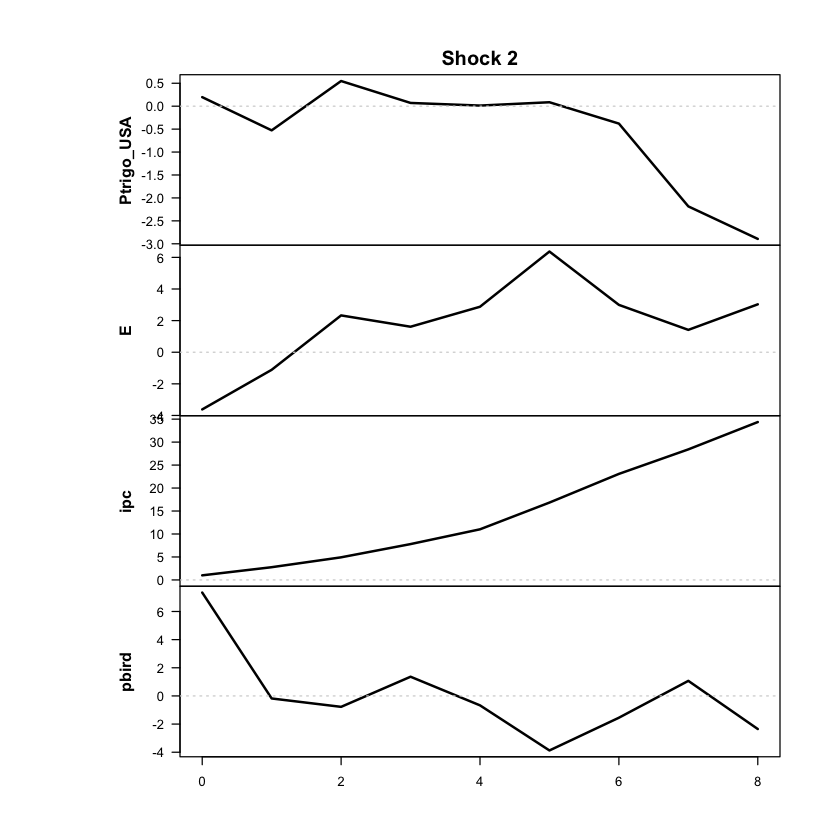

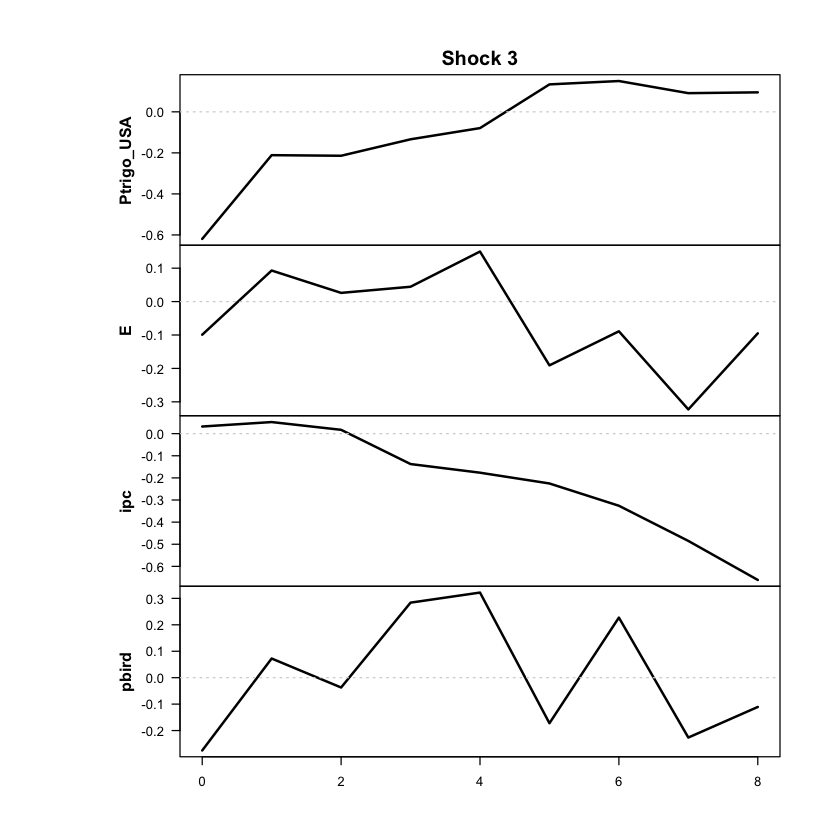

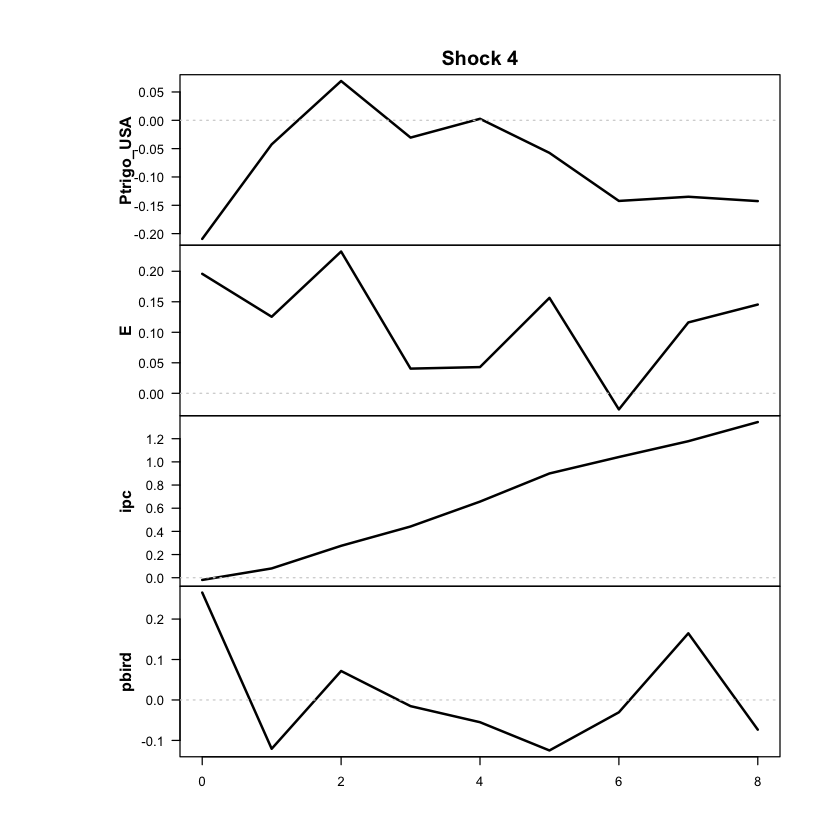

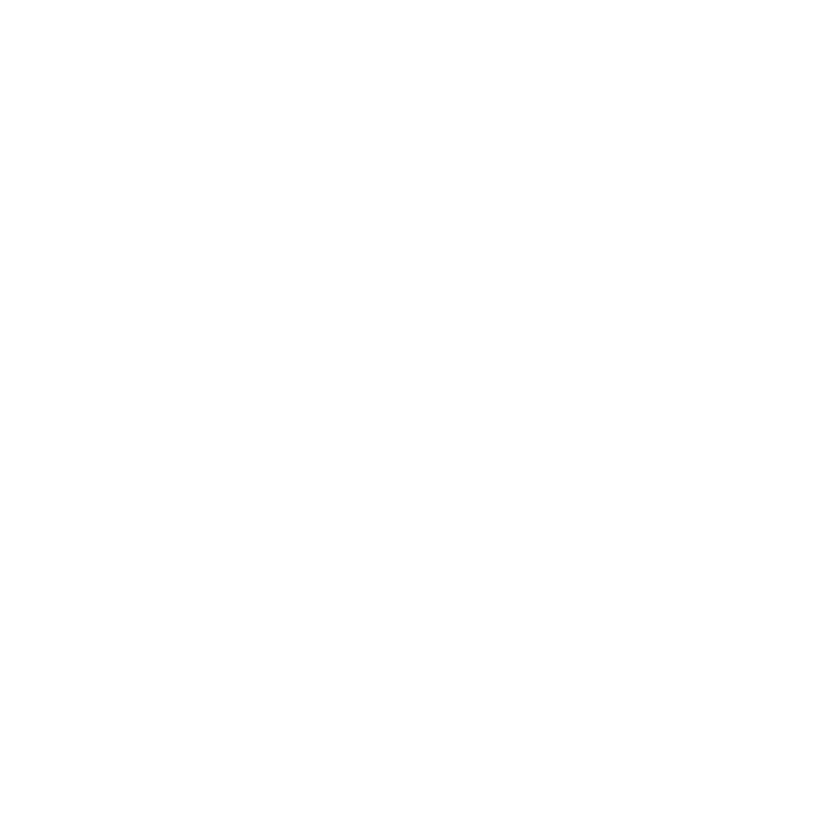

In [33]:
res <- run_vlstar (
  data = df_ERPT_Arg_capped,
  endog = c("Ptrigo_USA","E","ipc","pbird"),
  periodicity = 'trimestral', # 'trimestral' o 'anual'
  feature_lag = 5,
  n_regimes = 2,
  cumulative = TRUE,
  thr_var = 'ipc', # 'ipc'
  thr_lag = 1,
  shock_var = 'E', # 'E'
  response_vars = c('ipc'), # c("Ptrigo_USA","ipc","pbird")
  run_tests = FALSE, # ejecuta e imprime tests: portmonteau, descomposición histórica y GEFVD
  irf_horizons = NULL, # Max períodos hacia los que mirar adelante en IRF (NULL = 2 años, default = 2 años)
  irf_shocks = 1, # Shocks unitarios irf (default 1)
  diagnostic_plots = TRUE, # Imprimir plots de diagnostico? TRUE o FALSE (default FALSE)
  nrounds = 500, # Cantidad de iteraciones - para ver resultados poco confiables rápido poner bajito, si no dejar en 500 o incluso 1000 (default 500)
  load_presaved = FALSE
)
#Correr los siguientes en celdas aparte
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame
# OJO: A ESTA HAY QUE PASARLE LOS MISMOS PARÁMETROS QUE A RUN_VLSTAR!!
#run_tests_sstvar(res, response_vars = c('ipc'), cumulative = TRUE, irf_horizons = NULL, irf_shocks = 1, nrounds = 1)

In [34]:
print_passthrough(res, endog = c("Ptrigo_USA","E","ipc","pbird"))

+++++++++ RÉGIMEN  1 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.2764
1         1      -0.2530
2         2      -0.0548
3         3       0.1050
4         4       0.1286
5         5       0.1780
6         6       0.2378
7         7       0.2764
8         8       0.2777

>>> IRF lineal normalizada ( ipc / shock inicial de E )
  horizonte pass_through
1         0      -0.2764
2         1      -0.2169
3         2       0.0486
4         3       0.3087
5         4       0.4101
6         5       0.5747
7         6       0.7727
8         7       0.9559
9         8       1.0719

+++++++++ RÉGIMEN  2 +++++++++

>>> GIRF normalizada ( ipc / shock inicial de E )
  horizonte pass_through
0         0      -0.2764
1         1      -0.7667
2         2      -1.3612
3         3      -2.1571
4         4      -3.0451
5         5      -4.6531
6         6      -6.3781
7         7      -7.8528
8         8      -9.4958

>>> IRF lineal normalizada 

In [ ]:
#cat("RESULTADOS GIRF\n")
#print_girf(res) #Si querés ver los resultados de GIRF, descomentame
#cat("\nRESULTADOS IRF\n")
#print_irf(res) #Si querés ver los resultados de IRF lineal, descomentame

RESULTADOS GIRF
+++++++++ RÉGIMEN  1 +++++++++
The responses of the variables ipc were cumulated. 

The GIRF of shock 2: 
The response of Ptrigo_USA: 
   2.5%   10%  mean   90% 97.5%
0  1.17  1.17  1.17  1.17  1.17
1  0.01  0.01  0.02  0.02  0.02
2 -0.15 -0.15 -0.15 -0.15 -0.14
3 -0.15 -0.15 -0.15 -0.15 -0.15
4  0.04  0.04  0.04  0.04  0.04
5  0.22  0.22  0.22  0.22  0.22
6  0.10  0.10  0.10  0.10  0.11
7  0.01  0.01  0.01  0.01  0.01
8 -0.01 -0.01 -0.01 -0.01 -0.01

The response of E: 
   2.5%   10%  mean   90% 97.5%
0 -2.23 -2.23 -2.23 -2.23 -2.23
1 -0.73 -0.73 -0.71 -0.68 -0.67
2 -0.30 -0.30 -0.30 -0.29 -0.28
3 -0.27 -0.27 -0.26 -0.26 -0.25
4 -0.22 -0.22 -0.21 -0.21 -0.21
5  0.05  0.05  0.05  0.06  0.06
6 -0.05 -0.05 -0.05 -0.04 -0.04
7 -0.09 -0.09 -0.09 -0.08 -0.08
8 -0.07 -0.07 -0.07 -0.06 -0.06

The response of ipc: 
   2.5%   10%  mean  90% 97.5%
0  1.00  1.00  1.00 1.00  1.00
1  0.69  0.69  0.70 0.71  0.71
2  0.44  0.44  0.46 0.47  0.49
3  0.18  0.18  0.20 0.22  0.24
4  0.26  0